# Augmented Reality Virtual Try-on Survey Data Analysis

##  Research Questions

## Hypotheses

In [235]:
import pandas as pd
import numpy as np
from numpy import arange
import scipy.stats as stats
from scipy.stats import spearmanr

from sklearn.preprocessing import StandardScaler

from sklearn.metrics import mean_squared_error, r2_score
# Load libraries
import numpy
from numpy import arange
from matplotlib import pyplot
from pandas import read_csv
from pandas import set_option
from pandas.plotting import scatter_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.svm import SVR

from sklearn.metrics import mean_squared_error
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_squared_error, r2_score
import statsmodels.api as sm
import semopy
from semopy import Model, Optimizer, calc_stats
#from pdpbox import pdp, get_dataset, info_plots
from sklearn.metrics import mutual_info_score
from sklearn import metrics
import eli5
from eli5.sklearn import PermutationImportance

# Machine Learning
from sklearn.model_selection import train_test_split, cross_val_score, cross_validate, KFold, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, mutual_info_score
from sklearn.datasets import make_regression
from sklearn.pipeline import Pipeline
 
# Models
from sklearn.linear_model import LinearRegression, Lasso, ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, ExtraTreesRegressor, AdaBoostRegressor
from sklearn.cluster import KMeans

# Feature Selection and Dimensionality Reduction
from sklearn.decomposition import PCA
from eli5.sklearn import PermutationImportance

# Statistical Analysis
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from scipy.stats import chi2_contingency
from factor_analyzer import FactorAnalyzer
import semopy
from semopy import Model, Optimizer, calc_stats

#Visualization
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import pyplot
from pandas.plotting import scatter_matrix

#Model Interpretation
import eli5

# Language Translation
from googletrans import Translator
translator = Translator()
from translate import Translator

translator = Translator(to_lang="en", from_lang="vi")
translation_1 = translator.translate("nữ")
translation_0 = translator.translate("nam")

print(f"Translation of 'nữ': {translation_1}")
print(f"Translation of 'nam': {translation_0}")

# Miscellaneous
# Set display options to show all columns
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)

Translation of 'nữ': female
Translation of 'nam': male


## Data Understanding

### Data Acquisition

In [2]:
#read csv file

df_survey = pd.read_csv(r'C:\Users\cemcd\OneDrive\Documents\NCU\Dissertation\DisserationDataFilesInfo\3. AR_fashion_Originaldata_23.11Vietnamese.csv')

In [3]:
#display column headers and the first row

df_survey.head(2)

,Timestamp,"Các bạn vui lòng chọn mức độ đồng ý của mình với mỗi câu nhận định sau đây (1 - rất không đồng ý, 5 - rất đồng ý): [Tôi biết rõ về AR]",I. Độ quen thuộc với công nghệ và ứng dụng AR [1. Tôi quen thuộc với những công nghệ này],I. Độ quen thuộc với công nghệ và ứng dụng AR [2. Tôi đang sử dụng những công nghệ này trong cuộc sống hàng ngày],II. Sử dụng trong các lĩnh vực của cuộc sống (có thể chọn nhiều đáp án),III. Mức độ quen thuộc với các ứng dụng AR và phương pháp mua sắm khi sử dụng AR (các ứng dụng của AR được sử dụng trong mua sắm) [1. Môi trường mua sắm ảo],III. Mức độ quen thuộc với các ứng dụng AR và phương pháp mua sắm khi sử dụng AR (các ứng dụng của AR được sử dụng trong mua sắm) [2. Chuyến tham quan ảo],"III. Mức độ quen thuộc với các ứng dụng AR và phương pháp mua sắm khi sử dụng AR (các ứng dụng của AR được sử dụng trong mua sắm) [3. Hình dung, mô hình]",III. Mức độ quen thuộc với các ứng dụng AR và phương pháp mua sắm khi sử dụng AR (các ứng dụng của AR được sử dụng trong mua sắm) [4. Giả lập],I. Sự thích thú [1. Tôi nhận thấy mua hàng thời trang thông qua các ứng dụng thực tế ảo tăng cường thú vị.],I. Sự thích thú [2. Tôi nhận thấy quá trình mua hàng thông qua các ứng dụng thực tế ảo tăng cường khiến tôi hài lòng],I. Sự thích thú [3. Tôi cảm thấy vui vẻ khi sử dụng các ứng dụng thực tế ảo tăng cường trong quá trình mua hàng.],I. Sự thích thú [4. Tôi nhận thấy mua hàng thời trang thông qua các ứng dụng thực tế ảo tăng cường hấp dẫn.],II. Bản sắc xã hội [1. Sử dụng thực tế ảo tăng cường trong mua sắm thời trang khiến tôi cảm thấy bản thân được cảm nhận.],II. Bản sắc xã hội [2. Sử dụng thực tế ảo tăng cường trong mua sắm thời trang giúp cải thiện cách tôi nhận được khi mua hàng.],II. Bản sắc xã hội [3. Sử dụng thực tế ảo tăng cường trong mua sắm thời trang tạo ấn tượng tốt với người khác.],II. Bản sắc xã hội [4. Vai trò của tôi trong xã hội đòi hỏi phải sử dụng thực tế ảo tăng cường trong mua sắm thời trang.],III. Bản sắc cá nhân [1. Sử dụng thực tế ảo tăng cường trong mua sắm thời trang giúp tôi đạt được hình mẫu mà tôi hướng đến.],III. Bản sắc cá nhân [2. Sử dụng thực tế ảo tăng cường trong mua sắm thời trang giúp chúng ta giảm khoảng cách giữa giữa con người hiện tại của tôi và hình mẫu mà tôi mong muốn trở thành],III. Bản sắc cá nhân [3. Sử dụng thực tế ảo tăng cường trong mua sắm thời trang là một phần hình mẫu của tôi.],IV. Dễ sử dụng [1. Tôi nghĩ rằng việc sử dụng ứng dụng thực tế ảo tăng cường rất dễ dàng],IV. Dễ sử dụng [2. Tôi nghĩ rất đơn giản để học cách sử dụng ứng dụng thực tế ảo tăng cường.],IV. Dễ sử dụng [3. Tôi nghĩ rằng nó không đòi hỏi nhiều nỗ lực để sử dụng một ứng dụng thực tế ảo tăng cường.],IV. Dễ sử dụng [4. Tôi nghĩ rằng ứng dụng thực tế ảo tăng cường là rất rõ ràng và dễ hiểu.],V. Lợi ích [1. Tôi có thể cải thiện quy trình mua hàng thời trang với một ứng dụng thực tế ảo tăng cường.],V. Lợi ích [2. Quá trình mua hàng thời trang của tôi sẽ hiệu quả hơn khi áp dụng ứng dụng thực tế ảo tăng cường],V. Lợi ích [3. Thực tế ảo tăng cường sẽ hữu ích khi mua hàng thời trang],V. Lợi ích [4. Thực tế ảo tăng cường sẽ cải thiện khả năng của tôi khi mua hàng trực tuyến.],VI. Thái độ [1. Tôi thích ý tưởng mua hàng thời trang với thực tế ảo tăng cường.],VI. Thái độ [2. Tôi nghĩ rằng đó là một ý kiến hay khi mua hàng thời trang với thực tế ảo tăng cường.],VI. Thái độ [3. Tôi có một cái nhìn thích thú với việc mua hàng thời trang với thực tế ảo tăng cường],VII. Giá trị [1. Ứng dụng thực tế ảo tăng cường có thể mang lại lợi ích cho tôi nhiều hơn so với mức cần.],VII. Giá trị [2. Các ứng dụng thực tế ảo tăng cường phải xứng đáng đối với tôi so với sự yêu cầu được nhận lại.],"VII. Giá trị [3. Nhìn chung, các ứng dụng thực tế ảo tăng cường đều mang giá trị tốt.]",VIII. Sự vui vẻ [1. Sử dụng các ứng dụng thực tế ảo tăng cường trong mua sắm thời trang rất vui.],VIII. Sự vui vẻ [2. Sử dụng các ứng dụng thực tế ảo tăng cường trong mua sắm thời trang rất hứng thú .],VIII. Sự vui vẻ [3. Sử dụng các ứng d

In [4]:
#Get Size of dataset
df_survey.shape



(523, 44)

In [5]:
### # Translate column names

In [6]:

# Create a list of new column names
new_cols = ['Timestamp', 'AR_Knowledgeable', 'familiar_with_technology', 'use_AR_everyday','use_in_all_aspects','Virtual_shopping_environment','Virtual_tour','Visualize_model','Emulation','PE1','PE2','PE3','PE4','SOI1','SOI2','SOI3','SOI4','SEI1','SEI2','SEI3','PEOU1','PEOU2','PEOU3','PU1','PU2','PU3','PU4','B1','AT1','AT2','AT3','PPV1','PPV2','PPV3','HM1','HM2','HM3','BI1','BI2','BI3','BI4','Gender','AGE','Location'] 

# Rename columns using the list
df_survey.columns = new_cols

In [7]:
# Save file to disk
df_survey.to_csv(r'C:\Users\cemcd\OneDrive\Documents\NCU\Dissertation\DisserationDataFilesInfo\Archived_Survey_data.csv')

In [8]:
#Get data type and number of null values for each feature
df_survey.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 523 entries, 0 to 522
Data columns (total 44 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Timestamp                     424 non-null    object 
 1   AR_Knowledgeable              424 non-null    float64
 2   familiar_with_technology      424 non-null    float64
 3   use_AR_everyday               424 non-null    float64
 4   use_in_all_aspects            424 non-null    object 
 5   Virtual_shopping_environment  424 non-null    float64
 6   Virtual_tour                  424 non-null    float64
 7   Visualize_model               424 non-null    float64
 8   Emulation                     424 non-null    float64
 9   PE1                           424 non-null    float64
 10  PE2                           424 non-null    float64
 11  PE3                           424 non-null    float64
 12  PE4                           424 non-null    float64
 13  SOI1 

In [9]:
df_survey.shape

(523, 44)

In [10]:
# check for missing values
df_survey.isna().sum().sum()

4356

In [11]:
#remove rows woth all null values
df_survey_cleaned = df_survey.dropna(how='all')

In [12]:
#check for rows with all null values after removing them

df_survey_cleaned.isna().sum().sum()


0

In [13]:
#check each column for null values

df_survey_cleaned.isna().sum()


Timestamp                       0
AR_Knowledgeable                0
familiar_with_technology        0
use_AR_everyday                 0
use_in_all_aspects              0
Virtual_shopping_environment    0
Virtual_tour                    0
Visualize_model                 0
Emulation                       0
PE1                             0
PE2                             0
PE3                             0
PE4                             0
SOI1                            0
SOI2                            0
SOI3                            0
SOI4                            0
SEI1                            0
SEI2                            0
SEI3                            0
PEOU1                           0
PEOU2                           0
PEOU3                           0
PU1                             0
PU2                             0
PU3                             0
PU4                             0
B1                              0
AT1                             0
AT2           

In [14]:
# check for number of rows and left after removing null rows

df_survey_cleaned.shape

(424, 44)

In [15]:
# get all numeric columns
df_numerics_only = df_survey_cleaned.select_dtypes(include='number').columns
 
print(df_numerics_only)

Index(['AR_Knowledgeable', 'familiar_with_technology', 'use_AR_everyday',
       'Virtual_shopping_environment', 'Virtual_tour', 'Visualize_model',
       'Emulation', 'PE1', 'PE2', 'PE3', 'PE4', 'SOI1', 'SOI2', 'SOI3', 'SOI4',
       'SEI1', 'SEI2', 'SEI3', 'PEOU1', 'PEOU2', 'PEOU3', 'PU1', 'PU2', 'PU3',
       'PU4', 'B1', 'AT1', 'AT2', 'AT3', 'PPV1', 'PPV2', 'PPV3', 'HM1', 'HM2',
       'HM3', 'BI1', 'BI2', 'BI3', 'BI4'],
      dtype='object')


In [16]:
## validate survey response contain 1 thru 5
def check_columns(df):
    columns_to_check = df_numerics_only
    column_number = 0
    for column in columns_to_check:
        column_number = column_number + 1
        #print (f"Column contains valid 1 thru 5: {column_number}")
        if not df[column].isin(range(1, 6)).all():
            print (df[column])
            print(f"Column does not contain valid 1 thru 5: {column}")
            return False
    return True

# Call the function with df_survey
result = check_columns(df_survey_cleaned)
print(f"All specified columns contain only values 1 through 5: {result}")

All specified columns contain only values 1 through 5: True


In [17]:
# check the values in the gender column
df_survey_cleaned['Gender'].value_counts()

Gender
nữ     295
nam    129
Name: count, dtype: int64

In [18]:
# check the values in the AGE column
df_survey_cleaned['AGE'].value_counts()

AGE
Trên 40 tuổi      180
20 đến 29 tuổi    138
30 đến 39 tuổi     97
Dưới 19 tuổi        8
23 đến 30 tuổi      1
Name: count, dtype: int64

In [19]:
from googletrans import Translator
translator = Translator()
translation_1 = translator.translate('nữ', src='vi', dest='en')
translation_0 = translator.translate('nam', src='vi', dest='en')


In [20]:
print(translation_0.text)
print(translation_1.text)

male
female


In [21]:
# Translate Vietnames gender values to English Male and female values

df_survey_cleaned.loc[:, 'Gender_eng'] = df_survey_cleaned['Gender'].replace({'nam': 'male', 'nữ': 'female'}).values

C:\Users\cemcd\AppData\Local\Temp\ipykernel_8864\702946529.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_survey_cleaned.loc[:, 'Gender_eng'] = df_survey_cleaned['Gender'].replace({'nam': 'male', 'nữ': 'female'}).values


In [22]:
# display new feature to check translations

df_survey_cleaned['Gender_eng']

0        male
1      female
2        male
3        male
4        male
        ...  
419    female
420    female
421    female
422    female
522      male
Name: Gender_eng, Length: 424, dtype: object

In [23]:
# creature new feature for document (can be removedO

df_survey_cleaned.loc[:, 'Gender_vietnamese'] = df_survey_cleaned['Gender'].values

C:\Users\cemcd\AppData\Local\Temp\ipykernel_8864\124834956.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_survey_cleaned.loc[:, 'Gender_vietnamese'] = df_survey_cleaned['Gender'].values


In [24]:
df_survey_cleaned[['Gender_vietnamese','Gender_eng']].head()

,Gender_vietnamese,Gender_eng
0,nam,male
1,nữ,female
2,nam,male
3,nam,male
4,nam,male


In [25]:
# check the values in the gender column
df_survey_cleaned['Gender'].value_counts()

Gender
nữ     295
nam    129
Name: count, dtype: int64

In [26]:
# encode gender values to 0 and 1. 0 - male , 1 - female
df_survey_cleaned.loc[:, 'Gender_num'] = df_survey_cleaned['Gender_eng'].replace({'male': 0, 'female': 1})

C:\Users\cemcd\AppData\Local\Temp\ipykernel_8864\3959655781.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_survey_cleaned.loc[:, 'Gender_num'] = df_survey_cleaned['Gender_eng'].replace({'male': 0, 'female': 1})


In [27]:
df_survey_cleaned['Gender_num'].value_counts()

Gender_num
1    295
0    129
Name: count, dtype: int64

In [28]:
## Translate Age

In [29]:
df_survey['AGE'].unique()

array(['Trên 40 tuổi', '20 đến 29 tuổi', '30 đến 39 tuổi', 'Dưới 19 tuổi',
       nan, '23 đến 30 tuổi'], dtype=object)

In [30]:
# create df containing only unique age cohort values
age_cohorts=[]
age_cohorts = df_survey[['AGE']].drop_duplicates()
age_cohorts



,AGE
0,Trên 40 tuổi
1,20 đến 29 tuổi
7,30 đến 39 tuổi
34,Dưới 19 tuổi
423,NaN
522,23 đến 30 tuổi


In [31]:
import googletrans
from googletrans import Translator

translator = Translator()

def translate_text(text, target_language):
    try:
        translation = translator.translate(text, dest=target_language)
        return translation.text
    except Exception as e:
        print(f"Error translating '{text}': {e}")
        return text

In [32]:
# Translate 'Age Column Values
age_cohorts['AGE_eng'] = age_cohorts['AGE'].apply(lambda x: translate_text(x, 'en') if pd.notnull(x) else x)

In [33]:
age_cohorts

,AGE,AGE_eng
0,Trên 40 tuổi,Over 40 years old
1,20 đến 29 tuổi,20 to 29 years old
7,30 đến 39 tuổi,30 to 39 years old
34,Dưới 19 tuổi,Under 19 years old
423,NaN,NaN
522,23 đến 30 tuổi,23 to 30 years old


In [34]:
 # create age cohort dictionary
age_cohorts_dict = []
# Convert DataFrame to dictionary
age_cohorts_dict = age_cohorts.set_index('AGE')['AGE_eng'].to_dict()



In [35]:
age_cohorts_dict

{'Trên 40 tuổi': 'Over 40 years old',
 '20 đến 29 tuổi': '20 to 29 years old',
 '30 đến 39 tuổi': '30 to 39 years old',
 'Dưới 19 tuổi': 'Under 19 years old',
 nan: nan,
 '23 đến 30 tuổi': '23 to 30 years old'}

In [36]:
# Now  use the dictionary with the map function
 
df_survey_cleaned = df_survey_cleaned.copy()

df_survey_cleaned.loc[:, 'AGE_eng'] = df_survey_cleaned['AGE'].map(age_cohorts_dict)

In [37]:
# display vietnamese and english AGE translations
df_survey_cleaned[['AGE','AGE_eng']].head(1)

,AGE,AGE_eng
0,Trên 40 tuổi,Over 40 years old


In [38]:
# check the counts for AGE 

df_survey_cleaned[['AGE','AGE_eng']].value_counts()

AGE             AGE_eng           
Trên 40 tuổi    Over 40 years old     180
20 đến 29 tuổi  20 to 29 years old    138
30 đến 39 tuổi  30 to 39 years old     97
Dưới 19 tuổi    Under 19 years old      8
23 đến 30 tuổi  23 to 30 years old      1
Name: count, dtype: int64

In [39]:
df_survey_cleaned[['AGE_eng']].value_counts()

AGE_eng           
Over 40 years old     180
20 to 29 years old    138
30 to 39 years old     97
Under 19 years old      8
23 to 30 years old      1
Name: count, dtype: int64

In [40]:
# Update AGE_eng column
df_survey_cleaned.loc[df_survey_cleaned['AGE_eng'] == '23 to 30 years old', 'AGE_eng'] = '20 to 29 years old'

# Update AGE column
df_survey_cleaned.loc[df_survey_cleaned['AGE_eng'] == '20 to 29 years old', 'AGE'] = '20 đến 29 tuổi'

# Verify the changes
print(df_survey_cleaned['AGE_eng'].value_counts())
print(df_survey_cleaned['AGE'].value_counts())
 

AGE_eng
Over 40 years old     180
20 to 29 years old    139
30 to 39 years old     97
Under 19 years old      8
Name: count, dtype: int64
AGE
Trên 40 tuổi      180
20 đến 29 tuổi    139
30 đến 39 tuổi     97
Dưới 19 tuổi        8
Name: count, dtype: int64


In [41]:
# check the counts for AGE 

df_survey_cleaned[['AGE','AGE_eng']].value_counts()

AGE             AGE_eng           
Trên 40 tuổi    Over 40 years old     180
20 đến 29 tuổi  20 to 29 years old    139
30 đến 39 tuổi  30 to 39 years old     97
Dưới 19 tuổi    Under 19 years old      8
Name: count, dtype: int64

In [42]:
# encode age values to 0 , 1 , 2,  3
df_survey_cleaned.loc[:, 'AGE_num'] = df_survey_cleaned['AGE_eng'].replace({'Under 19 years old': 0,'23 to 30 years old':1 ,'20 to 29 years old': 1, '30 to 39 years old':'2', 'Over 40 years old':'3'})

In [43]:
#check encoded AGE counts
df_survey_cleaned['AGE_num'].value_counts()

AGE_num
3    180
1    139
2     97
0      8
Name: count, dtype: int64

In [44]:
df_survey_cleaned.head(1)

,Timestamp,AR_Knowledgeable,familiar_with_technology,use_AR_everyday,use_in_all_aspects,Virtual_shopping_environment,Virtual_tour,Visualize_model,Emulation,PE1,PE2,PE3,PE4,SOI1,SOI2,SOI3,SOI4,SEI1,SEI2,SEI3,PEOU1,PEOU2,PEOU3,PU1,PU2,PU3,PU4,B1,AT1,AT2,AT3,PPV1,PPV2,PPV3,HM1,HM2,HM3,BI1,BI2,BI3,BI4,Gender,AGE,Location,Gender_eng,Gender_vietnamese,Gender_num,AGE_eng,AGE_num
0,13/10/2022 11:08:13,4.0,3.0,3.0,Du lịch ảo / trải nghiệm,3.0,3.0,3.0,3.0,4.0,4.0,4.0,4.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,4.0,4.0,4.0,4.0,3.0,3.0,3.0,3.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,4.0,4.0,4.0,nam,Trên 40 tuổi,miền Bắc,male,nam,0,Over 40 years old,3


In [45]:
# create explicit age vietnamese column for document purposes 
df_survey_cleaned['Age_vietnamese'] = df_survey_cleaned['AGE']

In [46]:
# display 
df_survey_cleaned[['Age_vietnamese','AGE_eng','AGE_num','Gender_vietnamese','Gender_eng','Gender_num']].head()

,Age_vietnamese,AGE_eng,AGE_num,Gender_vietnamese,Gender_eng,Gender_num
0,Trên 40 tuổi,Over 40 years old,3,nam,male,0
1,20 đến 29 tuổi,20 to 29 years old,1,nữ,female,1
2,Trên 40 tuổi,Over 40 years old,3,nam,male,0
3,20 đến 29 tuổi,20 to 29 years old,1,nam,male,0
4,20 đến 29 tuổi,20 to 29 years old,1,nam,male,0


In [47]:
df_survey_cleaned['AGE_num'].value_counts()

AGE_num
3    180
1    139
2     97
0      8
Name: count, dtype: int64

In [48]:
# look at  gender distribution by age cohort
df_survey_cleaned.groupby('AGE_eng')['Gender'].value_counts()

AGE_eng             Gender
20 to 29 years old  nữ         75
                    nam        64
30 to 39 years old  nam        51
                    nữ         46
Over 40 years old   nữ        169
                    nam        11
Under 19 years old  nữ          5
                    nam         3
Name: count, dtype: int64

In [49]:
#df_survey_cleaned['AGE','AGE_eng','Gender','']

In [50]:

# Function to separate 'use_in_all_aspects into separate columns' - Usage_1, Usage_2, Usage_3, Usage_4, Usage_5, Usage_6, Usage_7
def split_values(value):
    values = []
    for val in value.split(','):
        values.extend(val.split('/'))
    return pd.Series(values)

# Split the 'Values' column and create new columns
split_df = df_survey_cleaned['use_in_all_aspects'].apply(split_values).apply(pd.Series, 1).fillna('')
new_columns = [f'Usage_{i+1}' for i in range(split_df.shape[1])]
split_df.columns = new_columns

# Concatenate the original DataFrame with the split columns
result = pd.concat([df_survey_cleaned, split_df], axis=1)
result.head()
 

,Timestamp,AR_Knowledgeable,familiar_with_technology,use_AR_everyday,use_in_all_aspects,Virtual_shopping_environment,Virtual_tour,Visualize_model,Emulation,PE1,PE2,PE3,PE4,SOI1,SOI2,SOI3,SOI4,SEI1,SEI2,SEI3,PEOU1,PEOU2,PEOU3,PU1,PU2,PU3,PU4,B1,AT1,AT2,AT3,PPV1,PPV2,PPV3,HM1,HM2,HM3,BI1,BI2,BI3,BI4,Gender,AGE,Location,Gender_eng,Gender_vietnamese,Gender_num,AGE_eng,AGE_num,Age_vietnamese,Usage_1,Usage_2,Usage_3,Usage_4,Usage_5,Usage_6,Usage_7
0,13/10/2022 11:08:13,4.0,3.0,3.0,Du lịch ảo / trải nghiệm,3.0,3.0,3.0,3.0,4.0,4.0,4.0,4.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,4.0,4.0,4.0,4.0,3.0,3.0,3.0,3.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,4.0,4.0,4.0,nam,Trên 40 tuổi,miền Bắc,male,nam,0,Over 40 years old,3,Trên 40 tuổi,Du lịch ảo,trải nghiệm,,,,,
1,13/10/2022 13:29:22,3.0,3.0,3.0,Mua sắm,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,nữ,20 đến 29 tuổi,miền Bắc,female,nữ,1,20 to 29 years old,1,20 đến 29 tuổi,Mua sắm,,,,,,
2,13/10/2022 21:37:46,5.0,5.0,5.0,"Học tập, giáo dục",4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,nam,Trên 40 tuổi,miền Bắc,male,nam,0,Over 40 years old,3,Trên 40 tuổi,Học tập,giáo dục,,,,,
3,14/10/2022 12:31:04,3.0,3.0,3.0,"Giải trí, Mua sắm thời trang",2.0,2.0,2.0,2.0,4.0,4.0,5.0,5.0,3.0,5.0,4.0,3.0,3.0,2.0,2.0,3.0,5.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,nam,20 đến 29 tuổi,miền Bắc,male,nam,0,20 to 29 years old,1,20 đến 29 tuổi,Giải trí,Mua sắm thời trang,,,,,
4,14/10/2022 12:37:35,4.0,1.0,1.0,"Giải trí, Du lịch ảo / trải nghiệm, Học tập, g...",1.0,2.0,4.0,4.0,3.0,3.0,3.0,3.0,3.0,3.0,4.0,3.0,3.0,3.0,3.0,4.0,4.0,4.0,4.0,4.0,3.0,3.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,nam,20 đến 29 tuổi,miền Bắc,male,nam,0,20 to 29 years old,1,20 đến 29 tuổi,Giải trí,Du lịch ảo,trải nghiệm,Học tập,giáo dục,Mua sắm thời trang,


In [51]:
 result['Usage_1'].head()

0    Du lịch ảo 
1        Mua sắm
2        Học tập
3       Giải trí
4       Giải trí
Name: Usage_1, dtype: object

In [52]:
ar_usage_types1 =[]
ar_usage_types1 = result[['Usage_1']].drop_duplicates().rename(columns={'Usage_1': 'usage_type'})
ar_usage_types1


,usage_type
0,Du lịch ảo
1,Mua sắm
2,Học tập
3,Giải trí
17,Khác
64,Mua sắm thời trang


In [53]:
ar_usage_types2 =[]
ar_usage_types2 = result[['Usage_2']].drop_duplicates().rename(columns={'Usage_2': 'usage_type'})
ar_usage_types2


,usage_type
0,trải nghiệm
1,
2,giáo dục
3,Mua sắm thời trang
4,Du lịch ảo
18,Học tập
72,Khác


In [54]:
ar_usage_types3 =[]
ar_usage_types3 = result[['Usage_3']].drop_duplicates().rename(columns={'Usage_3': 'usage_type'})
ar_usage_types3


,usage_type
0,
4,trải nghiệm
10,Mua sắm thời trang
18,giáo dục
30,Học tập
38,Khác


In [55]:
ar_usage_types4 =[]
ar_usage_types4 = result[['Usage_4']].drop_duplicates().rename(columns={'Usage_4': 'usage_type'})
ar_usage_types4


,usage_type
0,
4,Học tập
12,Mua sắm thời trang
30,giáo dục
56,Khác


In [56]:
ar_usage_types5 =[]
ar_usage_types5 = result[['Usage_5']].drop_duplicates().rename(columns={'Usage_5': 'usage_type'})
ar_usage_types5


,usage_type
0,
4,giáo dục
14,Khác
96,Mua sắm thời trang


In [57]:
ar_usage_types6 =[]
ar_usage_types6 = result[['Usage_6']].drop_duplicates().rename(columns={'Usage_6': 'usage_type'})
ar_usage_types6


,usage_type
0,
4,Mua sắm thời trang
326,Khác


In [58]:
ar_usage_types7 =[]
ar_usage_types7 = result[['Usage_7']].drop_duplicates().rename(columns={'Usage_7': 'usage_type'})
ar_usage_types7


,usage_type
0,
51,Khác


In [59]:
# Concatenate Usage_1 thru 7 into one dataframe

df_usage_types = pd.concat([ar_usage_types1,ar_usage_types2,ar_usage_types3,ar_usage_types4,ar_usage_types5,ar_usage_types6,ar_usage_types7], ignore_index=True)
 
df_usage_types.head(1)

,usage_type
0,Du lịch ảo


In [60]:
df_usage_types['usage_type'].value_counts()

usage_type
                       6
 Khác                  6
 Mua sắm thời trang    5
 giáo dục              4
 Học tập               3
 trải nghiệm           2
Du lịch ảo             1
Mua sắm                1
Học tập                1
Giải trí               1
Khác                   1
Mua sắm thời trang     1
 Du lịch ảo            1
Name: count, dtype: int64

In [61]:
#create usage type dictionary to map vietnamese translation to English translation

usage_types_dict = {
'Khác': 'Other',
'Mua sắm thời trang': 'Fashion shopping',
'giáo dục': 'education',
'Học tập': 'Study',
'trải nghiệm': 'experience',
'Du lịch ảo': 'Virtual travel',
'Giải trí': 'Entertainment',
'Mua sắm': 'Shopping'
}

In [62]:
result.info()

<class 'pandas.core.frame.DataFrame'>
Index: 424 entries, 0 to 522
Data columns (total 57 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Timestamp                     424 non-null    object 
 1   AR_Knowledgeable              424 non-null    float64
 2   familiar_with_technology      424 non-null    float64
 3   use_AR_everyday               424 non-null    float64
 4   use_in_all_aspects            424 non-null    object 
 5   Virtual_shopping_environment  424 non-null    float64
 6   Virtual_tour                  424 non-null    float64
 7   Visualize_model               424 non-null    float64
 8   Emulation                     424 non-null    float64
 9   PE1                           424 non-null    float64
 10  PE2                           424 non-null    float64
 11  PE3                           424 non-null    float64
 12  PE4                           424 non-null    float64
 13  SOI1      

In [63]:
# Use the dictionary with the map function to add English version of the usage type
result['Usage_1'] = result['Usage_1'].str.lstrip()

result.loc[:, 'Usage_1_en'] = result['Usage_1'].replace({'Khác': 'Other', 
'Mua sắm thời trang': 'Fashion shopping',
'giáo dục': 'education',
'Học tập': 'Study',
'trải nghiệm': 'experience',
'Du lịch ảo': 'Virtual travel',
'Giải trí': 'Entertainment',
'Mua sắm': 'Shopping'
})

In [64]:
result['Usage_1_en'].value_counts()

Usage_1_en
Entertainment       309
Du lịch ảo           51
Other                29
Study                23
Fashion shopping     11
Shopping              1
Name: count, dtype: int64

In [65]:
result['Usage_2'].value_counts()

Usage_2
 Du lịch ảo            175
                       127
 trải nghiệm            51
 Học tập                33
 giáo dục               23
 Mua sắm thời trang      8
 Khác                    7
Name: count, dtype: int64

In [66]:
# Use the dictionary with the map function to add English version of the usage type
result['Usage_2'] = result['Usage_2'].str.lstrip()


result.loc[:, 'Usage_2_en'] = result['Usage_2'].replace({'Khác': 'Other', 
'Mua sắm thời trang': 'Fashion shopping',
'giáo dục': 'education',
'Học tập': 'Study',
'trải nghiệm': 'experience',
'Du lịch ảo': 'Virtual travel',
'Giải trí': 'Entertainment',
'Mua sắm': 'Shopping'
})

In [67]:
result['Usage_2_en'].value_counts()

Usage_2_en
Du lịch ảo          175
                    127
experience           51
Study                33
education            23
Fashion shopping      8
Other                 7
Name: count, dtype: int64

In [68]:
result['Usage_3'].value_counts()

Usage_3
                       188
 trải nghiệm           175
 giáo dục               33
 Học tập                18
 Mua sắm thời trang      7
 Khác                    3
Name: count, dtype: int64

In [69]:
# Use the dictionary with the map function to add English version of the usage type
result['Usage_3'] = result['Usage_3'].str.lstrip()


result.loc[:, 'Usage_3_en'] = result['Usage_3'].replace({'Khác': 'Other', 
'Mua sắm thời trang': 'Fashion shopping',
'giáo dục': 'education',
'Học tập': 'Study',
'trải nghiệm': 'experience',
'Du lịch ảo': 'Virtual travel',
'Giải trí': 'Entertainment',
'Mua sắm': 'Shopping'
}) 

In [70]:
result['Usage_3_en'].value_counts()

Usage_3_en
                    188
experience          175
education            33
Study                18
Fashion shopping      7
Other                 3
Name: count, dtype: int64

In [71]:
result['Usage_4'].value_counts()

Usage_4
                       260
 Học tập               115
 Mua sắm thời trang     28
 giáo dục               18
 Khác                    3
Name: count, dtype: int64

In [72]:
result['Usage_4'] = result['Usage_4'].str.lstrip()


result.loc[:, 'Usage_4_en'] = result['Usage_4'].replace({'Khác': 'Other', 
'Mua sắm thời trang': 'Fashion shopping',
'giáo dục': 'education',
'Học tập': 'Study',
'trải nghiệm': 'experience',
'Du lịch ảo': 'Virtual travel',
'Giải trí': 'Entertainment',
'Mua sắm': 'Shopping'
}) 

In [73]:
result['Usage_4_en'].value_counts()

Usage_4_en
                    260
Study               115
Fashion shopping     28
education            18
Other                 3
Name: count, dtype: int64

In [74]:
result['Usage_5'].value_counts()

Usage_5
                       302
 giáo dục              115
 Mua sắm thời trang      5
 Khác                    2
Name: count, dtype: int64

In [75]:
result['Usage_5'] = result['Usage_5'].str.lstrip()


result.loc[:, 'Usage_5_en'] = result['Usage_5'].replace({'Khác': 'Other', 
'Mua sắm thời trang': 'Fashion shopping',
'giáo dục': 'education',
'Học tập': 'Study',
'trải nghiệm': 'experience',
'Du lịch ảo': 'Virtual travel',
'Giải trí': 'Entertainment',
'Mua sắm': 'Shopping'
}) 

In [76]:
result['Usage_5_en'].value_counts()

Usage_5_en
                    302
education           115
Fashion shopping      5
Other                 2
Name: count, dtype: int64

In [77]:
result['Usage_6'].value_counts()

Usage_6
                       349
 Mua sắm thời trang     67
 Khác                    8
Name: count, dtype: int64

In [78]:
result['Usage_6'] = result['Usage_6'].str.lstrip()


result.loc[:, 'Usage_6_en'] = result['Usage_6'].replace({'Khác': 'Other', 
'Mua sắm thời trang': 'Fashion shopping',
'giáo dục': 'education',
'Học tập': 'Study',
'trải nghiệm': 'experience',
'Du lịch ảo': 'Virtual travel',
'Giải trí': 'Entertainment',
'Mua sắm': 'Shopping'
}) 

In [79]:
result['Usage_6_en'].value_counts()

Usage_6_en
                    349
Fashion shopping     67
Other                 8
Name: count, dtype: int64

In [80]:
result['Usage_7'].value_counts()

Usage_7
         409
 Khác     15
Name: count, dtype: int64

In [81]:
result['Usage_7'] = result['Usage_7'].str.lstrip()

result.loc[:, 'Usage_7_en'] = result['Usage_7'].replace({'Khác': 'Other', 
'Mua sắm thời trang': 'Fashion shopping',
'giáo dục': 'education',
'Học tập': 'Study',
'trải nghiệm': 'experience',
'Du lịch ảo': 'Virtual travel',
'Giải trí': 'Entertainment',
'Mua sắm': 'Shopping'
}) 

In [82]:
result['Usage_7_en'].value_counts()

Usage_7_en
         409
Other     15
Name: count, dtype: int64

In [83]:
df_survey_cleaned = result

In [84]:
df_survey_cleaned[['use_in_all_aspects','Usage_1_en','Usage_2_en','Usage_3_en','Usage_4_en', 'Usage_5_en','Usage_6_en','Usage_7_en']]

,use_in_all_aspects,Usage_1_en,Usage_2_en,Usage_3_en,Usage_4_en,Usage_5_en,Usage_6_en,Usage_7_en
0,Du lịch ảo / trải nghiệm,Du lịch ảo,experience,,,,,
1,Mua sắm,Shopping,,,,,,
2,"Học tập, giáo dục",Study,education,,,,,
3,"Giải trí, Mua sắm thời trang",Entertainment,Fashion shopping,,,,,
4,"Giải trí, Du lịch ảo / trải nghiệm, Học tập, g...",Entertainment,Du lịch ảo,experience,Study,education,Fashion shopping,
...,...,...,...,...,...,...,...,...
419,"Giải trí, Du lịch ảo / trải nghiệm, Học tập, g...",Entertainment,Du lịch ảo,experience,Study,education,Fashion shopping,Other
420,"Giải trí, Du lịch ảo / trải nghiệm, Mua sắm th...",Entertainment,Du lịch ảo,experience,Fashion shopping,,,
421,Du lịch ảo / trải nghiệm,Du lịch ảo,experience,,,,,
422,Du lịch ảo / trải nghiệm,Du lịch ảo,experience,,,,,


In [85]:
import pandas as pd
from collections import Counter

# Placeholder for translations (fill in with actual translations)
translations = {
'Khác': 'Other', 
'Mua sắm thời trang': 'Fashion shopping',
'giáo dục': 'education',
'Học tập': 'Study',
'trải nghiệm': 'experience',
'Du lịch ảo': 'Virtual travel',
'Giải trí': 'Entertainment',
'Mua sắm': 'Shopping'
}

# Function to process each group
def process_group(group):
    all_values = ','.join(group['use_in_all_aspects']).replace('|', ',').replace('/', ',')
    value_list = [value.strip() for value in all_values.split(',')]
    value_counts = Counter(value_list)
    return [(value, translations.get(value, 'N/A'), count) for value, count in value_counts.items()]

# Group by Gender and age_cohort and apply the function
grouped_results = df_survey_cleaned.groupby(['Gender_eng', 'AGE_eng']).apply(process_group)

# Print the results
for (gender, age_cohort), values in grouped_results.items():
    print(f"Gender: {gender}, Age Cohort: {age_cohort}")
    for value, translation, count in values:
        print(f"  Value: {value}, Translation: {translation}, Count: {count}")

Gender: female, Age Cohort: 20 to 29 years old
  Value: Mua sắm, Translation: Shopping, Count: 1
  Value: Giải trí, Translation: Entertainment, Count: 53
  Value: Du lịch ảo, Translation: Virtual travel, Count: 44
  Value: trải nghiệm, Translation: experience, Count: 44
  Value: Học tập, Translation: Study, Count: 47
  Value: giáo dục, Translation: education, Count: 47
  Value: Mua sắm thời trang, Translation: Fashion shopping, Count: 39
  Value: Khác, Translation: Other, Count: 8
Gender: female, Age Cohort: 30 to 39 years old
  Value: Giải trí, Translation: Entertainment, Count: 32
  Value: Du lịch ảo, Translation: Virtual travel, Count: 17
  Value: trải nghiệm, Translation: experience, Count: 17
  Value: Học tập, Translation: Study, Count: 13
  Value: giáo dục, Translation: education, Count: 13
  Value: Mua sắm thời trang, Translation: Fashion shopping, Count: 11
  Value: Khác, Translation: Other, Count: 15
Gender: female, Age Cohort: Over 40 years old
  Value: Học tập, Translation: 

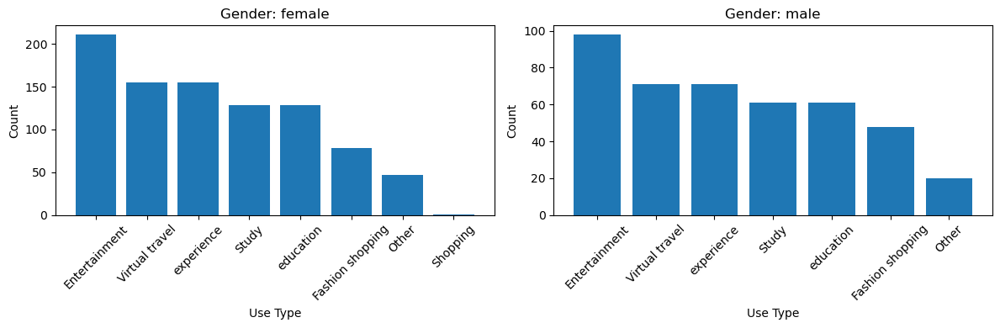

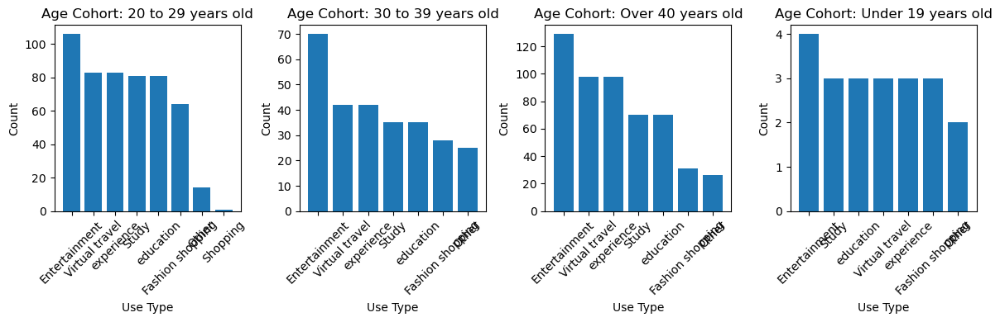

In [86]:
import pandas as pd
from collections import Counter
import matplotlib.pyplot as plt


# Placeholder for translations (fill in with actual translations)
translations = {
'Khác': 'Other', 
'Mua sắm thời trang': 'Fashion shopping',
'giáo dục': 'education',
'Học tập': 'Study',
'trải nghiệm': 'experience',
'Du lịch ảo': 'Virtual travel',
'Giải trí': 'Entertainment',
'Mua sắm': 'Shopping'
}

# Function to process each group
def process_group(group):
    all_values = ','.join(group['use_in_all_aspects']).replace('|', ',').replace('/', ',')
    value_list = [value.strip() for value in all_values.split(',')]
    value_counts = Counter(value_list)
    return [(translations.get(value, 'N/A'), count) for value, count in value_counts.items()]

# Group by Gender and age_cohort and apply the function
grouped_results = df_survey_cleaned.groupby(['Gender_eng', 'AGE_eng']).apply(process_group)

# Plotting function
def plot_grouped_results(grouped_results, group_by):
    num_plots = len(grouped_results)
    fig, axes = plt.subplots(1, num_plots, figsize=(12, 4))  # Adjust the figsize as needed

    for ax, (group, values) in zip(axes, grouped_results.items()):
        # Sort values by count
        sorted_values = sorted(values, key=lambda x: x[1], reverse=True)
        labels, counts = zip(*sorted_values)

        # Create bar plot
        ax.bar(labels, counts)
        ax.set_title(f'{group_by}: {group}')
        ax.set_xlabel('Use Type')
        ax.set_ylabel('Count')
        ax.set_xticks(range(len(labels)))  # Set the position of ticks
        ax.set_xticklabels(labels, rotation=45)  # Set the labels with rotation
    
    plt.tight_layout()
    plt.show()

# Plot by Gender
plot_grouped_results(df_survey_cleaned.groupby('Gender_eng').apply(process_group), 'Gender')

# Plot by Age Cohort
plot_grouped_results(df_survey_cleaned.groupby('AGE_eng').apply(process_group), 'Age Cohort')

### Tally up different usage types for each observation

In [87]:
import pandas as pd

# Create a list of columns to check
usage_cols = ['Usage_1', 'Usage_2', 'Usage_3', 'Usage_4', 'Usage_5', 'Usage_6', 'Usage_7']

# Initialize the 'use_type_cnts' column with 0


df_survey_cleaned['use_type_cnts'] = 0

# Iterate over each row in the DataFrame
for idx, row in df_survey_cleaned.iterrows():
    # Check if Usage_1 is not blank or null
    if pd.notnull(row['Usage_1']) and row['Usage_1'] != '':
        df_survey_cleaned.at[idx, 'use_type_cnts'] = 1
    
    # Check if Usage_2 is not blank or null
    if pd.notnull(row['Usage_2']) and row['Usage_2'] != '':
        df_survey_cleaned.at[idx, 'use_type_cnts'] += 1
        
    # Check if Usage_3 is not blank or null
    if pd.notnull(row['Usage_3']) and row['Usage_3'] != '':
        df_survey_cleaned.at[idx, 'use_type_cnts'] += 1
        
    # Check if Usage_4 is not blank or null
    if pd.notnull(row['Usage_4']) and row['Usage_4'] != '':
        df_survey_cleaned.at[idx, 'use_type_cnts'] += 1
    
    # Check if Usage_4 is not blank or null
    if pd.notnull(row['Usage_5']) and row['Usage_5'] != '':
        df_survey_cleaned.at[idx, 'use_type_cnts'] += 1
        
    # Check if Usage_4 is not blank or null
    if pd.notnull(row['Usage_6']) and row['Usage_6'] != '':
        df_survey_cleaned.at[idx, 'use_type_cnts'] += 1
        
    # Check if Usage_4 is not blank or null
    if pd.notnull(row['Usage_7']) and row['Usage_7'] != '':
        df_survey_cleaned.at[idx, 'use_type_cnts'] += 1
    

In [88]:
df_survey_cleaned['use_type_cnts'].value_counts()

use_type_cnts
1    127
3     72
2     61
6     60
5     47
4     42
7     15
Name: count, dtype: int64

In [89]:
df_survey_cleaned['use_type_cnts'].value_counts(normalize=True)

use_type_cnts
1    0.299528
3    0.169811
2    0.143868
6    0.141509
5    0.110849
4    0.099057
7    0.035377
Name: proportion, dtype: float64

In [90]:
df_survey_cleaned[['AGE_eng','use_type_cnts']].value_counts()

AGE_eng             use_type_cnts
Over 40 years old   1                55
30 to 39 years old  1                37
Over 40 years old   3                34
20 to 29 years old  1                32
Over 40 years old   2                32
20 to 29 years old  6                31
                    3                22
Over 40 years old   5                20
20 to 29 years old  5                20
Over 40 years old   6                18
                    4                18
30 to 39 years old  3                15
20 to 29 years old  2                14
30 to 39 years old  2                13
20 to 29 years old  4                13
30 to 39 years old  6                11
                    4                10
                    5                 7
20 to 29 years old  7                 7
30 to 39 years old  7                 4
Over 40 years old   7                 3
Under 19 years old  1                 3
                    2                 2
                    3                 1
      

In [91]:
df_survey_cleaned.groupby(['AGE_eng']).aggregate({'use_type_cnts':'sum'}) 

,use_type_cnts
AGE_eng,
20 to 29 years old,513
30 to 39 years old,277
Over 40 years old,522
Under 19 years old,21


In [92]:
df_survey_cleaned.head()

,Timestamp,AR_Knowledgeable,familiar_with_technology,use_AR_everyday,use_in_all_aspects,Virtual_shopping_environment,Virtual_tour,Visualize_model,Emulation,PE1,PE2,PE3,PE4,SOI1,SOI2,SOI3,SOI4,SEI1,SEI2,SEI3,PEOU1,PEOU2,PEOU3,PU1,PU2,PU3,PU4,B1,AT1,AT2,AT3,PPV1,PPV2,PPV3,HM1,HM2,HM3,BI1,BI2,BI3,BI4,Gender,AGE,Location,Gender_eng,Gender_vietnamese,Gender_num,AGE_eng,AGE_num,Age_vietnamese,Usage_1,Usage_2,Usage_3,Usage_4,Usage_5,Usage_6,Usage_7,Usage_1_en,Usage_2_en,Usage_3_en,Usage_4_en,Usage_5_en,Usage_6_en,Usage_7_en,use_type_cnts
0,13/10/2022 11:08:13,4.0,3.0,3.0,Du lịch ảo / trải nghiệm,3.0,3.0,3.0,3.0,4.0,4.0,4.0,4.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,4.0,4.0,4.0,4.0,3.0,3.0,3.0,3.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,4.0,4.0,4.0,nam,Trên 40 tuổi,miền Bắc,male,nam,0,Over 40 years old,3,Trên 40 tuổi,Du lịch ảo,trải nghiệm,,,,,,Du lịch ảo,experience,,,,,,2
1,13/10/2022 13:29:22,3.0,3.0,3.0,Mua sắm,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,nữ,20 đến 29 tuổi,miền Bắc,female,nữ,1,20 to 29 years old,1,20 đến 29 tuổi,Mua sắm,,,,,,,Shopping,,,,,,,1
2,13/10/2022 21:37:46,5.0,5.0,5.0,"Học tập, giáo dục",4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,nam,Trên 40 tuổi,miền Bắc,male,nam,0,Over 40 years old,3,Trên 40 tuổi,Học tập,giáo dục,,,,,,Study,education,,,,,,2
3,14/10/2022 12:31:04,3.0,3.0,3.0,"Giải trí, Mua sắm thời trang",2.0,2.0,2.0,2.0,4.0,4.0,5.0,5.0,3.0,5.0,4.0,3.0,3.0,2.0,2.0,3.0,5.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,nam,20 đến 29 tuổi,miền Bắc,male,nam,0,20 to 29 years old,1,20 đến 29 tuổi,Giải trí,Mua sắm thời trang,,,,,,Entertainment,Fashion shopping,,,,,,2
4,14/10/2022 12:37:35,4.0,1.0,1.0,"Giải trí, Du lịch ảo / trải nghiệm, Học tập, g...",1.0,2.0,4.0,4.0,3.0,3.0,3.0,3.0,3.0,3.0,4.0,3.0,3.0,3.0,3.0,4.0,4.0,4.0,4.0,4.0,3.0,3.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,nam,20 đến 29 tuổi,miền Bắc,male,nam,0,20 to 29 years old,1,20 đến 29 tuổi,Giải trí,Du lịch ảo,trải nghiệm,Học tập,giáo dục,Mua sắm thời trang,,Entertainment,Du lịch ảo,experience,Study,education,Fashion shopping,,6


In [93]:
df_survey_cleaned[['Usage_1','Usage_2','Usage_3','Usage_4','Usage_5','Usage_6','Usage_7']]

,Usage_1,Usage_2,Usage_3,Usage_4,Usage_5,Usage_6,Usage_7
0,Du lịch ảo,trải nghiệm,,,,,
1,Mua sắm,,,,,,
2,Học tập,giáo dục,,,,,
3,Giải trí,Mua sắm thời trang,,,,,
4,Giải trí,Du lịch ảo,trải nghiệm,Học tập,giáo dục,Mua sắm thời trang,
...,...,...,...,...,...,...,...
419,Giải trí,Du lịch ảo,trải nghiệm,Học tập,giáo dục,Mua sắm thời trang,Khác
420,Giải trí,Du lịch ảo,trải nghiệm,Mua sắm thời trang,,,
421,Du lịch ảo,trải nghiệm,,,,,
422,Du lịch ảo,trải nghiệm,,,,,


### Feature Engineering

### Create New Features - TAM Construct

In [94]:
df_survey_cleaned['BI'] = (df_survey_cleaned['BI1'] + df_survey_cleaned['BI2'] + df_survey_cleaned['BI3'] + df_survey_cleaned['BI4']) / 4

In [95]:
df_survey_cleaned['PE'] = (df_survey_cleaned['PE1'] + df_survey_cleaned['PE2'] + df_survey_cleaned['PE3'] + df_survey_cleaned['PE4']) / 4

In [96]:
df_survey_cleaned['SOI'] = (df_survey_cleaned['SOI1'] + df_survey_cleaned['SOI2'] + df_survey_cleaned['SOI3'] + df_survey_cleaned['SOI4']) / 4

In [97]:
df_survey_cleaned['SEI'] = (df_survey_cleaned['SEI1'] + df_survey_cleaned['SEI2'] + df_survey_cleaned['SEI3'] ) /3

In [98]:
df_survey_cleaned['HM'] = (df_survey_cleaned['HM1'] + df_survey_cleaned['HM2'] + df_survey_cleaned['HM3']) / 3

In [99]:
df_survey_cleaned['AT'] = (df_survey_cleaned['AT1'] + df_survey_cleaned['AT2'] + df_survey_cleaned['AT3']) / 3

In [100]:
df_survey_cleaned['PPV'] = (df_survey_cleaned['PPV1'] + df_survey_cleaned['PPV2'] + df_survey_cleaned['PPV3']) / 3

In [101]:
df_survey_cleaned['PU'] = (df_survey_cleaned['PU1'] + df_survey['PU2'] + df_survey_cleaned['PU3'] + df_survey_cleaned['PU4']) / 4

In [102]:
df_survey_cleaned['PEOU'] = (df_survey_cleaned['PEOU1'] + df_survey_cleaned['PEOU2'] + df_survey_cleaned['PEOU3']) / 3

In [103]:
df_survey_cleaned['AGE_num'] =df_survey_cleaned['AGE_num'].astype('int64')

## Feature Engineering

In [104]:
import pandas as pd
import numpy as np


variables_to_center = ['PE', 'SOI', 'SEI', 'HM', 'AT', 'PPV', 'PU', 'PEOU', 'PE','PPV','AR_Knowledgeable','familiar_with_technology','use_AR_everyday',
                       'Virtual_shopping_environment','use_AR_everyday','Virtual_tour','Visualize_model','Emulation']

# Create a new DataFrame to store the centered variables
df_centered = pd.DataFrame()

# Center each variable
for var in variables_to_center:
    mean = df_survey_cleaned[var].mean()
    df_centered[f'{var}_centered'] = df_survey_cleaned[var] - mean

# Add the centered variables back to the original DataFrame
df_survey_cleaned = pd.concat([df_survey_cleaned, df_centered], axis=1)



In [105]:
df_survey_cleaned.head()

,Timestamp,AR_Knowledgeable,familiar_with_technology,use_AR_everyday,use_in_all_aspects,Virtual_shopping_environment,Virtual_tour,Visualize_model,Emulation,PE1,PE2,PE3,PE4,SOI1,SOI2,SOI3,SOI4,SEI1,SEI2,SEI3,PEOU1,PEOU2,PEOU3,PU1,PU2,PU3,PU4,B1,AT1,AT2,AT3,PPV1,PPV2,PPV3,HM1,HM2,HM3,BI1,BI2,BI3,BI4,Gender,AGE,Location,Gender_eng,Gender_vietnamese,Gender_num,AGE_eng,AGE_num,Age_vietnamese,Usage_1,Usage_2,Usage_3,Usage_4,Usage_5,Usage_6,Usage_7,Usage_1_en,Usage_2_en,Usage_3_en,Usage_4_en,Usage_5_en,Usage_6_en,Usage_7_en,use_type_cnts,BI,PE,SOI,SEI,HM,AT,PPV,PU,PEOU,PE_centered,SOI_centered,SEI_centered,HM_centered,AT_centered,PPV_centered,PU_centered,PEOU_centered,AR_Knowledgeable_centered,familiar_with_technology_centered,use_AR_everyday_centered,Virtual_shopping_environment_centered,Virtual_tour_centered,Visualize_model_centered,Emulation_centered
0,13/10/2022 11:08:13,4.0,3.0,3.0,Du lịch ảo / trải nghiệm,3.0,3.0,3.0,3.0,4.0,4.0,4.0,4.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,4.0,4.0,4.0,4.0,3.0,3.0,3.0,3.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,4.0,4.0,4.0,nam,Trên 40 tuổi,miền Bắc,male,nam,0,Over 40 years old,3,Trên 40 tuổi,Du lịch ảo,trải nghiệm,,,,,,Du lịch ảo,experience,,,,,,2,3.75,4.0,3.00,3.000000,4.0,3.666667,4.0,3.25,4.0,0.205189,-0.714033,-0.723270,0.130503,-0.166667,0.211478,-0.568396,0.304245,1.025943,0.016509,0.325472,0.134434,0.233491,0.108491,0.228774
1,13/10/2022 13:29:22,3.0,3.0,3.0,Mua sắm,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,nữ,20 đến 29 tuổi,miền Bắc,female,nữ,1,20 to 29 years old,1,20 đến 29 tuổi,Mua sắm,,,,,,,Shopping,,,,,,,1,3.00,3.0,3.00,3.000000,3.0,3.000000,3.0,3.00,3.0,-0.794811,-0.714033,-0.723270,-0.869497,-0.833333,-0.788522,-0.818396,-0.695755,0.025943,0.016509,0.325472,0.134434,0.233491,0.108491,0.228774
2,13/10/2022 21:37:46,5.0,5.0,5.0,"Học tập, giáo dục",4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,nam,Trên 40 tuổi,miền Bắc,male,nam,0,Over 40 years old,3,Trên 40 tuổi,Học tập,giáo dục,,,,,,Study,education,,,,,,2,4.00,4.0,4.00,4.000000,4.0,4.000000,4.0,4.00,4.0,0.205189,0.285967,0.276730,0.130503,0.166667,0.211478,0.181604,0.304245,2.025943,2.016509,2.325472,1.134434,1.233491,1.108491,1.228774
3,14/10/2022 12:31:04,3.0,3.0,3.0,"Giải trí, Mua sắm thời trang",2.0,2.0,2.0,2.0,4.0,4.0,5.0,5.0,3.0,5.0,4.0,3.0,3.0,2.0,2.0,3.0,5.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,nam,20 đến 29 tuổi,miền Bắc,male,nam,0,20 to 29 years old,1,20 đến 29 tuổi,Giải trí,Mua sắm thời trang,,,,,,Entertainment,Fashion shopping,,,,,,2,5.00,4.5,3.75,2.333333,5.0,4.000000,4.0,4.00,4.0,0.705189,0.035967,-1.389937,1.130503,0.166667,0.211478,0.181604,0.304245,0.025943,0.016509,0.325472,-0.865566,-0.766509,-0.891509,-0.771226
4,14/10/2022 12:37:35,4.0,1.0,1.0,"Giải trí, Du lịch ảo / trải nghiệm, Học tập, g...",1.0,2.0,4.0,4.0,3.0,3.0,3.0,3.0,3.0,3.0,4.0,3.0,3.0,3.0,3.0,4.0,4.0,4.0,4.0,4.0,3.0,3.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,nam,20 đến 29 tuổi,miền Bắc,male,nam,0,20 to 29 years old,1,20 đến 29 tuổi,Giải trí,Du lịch ảo,trải nghiệm,Học tập,giáo dục,Mua sắm thời trang,,Entertainment,Du lịch ảo,experience,Study,education,Fashion shopping,,6,4.00,3.0,3.25,3.000000,4.0,4.000000,4.0,3.50,4.0,-0.794811,-0.464033,-0.723270,0.130503,0.166667,0.211478,-0.318396,0.304245,1.025943,-1.983491,-1.674528,-1.865566,-0.766509,1.108491,1.228774


### Interaction Features

In [106]:
df_survey_cleaned['AGEGender_centered'] = df_survey_cleaned['AGE_num'] * df_survey_cleaned['Gender_num']

In [107]:
df_survey_cleaned['AGEAR_Knowledgeable'] = df_survey_cleaned['AGE_num'] * df_survey_cleaned['AR_Knowledgeable_centered']

In [108]:
df_survey_cleaned['AGEfamiliar_with_technology'] = df_survey_cleaned['AGE_num'] * df_survey_cleaned['familiar_with_technology_centered']

In [109]:
df_survey_cleaned['AGEuse_AR_everyday'] = df_survey_cleaned['AGE_num'] * df_survey_cleaned['use_AR_everyday_centered']

In [110]:
df_survey_cleaned['AGEVirtual_shopping_environment'] = df_survey_cleaned['AGE_num'] * df_survey_cleaned['Virtual_shopping_environment_centered']

In [111]:
df_survey_cleaned['AGEVirtual_tour'] = df_survey_cleaned['AGE_num'] * df_survey_cleaned['Virtual_tour_centered']

In [112]:
df_survey_cleaned['AGEVisualize_model'] = df_survey_cleaned['AGE_num'] * df_survey_cleaned['Visualize_model_centered']

In [113]:
df_survey_cleaned['AGEEmulation'] = df_survey_cleaned['AGE_num'] * df_survey_cleaned['Emulation_centered']

In [114]:
df_survey_cleaned['GenderAR_Knowledgeable'] = df_survey_cleaned['Gender_num'] * df_survey_cleaned['AR_Knowledgeable_centered']

In [115]:
df_survey_cleaned['Genderfamiliar_with_technology'] = df_survey_cleaned['Gender_num'] * df_survey_cleaned['familiar_with_technology_centered']

In [116]:
df_survey_cleaned['Genderuse_AR_everyday'] = df_survey_cleaned['Gender_num'] * df_survey_cleaned['use_AR_everyday_centered']

In [117]:
df_survey_cleaned['GenderVirtual_shopping_environment'] = df_survey_cleaned['Gender_num'] * df_survey_cleaned['Virtual_shopping_environment_centered']

In [118]:
df_survey_cleaned['GenderVirtual_tour'] = df_survey_cleaned['Gender_num'] * df_survey_cleaned['Virtual_tour_centered']

In [119]:
df_survey_cleaned['GenderVisualize_model'] = df_survey_cleaned['Gender_num'] *  df_survey_cleaned['Visualize_model_centered']

In [120]:
df_survey_cleaned['GenderEmulation'] = df_survey_cleaned['Gender_num'] * df_survey_cleaned['Emulation_centered']

In [121]:
df_survey_cleaned['GenderPU_centered'] =  df_survey_cleaned['Gender_num']* df_survey_cleaned['PU_centered'] 

In [122]:
df_survey_cleaned['GenderPE_centered'] =  df_survey_cleaned['Gender_num']* df_survey_cleaned['PE_centered'] 

In [123]:
df_survey_cleaned['GenderPEOU_centered'] =  df_survey_cleaned['Gender_num']* df_survey_cleaned['PEOU_centered']

In [124]:
df_survey_cleaned['GenderAT_centered'] =  df_survey_cleaned['Gender_num']* df_survey_cleaned['AT_centered']

In [125]:
df_survey_cleaned['GenderPPV_centered'] =  df_survey_cleaned['Gender_num']* df_survey_cleaned['PPV_centered'] 

In [126]:
df_survey_cleaned['GenderHM_centered'] =  df_survey_cleaned['Gender_num']* df_survey_cleaned['HM_centered']

In [127]:
df_survey_cleaned['GenderSOI_centered'] =  df_survey_cleaned['Gender_num']* df_survey_cleaned['SOI_centered']

In [128]:
df_survey_cleaned['GenderSEI_centered'] =  df_survey_cleaned['Gender_num']* df_survey_cleaned['SEI_centered']

In [129]:
df_survey_cleaned['AGEPEOU_centered'] = df_survey_cleaned['AGE_num'] * df_survey_cleaned['PEOU_centered'] 

In [130]:
df_survey_cleaned['AGEPU_centered'] = df_survey_cleaned['AGE_num'] * df_survey_cleaned['PU_centered'] 

In [131]:
df_survey_cleaned['AGESOI_centered'] =  df_survey_cleaned['AGE_num']* df_survey_cleaned['SOI_centered']

In [132]:
df_survey_cleaned['AGESEI_centered'] =  df_survey_cleaned['AGE_num']* df_survey_cleaned['SEI_centered']

In [133]:
df_survey_cleaned['AGEPPV_centered'] =  df_survey_cleaned['AGE_num']* df_survey_cleaned['PPV_centered']

In [134]:
df_survey_cleaned['AGEHM_centered'] =  df_survey_cleaned['AGE_num']* df_survey_cleaned['HM_centered']

In [135]:
df_survey_cleaned['AGEPE_centered'] =  df_survey_cleaned['AGE_num']* df_survey_cleaned['PE_centered']

In [136]:
df_survey_cleaned['AGEAT_centered'] =  df_survey_cleaned['AGE_num']* df_survey_cleaned['AT_centered']

In [137]:
df_survey_cleaned['PEAT_centered'] =  df_survey_cleaned['PE_centered']* df_survey_cleaned['AT_centered']

In [138]:
df_survey_cleaned['HMAT_centered'] =  df_survey_cleaned['HM_centered']* df_survey_cleaned['AT_centered']

In [139]:
df_survey_cleaned['HMPU_centered'] =  df_survey_cleaned['HM_centered']* df_survey_cleaned['PU_centered']

In [140]:
df_survey_cleaned['HMPEOU_centered'] =  df_survey_cleaned['HM_centered']* df_survey_cleaned['PEOU_centered']

In [141]:
df_survey_cleaned['HMSOI_centered'] =  df_survey_cleaned['HM_centered']* df_survey_cleaned['SOI_centered']

In [142]:
df_survey_cleaned['HMSEI_centered'] =  df_survey_cleaned['HM_centered']* df_survey_cleaned['SEI_centered']

In [143]:
df_survey_cleaned['HMPE_centered'] =  df_survey_cleaned['HM_centered']* df_survey_cleaned['PE_centered']

In [144]:
df_survey_cleaned['HMPPV_centered'] =  df_survey_cleaned['HM_centered']* df_survey_cleaned['PPV_centered']

In [145]:
df_survey_cleaned['SOIPU_centered'] =  df_survey_cleaned['SOI_centered']* df_survey_cleaned['PU_centered']

In [146]:
df_survey_cleaned['SEIPU_centered'] =  df_survey_cleaned['SEI_centered']* df_survey_cleaned['PU_centered']

In [147]:
df_survey_cleaned['SOIPEOU_centered'] =  df_survey_cleaned['SOI_centered']* df_survey_cleaned['PEOU_centered']

In [148]:
df_survey_cleaned['SEIPEOU_centered'] =  df_survey_cleaned['SOI_centered']* df_survey_cleaned['PEOU_centered']

In [149]:
df_survey_cleaned.to_csv(r'C:\Users\cemcd\OneDrive\Documents\NCU\Dissertation\DisserationDataFilesInfo\df_survey_cleamed.csv')

In [150]:
df_survey_cleaned['target_variable_num'] =  df_survey_cleaned['BI']

In [151]:
df_survey_cleaned['target_variable_cat'] =  np.where(df_survey_cleaned["BI"] >= 4.5 , 1, 0)

Based on the search results, here is an interpretation of whether squared and cubic terms should be centered:
Centering and Multicollinearity:
Centering is often recommended to reduce multicollinearity, especially when dealing with interaction or polynomial terms (like squared and cubic terms).
Centering the linear term before squaring or cubing can help reduce the correlation between the linear and higher-order terms, potentially leading to more stable coefficient estimates.
Benefits of Centering:
Centering makes the interpretation of coefficients easier, as it aligns the zero point of the predictor with its mean, making the intercept more meaningful.
For quadratic terms, centering can help in interpreting the linear and quadratic effects separately, reducing collinearity between them.
Limitations and Considerations:
Centering may not always reduce multicollinearity effectively, particularly for cubic or higher-order terms.
The effect of centering on multicollinearity can vary depending on the distribution and relationship of the variables involved.
Practical Advice:
Center the linear term before creating squared or cubic terms to potentially reduce multicollinearity and simplify interpretation.
Consider the specific context and distribution of my data when deciding whether to center, as it may not always provide the desired benefits.
In summary, centering the linear terms before creating squared or cubic terms is generally advisable to reduce multicollinearity and improve interpretability. However, the effectiveness of centering can vary, and it may not always resolve multicollinearity issues, especially for higher-order terms.


### Create Quadratic terms


In [152]:
# get all numeric columns
df_numerics_only = df_survey_cleaned.select_dtypes(include='number').columns
 
print(df_numerics_only)

Index(['AR_Knowledgeable', 'familiar_with_technology', 'use_AR_everyday',
       'Virtual_shopping_environment', 'Virtual_tour', 'Visualize_model',
       'Emulation', 'PE1', 'PE2', 'PE3',
       ...
       'HMSOI_centered', 'HMSEI_centered', 'HMPE_centered', 'HMPPV_centered',
       'SOIPU_centered', 'SEIPU_centered', 'SOIPEOU_centered',
       'SEIPEOU_centered', 'target_variable_num', 'target_variable_cat'],
      dtype='object', length=111)


In [153]:
df_quadratic_n_cubed_terms = df_survey_cleaned[['PE_centered', 'SOI_centered', 'SEI_centered', 'HM_centered', 'AT_centered', 'PPV_centered', 'PU_centered',
       'PEOU_centered', 'AGEGender_centered', 'GenderPU_centered', 'GenderPEOU_centered' ,'GenderAT_centered' ,'GenderPPV_centered',
       'GenderPE_centered', 'GenderHM_centered', 'GenderSOI_centered', 'GenderSEI_centered', 'AGEPEOU_centered', 'AGEPU_centered',
       'AGESOI_centered', 'AGESEI_centered', 'AGEPPV_centered', 'AGEHM_centered', 'AGEPE_centered', 'AGEAT_centered', 'PEAT_centered', 'HMAT_centered',
       'HMPU_centered', 'HMPEOU_centered', 'HMSOI_centered', 'HMSEI_centered', 'HMPE_centered']]

In [154]:

# Add quadratic and cubic terms for each independent variable

# Create a dictionary to store new columns
new_columns = {}

# Add quadratic and cubic terms for each independent variable
for feature in df_quadratic_n_cubed_terms:
    new_columns[f"{feature}_squared"] = df_survey_cleaned[feature] ** 2
    new_columns[f"{feature}_cubed"] = df_survey_cleaned[feature] ** 3

# Create a new DataFrame with the additional columns
df_additional = pd.DataFrame(new_columns, index=df_survey_cleaned.index)

# Concatenate the original DataFrame with the new columns
df_survey_cleaned = pd.concat([df_survey_cleaned, df_additional], axis=1)
 

In [155]:
df_additional.shape

(424, 64)

In [156]:
df_survey_cleaned.shape

(424, 198)

In [157]:
df_additional.columns

Index(['PE_centered_squared', 'PE_centered_cubed', 'SOI_centered_squared',
       'SOI_centered_cubed', 'SEI_centered_squared', 'SEI_centered_cubed',
       'HM_centered_squared', 'HM_centered_cubed', 'AT_centered_squared',
       'AT_centered_cubed', 'PPV_centered_squared', 'PPV_centered_cubed',
       'PU_centered_squared', 'PU_centered_cubed', 'PEOU_centered_squared',
       'PEOU_centered_cubed', 'AGEGender_centered_squared',
       'AGEGender_centered_cubed', 'GenderPU_centered_squared',
       'GenderPU_centered_cubed', 'GenderPEOU_centered_squared',
       'GenderPEOU_centered_cubed', 'GenderAT_centered_squared',
       'GenderAT_centered_cubed', 'GenderPPV_centered_squared',
       'GenderPPV_centered_cubed', 'GenderPE_centered_squared',
       'GenderPE_centered_cubed', 'GenderHM_centered_squared',
       'GenderHM_centered_cubed', 'GenderSOI_centered_squared',
       'GenderSOI_centered_cubed', 'GenderSEI_centered_squared',
       'GenderSEI_centered_cubed', 'AGEPEOU_centered

In [158]:
df_additional.head(1)

,PE_centered_squared,PE_centered_cubed,SOI_centered_squared,SOI_centered_cubed,SEI_centered_squared,SEI_centered_cubed,HM_centered_squared,HM_centered_cubed,AT_centered_squared,AT_centered_cubed,PPV_centered_squared,PPV_centered_cubed,PU_centered_squared,PU_centered_cubed,PEOU_centered_squared,PEOU_centered_cubed,AGEGender_centered_squared,AGEGender_centered_cubed,GenderPU_centered_squared,GenderPU_centered_cubed,GenderPEOU_centered_squared,GenderPEOU_centered_cubed,GenderAT_centered_squared,GenderAT_centered_cubed,GenderPPV_centered_squared,GenderPPV_centered_cubed,GenderPE_centered_squared,GenderPE_centered_cubed,GenderHM_centered_squared,GenderHM_centered_cubed,GenderSOI_centered_squared,GenderSOI_centered_cubed,GenderSEI_centered_squared,GenderSEI_centered_cubed,AGEPEOU_centered_squared,AGEPEOU_centered_cubed,AGEPU_centered_squared,AGEPU_centered_cubed,AGESOI_centered_squared,AGESOI_centered_cubed,AGESEI_centered_squared,AGESEI_centered_cubed,AGEPPV_centered_squared,AGEPPV_centered_cubed,AGEHM_centered_squared,AGEHM_centered_cubed,AGEPE_centered_squared,AGEPE_centered_cubed,AGEAT_centered_squared,AGEAT_centered_cubed,PEAT_centered_squared,PEAT_centered_cubed,HMAT_centered_squared,HMAT_centered_cubed,HMPU_centered_squared,HMPU_centered_cubed,HMPEOU_centered_squared,HMPEOU_centered_cubed,HMSOI_centered_squared,HMSOI_centered_cubed,HMSEI_centered_squared,HMSEI_centered_cubed,HMPE_centered_squared,HMPE_centered_cubed
0,0.042102,0.008639,0.509843,-0.364045,0.52312,-0.378357,0.017031,0.002223,0.027778,-0.00463,0.044723,0.009458,0.323074,-0.183634,0.092565,0.028163,0,0,0.0,-0.0,0.0,0.0,0.0,-0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.0,0.0,-0.0,0.833087,0.760388,2.907668,-4.958123,4.588588,-9.829211,4.708081,-10.215648,0.402506,0.255364,0.15328,0.06001,0.378922,0.233251,0.25,-0.125,0.00117,-0.00004,0.000473,-0.00001,0.005502,-0.000408,0.001576,0.000063,0.008683,-0.000809,0.008909,-0.000841,0.000717,0.000019


In [159]:
df_additional.columns

Index(['PE_centered_squared', 'PE_centered_cubed', 'SOI_centered_squared',
       'SOI_centered_cubed', 'SEI_centered_squared', 'SEI_centered_cubed',
       'HM_centered_squared', 'HM_centered_cubed', 'AT_centered_squared',
       'AT_centered_cubed', 'PPV_centered_squared', 'PPV_centered_cubed',
       'PU_centered_squared', 'PU_centered_cubed', 'PEOU_centered_squared',
       'PEOU_centered_cubed', 'AGEGender_centered_squared',
       'AGEGender_centered_cubed', 'GenderPU_centered_squared',
       'GenderPU_centered_cubed', 'GenderPEOU_centered_squared',
       'GenderPEOU_centered_cubed', 'GenderAT_centered_squared',
       'GenderAT_centered_cubed', 'GenderPPV_centered_squared',
       'GenderPPV_centered_cubed', 'GenderPE_centered_squared',
       'GenderPE_centered_cubed', 'GenderHM_centered_squared',
       'GenderHM_centered_cubed', 'GenderSOI_centered_squared',
       'GenderSOI_centered_cubed', 'GenderSEI_centered_squared',
       'GenderSEI_centered_cubed', 'AGEPEOU_centered

In [160]:
# get all numeric columns
df_numerics_only = df_survey_cleaned.select_dtypes(include='number').columns
 
print(df_numerics_only)

Index(['AR_Knowledgeable', 'familiar_with_technology', 'use_AR_everyday',
       'Virtual_shopping_environment', 'Virtual_tour', 'Visualize_model',
       'Emulation', 'PE1', 'PE2', 'PE3',
       ...
       'HMPU_centered_squared', 'HMPU_centered_cubed',
       'HMPEOU_centered_squared', 'HMPEOU_centered_cubed',
       'HMSOI_centered_squared', 'HMSOI_centered_cubed',
       'HMSEI_centered_squared', 'HMSEI_centered_cubed',
       'HMPE_centered_squared', 'HMPE_centered_cubed'],
      dtype='object', length=175)


In [161]:
duplicate_features = set([x for x in df_survey_cleaned.columns if list(df_survey_cleaned.columns).count(x) > 1])
print("Duplicate features:", duplicate_features)


Duplicate features: set()


In [162]:
df_survey_cleaned.shape

(424, 198)

In [163]:

# Drop the duplicate features
df = df_survey_cleaned.drop(columns=duplicate_features)

# Data Exploration 

In [164]:
 
df = df_survey_cleaned

 

X = df[['BI', 'AGE_num', 'Gender_num', 'PU_centered','PEOU_centered','PE_centered','HM_centered','SOI_centered', 'SEI_centered',
        'PPV_centered','AGEGender_centered', 'GenderPU_centered', 'GenderPEOU_centered' ,'GenderAT_centered' ,'GenderPPV_centered',
       'GenderPE_centered', 'GenderHM_centered', 'GenderSOI_centered', 'GenderSEI_centered', 'AGEPEOU_centered', 'AGEPU_centered',
       'AGESOI_centered', 'AGESEI_centered', 'AGEPPV_centered', 'AGEHM_centered', 'PEAT_centered', 'HMAT_centered','HMPU_centered', 
        'HMPEOU_centered', 'HMSOI_centered', 'HMSEI_centered', 'HMPE_centered','PE_centered_cubed', 'SOI_centered_squared',
        'SOI_centered_cubed', 'SEI_centered_squared', 'SEI_centered_cubed','HM_centered_squared', 'HM_centered_cubed', 'AT_centered_squared',
        'AT_centered_cubed', 'PPV_centered_squared', 'PPV_centered_cubed', 'PU_centered_squared', 'PU_centered_cubed', 'PEOU_centered_squared',
       'PEOU_centered_cubed', 'AGEGender_centered_squared','AGEGender_centered_cubed', 'GenderPU_centered_squared',
       'AGEGender_centered_cubed', 'GenderPU_centered_squared',
       'GenderPU_centered_cubed', 'GenderPEOU_centered_squared',
       'GenderPEOU_centered_cubed', 'GenderAT_centered_squared',
       'GenderAT_centered_cubed', 'GenderPPV_centered_squared',
       'GenderPPV_centered_cubed', 'GenderPE_centered_squared',
       'GenderPE_centered_cubed', 'GenderHM_centered_squared',
       'GenderHM_centered_cubed', 'GenderSOI_centered_squared',
       'GenderSOI_centered_cubed', 'GenderSEI_centered_squared',
       'GenderSEI_centered_cubed', 'AGEPEOU_centered_squared',
       'AGEPEOU_centered_cubed', 'AGEPU_centered_squared',
       'AGEPU_centered_cubed', 'AGESOI_centered_squared',
       'AGESOI_centered_cubed', 'AGESEI_centered_squared',
       'AGESEI_centered_cubed', 'AGEPPV_centered_squared',
       'AGEPPV_centered_cubed', 'AGEHM_centered_squared',
       'AGEHM_centered_cubed', 'PEAT_centered_squared', 'PEAT_centered_cubed',
       'HMAT_centered_squared', 'HMAT_centered_cubed', 'HMPU_centered_squared',
       'HMPU_centered_cubed', 'HMPEOU_centered_squared',
       'HMPEOU_centered_cubed', 'HMSOI_centered_squared',
       'HMSOI_centered_cubed', 'HMSEI_centered_squared',
       'HMSEI_centered_cubed', 'HMPE_centered_squared', 'HMPE_centered_cubed']]
y = df['BI']

# Sample size check
print(f"Sample size: {len(X)}")
print(f"Number of features: {X.shape[1]}")
print(f"Observations per feature: {len(X) / X.shape[1]:.2f}")



Sample size: 424
Number of features: 93
Observations per feature: 4.56


## Analyze the target variable

In [165]:
df_survey_cleaned['BI'].describe()

count    424.000000
mean       3.797759
std        0.873460
min        1.000000
25%        3.250000
50%        4.000000
75%        4.500000
max        5.000000
Name: BI, dtype: float64

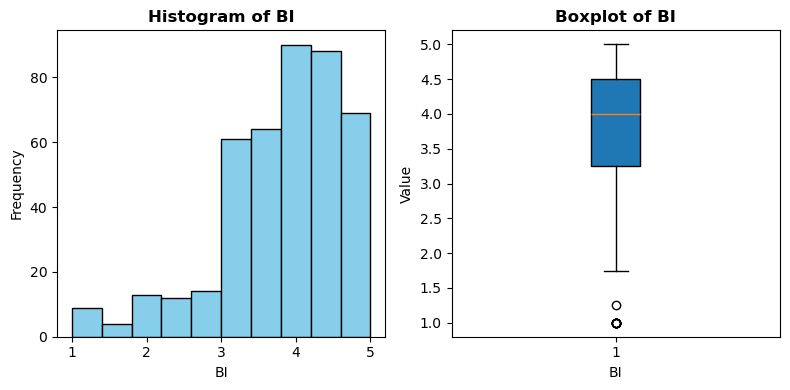

In [166]:
 

# Create a figure with two subplots (side by side)
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(8, 4))

# Create a histogram on the first subplot
axes[0].hist(df_survey_cleaned['BI'], bins=10, color='skyblue', edgecolor='black')
axes[0].set_title('Histogram of BI', fontweight='bold')
axes[0].set_xlabel('BI')
axes[0].set_ylabel('Frequency')

# Create a boxplot on the second subplot
axes[1].boxplot(df_survey_cleaned['BI'], vert=True, patch_artist=True)
axes[1].set_title('Boxplot of BI', fontweight='bold')
axes[1].set_xlabel('BI')
axes[1].set_ylabel('Value')

# Adjust the layout to prevent overlap
plt.tight_layout()

# Show the plot
plt.show()

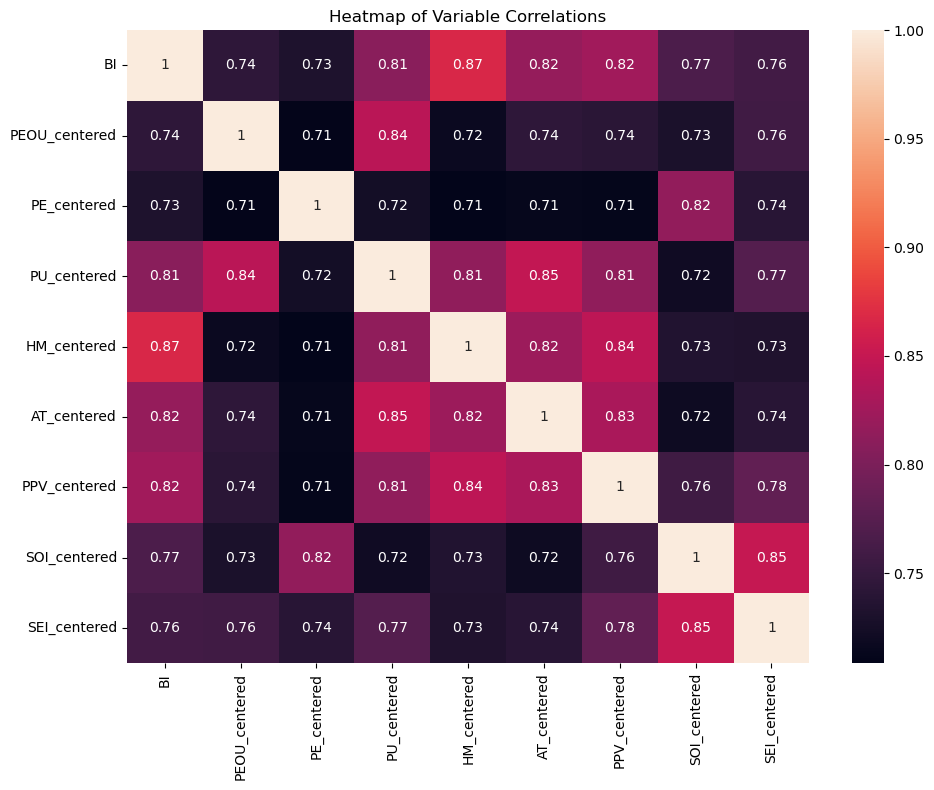

In [167]:
# List of variables for the heatmap
variables = ['BI', 'PEOU_centered', 'PE_centered', 'PU_centered', 'HM_centered', 'AT_centered', 'PPV_centered', 'SOI_centered', 'SEI_centered']

# Compute the correlation matrix for the specified variables
corr_matrix = df_survey_cleaned[variables].corr()

corr_matrix


# Create the heatmap using seaborn

plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True)

# Set the title and adjust the plot display
plt.title('Heatmap of Variable Correlations')
plt.tight_layout()

# Show the plot
plt.show()

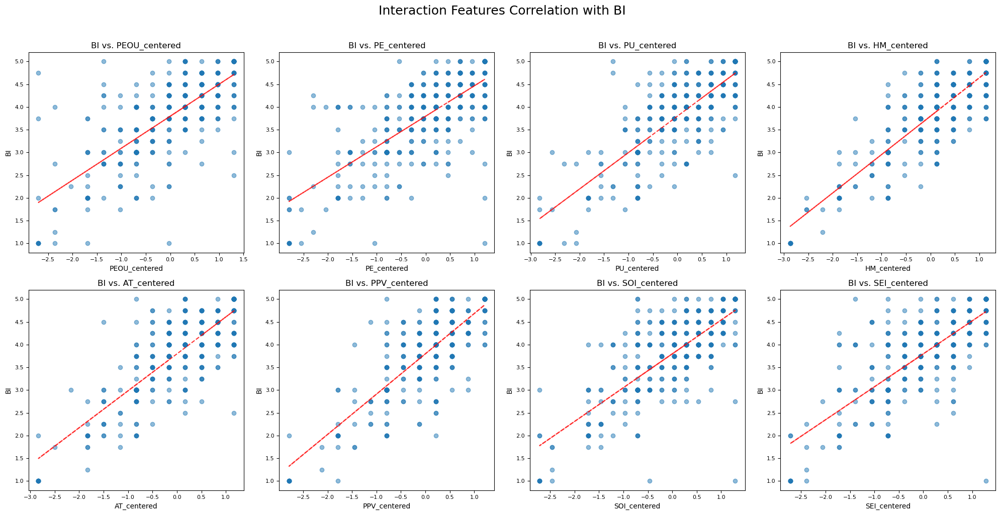

In [168]:
import matplotlib.pyplot as plt
import math
import numpy as np

# Numerical variables to plot against BI
variables_to_plot = ['PEOU_centered', 'PE_centered', 'PU_centered', 'HM_centered', 'AT_centered', 'PPV_centered', 'SOI_centered', 'SEI_centered']

# Calculate the number of rows and columns needed
num_variables = len(variables_to_plot)
num_cols = 4  # You can adjust this if you want a different number of columns
num_rows = math.ceil(num_variables / num_cols)

# Create a figure and a grid of subplots
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(20, 5*num_rows))

# Add a main title to the figure
fig.suptitle(' Interaction Features Correlation with BI', fontsize=18, y=1.02)

# Flatten the array of axes for easy iteration
axes = axes.flatten()

# Loop through the variables and create a scatter plot for each
for i, variable in enumerate(variables_to_plot):
    # Select the subplot
    ax = axes[i]
    
    # Create the scatter plot
    ax.scatter(df_survey_cleaned[variable], df_survey_cleaned['BI'], alpha=0.5)
    
    # Set the title and labels with increased font size
    ax.set_title(f'BI vs. {variable}', fontsize=12)
    ax.set_xlabel(variable, fontsize=10)
    ax.set_ylabel('BI', fontsize=10)
    
    # Increase tick label font size
    ax.tick_params(axis='both', which='major', labelsize=8)
    
    # Add a trend line
    z = np.polyfit(df_survey_cleaned[variable], df_survey_cleaned['BI'], 1)
    p = np.poly1d(z)
    ax.plot(df_survey_cleaned[variable], p(df_survey_cleaned[variable]), "r--", alpha=0.8)

# If there are any subplots without data, hide them
for j in range(num_variables, len(axes)):
    axes[j].axis('off')
 
# Adjust the layout to prevent overlap
plt.tight_layout()

# Show the plot
plt.show()

### Compare BI with the interaction variables

# BI scatter plots indicatec Possible non linear relationships as indicatedby the curve. PEAT, HMAT, HMPU, HMPEOU, HMSOI, HMSEI,HMPE

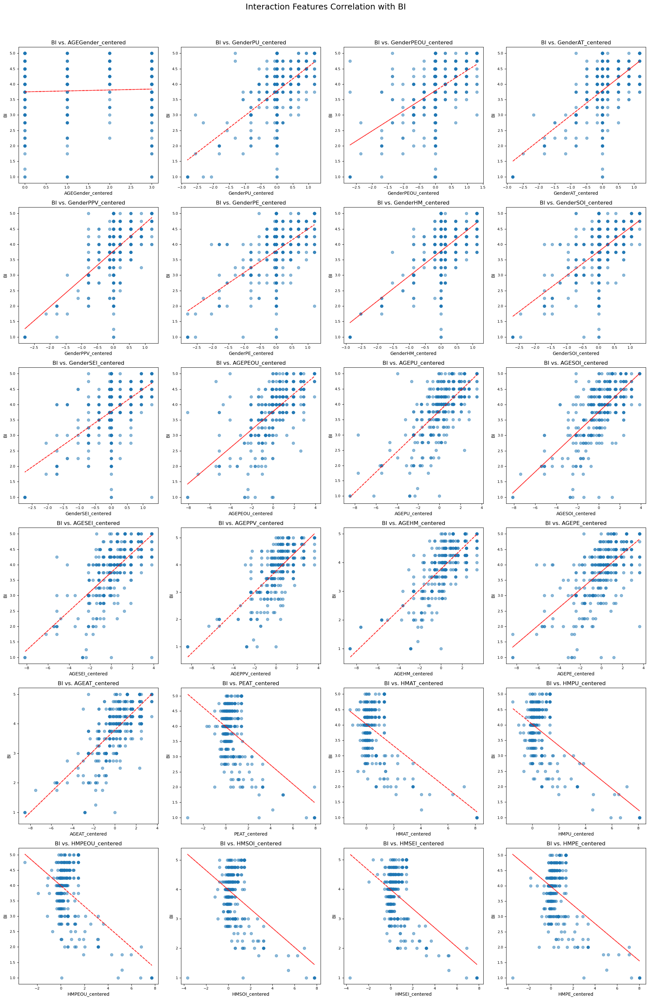

In [169]:
import matplotlib.pyplot as plt
import math
import numpy as np

# Numerical variables to plot against BI
variables_to_plot = ['AGEGender_centered', 'GenderPU_centered', 'GenderPEOU_centered' ,'GenderAT_centered' ,'GenderPPV_centered',
       'GenderPE_centered', 'GenderHM_centered', 'GenderSOI_centered', 'GenderSEI_centered', 'AGEPEOU_centered', 'AGEPU_centered',
       'AGESOI_centered', 'AGESEI_centered', 'AGEPPV_centered', 'AGEHM_centered', 'AGEPE_centered', 'AGEAT_centered', 'PEAT_centered', 'HMAT_centered',
       'HMPU_centered', 'HMPEOU_centered', 'HMSOI_centered', 'HMSEI_centered', 'HMPE_centered']

# Calculate the number of rows and columns needed
num_variables = len(variables_to_plot)
num_cols = 4  # You can adjust this if you want a different number of columns
num_rows = math.ceil(num_variables / num_cols)

# Create a figure and a grid of subplots
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(20, 5*num_rows))

# Add a main title to the figure
fig.suptitle(' Interaction Features Correlation with BI', fontsize=18, y=1.02)

# Flatten the array of axes for easy iteration
axes = axes.flatten()

# Loop through the variables and create a scatter plot for each
for i, variable in enumerate(variables_to_plot):
    # Select the subplot
    ax = axes[i]
    
    # Create the scatter plot
    ax.scatter(df_survey_cleaned[variable], df_survey_cleaned['BI'], alpha=0.5)
    
    # Set the title and labels with increased font size
    ax.set_title(f'BI vs. {variable}', fontsize=12)
    ax.set_xlabel(variable, fontsize=10)
    ax.set_ylabel('BI', fontsize=10)
    
    # Increase tick label font size
    ax.tick_params(axis='both', which='major', labelsize=8)
    
    # Add a trend line
    z = np.polyfit(df_survey_cleaned[variable], df_survey_cleaned['BI'], 1)
    p = np.poly1d(z)
    ax.plot(df_survey_cleaned[variable], p(df_survey_cleaned[variable]), "r--", alpha=0.8)

# If there are any subplots without data, hide them
for j in range(num_variables, len(axes)):
    axes[j].axis('off')
 
# Adjust the layout to prevent overlap
plt.tight_layout()

# Show the plot
plt.show()

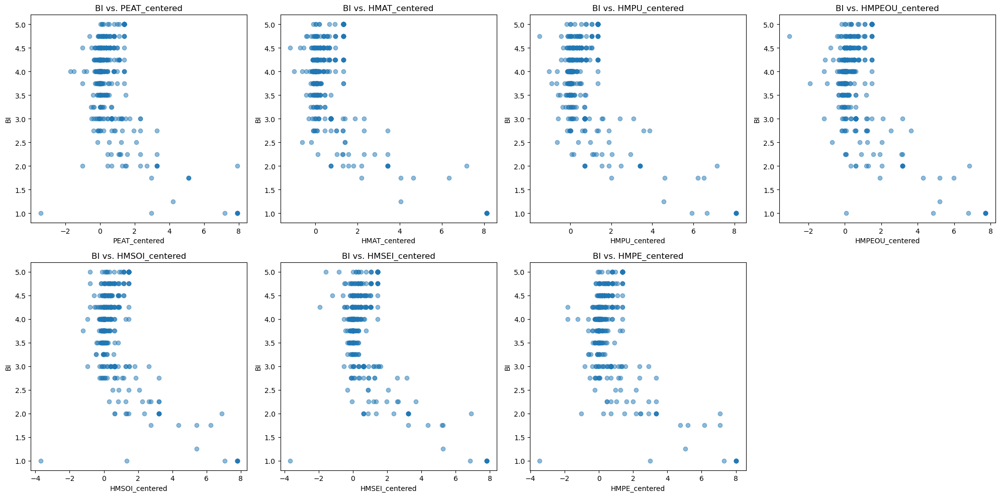

In [170]:
import matplotlib.pyplot as plt
import math

# Numerical variables to plot against BI
variables_to_plot = ['PEAT_centered', 'HMAT_centered', 'HMPU_centered', 'HMPEOU_centered','HMSOI_centered', 'HMSEI_centered', 'HMPE_centered']

# Calculate the number of rows and columns needed
num_variables = len(variables_to_plot)
num_cols = 4  # You can adjust this if you want a different number of columns
num_rows = math.ceil(num_variables / num_cols)

# Create a figure and a grid of subplots
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(20, 5*num_rows))

# Flatten the array of axes for easy iteration
axes = axes.flatten()

# Loop through the variables and create a scatter plot for each
for i, variable in enumerate(variables_to_plot):
    # Select the subplot
    ax = axes[i]
    
    # Create the scatter plot
    ax.scatter(df_survey_cleaned[variable], df_survey_cleaned['BI'], alpha=0.5)
    
    # Set the title and labels
    ax.set_title(f'BI vs. {variable}')
    ax.set_xlabel(variable)
    ax.set_ylabel('BI')
    


# If there are any subplots without data, hide them
for j in range(num_variables, len(axes)):
    axes[j].axis('off')
 
# Adjust the layout to prevent overlap
plt.tight_layout()

# Show the plot
plt.show()
plt.show()

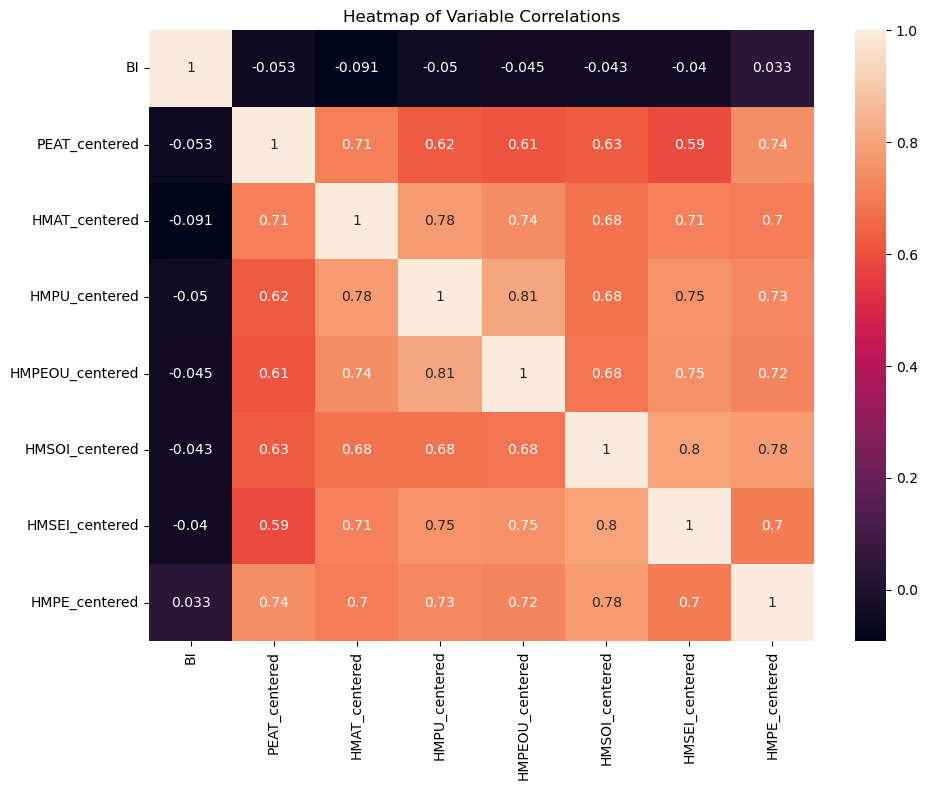

In [171]:
# List of variables for the heatmap
variables = ['BI','PEAT_centered', 'HMAT_centered', 'HMPU_centered', 'HMPEOU_centered','HMSOI_centered', 'HMSEI_centered', 'HMPE_centered']

# Compute the correlation matrix for the specified variables
#corr_matrix = df_survey_cleaned[variables].corr()
# Calculate the Spearman correlation matrix
corr_matrix = df_survey_cleaned[variables].corr(method='spearman')

corr_matrix


# Create the heatmap using seaborn

plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True)

# Set the title and adjust the plot display
plt.title('Heatmap of Variable Correlations')
plt.tight_layout()

# Show the plot
plt.show()

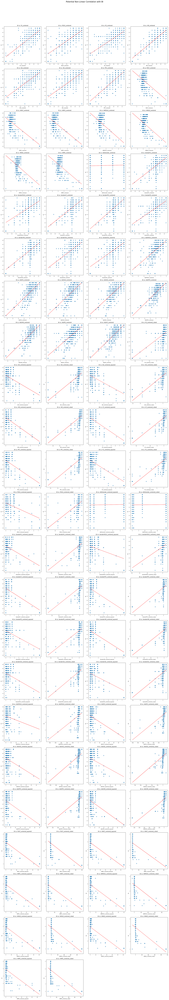

In [172]:
import matplotlib.pyplot as plt
import math
import numpy as np

# Numerical variables to plot against BI
variables_to_plot = [
    'PU_centered', 'PEOU_centered', 'PE_centered', 'HM_centered', 'SOI_centered', 'SEI_centered', 'PPV_centered',
    'PEAT_centered', 'HMAT_centered', 'HMPU_centered', 'HMPEOU_centered', 'HMSOI_centered', 'HMSEI_centered', 'HMPE_centered',
    'AGEGender_centered', 'GenderPU_centered', 'GenderPEOU_centered', 'GenderAT_centered', 'GenderPPV_centered',
    'GenderPE_centered', 'GenderHM_centered', 'GenderSOI_centered', 'GenderSEI_centered', 'AGEPEOU_centered', 'AGEPU_centered',
    'AGESOI_centered', 'AGESEI_centered', 'AGEPPV_centered', 'AGEHM_centered', 'AGEPE_centered', 'AGEAT_centered',
    'PE_centered_cubed', 'SOI_centered_squared', 'SOI_centered_cubed', 'SEI_centered_squared', 'SEI_centered_cubed',
    'HM_centered_squared', 'HM_centered_cubed', 'AT_centered_squared', 'AT_centered_cubed', 'PPV_centered_squared', 
    'PPV_centered_cubed', 'PU_centered_squared', 'PU_centered_cubed', 'PEOU_centered_squared', 'PEOU_centered_cubed',
    'AGEGender_centered_squared', 'AGEGender_centered_cubed', 'GenderPU_centered_squared', 'GenderPU_centered_cubed',
    'GenderPEOU_centered_squared', 'GenderPEOU_centered_cubed', 'GenderAT_centered_squared', 'GenderAT_centered_cubed',
    'GenderPPV_centered_squared', 'GenderPPV_centered_cubed', 'GenderPE_centered_squared', 'GenderPE_centered_cubed',
    'GenderHM_centered_squared', 'GenderHM_centered_cubed', 'GenderSOI_centered_squared', 'GenderSOI_centered_cubed',
    'GenderSEI_centered_squared', 'GenderSEI_centered_cubed', 'AGEPEOU_centered_squared', 'AGEPEOU_centered_cubed',
    'AGEPU_centered_squared', 'AGEPU_centered_cubed', 'AGESOI_centered_squared', 'AGESOI_centered_cubed',
    'AGESEI_centered_squared', 'AGESEI_centered_cubed', 'AGEPPV_centered_squared', 'AGEPPV_centered_cubed',
    'AGEHM_centered_squared', 'AGEHM_centered_cubed', 
    'PEAT_centered_squared', 'PEAT_centered_cubed', 'HMAT_centered_squared', 'HMAT_centered_cubed', 'HMPU_centered_squared',
    'HMPU_centered_cubed', 'HMPEOU_centered_squared', 'HMPEOU_centered_cubed', 'HMSOI_centered_squared',
    'HMSOI_centered_cubed', 'HMSEI_centered_squared', 'HMSEI_centered_cubed', 'HMPE_centered_squared', 'HMPE_centered_cubed'
]

# Calculate the number of rows and columns needed
num_variables = len(variables_to_plot)
num_cols = 4  # You can adjust this if you want a different number of columns
num_rows = math.ceil(num_variables / num_cols)

# Create a figure and a grid of subplots
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(20, 5*num_rows))

# Flatten the array of axes for easy iteration
axes = axes.flatten()

# Loop through the variables and create a scatter plot for each
for i, variable in enumerate(variables_to_plot):
    # Select the subplot
    ax = axes[i]
    
    # Create the scatter plot
    ax.scatter(df_survey_cleaned[variable], df_survey_cleaned['BI'], alpha=0.5)
    
    # Set the title and labels
    ax.set_title(f'BI vs. {variable}', fontsize=10)
    ax.set_xlabel(variable, fontsize=8)
    ax.set_ylabel('BI', fontsize=8)
    
    # Increase tick label font size
    ax.tick_params(axis='both', which='major', labelsize=6)
    
    # Add a trend line
    z = np.polyfit(df_survey_cleaned[variable], df_survey_cleaned['BI'], 1)
    p = np.poly1d(z)
    ax.plot(df_survey_cleaned[variable], p(df_survey_cleaned[variable]), "r--", alpha=0.8)

# If there are any subplots without data, hide them
for j in range(num_variables, len(axes)):
    axes[j].axis('off')

# Add a main title to the figure
fig.suptitle('Potential Non-Linear Correlation with BI', fontsize=16, y=1.02)

# Adjust the layout to prevent overlap
plt.tight_layout()

# Show the plot
plt.show()

## Analyze Age, Gender and BI

In [173]:
gender_BI_stats = df_survey_cleaned.groupby(['Gender_eng','Gender_num'])['BI'].describe()
gender_BI_stats

,,count,mean,std,min,25%,50%,75%,max
Gender_eng,Gender_num,,,,,,,,
female,1,295.0,3.821186,0.818328,1.0,3.5,4.0,4.25,5.0
male,0,129.0,3.744186,0.989429,1.0,3.0,4.0,4.50,5.0


In [174]:
age_BI_stats = df_survey_cleaned.groupby(['AGE_eng','AGE_num'])['BI'].describe()
age_BI_stats

,,count,mean,std,min,25%,50%,75%,max
AGE_eng,AGE_num,,,,,,,,
20 to 29 years old,1,139.0,3.600719,0.967179,1.0,3.0000,3.75,4.250,5.0
30 to 39 years old,2,97.0,4.056701,0.776029,2.0,3.7500,4.25,4.750,5.0
Over 40 years old,3,180.0,3.813889,0.793709,1.0,3.5000,4.00,4.250,5.0
Under 19 years old,0,8.0,3.718750,1.256679,1.0,3.5625,4.00,4.375,5.0


In [175]:
# Create the crosstab
cross_tab = pd.crosstab(df['AGE_eng'], df['Gender_eng'])

# Calculate row percentages
cross_tab_percentage = cross_tab.div(cross_tab.sum(axis=1), axis=0) * 100

# Add total counts
cross_tab['Total'] = cross_tab.sum(axis=1)
cross_tab_percentage['Total'] = 100

# Round percentages to two decimal places
cross_tab_percentage = cross_tab_percentage.round(2)

# Add column totals
cross_tab.loc['Total'] = cross_tab.sum()
cross_tab_percentage.loc['Total'] = cross_tab_percentage.mean()

cross_tab

Gender_eng,female,male,Total
AGE_eng,,,
20 to 29 years old,75,64,139
30 to 39 years old,46,51,97
Over 40 years old,169,11,180
Under 19 years old,5,3,8
Total,295,129,424


In [176]:
# Create the crosstab
cross_tab = pd.crosstab(df['AGE_eng'], df['Gender_eng'])

# Calculate row percentages
cross_tab_percentage = cross_tab.div(cross_tab.sum(axis=1), axis=0) * 100

# Add total counts
cross_tab['Total'] = cross_tab.sum(axis=1)
cross_tab_percentage['Total'] = 100

# Round percentages to two decimal places
cross_tab_percentage = cross_tab_percentage.round(2)

# Add column totals
cross_tab.loc['Total'] = cross_tab.sum()
cross_tab_percentage.loc['Total'] = cross_tab_percentage.mean()

cross_tab_percentage

Gender_eng,female,male,Total
AGE_eng,,,
20 to 29 years old,53.9600,46.0400,100.0
30 to 39 years old,47.4200,52.5800,100.0
Over 40 years old,93.8900,6.1100,100.0
Under 19 years old,62.5000,37.5000,100.0
Total,64.4425,35.5575,100.0


### Anova test - Gender

F-statistic: 0.6970028502564573
p-value: 0.40426499558639306
Fail to reject the null hypothesis. There are no significant differences between Genders.


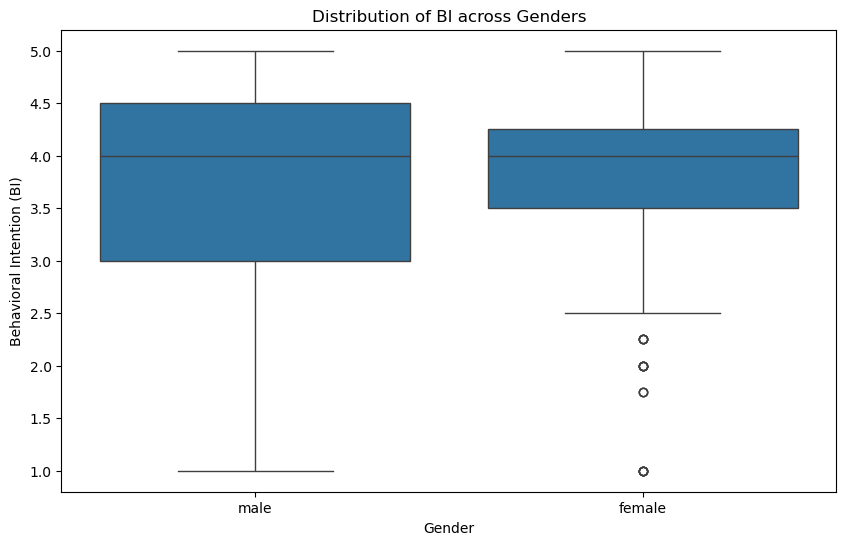


Eta-squared: 4.5777646966475014e-05
Small effect size


In [177]:

# Step 1: Prepare the data
groups = df_survey_cleaned.groupby('Gender_eng')['BI'].apply(list)

# Step 2: Perform one-way ANOVA
f_statistic, p_value = stats.f_oneway(*groups)

# Step 3: Print the results
print(f"F-statistic: {f_statistic}")
print(f"p-value: {p_value}")

# Step 4: Interpret the results
alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis. There are significant differences between Genders.")
else:
    print("Fail to reject the null hypothesis. There are no significant differences between Genders.")

# Step 5: Visualize the data
plt.figure(figsize=(10, 6))
sns.boxplot(x='Gender_eng', y='BI', data=df_survey_cleaned)
plt.title('Distribution of BI across Genders')
plt.xlabel('Gender')
plt.ylabel('Behavioral Intention (BI)')
plt.show()

# Step 6: Post-hoc analysis (if ANOVA is significant)
if p_value < alpha:
    from statsmodels.stats.multicomp import pairwise_tukeyhsd
    tukey_results = pairwise_tukeyhsd(df_survey_cleaned['BI'], df_survey_cleaned['Gender_eng'])
    print("\nTukey HSD Results:")
    print(tukey_results)

    # Visualize Tukey HSD results
    plt.figure(figsize=(12, 6))
    tukey_results.plot_simultaneous()
    plt.title('Tukey HSD Results')
    plt.show()

# Step 7: Effect size calculation (Eta-squared)
groups_mean = df_survey_cleaned.groupby('Gender_eng')['BI'].mean()
grand_mean = df_survey_cleaned['BI'].mean()
n = len(df_survey_cleaned)
k = len(groups)

ss_between = sum(len(group) * (mean - grand_mean)**2 for group, mean in groups_mean.items())
ss_total = sum((x - grand_mean)**2 for x in df_survey_cleaned['BI'])

eta_squared = ss_between / ss_total
print(f"\nEta-squared: {eta_squared}")

# Interpret effect size
if eta_squared < 0.01:
    print("Small effect size")
elif eta_squared < 0.06:
    print("Medium effect size")
else:
    print("Large effect size")

### Anova test AGE

F-statistic: 5.405542969088095
p-value: 0.0011719375173653067
Reject the null hypothesis. There are significant differences between age cohorts.


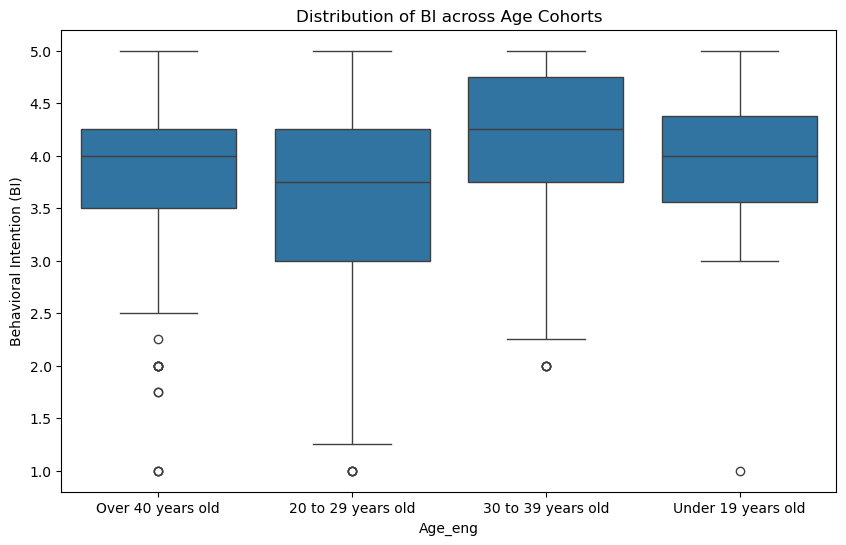


Tukey HSD Results:
            Multiple Comparison of Means - Tukey HSD, FWER=0.05            
      group1             group2       meandiff p-adj   lower  upper  reject
---------------------------------------------------------------------------
20 to 29 years old 30 to 39 years old    0.456 0.0004  0.1625 0.7495   True
20 to 29 years old  Over 40 years old   0.2132 0.1263 -0.0373 0.4637  False
20 to 29 years old Under 19 years old    0.118 0.9817 -0.6886 0.9247  False
30 to 39 years old  Over 40 years old  -0.2428 0.1139 -0.5223 0.0366  False
30 to 39 years old Under 19 years old   -0.338 0.7091  -1.154 0.4781  False
 Over 40 years old Under 19 years old  -0.0951   0.99 -0.8968 0.7065  False
---------------------------------------------------------------------------


<Figure size 1200x600 with 0 Axes>

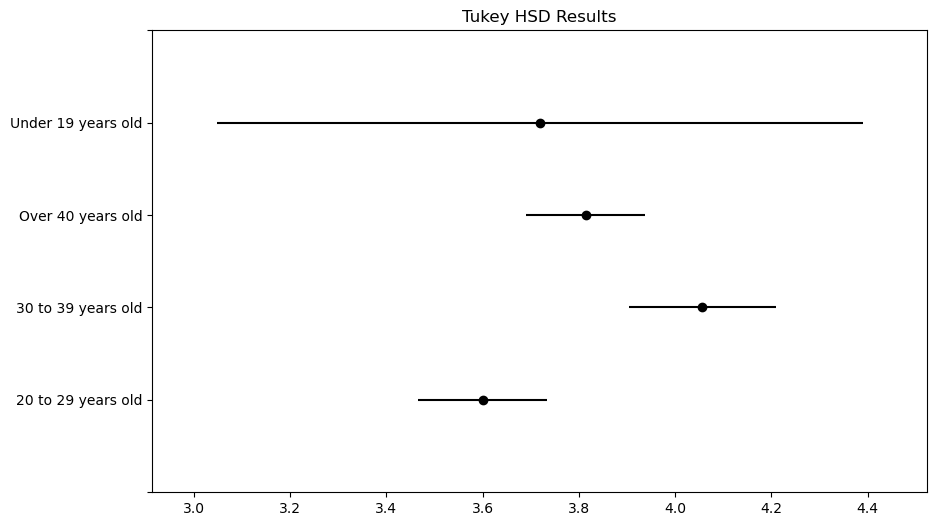


Eta-squared: 0.006267180527545978
Small effect size


In [178]:
### Conduct Anova Test of BI and AGe
# Step 1: Prepare the data
groups = df_survey_cleaned.groupby('AGE_eng')['BI'].apply(list)

# Step 2: Perform one-way ANOVA
f_statistic, p_value = stats.f_oneway(*groups)

# Step 3: Print the results
print(f"F-statistic: {f_statistic}")
print(f"p-value: {p_value}")

# Step 4: Interpret the results
alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis. There are significant differences between age cohorts.")
else:
    print("Fail to reject the null hypothesis. There are no significant differences between age cohorts.")

# Step 5: Visualize the data
plt.figure(figsize=(10, 6))
sns.boxplot(x='AGE_eng', y='BI', data=df_survey_cleaned)
plt.title('Distribution of BI across Age Cohorts')
plt.xlabel('Age_eng')
plt.ylabel('Behavioral Intention (BI)')
plt.show()

# Step 6: Post-hoc analysis (if ANOVA is significant)
if p_value < alpha:
    from statsmodels.stats.multicomp import pairwise_tukeyhsd
    tukey_results = pairwise_tukeyhsd(df_survey_cleaned['BI'], df_survey_cleaned['AGE_eng'])
    print("\nTukey HSD Results:")
    print(tukey_results)

    # Visualize Tukey HSD results
    plt.figure(figsize=(12, 6))
    tukey_results.plot_simultaneous()
    plt.title('Tukey HSD Results')
    plt.show()

# Step 7: Effect size calculation (Eta-squared)
groups_mean = df_survey_cleaned.groupby('AGE_eng')['BI'].mean()
grand_mean = df_survey_cleaned['BI'].mean()
n = len(df_survey_cleaned)
k = len(groups)

ss_between = sum(len(group) * (mean - grand_mean)**2 for group, mean in groups_mean.items())
ss_total = sum((x - grand_mean)**2 for x in df_survey_cleaned['BI'])

eta_squared = ss_between / ss_total
print(f"\nEta-squared: {eta_squared}")

# Interpret effect size
if eta_squared < 0.01:
    print("Small effect size")
elif eta_squared < 0.06:
    print("Medium effect size")
else:
    print("Large effect size")

### Chi^2 Tests

Chi-square test results for AGE_eng and Gender:
Chi-square statistic: 88.96273396520631
p-value: 3.6587596854784645e-19
Degrees of freedom: 3
Reject the null hypothesis. There is a significant association between AGE_eng and Gender.
Cramer's V: 0.45805869578675606
Moderate association

Contingency Table:
Gender              nam   nữ
AGE_eng                     
20 to 29 years old   64   75
30 to 39 years old   51   46
Over 40 years old    11  169
Under 19 years old    3    5

Expected Frequencies:
Gender                    nam          nữ
AGE_eng                                  
20 to 29 years old  42.290094   96.709906
30 to 39 years old  29.511792   67.488208
Over 40 years old   54.764151  125.235849
Under 19 years old   2.433962    5.566038


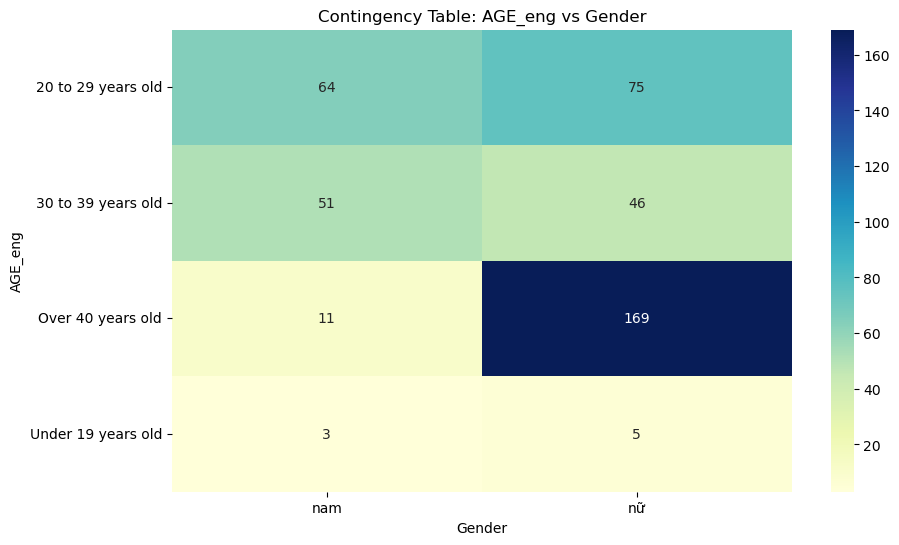

<Figure size 1200x600 with 0 Axes>

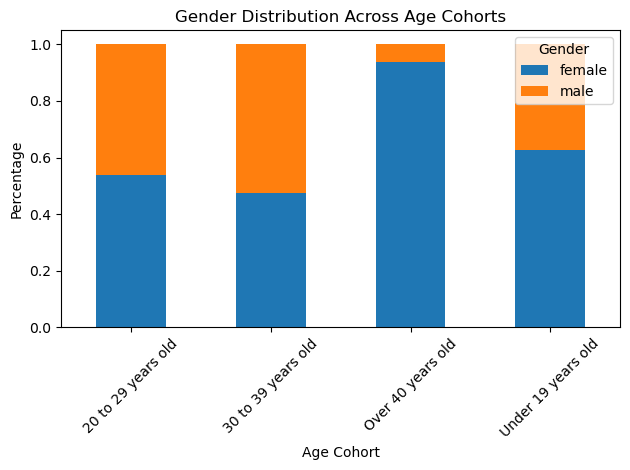

In [179]:
import pandas as pd
import numpy as np
from scipy.stats import chi2_contingency
import matplotlib.pyplot as plt
import seaborn as sns

 
# Function to perform and report Chi-square test
def chi_square_test(var1, var2, df):
    contingency_table = pd.crosstab(df[var1], df[var2])
    chi2, p_value, dof, expected = chi2_contingency(contingency_table)
    
    print(f"Chi-square test results for {var1} and {var2}:")
    print(f"Chi-square statistic: {chi2}")
    print(f"p-value: {p_value}")
    print(f"Degrees of freedom: {dof}")
    
    # Interpret the results
    alpha = 0.05
    if p_value < alpha:
        print(f"Reject the null hypothesis. There is a significant association between {var1} and {var2}.")
    else:
        print(f"Fail to reject the null hypothesis. There is no significant association between {var1} and {var2}.")
    
    # Calculate Cramer's V for effect size
    n = contingency_table.sum().sum()
    min_dim = min(contingency_table.shape) - 1
    cramer_v = np.sqrt(chi2 / (n * min_dim))
    print(f"Cramer's V: {cramer_v}")
    
    # Interpret Cramer's V
    if cramer_v < 0.1:
        print("Negligible association")
    elif cramer_v < 0.3:
        print("Weak association")
    elif cramer_v < 0.5:
        print("Moderate association")
    else:
        print("Strong association")
    
    print("\nContingency Table:")
    print(contingency_table)
    print("\nExpected Frequencies:")
    print(pd.DataFrame(expected, index=contingency_table.index, columns=contingency_table.columns))
    
    # Visualize the contingency table
    plt.figure(figsize=(10, 6))
    sns.heatmap(contingency_table, annot=True, fmt='d', cmap='YlGnBu')
    plt.title(f'Contingency Table: {var1} vs {var2}')
    plt.show()

# Perform Chi-square test for AGE_cohort and Gender
chi_square_test('AGE_eng', 'Gender', df)





# Additional analysis: Stacked bar plot for AGE_cohort and Gender
plt.figure(figsize=(12, 6))
df_percentage = df.groupby('AGE_eng')['Gender_eng'].value_counts(normalize=True).unstack()
df_percentage.plot(kind='bar', stacked=True)
plt.title('Gender Distribution Across Age Cohorts')
plt.xlabel('Age Cohort')
plt.ylabel('Percentage')
plt.legend(title='Gender')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

 

## Outliers


In [180]:

# Calculate Z-scores
z_scores = np.abs(stats.zscore(df['BI']))

# Identify outliers
outliers = np.where(z_scores > 3)
print("Outliers detected at indices:", outliers)

Outliers detected at indices: (array([  5,  34, 161, 192, 358, 375, 394, 405], dtype=int64),)


In [181]:
Q1 = df['BI'].quantile(0.25)
Q3 = df['BI'].quantile(0.75)
IQR = Q3 - Q1

# Identify outliers
outliers = df[(df['BI'] < (Q1 - 1.5 * IQR)) | (df['BI'] > (Q3 + 1.5 * IQR))]
#print("Outliers detected:\n", outliers)
outliers['BI']


5      1.00
21     1.25
34     1.00
161    1.00
192    1.00
358    1.00
375    1.00
394    1.00
405    1.00
Name: BI, dtype: float64

In [182]:
Q1 = df['BI'].quantile(0.25)
Q3 = df['BI'].quantile(0.75)
IQR = Q3 - Q1

# Identify outliers
outliers = df[(df['BI'] < (Q1 - 1.5 * IQR)) | (df['BI'] > (Q3 + 1.5 * IQR))]
#print("Outliers detected:\n", outliers)
outliers['BI']


5      1.00
21     1.25
34     1.00
161    1.00
192    1.00
358    1.00
375    1.00
394    1.00
405    1.00
Name: BI, dtype: float64

In [184]:
from sklearn.ensemble import IsolationForest
import pandas as pd


# Fit the model
iso_forest = IsolationForest(contamination=0.05, random_state=42)
df_survey_cleaned['anomaly'] = iso_forest.fit_predict(df_survey_cleaned[['BI']])

# Identify outliers
outlier_mask = df_survey_cleaned['anomaly'] == -1
outliers = df_survey_cleaned[outlier_mask]

# Get the index of outliers
outlier_indices = df_survey_cleaned.index[outlier_mask]

print("Indices of outliers:")
print(outlier_indices)

print("\nOutlier rows:")
print(outliers)

print("\nBI values of outliers:")
print(outliers['BI'])

# Drop these outliers from my DataFrame
#df_cleaned = df_survey_cleaned[~outlier_mask].drop('anomaly', axis=1)

print(f"\nOriginal DataFrame shape: {df_survey_cleaned.shape}")
print(f"Cleaned DataFrame shape: {df_survey_cleaned.shape}")

# If you want to save the cleaned DataFrame:
# df_cleaned.to_csv('cleaned_survey_data.csv', index=False)

Indices of outliers:
Index([5, 21, 34, 65, 81, 127, 147, 161, 162, 192, 316, 358, 359, 374, 375,
       394, 405],
      dtype='int64')

Outlier rows:
               Timestamp  AR_Knowledgeable  familiar_with_technology  \
5    14/10/2022 12:45:53               5.0                       2.0   
21   14/10/2022 14:08:10               5.0                       2.0   
34   14/10/2022 15:19:32               1.0                       1.0   
65   15/10/2022 19:13:15               1.0                       1.0   
81   17/10/2022 13:09:23               2.0                       2.0   
127  24/10/2022 15:42:19               1.0                       1.0   
147  26/10/2022 09:58:28               5.0                       5.0   
161  26/10/2022 12:09:48               1.0                       1.0   
162  26/10/2022 12:11:23               2.0                       2.0   
192  26/10/2022 18:58:20               1.0                       1.0   
316  30/10/2022 22:01:00               2.0               

C:\Users\cemcd\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


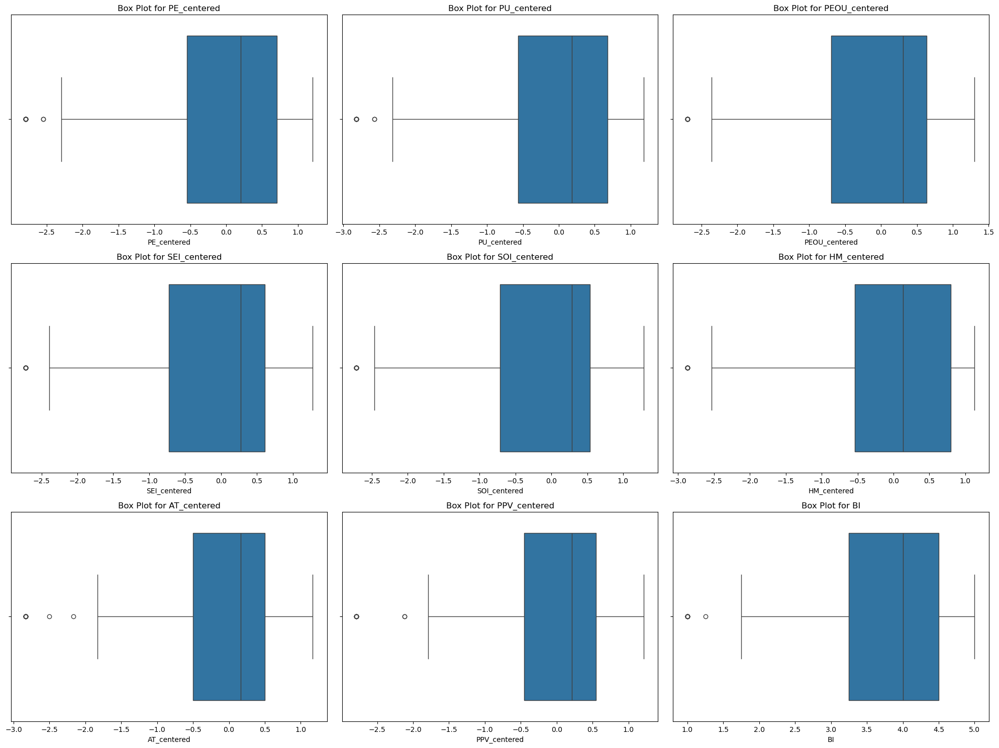

Outliers detected in PE_centered using Z-score method at indices: []
Outliers detected in PU_centered using Z-score method at indices: [  5  34  67 161 162 192 375 405]
Outliers detected in PEOU_centered using Z-score method at indices: []
Outliers detected in SEI_centered using Z-score method at indices: []
Outliers detected in SOI_centered using Z-score method at indices: [ 27  34  52  67 161 192 375 405]
Outliers detected in HM_centered using Z-score method at indices: [  5  34 161 192 358 375 394 405]
Outliers detected in AT_centered using Z-score method at indices: [  5  34  67 161 192 358 375 394 405]
Outliers detected in PPV_centered using Z-score method at indices: [  5  34  67 161 192 375 394 405]
Outliers detected in BI using Z-score method at indices: [  5  34 161 192 358 375 394 405]
Outliers detected in PE_centered using IQR method at indices: [27, 34, 52, 65, 67, 127, 161, 162, 192, 358, 375, 405]
Outliers detected in PU_centered using IQR method at indices: [5, 34, 67, 1

In [185]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats


df = df_survey_cleaned

variables = ['PE_centered', 'PU_centered', 'PEOU_centered', 'SEI_centered', 'SOI_centered', 'HM_centered', 'AT_centered', 'PPV_centered', 'BI']

# Visualization: Box Plots
plt.figure(figsize=(20, 15))  # Increased figure size
for i, var in enumerate(variables, 1):
    plt.subplot(3, 3, i)  # Changed to 3x3 grid
    sns.boxplot(x=df[var])
    plt.title(f'Box Plot for {var}')
plt.tight_layout()
plt.show()

# Initialize counters for outliers
z_outlier_count = 0
iqr_outlier_count = 0

# Statistical Method: Z-Score
outliers_zscore = {}
for var in variables:
    z_scores = np.abs(stats.zscore(df[var]))
    outliers = np.where(z_scores > 3)
    outliers_zscore[var] = outliers[0]
    z_outlier_count += len(outliers[0])
    print(f"Outliers detected in {var} using Z-score method at indices: {outliers[0]}")

# Statistical Method: IQR
outliers_iqr = {}
for var in variables:
    Q1 = df[var].quantile(0.25)
    Q3 = df[var].quantile(0.75)
    IQR = Q3 - Q1
    outliers = df[(df[var] < (Q1 - 1.5 * IQR)) | (df[var] > (Q3 + 1.5 * IQR))].index
    outliers_iqr[var] = outliers
    iqr_outlier_count += len(outliers)
    print(f"Outliers detected in {var} using IQR method at indices: {outliers.tolist()}")

# Summary of Outliers
# Combine results from both methods
combined_outliers = {}
for var in variables:
    combined_outliers[var] = {
        'Z-score': outliers_zscore[var],
        'IQR': outliers_iqr[var].tolist()
    }

# Print combined results
for var, outliers in combined_outliers.items():
    print(f"\nOutliers for {var}:")
    print(f"Z-score method: {outliers['Z-score']}")
    print(f"IQR method: {outliers['IQR']}")

# Print total count of outliers detected
print(f"\nTotal number of outliers detected using Z-score method: {z_outlier_count}")
print(f"Total number of outliers detected using IQR method: {iqr_outlier_count}")

In [186]:
indices_to_display = [5, 34, 67,405]
columns_of_interest = ['PE', 'PU', 'PEOU', 'SEI', 'SOI', 'HM', 'AT', 'PPV', 'BI']
print("\nDisplaying only columns of interest:")
print(df_survey_cleaned.loc[indices_to_display, columns_of_interest])



Displaying only columns of interest:
      PE   PU      PEOU       SEI  SOI        HM   AT  PPV   BI
5    5.0  1.0  1.333333  1.333333  5.0  1.000000  1.0  1.0  1.0
34   1.0  1.0  1.000000  1.000000  1.0  1.000000  1.0  1.0  1.0
67   1.0  1.0  1.000000  1.000000  1.0  1.333333  1.0  1.0  2.0
405  1.0  1.0  1.000000  1.000000  1.0  1.000000  1.0  1.0  1.0


In [187]:
df_survey_cleaned[(df_survey_cleaned['BI'] == 1) &(df_survey_cleaned['PU'] == 1) &(df_survey_cleaned['PEOU'] == 1) & (df_survey_cleaned['AT'] == 1) ]

,Timestamp,AR_Knowledgeable,familiar_with_technology,use_AR_everyday,use_in_all_aspects,Virtual_shopping_environment,Virtual_tour,Visualize_model,Emulation,PE1,PE2,PE3,PE4,SOI1,SOI2,SOI3,SOI4,SEI1,SEI2,SEI3,PEOU1,PEOU2,PEOU3,PU1,PU2,PU3,PU4,B1,AT1,AT2,AT3,PPV1,PPV2,PPV3,HM1,HM2,HM3,BI1,BI2,BI3,BI4,Gender,AGE,Location,Gender_eng,Gender_vietnamese,Gender_num,AGE_eng,AGE_num,Age_vietnamese,Usage_1,Usage_2,Usage_3,Usage_4,Usage_5,Usage_6,Usage_7,Usage_1_en,Usage_2_en,Usage_3_en,Usage_4_en,Usage_5_en,Usage_6_en,Usage_7_en,use_type_cnts,BI,PE,SOI,SEI,HM,AT,PPV,PU,PEOU,PE_centered,SOI_centered,SEI_centered,HM_centered,AT_centered,PPV_centered,PU_centered,PEOU_centered,AR_Knowledgeable_centered,familiar_with_technology_centered,use_AR_everyday_centered,Virtual_shopping_environment_centered,Virtual_tour_centered,Visualize_model_centered,Emulation_centered,AGEGender_centered,AGEAR_Knowledgeable,AGEfamiliar_with_technology,AGEuse_AR_everyday,AGEVirtual_shopping_environment,AGEVirtual_tour,AGEVisualize_model,AGEEmulation,GenderAR_Knowledgeable,Genderfamiliar_with_technology,Genderuse_AR_everyday,GenderVirtual_shopping_environment,GenderVirtual_tour,GenderVisualize_model,GenderEmulation,GenderPU_centered,GenderPE_centered,GenderPEOU_centered,GenderAT_centered,GenderPPV_centered,GenderHM_centered,GenderSOI_centered,GenderSEI_centered,AGEPEOU_centered,AGEPU_centered,AGESOI_centered,AGESEI_centered,AGEPPV_centered,AGEHM_centered,AGEPE_centered,AGEAT_centered,PEAT_centered,HMAT_centered,HMPU_centered,HMPEOU_centered,HMSOI_centered,HMSEI_centered,HMPE_centered,HMPPV_centered,SOIPU_centered,SEIPU_centered,SOIPEOU_centered,SEIPEOU_centered,target_variable_num,target_variable_cat,PE_centered_squared,PE_centered_cubed,SOI_centered_squared,SOI_centered_cubed,SEI_centered_squared,SEI_centered_cubed,HM_centered_squared,HM_centered_cubed,AT_centered_squared,AT_centered_cubed,PPV_centered_squared,PPV_centered_cubed,PU_centered_squared,PU_centered_cubed,PEOU_centered_squared,PEOU_centered_cubed,AGEGender_centered_squared,AGEGender_centered_cubed,GenderPU_centered_squared,GenderPU_centered_cubed,GenderPEOU_centered_squared,GenderPEOU_centered_cubed,GenderAT_centered_squared,GenderAT_centered_cubed,GenderPPV_centered_squared,GenderPPV_centered_cubed,GenderPE_centered_squared,GenderPE_centered_cubed,GenderHM_centered_squared,GenderHM_centered_cubed,GenderSOI_centered_squared,GenderSOI_centered_cubed,GenderSEI_centered_squared,GenderSEI_centered_cubed,AGEPEOU_centered_squared,AGEPEOU_centered_cubed,AGEPU_centered_squared,AGEPU_centered_cubed,AGESOI_centered_squared,AGESOI_centered_cubed,AGESEI_centered_squared,AGESEI_centered_cubed,AGEPPV_centered_squared,AGEPPV_centered_cubed,AGEHM_centered_squared,AGEHM_centered_cubed,AGEPE_centered_squared,AGEPE_centered_cubed,AGEAT_centered_squared,AGEAT_centered_cubed,PEAT_centered_squared,PEAT_centered_cubed,HMAT_centered_squared,HMAT_centered_cubed,HMPU_centered_squared,HMPU_centered_cubed,HMPEOU_centered_squared,HMPEOU_centered_cubed,HMSOI_centered_squared,HMSOI_centered_cubed,HMSEI_centered_squared,HMSEI_centered_cubed,HMPE_centered_squared,HMPE_centered_cubed,anomaly
34,14/10/2022 15:19:32,1.0,1.0,1.0,Khác,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,nam,Dưới 19 tuổi,Nước ngoài,male,nam,0,Under 19 years old,0,Dưới 19 tuổi,Khác,,,,,,,Other,,,,,,,1,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,-2.794811,-2.714033,-2.72327,-2.869497,-2.833333,-2.788522,-2.818396,-2.695755,-1.974057,-1.983491,-1.674528,-1.865566,-1.766509,-1.891509,-1.771226,0,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.00000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,7.918632,8.130241,8.087379,7.73546,7.787909,7.814416,8.019702,8.001655,7.64922,7.675255,7.316367

### Create Correlation Matrix of all Features

In [188]:

 
features =  ['BI','PU_centered', 'PEOU_centered', 'PE_centered', 'HM_centered', 'SOI_centered', 'SEI_centered', 'PPV_centered',
    'PEAT_centered', 'HMAT_centered', 'HMPU_centered', 'HMPEOU_centered', 'HMSOI_centered', 'HMSEI_centered', 'HMPE_centered',
    'AGEGender_centered', 'GenderPU_centered', 'GenderPEOU_centered', 'GenderAT_centered', 'GenderPPV_centered',
    'GenderPE_centered', 'GenderHM_centered', 'GenderSOI_centered', 'GenderSEI_centered', 'AGEPEOU_centered', 'AGEPU_centered',
    'AGESOI_centered', 'AGESEI_centered', 'AGEPPV_centered', 'AGEHM_centered', 'AGEPE_centered', 'AGEAT_centered',
    'PE_centered_cubed', 'SOI_centered_squared', 'SOI_centered_cubed', 'SEI_centered_squared', 'SEI_centered_cubed',
    'HM_centered_squared', 'HM_centered_cubed', 'AT_centered_squared', 'AT_centered_cubed', 'PPV_centered_squared', 
    'PPV_centered_cubed', 'PU_centered_squared', 'PU_centered_cubed', 'PEOU_centered_squared', 'PEOU_centered_cubed',
    'AGEGender_centered_squared', 'AGEGender_centered_cubed', 'GenderPU_centered_squared', 'GenderPU_centered_cubed',
    'GenderPEOU_centered_squared', 'GenderPEOU_centered_cubed', 'GenderAT_centered_squared', 'GenderAT_centered_cubed',
    'GenderPPV_centered_squared', 'GenderPPV_centered_cubed', 'GenderPE_centered_squared', 'GenderPE_centered_cubed',
    'GenderHM_centered_squared', 'GenderHM_centered_cubed', 'GenderSOI_centered_squared', 'GenderSOI_centered_cubed',
    'GenderSEI_centered_squared', 'GenderSEI_centered_cubed', 'AGEPEOU_centered_squared', 'AGEPEOU_centered_cubed',
    'AGEPU_centered_squared', 'AGEPU_centered_cubed', 'AGESOI_centered_squared', 'AGESOI_centered_cubed',
    'AGESEI_centered_squared', 'AGESEI_centered_cubed', 'AGEPPV_centered_squared', 'AGEPPV_centered_cubed',
    'AGEHM_centered_squared', 'AGEHM_centered_cubed', 
    'PEAT_centered_squared', 'PEAT_centered_cubed', 'HMAT_centered_squared', 'HMAT_centered_cubed', 'HMPU_centered_squared',
    'HMPU_centered_cubed', 'HMPEOU_centered_squared', 'HMPEOU_centered_cubed', 'HMSOI_centered_squared',
    'HMSOI_centered_cubed', 'HMSEI_centered_squared', 'HMSEI_centered_cubed', 'HMPE_centered_squared', 'HMPE_centered_cubed'
]
# Create a correlation matrix
corr_matrix = df_survey_cleaned[features].corr(method='spearman')



In [189]:
corr_matrix

,BI,PU_centered,PEOU_centered,PE_centered,HM_centered,SOI_centered,SEI_centered,PPV_centered,PEAT_centered,HMAT_centered,HMPU_centered,HMPEOU_centered,HMSOI_centered,HMSEI_centered,HMPE_centered,AGEGender_centered,GenderPU_centered,GenderPEOU_centered,GenderAT_centered,GenderPPV_centered,GenderPE_centered,GenderHM_centered,GenderSOI_centered,GenderSEI_centered,AGEPEOU_centered,AGEPU_centered,AGESOI_centered,AGESEI_centered,AGEPPV_centered,AGEHM_centered,AGEPE_centered,AGEAT_centered,PE_centered_cubed,SOI_centered_squared,SOI_centered_cubed,SEI_centered_squared,SEI_centered_cubed,HM_centered_squared,HM_centered_cubed,AT_centered_squared,AT_centered_cubed,PPV_centered_squared,PPV_centered_cubed,PU_centered_squared,PU_centered_cubed,PEOU_centered_squared,PEOU_centered_cubed,AGEGender_centered_squared,AGEGender_centered_cubed,GenderPU_centered_squared,GenderPU_centered_cubed,GenderPEOU_centered_squared,GenderPEOU_centered_cubed,GenderAT_centered_squared,GenderAT_centered_cubed,GenderPPV_centered_squared,GenderPPV_centered_cubed,GenderPE_centered_squared,GenderPE_centered_cubed,GenderHM_centered_squared,GenderHM_centered_cubed,GenderSOI_centered_squared,GenderSOI_centered_cubed,GenderSEI_centered_squared,GenderSEI_centered_cubed,AGEPEOU_centered_squared,AGEPEOU_centered_cubed,AGEPU_centered_squared,AGEPU_centered_cubed,AGESOI_centered_squared,AGESOI_centered_cubed,AGESEI_centered_squared,AGESEI_centered_cubed,AGEPPV_centered_squared,AGEPPV_centered_cubed,AGEHM_centered_squared,AGEHM_centered_cubed,PEAT_centered_squared,PEAT_centered_cubed,HMAT_centered_squared,HMAT_centered_cubed,HMPU_centered_squared,HMPU_centered_cubed,HMPEOU_centered_squared,HMPEOU_centered_cubed,HMSOI_centered_squared,HMSOI_centered_cubed,HMSEI_centered_squared,HMSEI_centered_cubed,HMPE_centered_squared,HMPE_centered_cubed
BI,1.000000,0.752990,0.722951,0.696771,0.799514,0.706847,0.716639,0.757159,-0.053454,-0.091157,-0.049542,-0.044898,-0.042682,-0.040119,0.032568,0.002935,0.540864,0.503732,0.520072,0.551935,0.499713,0.538702,0.519011,0.511711,0.682403,0.700370,0.663919,0.689007,0.713023,0.743835,0.661358,0.695920,0.696771,-0.049300,0.706847,-0.013598,0.716639,-0.096828,0.799514,-0.123247,0.737828,-0.035157,0.757159,-0.047211,0.752990,-0.109627,0.722951,0.002935,0.002935,0.003478,0.540864,-0.037041,0.503732,-0.058766,0.520072,0.003808,0.551935,-0.041201,0.499713,-0.028897,0.538702,0.002768,0.519011,0.007839,0.511711,-0.006447,0.682403,-0.026006,0.700370,-0.006569,0.663919,0.064309,0.689007,0.003313,0.713023,-0.039758,0.743835,-0.100194,-0.053454,-0.094092,-0.091157,-0.062993,-0.049542,-0.065635,-0.044898,-0.079132,-0.042682,-0.031327,-0.040119,-0.065244,0.032568
PU_centered,0.752990,1.000000,0.810511,0.691783,0.742573,0.671201,0.742594,0.751584,-0.010072,-0.042755,0.050366,-0.007569,-0.049979,-0.027852,-0.009090,0.016757,0.767224,0.575746,0.553943,0.547341,0.517022,0.523902,0.509372,0.529245,0.766443,0.947831,0.644550,0.715959,0.721830,0.688672,0.671595,0.744154,0.691783,-0.089151,0.671201,-0.061429,0.742594,-0.083722,0.742573,-0.102943,0.788124,-0.051500,0.751584,0.045721,1.000000,-0.114015,0.810511,0.016757,0.016757,0.075741,0.767224,-0.010332,0.575746,-0.017565,0.553943,0.037670,0.547341,-0.012486,0.517022,0.005469,0.523902,0.016956,0.509372,0.029426,0.529245,-0.023478,0.766443,0.049256,0.947831,-0.046425,0.644550,0.036087,0.715959,-0.016778,0.721830,-0.044209,0.688672,-0.091692,-0.010072,-0.076170,-0.042755,0.001263,0.050366,-0.050858,-0.007569,-0.085502,-0.049979,-0.039559,-0.027852,-0.058012,-0.009090
PEOU_centered,0.722951,0.810511,1.000000,0.701691,0.676619,0.697366,0.741238,0.699912,-0.028829,-0.033096,-0.008060,0.062575,-0.046871,-0.055527,-0.005162,0.021493,0.585134,0.774392,0.461296,0.477473,0.517798,0.430043,0.519615,0.564496,0.951328,0.765168,0.666450,0.715034,0.673850,0.639874,0.684352,0.666413,0.701691,-0.085882,0.697366,-0.079314,0.741238,-0.076126,0.676619,-0.098909,0.707703,-0.094575,0.699912,-0.038067,0.810511,-0.078448,1.000000,0.021493,0.0

### Multicollinearity check

### VIF with the original Survey variables

In [190]:
X = df_survey_cleaned[['PU1','PU2','PU3','PEOU1','PEOU2','PEOU3','AT1','AT2','AT3','PE1','PE2','PE3','HM1', 'HM2','HM3','SOI1',
       'SOI2','SOI3', 'SEI1', 'SEI2', 'SEI3', 'PPV1','PPV2','PPV3','AGE_num','Gender_num']]
def calculate_vif(X):
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    return vif

print(calculate_vif(X))



     variables        VIF
0          PU1  52.019239
1          PU2  64.791313
2          PU3  50.686355
3        PEOU1  45.042887
4        PEOU2  44.629099
5        PEOU3  42.554140
6          AT1  68.901268
7          AT2  46.161509
8          AT3  53.611272
9          PE1  46.449675
10         PE2  42.535814
11         PE3  50.301017
12         HM1  69.684957
13         HM2  54.018788
14         HM3  53.789911
15        SOI1  52.873251
16        SOI2  45.841461
17        SOI3  39.931796
18        SEI1  54.454490
19        SEI2  41.551988
20        SEI3  39.968521
21        PPV1  61.376024
22        PPV2  45.830961
23        PPV3  53.117732
24     AGE_num   7.335936
25  Gender_num   4.166451


### VIF for Composite Features

In [191]:
X = df_survey_cleaned[['PE', 'SOI', 'SEI', 'HM', 'AT', 'PPV', 'PU', 'AGE_num','Gender_num',
       'PEOU']]
def calculate_vif(X):
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    return vif

print(calculate_vif(X))



    variables         VIF
0          PE   58.480479
1         SOI   95.267927
2         SEI   83.698791
3          HM   90.092545
4          AT   97.730351
5         PPV  113.134255
6          PU  126.407151
7     AGE_num    6.987455
8  Gender_num    3.877113
9        PEOU   68.332032


### VIF for   Interaction Features

In [192]:
X = df_survey_cleaned[['PU_centered', 'PEOU_centered', 'PE_centered', 'HM_centered', 'SOI_centered', 'SEI_centered', 'PPV_centered',
    'PEAT_centered', 'HMAT_centered', 'HMPU_centered', 'HMPEOU_centered', 'HMSOI_centered', 'HMSEI_centered', 'HMPE_centered',
    'AGEGender_centered', 'GenderPU_centered', 'GenderPEOU_centered', 'GenderAT_centered', 'GenderPPV_centered',
    'GenderPE_centered', 'GenderHM_centered', 'GenderSOI_centered', 'GenderSEI_centered', 'AGEPEOU_centered', 'AGEPU_centered',
    'AGESOI_centered', 'AGESEI_centered', 'AGEPPV_centered', 'AGEHM_centered', 'AGEPE_centered', 'AGEAT_centered', 'AGE_num', 'Gender_num']]


def calculate_vif(X):
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    return vif

print(calculate_vif(X))



              variables        VIF
0           PU_centered  43.314777
1         PEOU_centered  34.291255
2           PE_centered  21.353747
3           HM_centered  34.995427
4          SOI_centered  44.924545
5          SEI_centered  41.545018
6          PPV_centered  36.123925
7         PEAT_centered  14.762184
8         HMAT_centered  21.041588
9         HMPU_centered  30.254468
10      HMPEOU_centered  16.438710
11       HMSOI_centered  15.722621
12       HMSEI_centered  11.785852
13        HMPE_centered  17.358845
14   AGEGender_centered  15.093829
15    GenderPU_centered  24.375088
16  GenderPEOU_centered  17.251110
17    GenderAT_centered  14.135907
18   GenderPPV_centered  16.372648
19    GenderPE_centered  13.222633
20    GenderHM_centered  16.482442
21   GenderSOI_centered  19.233826
22   GenderSEI_centered  15.266876
23     AGEPEOU_centered  25.730369
24       AGEPU_centered  42.455790
25      AGESOI_centered  36.247206
26      AGESEI_centered  31.356443
27      AGEPPV_cente

In [193]:
import pandas as pd
import numpy as np
from statsmodels.stats.outliers_influence import variance_inflation_factor

X = df_survey_cleaned[[
    'PU_centered', 'PEOU_centered', 'PE_centered', 'HM_centered', 'SOI_centered', 'SEI_centered', 'PPV_centered',
    'PEAT_centered', 'HMAT_centered', 'HMPU_centered', 'HMPEOU_centered', 'HMSOI_centered', 'HMSEI_centered', 'HMPE_centered',
    'AGEGender_centered', 'GenderPU_centered', 'GenderPEOU_centered', 'GenderAT_centered', 'GenderPPV_centered',
    'GenderPE_centered', 'GenderHM_centered', 'GenderSOI_centered', 'GenderSEI_centered', 'AGEPEOU_centered', 'AGEPU_centered',
    'AGESOI_centered', 'AGESEI_centered', 'AGEPPV_centered', 'AGEHM_centered', 'AGEPE_centered', 'AGEAT_centered',
    'PE_centered_cubed', 'SOI_centered_squared', 'SOI_centered_cubed', 'SEI_centered_squared', 'SEI_centered_cubed',
    'HM_centered_squared', 'HM_centered_cubed', 'AT_centered_squared', 'AT_centered_cubed', 'PPV_centered_squared', 
    'PPV_centered_cubed', 'PU_centered_squared', 'PU_centered_cubed', 'PEOU_centered_squared', 'PEOU_centered_cubed',
    'AGEGender_centered_squared', 'AGEGender_centered_cubed', 'GenderPU_centered_squared', 'GenderPU_centered_cubed',
    'GenderPEOU_centered_squared', 'GenderPEOU_centered_cubed', 'GenderAT_centered_squared', 'GenderAT_centered_cubed',
    'GenderPPV_centered_squared', 'GenderPPV_centered_cubed', 'GenderPE_centered_squared', 'GenderPE_centered_cubed',
    'GenderHM_centered_squared', 'GenderHM_centered_cubed', 'GenderSOI_centered_squared', 'GenderSOI_centered_cubed',
    'GenderSEI_centered_squared', 'GenderSEI_centered_cubed', 'AGEPEOU_centered_squared', 'AGEPEOU_centered_cubed',
    'AGEPU_centered_squared', 'AGEPU_centered_cubed', 'AGESOI_centered_squared', 'AGESOI_centered_cubed',
    'AGESEI_centered_squared', 'AGESEI_centered_cubed', 'AGEPPV_centered_squared', 'AGEPPV_centered_cubed',
    'AGEHM_centered_squared', 'AGEHM_centered_cubed', 
    'PEAT_centered_squared', 'PEAT_centered_cubed', 'HMAT_centered_squared', 'HMAT_centered_cubed', 'HMPU_centered_squared',
    'HMPU_centered_cubed', 'HMPEOU_centered_squared', 'HMPEOU_centered_cubed', 'HMSOI_centered_squared',
    'HMSOI_centered_cubed', 'HMSEI_centered_squared', 'HMSEI_centered_cubed', 'HMPE_centered_squared', 'HMPE_centered_cubed'
]]

def calculate_vif(X):
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    return vif

vif_results = calculate_vif(X)
vif_results = vif_results.sort_values('VIF', ascending=False)

print("VIF Results (sorted by VIF, descending):")
print(vif_results)

print("\nVariables with VIF > 10 (potentially problematic):")
print(vif_results[vif_results['VIF'] > 10])

print("\nSummary:")
print(f"Total variables: {len(vif_results)}")
print(f"Variables with VIF > 10: {len(vif_results[vif_results['VIF'] > 10])}")
print(f"Variables with 5 < VIF <= 10: {len(vif_results[(vif_results['VIF'] > 5) & (vif_results['VIF'] <= 10)])}")
print(f"Variables with VIF <= 5: {len(vif_results[vif_results['VIF'] <= 5])}")


VIF Results (sorted by VIF, descending):
                     variables          VIF
80       HMPU_centered_squared  4492.796626
78       HMAT_centered_squared  3753.480237
81         HMPU_centered_cubed  3667.697576
46  AGEGender_centered_squared  3538.250443
79         HMAT_centered_cubed  2711.523281
..                         ...          ...
17           GenderAT_centered    35.007753
7                PEAT_centered    31.570446
29              AGEPE_centered    30.447242
30              AGEAT_centered    29.436985
56   GenderPE_centered_squared    23.354016

[90 rows x 2 columns]

Variables with VIF > 10 (potentially problematic):
                     variables          VIF
80       HMPU_centered_squared  4492.796626
78       HMAT_centered_squared  3753.480237
81         HMPU_centered_cubed  3667.697576
46  AGEGender_centered_squared  3538.250443
79         HMAT_centered_cubed  2711.523281
..                         ...          ...
17           GenderAT_centered    35.007753
7   

In [194]:
import pandas as pd
import numpy as np
import statsmodels.api as sm

# Load data 
data = df_survey_cleaned[[
    'BI','PU_centered', 'PEOU_centered', 'PE_centered', 'HM_centered', 'SOI_centered', 'SEI_centered', 'PPV_centered',
    'PEAT_centered', 'HMAT_centered', 'HMPU_centered', 'HMPEOU_centered', 'HMSOI_centered', 'HMSEI_centered', 'HMPE_centered',
    'AGEGender_centered', 'GenderPU_centered', 'GenderPEOU_centered', 'GenderAT_centered', 'GenderPPV_centered',
    'GenderPE_centered', 'GenderHM_centered', 'GenderSOI_centered', 'GenderSEI_centered', 'AGEPEOU_centered', 'AGEPU_centered',
    'AGESOI_centered', 'AGESEI_centered', 'AGEPPV_centered', 'AGEHM_centered', 'AGEPE_centered', 'AGEAT_centered',
    'PE_centered_cubed', 'SOI_centered_squared', 'SOI_centered_cubed', 'SEI_centered_squared', 'SEI_centered_cubed',
    'HM_centered_squared', 'HM_centered_cubed', 'AT_centered_squared', 'AT_centered_cubed', 'PPV_centered_squared', 
    'PPV_centered_cubed', 'PU_centered_squared', 'PU_centered_cubed', 'PEOU_centered_squared', 'PEOU_centered_cubed',
    'AGEGender_centered_squared', 'AGEGender_centered_cubed', 'GenderPU_centered_squared', 'GenderPU_centered_cubed',
    'GenderPEOU_centered_squared', 'GenderPEOU_centered_cubed', 'GenderAT_centered_squared', 'GenderAT_centered_cubed',
    'GenderPPV_centered_squared', 'GenderPPV_centered_cubed', 'GenderPE_centered_squared', 'GenderPE_centered_cubed',
    'GenderHM_centered_squared', 'GenderHM_centered_cubed', 'GenderSOI_centered_squared', 'GenderSOI_centered_cubed',
    'GenderSEI_centered_squared', 'GenderSEI_centered_cubed', 'AGEPEOU_centered_squared', 'AGEPEOU_centered_cubed',
    'AGEPU_centered_squared', 'AGEPU_centered_cubed', 'AGESOI_centered_squared', 'AGESOI_centered_cubed',
    'AGESEI_centered_squared', 'AGESEI_centered_cubed', 'AGEPPV_centered_squared', 'AGEPPV_centered_cubed',
    'AGEHM_centered_squared', 'AGEHM_centered_cubed', 
    'PEAT_centered_squared', 'PEAT_centered_cubed', 'HMAT_centered_squared', 'HMAT_centered_cubed', 'HMPU_centered_squared',
    'HMPU_centered_cubed', 'HMPEOU_centered_squared', 'HMPEOU_centered_cubed', 'HMSOI_centered_squared',
    'HMSOI_centered_cubed', 'HMSEI_centered_squared', 'HMSEI_centered_cubed', 'HMPE_centered_squared', 'HMPE_centered_cubed'
]]

# Remove rows with NaN values
data = data.dropna()

# Define the dependent and independent variables
dependent_var = 'BI'
independent_vars = data.columns.drop(dependent_var).tolist()

# Fit the full model
X_full = sm.add_constant(data[independent_vars])  # Add constant for intercept
y = data[dependent_var]
full_model = sm.OLS(y, X_full).fit()
full_r_squared = full_model.rsquared

# Store the drop in R-squared for each variable
r_squared_drop = {}

# Iterate over each independent variable
for var in independent_vars:
    # Fit the model without the current variable
    X_partial = sm.add_constant(data[independent_vars].drop(var, axis=1))
    partial_model = sm.OLS(y, X_partial).fit()
    partial_r_squared = partial_model.rsquared
    
    # Calculate the drop in R-squared
    r_squared_drop[var] = full_r_squared - partial_r_squared

# Identify the variable with the largest drop in R-squared
most_influential_var = max(r_squared_drop, key=r_squared_drop.get)
largest_drop = r_squared_drop[most_influential_var]

print(f"The most influential variable is '{most_influential_var}' with a drop in R-squared of {largest_drop:.4f}.")

# Print the R-squared drops for all variables
for var, drop in sorted(r_squared_drop.items(), key=lambda x: x[1], reverse=True):
    print(f"{var}: {drop:.4f}")

The most influential variable is 'HMAT_centered' with a drop in R-squared of 0.0074.
HMAT_centered: 0.0074
SEI_centered_squared: 0.0048
GenderHM_centered: 0.0047
SEI_centered_cubed: 0.0045
GenderSEI_centered_cubed: 0.0035
HMSOI_centered_cubed: 0.0032
GenderHM_centered_cubed: 0.0030
AGEPEOU_centered_squared: 0.0028
HMAT_centered_squared: 0.0028
HMSOI_centered_squared: 0.0027
HM_centered: 0.0022
SOI_centered_squared: 0.0021
HMPE_centered: 0.0021
AT_centered_cubed: 0.0021
AGEPEOU_centered_cubed: 0.0017
GenderSOI_centered_cubed: 0.0017
GenderAT_centered_cubed: 0.0016
HMPU_centered_squared: 0.0013
AGESOI_centered_cubed: 0.0013
GenderSEI_centered_squared: 0.0013
GenderPPV_centered_cubed: 0.0013
AGESOI_centered: 0.0012
PU_centered_cubed: 0.0012
AGEHM_centered_cubed: 0.0011
PEOU_centered: 0.0011
PEOU_centered_cubed: 0.0011
PPV_centered_cubed: 0.0010
HMPEOU_centered: 0.0010
HMSEI_centered: 0.0009
HMSOI_centered: 0.0009
PEOU_centered_squared: 0.0009
AGEPPV_centered_cubed: 0.0008
GenderPPV_center

# TAM

## Factor Analysis

### KMO Adequacy

In [195]:
from factor_analyzer.factor_analyzer import calculate_kmo


independent_vars = ['PU1', 'PU2', 'PU3','PU4','AT1', 'AT2', 'AT3', 'PEOU1', 'PEOU2', 'PEOU3',
                   'PPV1', 'PPV2', 'PPV3', 'HM1', 'HM2', 'HM3', 'SOI1', 'SOI2', 'SOI3','SOI4',
                   'SEI1', 'SEI2', 'SEI3', 'PE1', 'PE2', 'PE3','PE4']
dependent_var = 'BI'

# Calculate the KMO test
kmo_all, kmo_model = calculate_kmo(df_survey_cleaned[independent_vars])

# Print the KMO value
print(f"KMO Model Adequacy: {kmo_model:.4f}")

KMO Model Adequacy: 0.9788


C:\Users\cemcd\anaconda3\Lib\site-packages\factor_analyzer\utils.py:244: UserWarning: The inverse of the variance-covariance matrix was calculated using the Moore-Penrose generalized matrix inversion, due to its determinant being at or very close to zero.
  warnings.warn(


In [196]:
import pandas as pd
from factor_analyzer.factor_analyzer import calculate_kmo


# Extract the independent variables
independent_vars = ['PU1', 'PU2', 'PU3','PU4','AT1', 'AT2', 'AT3', 'PEOU1', 'PEOU2', 'PEOU3',
                   'PPV1', 'PPV2', 'PPV3', 'HM1', 'HM2', 'HM3', 'SOI1', 'SOI2', 'SOI3','SOI4',
                   'SEI1', 'SEI2', 'SEI3', 'PE1', 'PE2', 'PE3','PE4']
dependent_var = 'BI'

X = df_survey_cleaned[independent_vars]

# Perform the KMO test
kmo_all, kmo_model = calculate_kmo(X)

# Print the overall KMO value
print(f"Overall KMO: {kmo_model:.4f}")

# Print the KMO values for each independent variable
for col in X.columns:
    kmo_value = X[col].corr(X[col])
    print(f"KMO for {col}: {kmo_value:.4f}")

Overall KMO: 0.9788
KMO for PU1: 1.0000
KMO for PU2: 1.0000
KMO for PU3: 1.0000
KMO for PU4: 1.0000
KMO for AT1: 1.0000
KMO for AT2: 1.0000
KMO for AT3: 1.0000
KMO for PEOU1: 1.0000
KMO for PEOU2: 1.0000
KMO for PEOU3: 1.0000
KMO for PPV1: 1.0000
KMO for PPV2: 1.0000
KMO for PPV3: 1.0000
KMO for HM1: 1.0000
KMO for HM2: 1.0000
KMO for HM3: 1.0000
KMO for SOI1: 1.0000
KMO for SOI2: 1.0000
KMO for SOI3: 1.0000
KMO for SOI4: 1.0000
KMO for SEI1: 1.0000
KMO for SEI2: 1.0000
KMO for SEI3: 1.0000
KMO for PE1: 1.0000
KMO for PE2: 1.0000
KMO for PE3: 1.0000
KMO for PE4: 1.0000


C:\Users\cemcd\anaconda3\Lib\site-packages\factor_analyzer\utils.py:244: UserWarning: The inverse of the variance-covariance matrix was calculated using the Moore-Penrose generalized matrix inversion, due to its determinant being at or very close to zero.
  warnings.warn(


In [197]:
 
#df = df_survey[variables]

import pandas as pd
from factor_analyzer import FactorAnalyzer
from factor_analyzer.factor_analyzer import calculate_bartlett_sphericity, calculate_kmo

 
variables = ['PU1', 'PU2', 'PU3','PU4','AT1', 'AT2', 'AT3', 'PEOU1', 'PEOU2', 'PEOU3',
                   'PPV1', 'PPV2', 'PPV3', 'HM1', 'HM2', 'HM3', 'SOI1', 'SOI2', 'SOI3','SOI4',
                   'SEI1', 'SEI2', 'SEI3', 'PE1', 'PE2', 'PE3','PE4']
df = df_survey_cleaned[variables]

# Check the suitability of my data for factor analysis
chi_square_value, p_value = calculate_bartlett_sphericity(df)
kmo_all, kmo_model = calculate_kmo(df)

print(f"Bartlett's test chi-square value: {chi_square_value}, p-value: {p_value}")
print(f"KMO test: {kmo_model}")

# Perform EFA
fa = FactorAnalyzer(rotation=None, n_factors=7, method='minres')
fa.fit(df)

# Check Eigenvalues to decide the number of factors
ev, v = fa.get_eigenvalues()
print(f"Eigenvalues: {ev}")

# You might decide to rotate factors for better interpretability
fa = FactorAnalyzer(rotation='varimax', n_factors=7, method='minres')
fa.fit(df)
loadings = fa.loadings_

# Get the factor loadings
print("Factor Loadings:\n", pd.DataFrame(loadings, index=variables))

# Optionally, get the variance explained by each factor
variance = fa.get_factor_variance()

Bartlett's test chi-square value: 10994.345578956547, p-value: 0.0
KMO test: 0.9787776526552086
Eigenvalues: [17.09730972  1.37650634  0.89192076  0.83768344  0.5409698   0.4995804
  0.42616358  0.41976206  0.38481747  0.38083618  0.35471642  0.34234865
  0.31203775  0.30115581  0.29073825  0.28321718  0.26199068  0.25262612
  0.23086104  0.22067317  0.21185386  0.20762442  0.19726608  0.18960938
  0.17298394  0.16473247  0.15001503]
Factor Loadings:
               0         1         2         3         4         5         6
PU1    0.442858  0.240594  0.266875  0.669239  0.049916  0.006296 -0.022503
PU2    0.554236  0.278165  0.249825  0.500579  0.305477  0.030987 -0.004635
PU3    0.606368  0.284949  0.214562  0.361167  0.267920 -0.026475  0.153691
PU4    0.587258  0.313443  0.200115  0.446573  0.160716  0.006078  0.013547
AT1    0.670408  0.321152  0.217191  0.322971  0.256336  0.123652 -0.081686
AT2    0.657975  0.297298  0.215081  0.274338  0.093904  0.241351 -0.030628
AT3    0.617

C:\Users\cemcd\anaconda3\Lib\site-packages\factor_analyzer\utils.py:244: UserWarning: The inverse of the variance-covariance matrix was calculated using the Moore-Penrose generalized matrix inversion, due to its determinant being at or very close to zero.
  warnings.warn(


### Cronbach's Alpha

In [198]:
import pandas as pd
from pingouin import cronbach_alpha

# Define constructs
constructs = {
    'PU': ['PU1', 'PU2', 'PU3','PU4'],
    'AT': ['AT1', 'AT2', 'AT3'],
    'PEU': ['PEOU1', 'PEOU2', 'PEOU3'],
    'PPV': ['PPV1', 'PPV2', 'PPV3'],
    'HM': ['HM1', 'HM2', 'HM3'],
    'SOI': ['SOI1', 'SOI2', 'SOI3','SOI4'],
    'SEI': ['SEI1', 'SEI2', 'SEI3'],
    'PE': ['PE1', 'PE2', 'PE3','PE4']
}

# Calculate Cronbach's alpha for each construct
for construct, variables in constructs.items():
    construct_data = df_survey_cleaned[variables]
    alpha = cronbach_alpha(construct_data)
    print(f"Cronbach's alpha for {construct}: {alpha}")

Cronbach's alpha for PU: (0.9054292595424759, array([0.89 , 0.919]))
Cronbach's alpha for AT: (0.8835933597202476, array([0.863, 0.902]))
Cronbach's alpha for PEU: (0.8773070383038567, array([0.856, 0.896]))
Cronbach's alpha for PPV: (0.8526684581044442, array([0.827, 0.875]))
Cronbach's alpha for HM: (0.8978540190527856, array([0.88 , 0.914]))
Cronbach's alpha for SOI: (0.8954501139847528, array([0.878, 0.911]))
Cronbach's alpha for SEI: (0.8775892033766053, array([0.856, 0.896]))
Cronbach's alpha for PE: (0.9240634129575526, array([0.912, 0.935]))


### Exploratory Factor Analysis

In [199]:
import pandas as pd
import numpy as np
from factor_analyzer import FactorAnalyzer
from factor_analyzer.factor_analyzer import calculate_kmo, calculate_bartlett_sphericity
import pingouin as pg


# Extract the independent variables
X = df_survey_cleaned[['PU1', 'PU2', 'PU3','PU4', 'AT1', 'AT2', 'AT3', 'PEOU1', 'PEOU2', 'PEOU3', 'PPV1', 'PPV2', 'PPV3', 
               'HM1', 'HM2', 'HM3', 'SOI1', 'SOI2', 'SOI3','SOI4', 'SEI1', 'SEI2', 'SEI3', 'PE1', 'PE2', 'PE3','PE4']]

# Perform EFA
fa = FactorAnalyzer(n_factors=3, rotation="varimax")
fa.fit(X)
loadings = fa.loadings_

# Calculate Cronbach's alpha for each factor
print("Reliability Analysis:")
for i in range(3):
    factor_items = [X.columns[j] for j, loading in enumerate(loadings[:, i]) if abs(loading) > 0.4]
    factor_data = X[factor_items]
    alpha_value = pg.cronbach_alpha(factor_data)
    print(f"Factor {i+1} Cronbach's Alpha:", alpha_value)

Reliability Analysis:
Factor 1 Cronbach's Alpha: (0.965986098565747, array([0.961, 0.971]))
Factor 2 Cronbach's Alpha: (0.9624211805149268, array([0.957, 0.967]))
Factor 3 Cronbach's Alpha: (0.9411595844133621, array([0.932, 0.949]))


### Construct Validity

In [200]:
import pandas as pd
from factor_analyzer import FactorAnalyzer
from scipy.stats import pearsonr


# Extract the independent variables
X = df_survey_cleaned [['PU1', 'PU2', 'PU3','PU4','AT1', 'AT2', 'AT3', 'PEOU1', 'PEOU2', 'PEOU3','PPV1',
                        'PPV2', 'PPV3', 'HM1', 'HM2', 'HM3', 'SOI1', 'SOI2', 'SOI3', 'SEI1', 'SEI2', 'SEI3', 'PE1', 'PE2', 'PE3','PE4']]

# Perform exploratory factor analysis
fa = FactorAnalyzer(n_factors=7, rotation="varimax")
fa.fit(X)
loadings = fa.loadings_

# Calculate factor scores
factor_scores = fa.transform(X)

# Assess convergent validity
print("Convergent Validity:")
for i in range(7):
    factor_name = f"Factor {i+1}"
    print(f"{factor_name}:")
    for j, variable in enumerate(X.columns):
        corr, p_value = pearsonr(factor_scores[:, i], X[variable])
        print(f"{variable}: r = {corr:.4f}, p = {p_value:.4f}")
    print()

# Assess discriminant validity
print("Discriminant Validity:")
for i in range(7):
    factor_name = f"Factor {i+1}"
    print(f"{factor_name}:")
    for j in range(7):
        if i != j:
            other_factor_name = f"Factor {j+1}"
            corr, p_value = pearsonr(factor_scores[:, i], factor_scores[:, j])
            print(f"{factor_name} vs {other_factor_name}: r = {corr:.4f}, p = {p_value:.4f}")
    print()

Convergent Validity:
Factor 1:
PU1: r = 0.4451, p = 0.0000
PU2: r = 0.5358, p = 0.0000
PU3: r = 0.6046, p = 0.0000
PU4: r = 0.5974, p = 0.0000
AT1: r = 0.6734, p = 0.0000
AT2: r = 0.6611, p = 0.0000
AT3: r = 0.6326, p = 0.0000
PEOU1: r = 0.3299, p = 0.0000
PEOU2: r = 0.4003, p = 0.0000
PEOU3: r = 0.3512, p = 0.0000
PPV1: r = 0.6433, p = 0.0000
PPV2: r = 0.5960, p = 0.0000
PPV3: r = 0.7182, p = 0.0000
HM1: r = 0.7937, p = 0.0000
HM2: r = 0.7824, p = 0.0000
HM3: r = 0.7595, p = 0.0000
SOI1: r = 0.3272, p = 0.0000
SOI2: r = 0.4135, p = 0.0000
SOI3: r = 0.3810, p = 0.0000
SEI1: r = 0.3883, p = 0.0000
SEI2: r = 0.3480, p = 0.0000
SEI3: r = 0.4008, p = 0.0000
PE1: r = 0.3151, p = 0.0000
PE2: r = 0.3329, p = 0.0000
PE3: r = 0.3355, p = 0.0000
PE4: r = 0.3542, p = 0.0000

Factor 2:
PU1: r = 0.2890, p = 0.0000
PU2: r = 0.3207, p = 0.0000
PU3: r = 0.3159, p = 0.0000
PU4: r = 0.3545, p = 0.0000
AT1: r = 0.3635, p = 0.0000
AT2: r = 0.3312, p = 0.0000
AT3: r = 0.3518, p = 0.0000
PEOU1: r = 0.3799, 

## Create TAM Model 

In [201]:
# Set pandas display options to show all rows and columns
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)

In [202]:
import semopy

# Define the model syntax
model = """


# Structural Model

 
# Direct effects on PU and PEOU (keeping the significant paths from the previous model)
PU ~  AGE_num + Gender_num + HM + PE + PPV + SOI + SEI 
PEOU ~ AGE_num + Gender_num + HM + PE + PPV + SOI + SEI
AT~ PU + PEOU

HM ~ AGE_num + Gender_num
PPV ~ AGE_num + Gender_num
SOI ~ AGE_num + Gender_num
SEI ~ AGE_num + Gender_num
PE ~ AGE_num + Gender_num

 

# Final outcome
BI ~ AT + PU + PEOU

"""

# Fit the CFA model
model = semopy.Model(model)

# Load the dataset into the model
model.load_dataset(df_survey_cleaned)

# Now that the dataset is loaded, you can instantiate the optimizer and fit the model
res = model.fit()

# Print the results
print(model.inspect())

# Calculate and print the overall model fit indices
stats = semopy.calc_stats(model)
print(stats)

    lval  op        rval  Estimate  Std. Err    z-value       p-value
0     PU   ~     AGE_num -0.058061  0.025752  -2.254630  2.415657e-02
1     PU   ~  Gender_num  0.084832  0.049164   1.725489  8.443938e-02
2     PU   ~          HM  0.331814  0.023468  14.139073  0.000000e+00
3     PU   ~          PE  0.167989  0.022119   7.594827  3.086420e-14
4     PU   ~         PPV  0.290525  0.025993  11.176888  0.000000e+00
5     PU   ~         SOI -0.113655  0.023605  -4.814956  1.472327e-06
6     PU   ~         SEI  0.277896  0.023219  11.968270  0.000000e+00
7   PEOU   ~     AGE_num -0.001496  0.032021  -0.046728  9.627296e-01
8   PEOU   ~  Gender_num -0.049554  0.061133  -0.810603  4.175936e-01
9   PEOU   ~          HM  0.154319  0.029181   5.288347  1.234268e-07
10  PEOU   ~          PE  0.187669  0.027504   6.823443  8.888446e-12
11  PEOU   ~         PPV  0.226293  0.032321   7.001374  2.534639e-12
12  PEOU   ~         SOI  0.052790  0.029351   1.798588  7.208393e-02
13  PEOU   ~        

### Key take aways - possible non linear relations

# Machine Learning

## Build initial Test Harness

LR:
  Training R^2: 0.8029
  Testing R^2: 0.8397
  Training MSE: 0.1529
  Testing MSE: 0.1125
  Cross-validation R^2: 0.7898 (+/- 0.1548)

KNN:
  Training R^2: 0.8322
  Testing R^2: 0.7411
  Training MSE: 0.1302
  Testing MSE: 0.1817
  Cross-validation R^2: 0.7181 (+/- 0.2157)

RF:
  Training R^2: 0.9659
  Testing R^2: 0.7848
  Training MSE: 0.0265
  Testing MSE: 0.1510
  Cross-validation R^2: 0.7780 (+/- 0.1485)

SVR:
  Training R^2: 0.8548
  Testing R^2: 0.8063
  Training MSE: 0.1127
  Testing MSE: 0.1359
  Cross-validation R^2: 0.7421 (+/- 0.2108)



C:\Users\cemcd\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(


MLP:
  Training R^2: 0.7380
  Testing R^2: 0.7250
  Training MSE: 0.2032
  Testing MSE: 0.1930
  Cross-validation R^2: 0.6439 (+/- 0.2557)

  Model  O_Training R^2  O_Testing R^2  O_Training MSE  O_Testing MSE  \
0    LR        0.802902       0.839666        0.152905       0.112520   
1   KNN        0.832209       0.741079        0.130170       0.181706   
2    RF        0.965866       0.784801        0.026481       0.151023   
3   SVR        0.854772       0.806335        0.112665       0.135910   
4   MLP        0.738031       0.725033        0.203231       0.192967   

        O_CV R^2 Range  
0  0.7898 (+/- 0.1548)  
1  0.7181 (+/- 0.2157)  
2  0.7780 (+/- 0.1485)  
3  0.7421 (+/- 0.2108)  
4  0.6439 (+/- 0.2557)  
  Model  O_Training R^2  O_Testing R^2  O_Training MSE  O_Testing MSE  \
0    LR        0.802902       0.839666        0.152905       0.112520   
1   KNN        0.832209       0.741079        0.130170       0.181706   
2    RF        0.965866       0.784801        0.0264

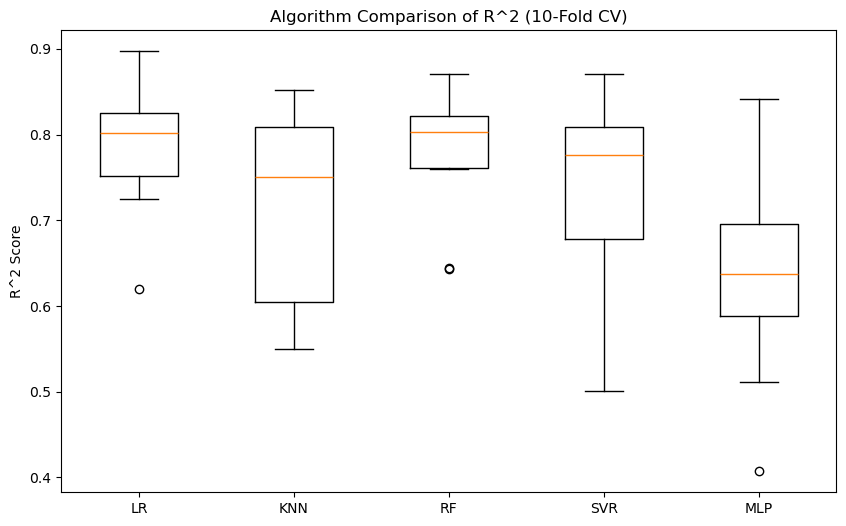

In [203]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_score, KFold
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

y = df_survey_cleaned['BI']
X = df_survey_cleaned[['PU_centered', 'PEOU_centered', 'PE_centered', 'HM_centered', 'SOI_centered', 
                       'SEI_centered', 'PPV_centered','AGE_num', 'Gender_num']]


# Create dummy variables for categorical variables
df_encoded = pd.get_dummies(X, columns=['AGE_num', 'Gender_num'], drop_first=True)
 
# Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_encoded)

# Prepare models
models = [
    ('LR', LinearRegression()),
    ('KNN', KNeighborsRegressor()),
    ('RF', RandomForestRegressor(random_state=42)),
    ('SVR', SVR()),
    ('MLP', MLPRegressor(hidden_layer_sizes=(10), activation='relu', solver='adam',
                         alpha=0.0001, batch_size='auto', learning_rate='constant',
                         learning_rate_init=0.001, max_iter=1000, random_state=42))
]

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Prepare lists to store results
model_names = []
train_r2_list = []
test_r2_list = []
train_mse_list = []
test_mse_list = []
cv_r2_mean_list = []
cv_r2_std_list = []

# Evaluate each model
results = []
for name, model in models:
    # Train the model
    model.fit(X_train, y_train)
    
    # Make predictions
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    
    # Calculate metrics
    train_r2 = r2_score(y_train, y_train_pred)
    test_r2 = r2_score(y_test, y_test_pred)
    train_mse = mean_squared_error(y_train, y_train_pred)
    test_mse = mean_squared_error(y_test, y_test_pred)
    
    # Perform cross-validation
    kfold = KFold(n_splits=10, random_state=42, shuffle=True)
    cv_results = cross_val_score(model, X_scaled, y, cv=kfold, scoring='r2')
    
    # Store results
    results.append(cv_results)
    model_names.append(name)
    train_r2_list.append(train_r2)
    test_r2_list.append(test_r2)
    train_mse_list.append(train_mse)
    test_mse_list.append(test_mse)
    cv_r2_mean_list.append(cv_results.mean())
    cv_r2_std_list.append(cv_results.std())
    
    # Print results
    print(f"{name}:")
    print(f"  Training R^2: {train_r2:.4f}")
    print(f"  Testing R^2: {test_r2:.4f}")
    print(f"  Training MSE: {train_mse:.4f}")
    print(f"  Testing MSE: {test_mse:.4f}")
    print(f"  Cross-validation R^2: {cv_results.mean():.4f} (+/- {cv_results.std() * 2:.4f})")
    print()

# Create DataFrame with results
df_results_O = pd.DataFrame({
    'Model': model_names,
    'Training R^2': train_r2_list,
    'Testing R^2': test_r2_list,
    'Training MSE': train_mse_list,
    'Testing MSE': test_mse_list,
    'CV R^2 Mean': cv_r2_mean_list,
    'CV R^2 Std': cv_r2_std_list
})

# Calculate the CV R^2 range
df_results_O['CV R^2 Range'] = df_results_O.apply(lambda row: f"{row['CV R^2 Mean']:.4f} (+/- {row['CV R^2 Std']*2:.4f})", axis=1)

# Reorder columns
df_results_O = df_results_O[['Model', 'Training R^2', 'Testing R^2', 'Training MSE', 'Testing MSE', 'CV R^2 Range']]

# List of columns to rename
columns_to_rename = ['Training R^2', 'Testing R^2', 'Training MSE', 'Testing MSE', 'CV R^2 Range']

# Create a dictionary for renaming
rename_dict = {col: f'O_{col}' for col in columns_to_rename}

# Rename the columns
df_results_O = df_results_O.rename(columns=rename_dict)

# Reorder the columns to ensure 'Model' is first
new_column_order = ['Model'] + [f'O_{col}' for col in columns_to_rename]
df_results_O = df_results_O[new_column_order]

# Display the DataFrame to verify the changes
print(df_results_O)

# Display the DataFrame
print(df_results_O)

# Optionally, save to a CSV file
# df_results_O.to_csv('model_results.csv', index=False)

# Create boxplot
plt.figure(figsize=(10, 6))
plt.title('Algorithm Comparison of R^2 (10-Fold CV)')
plt.boxplot(results)
plt.xticks(range(1, len(model_names) + 1), model_names)
plt.ylabel('R^2 Score')
plt.show()

LR:
  Training R^2: 0.8323
  Testing R^2: 0.8362
  Training MSE: 0.1301
  Testing MSE: 0.1149
  Cross-validation R^2: 0.7766 (+/- 0.1532)

KNN:
  Training R^2: 0.8518
  Testing R^2: 0.7653
  Training MSE: 0.1150
  Testing MSE: 0.1647
  Cross-validation R^2: 0.7551 (+/- 0.1549)

RF:
  Training R^2: 0.9641
  Testing R^2: 0.8177
  Training MSE: 0.0279
  Testing MSE: 0.1280
  Cross-validation R^2: 0.7782 (+/- 0.1908)

SVR:
  Training R^2: 0.8618
  Testing R^2: 0.8072
  Training MSE: 0.1072
  Testing MSE: 0.1353
  Cross-validation R^2: 0.7381 (+/- 0.1843)

MLP:
  Training R^2: 0.7810
  Testing R^2: 0.5541
  Training MSE: 0.1699
  Testing MSE: 0.3129
  Cross-validation R^2: 0.5249 (+/- 0.3396)

  Model  I_Training R^2  I_Testing R^2  I_Training MSE  I_Testing MSE  \
0    LR        0.832272       0.836207        0.130120       0.114947   
1   KNN        0.851810       0.765261        0.114963       0.164735   
2    RF        0.964069       0.817666        0.027874       0.127959   
3   SVR   

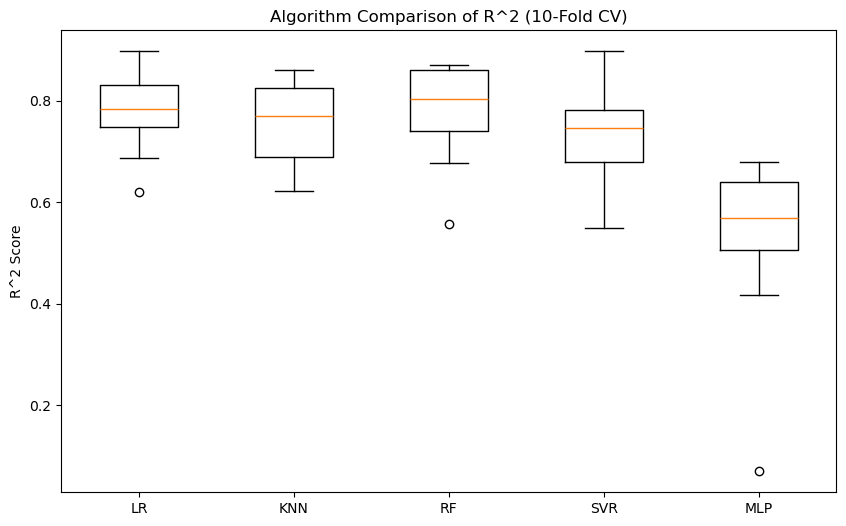

In [204]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_score, KFold
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

y = df_survey_cleaned['BI']
X = df_survey_cleaned[['PU_centered', 'PEOU_centered', 'PE_centered', 'HM_centered', 'SOI_centered', 'SEI_centered', 'PPV_centered',
    'AGE_num','Gender_num','PEAT_centered', 'HMAT_centered', 'HMPU_centered', 'HMPEOU_centered', 'HMSOI_centered', 'HMSEI_centered', 'HMPE_centered',
    'AGEGender_centered', 'GenderPU_centered', 'GenderPEOU_centered', 'GenderAT_centered', 'GenderPPV_centered',
    'GenderPE_centered', 'GenderHM_centered', 'GenderSOI_centered', 'GenderSEI_centered', 'AGEPEOU_centered', 'AGEPU_centered',
    'AGESOI_centered', 'AGESEI_centered', 'AGEPPV_centered', 'AGEHM_centered', 'AGEPE_centered', 'AGEAT_centered', 'PEAT_centered', 'HMAT_centered',
    'HMPU_centered', 'HMPEOU_centered', 'HMSOI_centered', 'HMSEI_centered', 'HMPE_centered']]



# Create dummy variables for categorical variables
df_encoded = pd.get_dummies(X, columns=['AGE_num', 'Gender_num'], drop_first=True)
 
# Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_encoded)

# Prepare models
models = [
    ('LR', LinearRegression()),
    ('KNN', KNeighborsRegressor()),
    ('RF', RandomForestRegressor(random_state=42)),
    ('SVR', SVR()),
    ('MLP', MLPRegressor(hidden_layer_sizes=(10), activation='relu', solver='adam',
                         alpha=0.0001, batch_size='auto', learning_rate='constant',
                         learning_rate_init=0.001, max_iter=1000, random_state=42))
]

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Prepare lists to store results
model_names = []
train_r2_list = []
test_r2_list = []
train_mse_list = []
test_mse_list = []
cv_r2_mean_list = []
cv_r2_std_list = []

# Evaluate each model
results = []
for name, model in models:
    # Train the model
    model.fit(X_train, y_train)
    
    # Make predictions
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    
    # Calculate metrics
    train_r2 = r2_score(y_train, y_train_pred)
    test_r2 = r2_score(y_test, y_test_pred)
    train_mse = mean_squared_error(y_train, y_train_pred)
    test_mse = mean_squared_error(y_test, y_test_pred)
    
    # Perform cross-validation
    kfold = KFold(n_splits=10, random_state=42, shuffle=True)
    cv_results = cross_val_score(model, X_scaled, y, cv=kfold, scoring='r2')
    
    # Store results
    results.append(cv_results)
    model_names.append(name)
    train_r2_list.append(train_r2)
    test_r2_list.append(test_r2)
    train_mse_list.append(train_mse)
    test_mse_list.append(test_mse)
    cv_r2_mean_list.append(cv_results.mean())
    cv_r2_std_list.append(cv_results.std())
    
    # Print results
    print(f"{name}:")
    print(f"  Training R^2: {train_r2:.4f}")
    print(f"  Testing R^2: {test_r2:.4f}")
    print(f"  Training MSE: {train_mse:.4f}")
    print(f"  Testing MSE: {test_mse:.4f}")
    print(f"  Cross-validation R^2: {cv_results.mean():.4f} (+/- {cv_results.std() * 2:.4f})")
    print()

# Create DataFrame with results
df_results_I = pd.DataFrame({
    'Model': model_names,
    'Training R^2': train_r2_list,
    'Testing R^2': test_r2_list,
    'Training MSE': train_mse_list,
    'Testing MSE': test_mse_list,
    'CV R^2 Mean': cv_r2_mean_list,
    'CV R^2 Std': cv_r2_std_list
})

# Calculate the CV R^2 range
df_results_I['CV R^2 Range'] = df_results_I.apply(lambda row: f"{row['CV R^2 Mean']:.4f} (+/- {row['CV R^2 Std']*2:.4f})", axis=1)

# Reorder columns
df_results_I = df_results_I[['Model', 'Training R^2', 'Testing R^2', 'Training MSE', 'Testing MSE', 'CV R^2 Range']]

# List of columns to rename
columns_to_rename = ['Training R^2', 'Testing R^2', 'Training MSE', 'Testing MSE', 'CV R^2 Range']

# Create a dictionary for renaming
rename_dict = {col: f'I_{col}' for col in columns_to_rename}

# Rename the columns
df_results_I = df_results_I.rename(columns=rename_dict)

# Reorder the columns to ensure 'Model' is first
new_column_order = ['Model'] + [f'I_{col}' for col in columns_to_rename]
df_results_I = df_results_I[new_column_order]

# Display the DataFrame to verify the changes
print(df_results_I)

# Display the DataFrame
print(df_results_I)

# Optionally, save to a CSV file
# df_results_O.to_csv('model_results.csv', index=False)

# Create boxplot
plt.figure(figsize=(10, 6))
plt.title('Algorithm Comparison of R^2 (10-Fold CV)')
plt.boxplot(results)
plt.xticks(range(1, len(model_names) + 1), model_names)
plt.ylabel('R^2 Score')
plt.show()

LR:
  Training R^2: 0.8853
  Testing R^2: 0.4254
  Training MSE: 0.0890
  Testing MSE: 0.4033
  Cross-validation R^2: -0.0467 (+/- 1.7637)

KNN:
  Training R^2: 0.8417
  Testing R^2: 0.7854
  Training MSE: 0.1228
  Testing MSE: 0.1506
  Cross-validation R^2: 0.7571 (+/- 0.1701)

RF:
  Training R^2: 0.9646
  Testing R^2: 0.8095
  Training MSE: 0.0274
  Testing MSE: 0.1337
  Cross-validation R^2: 0.7777 (+/- 0.1713)

SVR:
  Training R^2: 0.8523
  Testing R^2: 0.8142
  Training MSE: 0.1146
  Testing MSE: 0.1304
  Cross-validation R^2: 0.7377 (+/- 0.1947)

MLP:
  Training R^2: 0.8597
  Testing R^2: 0.6974
  Training MSE: 0.1089
  Testing MSE: 0.2123
  Cross-validation R^2: 0.2988 (+/- 1.1907)

  Model  P_Training R^2  P_Testing R^2  P_Training MSE  P_Testing MSE  \
0    LR        0.885250       0.425388        0.089021       0.403253   
1   KNN        0.841677       0.785378        0.122824       0.150618   
2    RF        0.964628       0.809520        0.027441       0.133676   
3   SVR  

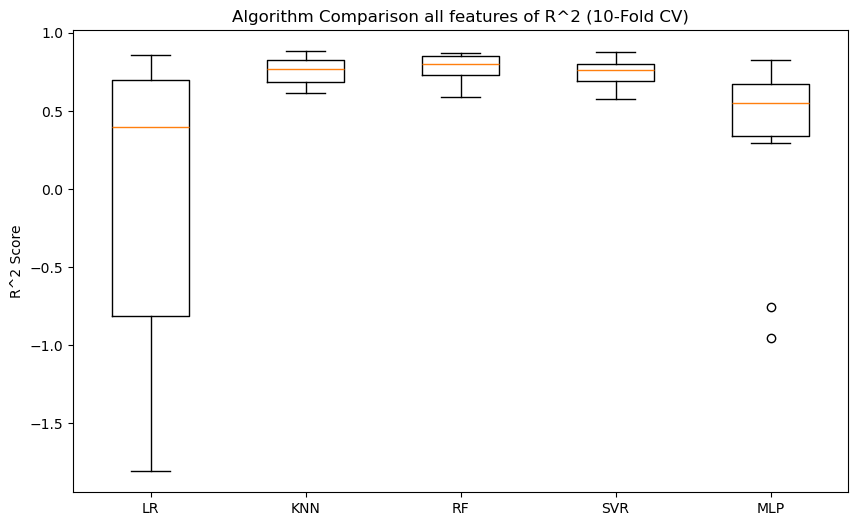

In [205]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_score, KFold
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

y = df_survey_cleaned['BI']
X = df_survey_cleaned[[
    'PU_centered', 'PEOU_centered', 'PE_centered', 'HM_centered', 'SOI_centered', 'SEI_centered', 'PPV_centered', 'AGE_num', 'Gender_num',
    'PEAT_centered', 'HMAT_centered', 'HMPU_centered', 'HMPEOU_centered', 'HMSOI_centered', 'HMSEI_centered', 'HMPE_centered',
    'AGEGender_centered', 'GenderPU_centered', 'GenderPEOU_centered', 'GenderAT_centered', 'GenderPPV_centered',
    'GenderPE_centered', 'GenderHM_centered', 'GenderSOI_centered', 'GenderSEI_centered', 'AGEPEOU_centered', 'AGEPU_centered',
    'AGESOI_centered', 'AGESEI_centered', 'AGEPPV_centered', 'AGEHM_centered', 'AGEPE_centered', 'AGEAT_centered',
    'PE_centered_cubed', 'SOI_centered_squared', 'SOI_centered_cubed', 'SEI_centered_squared', 'SEI_centered_cubed',
    'HM_centered_squared', 'HM_centered_cubed', 'AT_centered_squared', 'AT_centered_cubed', 'PPV_centered_squared', 
    'PPV_centered_cubed', 'PU_centered_squared', 'PU_centered_cubed', 'PEOU_centered_squared', 'PEOU_centered_cubed',
    'AGEGender_centered_squared', 'AGEGender_centered_cubed', 'GenderPU_centered_squared', 'GenderPU_centered_cubed',
    'GenderPEOU_centered_squared', 'GenderPEOU_centered_cubed', 'GenderAT_centered_squared', 'GenderAT_centered_cubed',
    'GenderPPV_centered_squared', 'GenderPPV_centered_cubed', 'GenderPE_centered_squared', 'GenderPE_centered_cubed',
    'GenderHM_centered_squared', 'GenderHM_centered_cubed', 'GenderSOI_centered_squared', 'GenderSOI_centered_cubed',
    'GenderSEI_centered_squared', 'GenderSEI_centered_cubed', 'AGEPEOU_centered_squared', 'AGEPEOU_centered_cubed',
    'AGEPU_centered_squared', 'AGEPU_centered_cubed', 'AGESOI_centered_squared', 'AGESOI_centered_cubed',
    'AGESEI_centered_squared', 'AGESEI_centered_cubed', 'AGEPPV_centered_squared', 'AGEPPV_centered_cubed',
    'AGEHM_centered_squared', 'AGEHM_centered_cubed', 
    'PEAT_centered_squared', 'PEAT_centered_cubed', 'HMAT_centered_squared', 'HMAT_centered_cubed', 'HMPU_centered_squared',
    'HMPU_centered_cubed', 'HMPEOU_centered_squared', 'HMPEOU_centered_cubed', 'HMSOI_centered_squared',
    'HMSOI_centered_cubed', 'HMSEI_centered_squared', 'HMSEI_centered_cubed', 'HMPE_centered_squared', 'HMPE_centered_cubed'

]]



# Create dummy variables for categorical variables
df_encoded = pd.get_dummies(X, columns=['AGE_num', 'Gender_num'], drop_first=True)
 
# Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_encoded)

# Prepare models
models = [
    ('LR', LinearRegression()),
    ('KNN', KNeighborsRegressor()),
    ('RF', RandomForestRegressor(random_state=42)),
    ('SVR', SVR()),
    ('MLP', MLPRegressor(hidden_layer_sizes=(10), activation='relu', solver='adam',
                         alpha=0.0001, batch_size='auto', learning_rate='constant',
                         learning_rate_init=0.001, max_iter=1000, random_state=42))
]

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Prepare lists to store results
model_names = []
train_r2_list = []
test_r2_list = []
train_mse_list = []
test_mse_list = []
cv_r2_mean_list = []
cv_r2_std_list = []

# Evaluate each model
results = []
for name, model in models:
    # Train the model
    model.fit(X_train, y_train)
    
    # Make predictions
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    
    # Calculate metrics
    train_r2 = r2_score(y_train, y_train_pred)
    test_r2 = r2_score(y_test, y_test_pred)
    train_mse = mean_squared_error(y_train, y_train_pred)
    test_mse = mean_squared_error(y_test, y_test_pred)
    
    # Perform cross-validation
    kfold = KFold(n_splits=10, random_state=42, shuffle=True)
    cv_results = cross_val_score(model, X_scaled, y, cv=kfold, scoring='r2')
    
    # Store results
    results.append(cv_results)
    model_names.append(name)
    train_r2_list.append(train_r2)
    test_r2_list.append(test_r2)
    train_mse_list.append(train_mse)
    test_mse_list.append(test_mse)
    cv_r2_mean_list.append(cv_results.mean())
    cv_r2_std_list.append(cv_results.std())
    
    # Print results
    print(f"{name}:")
    print(f"  Training R^2: {train_r2:.4f}")
    print(f"  Testing R^2: {test_r2:.4f}")
    print(f"  Training MSE: {train_mse:.4f}")
    print(f"  Testing MSE: {test_mse:.4f}")
    print(f"  Cross-validation R^2: {cv_results.mean():.4f} (+/- {cv_results.std() * 2:.4f})")
    print()

# Create DataFrame with results
df_results_P = pd.DataFrame({
    'Model': model_names,
    'Training R^2': train_r2_list,
    'Testing R^2': test_r2_list,
    'Training MSE': train_mse_list,
    'Testing MSE': test_mse_list,
    'CV R^2 Mean': cv_r2_mean_list,
    'CV R^2 Std': cv_r2_std_list
})

# Calculate the CV R^2 range
df_results_P['CV R^2 Range'] = df_results_P.apply(lambda row: f"{row['CV R^2 Mean']:.4f} (+/- {row['CV R^2 Std']*2:.4f})", axis=1)

# Reorder columns
df_results_P = df_results_P[['Model', 'Training R^2', 'Testing R^2', 'Training MSE', 'Testing MSE', 'CV R^2 Range']]

# List of columns to rename
columns_to_rename = ['Training R^2', 'Testing R^2', 'Training MSE', 'Testing MSE', 'CV R^2 Range']

# Create a dictionary for renaming
rename_dict = {col: f'P_{col}' for col in columns_to_rename}

# Rename the columns
df_results_P = df_results_P.rename(columns=rename_dict)

# Reorder the columns to ensure 'Model' is first
new_column_order = ['Model'] + [f'P_{col}' for col in columns_to_rename]
df_results_P = df_results_P[new_column_order]

# Display the DataFrame to verify the changes
print(df_results_P)

# Display the DataFrame
print(df_results_P)

# Optionally, save to a CSV file
# df_results_O.to_csv('model_results.csv', index=False)

# Create boxplot
plt.figure(figsize=(10, 6))
plt.title('Algorithm Comparison all features of R^2 (10-Fold CV)')
plt.boxplot(results)
plt.xticks(range(1, len(model_names) + 1), model_names)
plt.ylabel('R^2 Score')
plt.show()

### Use regularization techniques to handle multicollinearity and improve results

## GetPDP Charts to use in Identifyin Non-linear relationships

In [207]:
df_survey_cleaned['AGE_num']

0      3
1      1
2      3
3      1
4      1
5      1
6      1
7      2
8      1
9      2
10     2
11     2
12     1
13     3
14     2
15     1
16     1
17     2
18     1
19     2
20     2
21     1
22     1
23     1
24     1
25     1
26     2
27     1
28     2
29     1
30     2
31     2
32     3
33     1
34     0
35     3
36     2
37     1
38     3
39     1
40     2
41     1
42     1
43     3
44     1
45     1
46     1
47     1
48     1
49     1
50     1
51     2
52     2
53     0
54     2
55     2
56     1
57     1
58     1
59     2
60     1
61     0
62     1
63     3
64     1
65     3
66     1
67     2
68     1
69     1
70     1
71     3
72     2
73     2
74     1
75     2
76     2
77     1
78     1
79     1
80     1
81     1
82     3
83     1
84     0
85     1
86     1
87     1
88     1
89     1
90     1
91     1
92     1
93     1
94     3
95     2
96     1
97     1
98     1
99     1
100    1
101    1
102    1
103    1
104    1
105    1
106    1
107    1
108    1
109    1
110    1
1

In [208]:
X

,PU_centered,PEOU_centered,PE_centered,HM_centered,SOI_centered,SEI_centered,PPV_centered,AGE_num,Gender_num,PEAT_centered,HMAT_centered,HMPU_centered,HMPEOU_centered,HMSOI_centered,HMSEI_centered,HMPE_centered,AGEGender_centered,GenderPU_centered,GenderPEOU_centered,GenderAT_centered,GenderPPV_centered,GenderPE_centered,GenderHM_centered,GenderSOI_centered,GenderSEI_centered,AGEPEOU_centered,AGEPU_centered,AGESOI_centered,AGESEI_centered,AGEPPV_centered,AGEHM_centered,AGEPE_centered,AGEAT_centered,PE_centered_cubed,SOI_centered_squared,SOI_centered_cubed,SEI_centered_squared,SEI_centered_cubed,HM_centered_squared,HM_centered_cubed,AT_centered_squared,AT_centered_cubed,PPV_centered_squared,PPV_centered_cubed,PU_centered_squared,PU_centered_cubed,PEOU_centered_squared,PEOU_centered_cubed,AGEGender_centered_squared,AGEGender_centered_cubed,GenderPU_centered_squared,GenderPU_centered_cubed,GenderPEOU_centered_squared,GenderPEOU_centered_cubed,GenderAT_centered_squared,GenderAT_centered_cubed,GenderPPV_centered_squared,GenderPPV_centered_cubed,GenderPE_centered_squared,GenderPE_centered_cubed,GenderHM_centered_squared,GenderHM_centered_cubed,GenderSOI_centered_squared,GenderSOI_centered_cubed,GenderSEI_centered_squared,GenderSEI_centered_cubed,AGEPEOU_centered_squared,AGEPEOU_centered_cubed,AGEPU_centered_squared,AGEPU_centered_cubed,AGESOI_centered_squared,AGESOI_centered_cubed,AGESEI_centered_squared,AGESEI_centered_cubed,AGEPPV_centered_squared,AGEPPV_centered_cubed,AGEHM_centered_squared,AGEHM_centered_cubed,PEAT_centered_squared,PEAT_centered_cubed,HMAT_centered_squared,HMAT_centered_cubed,HMPU_centered_squared,HMPU_centered_cubed,HMPEOU_centered_squared,HMPEOU_centered_cubed,HMSOI_centered_squared,HMSOI_centered_cubed,HMSEI_centered_squared,HMSEI_centered_cubed,HMPE_centered_squared,HMPE_centered_cubed
0,-0.568396,0.304245,0.205189,0.130503,-0.714033,-0.723270,0.211478,3,0,-0.034198,-0.021751,-0.074177,0.039705,-0.093184,-0.094389,0.026778,0,-0.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,-0.000000,-0.000000,0.912736,-1.705189,-2.142099,-2.169811,0.634434,0.391509,0.615566,-0.500000,0.008639,0.509843,-0.364045,0.523120,-0.378357,0.017031,0.002223,0.027778,-0.004630,0.044723,0.009458,0.323074,-0.183634,0.092565,0.028163,0,0,0.000000,-0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,-0.000000,0.833087,0.760388,2.907668,-4.958123,4.588588,-9.829211,4.708081,-10.215648,0.402506,0.255364,0.153280,0.060010,0.001170,-3.999507e-05,0.000473,-0.000010,0.005502,-4.081469e-04,0.001576,6.259426e-05,0.008683,-8.091291e-04,0.008909,-8.409401e-04,0.000717,1.920097e-05
1,-0.818396,-0.695755,-0.794811,-0.869497,-0.714033,-0.723270,-0.788522,1,1,0.662343,0.724581,0.711593,0.604957,0.620849,0.628881,0.691086,1,-0.818396,-0.695755,-0.833333,-0.788522,-0.794811,-0.869497,-0.714033,-0.723270,-0.695755,-0.818396,-0.714033,-0.723270,-0.788522,-0.869497,-0.794811,-0.833333,-0.502102,0.509843,-0.364045,0.523120,-0.378357,0.756025,-0.657361,0.694444,-0.578704,0.621767,-0.490277,0.669772,-0.548139,0.484075,-0.336797,1,1,0.669772,-0.548139,0.484075,-0.336797,0.694444,-0.578704,0.621767,-0.490277,0.631725,-0.502102,0.756025,-0.657361,0.509843,-0.364045,0.523120,-0.378357,0.484075,-0.336797,0.669772,-0.548139,0.509843,-0.364045,0.523120,-0.378357,0.621767,-0.490277,0.756025,-0.657361,0.438698,2.905684e-01,0.525017,0.380417,0.506365,3.603254e-01,0.365972,2.213974e-01,0.385454,2.393089e-01,0.395492,2.487174e-01,0.477600,3.300625e-01
2,0.181604,0.304245,0.205189,0.130503,0.285967,0.276730,0.211478,3,0,0.034198,0.021751,0.023700,0.039705,0.037320,0.036114,0.026778,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.912736,0.544811,0.857901,0.830189,0.634434,0.391509,0.615566,0.500000,0.008639,0.081777,0.023386,0.076579,0.021192,0.017031,0.002223,0.027778,0.004630,0.044723,0.009458,0.032980,0.005989,0.092565,0.028163,0,0,0.000000,0.000000,0.000000,0.00

## Get Feature importance and PDP for LR, KNN, RF, SVR, and MLP

### Get Feature Importance and PDP for MLR - tentative list of features obtained from above

Multiple Linear Regression Results (5-fold Cross-Validation):
--------------------------------
Training MSE: 0.1230 (+/- 0.0104)
Training R^2: 0.8373 (+/- 0.0230)
Testing MSE: 0.1587 (+/- 0.0618)
Testing R^2: 0.7546 (+/- 0.1813)

Top 10 Feature Importances:
                    feature  importance
4               HM_centered    0.412766
8             HMAT_centered    0.263785
17            HMPU_centered    0.145921
9         GenderHM_centered    0.120374
7              PPV_centered    0.106204
20          AGESOI_centered    0.103773
10            HMPE_centered    0.101528
2               AT_centered    0.095479
12     SEI_centered_squared    0.093124
16  GenderHM_centered_cubed    0.092203


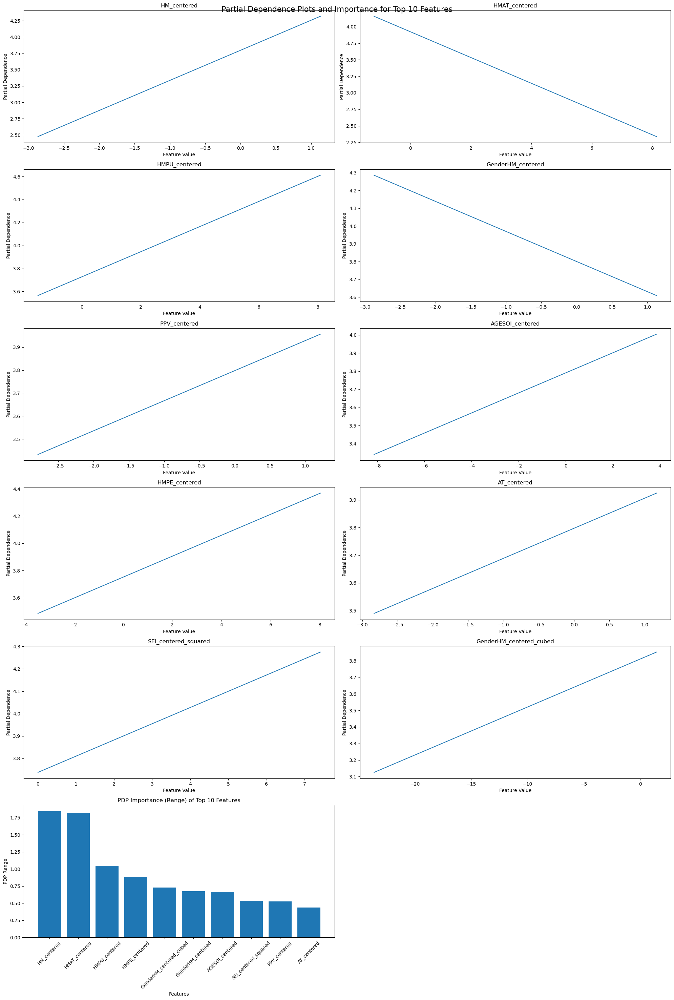


MLR Partial Dependence Values for Top 10 Features:

Feature: HM_centered
PDP values:
  -2.87: 2.4753
  -2.54: 2.6289
  -2.20: 2.7825
  -1.87: 2.9362
  -1.54: 3.0898
  -1.20: 3.2434
  -0.87: 3.3970
  -0.54: 3.5507
  -0.20: 3.7043
  0.13: 3.8579
  0.46: 4.0115
  0.80: 4.1651
  1.13: 4.3188

Feature: HMAT_centered
PDP values:
  -1.20: 4.1570
  -1.01: 4.1217
  -0.72: 4.0651
  -0.63: 4.0458
  -0.57: 4.0341
  -0.45: 4.0110
  -0.43: 4.0086
  -0.40: 4.0016
  -0.31: 3.9846
  -0.27: 3.9761
  -0.23: 3.9691
  -0.20: 3.9629
  -0.19: 3.9606
  -0.17: 3.9568
  -0.14: 3.9521
  -0.13: 3.9497
  -0.11: 3.9450
  -0.10: 3.9436
  -0.08: 3.9389
  -0.07: 3.9366
  -0.03: 3.9304
  -0.02: 3.9281
  0.02: 3.9196
  0.03: 3.9172
  0.07: 3.9111
  0.08: 3.9088
  0.09: 3.9064
  0.10: 3.9041
  0.11: 3.9026
  0.13: 3.8979
  0.14: 3.8956
  0.15: 3.8941
  0.17: 3.8909
  0.19: 3.8871
  0.20: 3.8847
  0.23: 3.8786
  0.24: 3.8777
  0.26: 3.8739
  0.27: 3.8716
  0.39: 3.8485
  0.40: 3.8461
  0.43: 3.8391
  0.54: 3.8183
  0.57:

In [209]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import cross_validate
from sklearn.linear_model import LinearRegression
from sklearn.inspection import PartialDependenceDisplay, partial_dependence
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

feature_vars = [
    # Core constructs
    'PEOU_centered', 'PU_centered', 'AT_centered', 'PE_centered',
    'HM_centered', 'SOI_centered', 'SEI_centered', 'PPV_centered',
    
    # Demographic variables
    'AGE_num', 'Gender_num',
    
    # Top performing interaction terms
    'HMAT_centered', 'GenderHM_centered', 'HMPE_centered', 'AGEPEOU_centered_squared',
    
    # Top performing polynomial terms
    'SEI_centered_squared', 'SOI_centered_squared', 'GenderSEI_centered_cubed',
    'HMSOI_centered_cubed', 'GenderHM_centered_cubed',
    
    # Additional terms to consider
    'HMPU_centered', 'HMPEOU_centered', 'HMSOI_centered', 'AGESOI_centered', 'AGEPPV_centered'
]
     
X = df_survey_cleaned[feature_vars]
y = df_survey_cleaned['BI']

# Create dummy variables for categorical variables
df_encoded = pd.get_dummies(X, columns=['AGE_num', 'Gender_num'], drop_first=True)

# Create a pipeline that includes scaling and the model
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('model', LinearRegression())
])

# Perform cross-validation
cv_results = cross_validate(pipeline, df_encoded, y, cv=5, 
                            scoring=('neg_mean_squared_error', 'r2'),
                            return_train_score=True)

# Calculate mean and std of the scores
train_mse = -cv_results['train_neg_mean_squared_error']
test_mse = -cv_results['test_neg_mean_squared_error']
train_r2 = cv_results['train_r2']
test_r2 = cv_results['test_r2']

print("Multiple Linear Regression Results (5-fold Cross-Validation):")
print("--------------------------------")
print(f"Training MSE: {train_mse.mean():.4f} (+/- {train_mse.std() * 2:.4f})")
print(f"Training R^2: {train_r2.mean():.4f} (+/- {train_r2.std() * 2:.4f})")
print(f"Testing MSE: {test_mse.mean():.4f} (+/- {test_mse.std() * 2:.4f})")
print(f"Testing R^2: {test_r2.mean():.4f} (+/- {test_r2.std() * 2:.4f})")

# Fit the model on the entire dataset for feature importance and PDP
pipeline.fit(df_encoded, y)
model = pipeline.named_steps['model']

# Feature importance (for MLR, we'll use the absolute values of coefficients)
feature_importance = pd.DataFrame({'feature': df_encoded.columns, 'importance': np.abs(model.coef_)})
feature_importance = feature_importance.sort_values('importance', ascending=False)

print("\nTop 10 Feature Importances:")
print(feature_importance.head(10))

# Calculate PDP values for top 10 features
top_10_features = feature_importance['feature'].head(10).tolist()
pdp_values = {}
pdp_ranges = {}

for feature in top_10_features:
    pdp = partial_dependence(pipeline, df_encoded, [feature], kind="average")
    pdp_values[feature] = (pdp["values"][0], pdp["average"][0])
    pdp_ranges[feature] = np.ptp(pdp["average"][0])  # Range of PDP values

# Sort features by PDP range
sorted_features = sorted(pdp_ranges.items(), key=lambda x: x[1], reverse=True)

# Plot PDP for top 10 features
fig, axes = plt.subplots(6, 2, figsize=(20, 30))
fig.suptitle("Partial Dependence Plots and Importance for Top 10 Features", fontsize=16)

for i, (feature, (x, y)) in enumerate(pdp_values.items()):
    row = i // 2
    col = i % 2
    axes[row, col].plot(x, y)
    axes[row, col].set_title(feature)
    axes[row, col].set_xlabel("Feature Value")
    axes[row, col].set_ylabel("Partial Dependence")Analysis of the results

# Create bar plot of PDP importance
feature_names = [f[0] for f in sorted_features]
importance_values = [f[1] for f in sorted_features]

axes[5, 0].bar(feature_names, importance_values)
axes[5, 0].set_title("PDP Importance (Range) of Top 10 Features")
axes[5, 0].set_xlabel("Features")
axes[5, 0].set_ylabel("PDP Range")
axes[5, 0].tick_params(axis='x', rotation=45)

# Remove the unused subplot
fig.delaxes(axes[5, 1])

plt.tight_layout()
plt.show()

# Print PDP values
print("\nMLR Partial Dependence Values for Top 10 Features:")
for feature, (x, y) in pdp_values.items():
    print(f"\nFeature: {feature}")
    print("PDP values:")
    for val, pdp_val in zip(x, y):
        print(f"  {val:.2f}: {pdp_val:.4f}")

# Print PDP importance (range)
print("\nPDP Importance (Range) for Top 10 Features:")
for feature, importance in sorted_features:
    print(f"{feature}: {importance:.4f}")

### Get Feature Importance and PDP for Random Forest - tentative list of features obtained from above

Random Forest Regressor Results (5-fold Cross-Validation):
--------------------------------
Training MSE: 0.0250 (+/- 0.0041)
Training R^2: 0.9669 (+/- 0.0065)
Testing MSE: 0.1665 (+/- 0.0729)
Testing R^2: 0.7402 (+/- 0.2132)

Top 10 Feature Importances:
            feature  importance
4       HM_centered    0.502863
1       PU_centered    0.067265
10    HMAT_centered    0.063698
12    HMPE_centered    0.056314
2       AT_centered    0.049814
19    HMPU_centered    0.035089
6      SEI_centered    0.031687
7      PPV_centered    0.020280
20  HMPEOU_centered    0.020086
3       PE_centered    0.018159


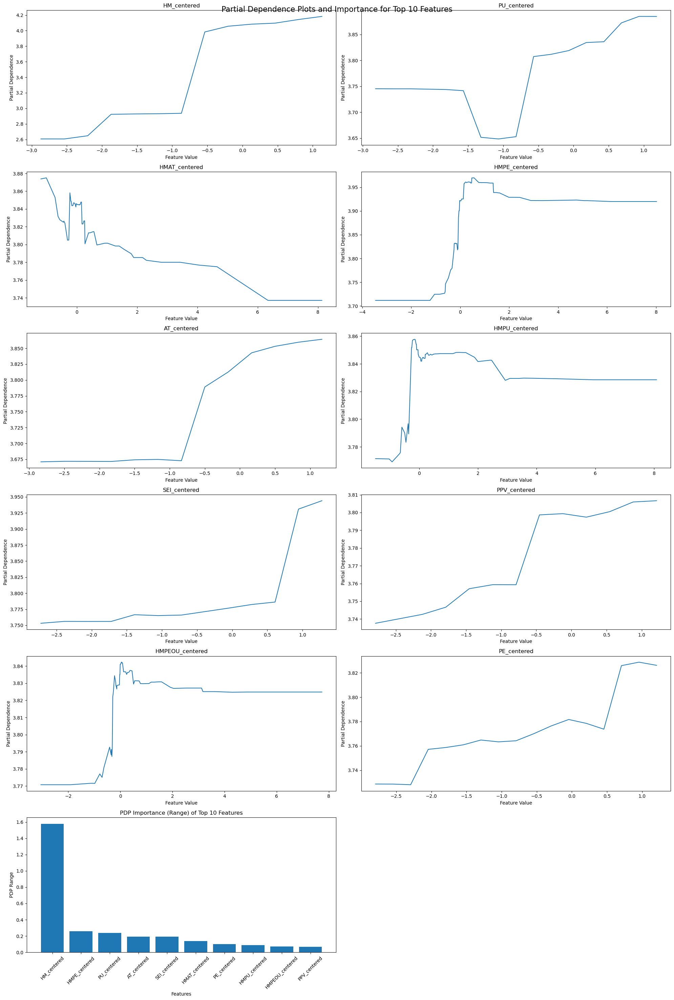


RF Partial Dependence Values for Top 10 Features:

Feature: HM_centered
PDP values:
  -2.87: 2.6060
  -2.54: 2.6058
  -2.20: 2.6471
  -1.87: 2.9233
  -1.54: 2.9277
  -1.20: 2.9306
  -0.87: 2.9359
  -0.54: 3.9831
  -0.20: 4.0570
  0.13: 4.0835
  0.46: 4.0966
  0.80: 4.1433
  1.13: 4.1833

Feature: PU_centered
PDP values:
  -2.82: 3.7453
  -2.57: 3.7452
  -2.32: 3.7452
  -2.07: 3.7445
  -1.82: 3.7438
  -1.57: 3.7416
  -1.32: 3.6516
  -1.07: 3.6484
  -0.82: 3.6528
  -0.57: 3.8074
  -0.32: 3.8118
  -0.07: 3.8190
  0.18: 3.8345
  0.43: 3.8361
  0.68: 3.8725
  0.93: 3.8850
  1.18: 3.8849

Feature: HMAT_centered
PDP values:
  -1.20: 3.8738
  -1.01: 3.8751
  -0.72: 3.8530
  -0.63: 3.8316
  -0.57: 3.8278
  -0.45: 3.8251
  -0.43: 3.8264
  -0.40: 3.8241
  -0.31: 3.8049
  -0.27: 3.8050
  -0.23: 3.8582
  -0.20: 3.8489
  -0.19: 3.8487
  -0.17: 3.8437
  -0.14: 3.8437
  -0.13: 3.8439
  -0.11: 3.8470
  -0.10: 3.8470
  -0.08: 3.8464
  -0.07: 3.8461
  -0.03: 3.8423
  -0.02: 3.8460
  0.02: 3.8449
  0.03:

In [210]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import cross_validate
from sklearn.ensemble import RandomForestRegressor
from sklearn.inspection import PartialDependenceDisplay, partial_dependence
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

feature_vars = [
    # Core constructs
    'PEOU_centered',
    'PU_centered',
    'AT_centered',
    'PE_centered',
    'HM_centered',
    'SOI_centered',
    'SEI_centered',
    'PPV_centered',
    
    # Demographic variables
    'AGE_num',
    'Gender_num',
    
    # Top performing interaction terms
    'HMAT_centered',
    'GenderHM_centered',
    'HMPE_centered',
    'AGEPEOU_centered_squared',
    
    # Top performing polynomial terms
    'SEI_centered_squared',
    'SOI_centered_squared',
    'GenderSEI_centered_cubed',
    'HMSOI_centered_cubed',
    'GenderHM_centered_cubed',
    
    # Additional terms to consider
    'HMPU_centered',
    'HMPEOU_centered',
    'HMSOI_centered',
    'AGESOI_centered',
    'AGEPPV_centered'
]
     
X=  df_survey_cleaned[feature_vars]
y= df_survey_cleaned['BI']

# Create dummy variables for categorical variables
df_encoded = pd.get_dummies(X, columns=['AGE_num', 'Gender_num'], drop_first=True)

# Create a pipeline that includes scaling and the model
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('model', RandomForestRegressor(n_estimators=100, random_state=42))
])

# Perform cross-validation
cv_results = cross_validate(pipeline, df_encoded, y, cv=5, 
                            scoring=('neg_mean_squared_error', 'r2'),
                            return_train_score=True)

# Calculate mean and std of the scores
train_mse = -cv_results['train_neg_mean_squared_error']
test_mse = -cv_results['test_neg_mean_squared_error']
train_r2 = cv_results['train_r2']
test_r2 = cv_results['test_r2']

print("Random Forest Regressor Results (5-fold Cross-Validation):")
print("--------------------------------")
print(f"Training MSE: {train_mse.mean():.4f} (+/- {train_mse.std() * 2:.4f})")
print(f"Training R^2: {train_r2.mean():.4f} (+/- {train_r2.std() * 2:.4f})")
print(f"Testing MSE: {test_mse.mean():.4f} (+/- {test_mse.std() * 2:.4f})")
print(f"Testing R^2: {test_r2.mean():.4f} (+/- {test_r2.std() * 2:.4f})")

# Fit the model on the entire dataset for feature importance and PDP
pipeline.fit(X, y)
model = pipeline.named_steps['model']

# Feature importance
feature_importance = pd.DataFrame({'feature': feature_vars, 'importance': model.feature_importances_})
feature_importance = feature_importance.sort_values('importance', ascending=False)

print("\nTop 10 Feature Importances:")
print(feature_importance.head(10))

# Calculate PDP values for top 10 features
top_10_features = feature_importance['feature'].head(10).tolist()
pdp_values = {}
pdp_ranges = {}

for feature in top_10_features:
    pdp = partial_dependence(model, X, [feature], kind="average")
    pdp_values[feature] = (pdp["values"][0], pdp["average"][0])
    pdp_ranges[feature] = np.ptp(pdp["average"][0])  # Range of PDP values

# Sort features by PDP range
sorted_features = sorted(pdp_ranges.items(), key=lambda x: x[1], reverse=True)

# Plot PDP for top 10 features
fig, axes = plt.subplots(6, 2, figsize=(20, 30))
fig.suptitle("Partial Dependence Plots and Importance for Top 10 Features", fontsize=16)

for i, (feature, (x, y)) in enumerate(pdp_values.items()):
    row = i // 2
    col = i % 2
    axes[row, col].plot(x, y)
    axes[row, col].set_title(feature)
    axes[row, col].set_xlabel("Feature Value")
    axes[row, col].set_ylabel("Partial Dependence")

# Create bar plot of PDP importance
feature_names = [f[0] for f in sorted_features]
importance_values = [f[1] for f in sorted_features]

axes[5, 0].bar(feature_names, importance_values)
axes[5, 0].set_title("PDP Importance (Range) of Top 10 Features")
axes[5, 0].set_xlabel("Features")
axes[5, 0].set_ylabel("PDP Range")
axes[5, 0].tick_params(axis='x', rotation=45)

# Remove the unused subplot
fig.delaxes(axes[5, 1])

plt.tight_layout()
plt.show()

# Print PDP values
print("\nRF Partial Dependence Values for Top 10 Features:")
for feature, (x, y) in pdp_values.items():
    print(f"\nFeature: {feature}")
    print("PDP values:")
    for val, pdp_val in zip(x, y):
        print(f"  {val:.2f}: {pdp_val:.4f}")

# Print PDP importance (range)
print("\nPDP Importance (Range) for Top 10 Features:")
for feature, importance in sorted_features:
    print(f"{feature}: {importance:.4f}")

### Get Feature Importance and PDP for KNN  - tentative list of features obtained from above

K-Nearest Neighbors Regressor Results (5-fold Cross-Validation):
--------------------------------
Training MSE: 0.1182 (+/- 0.0151)
Training R^2: 0.8438 (+/- 0.0210)
Testing MSE: 0.2038 (+/- 0.0813)
Testing R^2: 0.6884 (+/- 0.2232)

Top 10 Feature Importances (Permutation Importance):
                 feature  importance
9             Gender_num    0.016194
4            HM_centered    0.015050
0          PEOU_centered    0.014419
2            AT_centered    0.013565
6           SEI_centered    0.012808
8                AGE_num    0.012535
14  SEI_centered_squared    0.011632
10         HMAT_centered    0.009586
3            PE_centered    0.008538
11     GenderHM_centered    0.008493


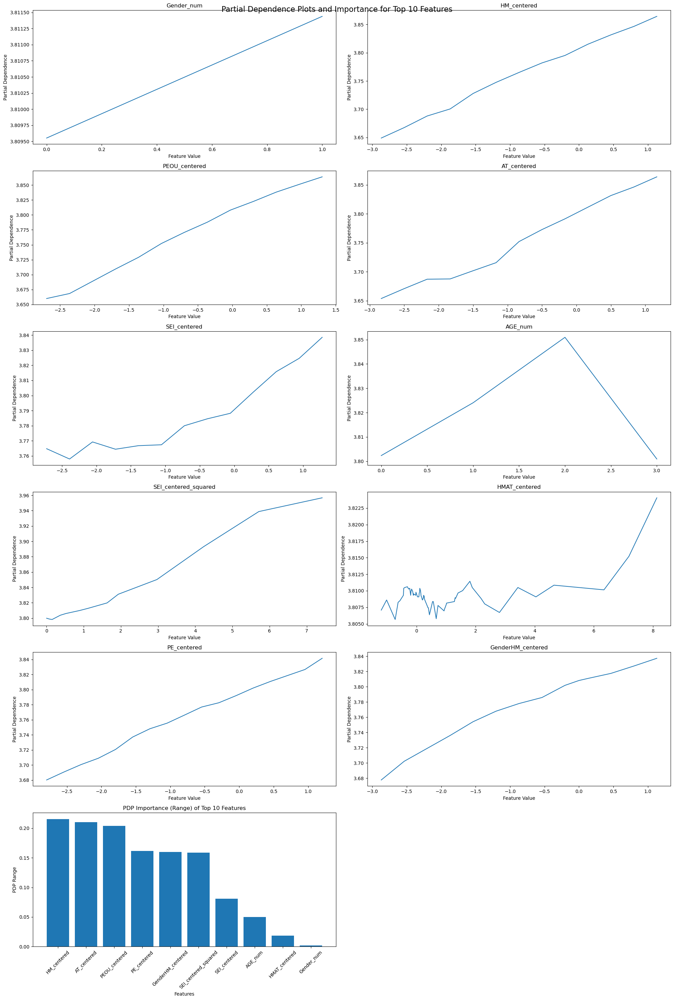


KNN Partial Dependence Values for Top 10 Features:

Feature: Gender_num
PDP values:
  0.00: 3.8096
  1.00: 3.8114

Feature: HM_centered
PDP values:
  -2.87: 3.6489
  -2.54: 3.6675
  -2.20: 3.6880
  -1.87: 3.7005
  -1.54: 3.7278
  -1.20: 3.7475
  -0.87: 3.7651
  -0.54: 3.7820
  -0.20: 3.7952
  0.13: 3.8151
  0.46: 3.8316
  0.80: 3.8466
  1.13: 3.8644

Feature: PEOU_centered
PDP values:
  -2.70: 3.6599
  -2.36: 3.6683
  -2.03: 3.6888
  -1.70: 3.7093
  -1.36: 3.7289
  -1.03: 3.7521
  -0.70: 3.7708
  -0.36: 3.7879
  -0.03: 3.8080
  0.30: 3.8225
  0.64: 3.8382
  0.97: 3.8512
  1.30: 3.8638

Feature: AT_centered
PDP values:
  -2.83: 3.6538
  -2.50: 3.6709
  -2.17: 3.6871
  -1.83: 3.6876
  -1.50: 3.7018
  -1.17: 3.7157
  -0.83: 3.7521
  -0.50: 3.7729
  -0.17: 3.7914
  0.17: 3.8116
  0.50: 3.8316
  0.83: 3.8463
  1.17: 3.8639

Feature: SEI_centered
PDP values:
  -2.72: 3.7647
  -2.39: 3.7579
  -2.06: 3.7692
  -1.72: 3.7644
  -1.39: 3.7667
  -1.06: 3.7673
  -0.72: 3.7800
  -0.39: 3.7846
  -0.0

In [211]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import cross_validate
from sklearn.neighbors import KNeighborsRegressor
from sklearn.inspection import PartialDependenceDisplay, partial_dependence
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.inspection import permutation_importance

feature_vars = feature_vars = [
    # Core constructs
    'PEOU_centered',
    'PU_centered',
    'AT_centered',
    'PE_centered',
    'HM_centered',
    'SOI_centered',
    'SEI_centered',
    'PPV_centered',
    
    # Demographic variables
    'AGE_num',
    'Gender_num',
    
    # Top performing interaction terms
    'HMAT_centered',
    'GenderHM_centered',
    'HMPE_centered',
    'AGEPEOU_centered_squared',
    
    # Top performing polynomial terms
    'SEI_centered_squared',
    'SOI_centered_squared',
    'GenderSEI_centered_cubed',
    'HMSOI_centered_cubed',
    'GenderHM_centered_cubed',
    
    # Additional terms to consider
    'HMPU_centered',
    'HMPEOU_centered',
    'HMSOI_centered',
    'AGESOI_centered',
    'AGEPPV_centered'
]
  

X = df_survey_cleaned[feature_vars]
y = df_survey_cleaned['BI']

# Create dummy variables for categorical variables
df_encoded = pd.get_dummies(X, columns=['AGE_num', 'Gender_num'], drop_first=True)

# Create a pipeline that includes scaling and the model
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('model', KNeighborsRegressor(n_neighbors=5))  # You can adjust n_neighbors as needed
])

# Perform cross-validation
cv_results = cross_validate(pipeline, df_encoded, y, cv=5, 
                            scoring=('neg_mean_squared_error', 'r2'),
                            return_train_score=True)

# Calculate mean and std of the scores
train_mse = -cv_results['train_neg_mean_squared_error']
test_mse = -cv_results['test_neg_mean_squared_error']
train_r2 = cv_results['train_r2']
test_r2 = cv_results['test_r2']

print("K-Nearest Neighbors Regressor Results (5-fold Cross-Validation):")
print("--------------------------------")
print(f"Training MSE: {train_mse.mean():.4f} (+/- {train_mse.std() * 2:.4f})")
print(f"Training R^2: {train_r2.mean():.4f} (+/- {train_r2.std() * 2:.4f})")
print(f"Testing MSE: {test_mse.mean():.4f} (+/- {test_mse.std() * 2:.4f})")
print(f"Testing R^2: {test_r2.mean():.4f} (+/- {test_r2.std() * 2:.4f})")

# Fit the model on the entire dataset for feature importance and PDP
pipeline.fit(X, y)
model = pipeline.named_steps['model']

# Use permutation importance instead of feature_importances_
perm_importance = permutation_importance(pipeline, X, y, n_repeats=10, random_state=42)
feature_importance = pd.DataFrame({'feature': feature_vars, 'importance': perm_importance.importances_mean})
feature_importance = feature_importance.sort_values('importance', ascending=False)

print("\nTop 10 Feature Importances (Permutation Importance):")
print(feature_importance.head(10))

# Calculate PDP values for top 10 features
top_10_features = feature_importance['feature'].head(10).tolist()
pdp_values = {}
pdp_ranges = {}

for feature in top_10_features:
    pdp = partial_dependence(pipeline, X, [feature], kind="average")
    pdp_values[feature] = (pdp["values"][0], pdp["average"][0])
    pdp_ranges[feature] = np.ptp(pdp["average"][0])  # Range of PDP values

# Sort features by PDP range
sorted_features = sorted(pdp_ranges.items(), key=lambda x: x[1], reverse=True)

# Plot PDP for top 10 features
fig, axes = plt.subplots(6, 2, figsize=(20, 30))
fig.suptitle("Partial Dependence Plots and Importance for Top 10 Features", fontsize=16)

for i, (feature, (x, y)) in enumerate(pdp_values.items()):
    row = i // 2
    col = i % 2
    axes[row, col].plot(x, y)
    axes[row, col].set_title(feature)
    axes[row, col].set_xlabel("Feature Value")
    axes[row, col].set_ylabel("Partial Dependence")

# Create bar plot of PDP importance
feature_names = [f[0] for f in sorted_features]
importance_values = [f[1] for f in sorted_features]

axes[5, 0].bar(feature_names, importance_values)
axes[5, 0].set_title("PDP Importance (Range) of Top 10 Features")
axes[5, 0].set_xlabel("Features")
axes[5, 0].set_ylabel("PDP Range")
axes[5, 0].tick_params(axis='x', rotation=45)

# Remove the unused subplot
fig.delaxes(axes[5, 1])

plt.tight_layout()
plt.show()

# Print PDP values
print("\nKNN Partial Dependence Values for Top 10 Features:")
for feature, (x, y) in pdp_values.items():
    print(f"\nFeature: {feature}")
    print("PDP values:")
    for val, pdp_val in zip(x, y):
        print(f"  {val:.2f}: {pdp_val:.4f}")

# Print PDP importance (range)
print("\nPDP Importance (Range) for Top 10 Features:")
for feature, importance in sorted_features:
    print(f"{feature}: {importance:.4f}")

### Get SVR Feature Importance and PDP for SVR  - tentative list of features obtained from above

SVR Results (5-fold Cross-Validation):
--------------------------------
Training MSE: 0.0995 (+/- 0.0094)
Training R^2: 0.8684 (+/- 0.0181)
Testing MSE: 0.2185 (+/- 0.1376)
Testing R^2: 0.6887 (+/- 0.1159)

Top 10 Feature Importances (Permutation Importance):
                     feature  importance
4                HM_centered    0.151754
16   GenderHM_centered_cubed    0.081480
8              HMAT_centered    0.075764
1                PU_centered    0.074010
15      HMSOI_centered_cubed    0.068834
19            HMSOI_centered    0.065360
14  GenderSEI_centered_cubed    0.062818
7               PPV_centered    0.059897
17             HMPU_centered    0.058462
12      SEI_centered_squared    0.056128


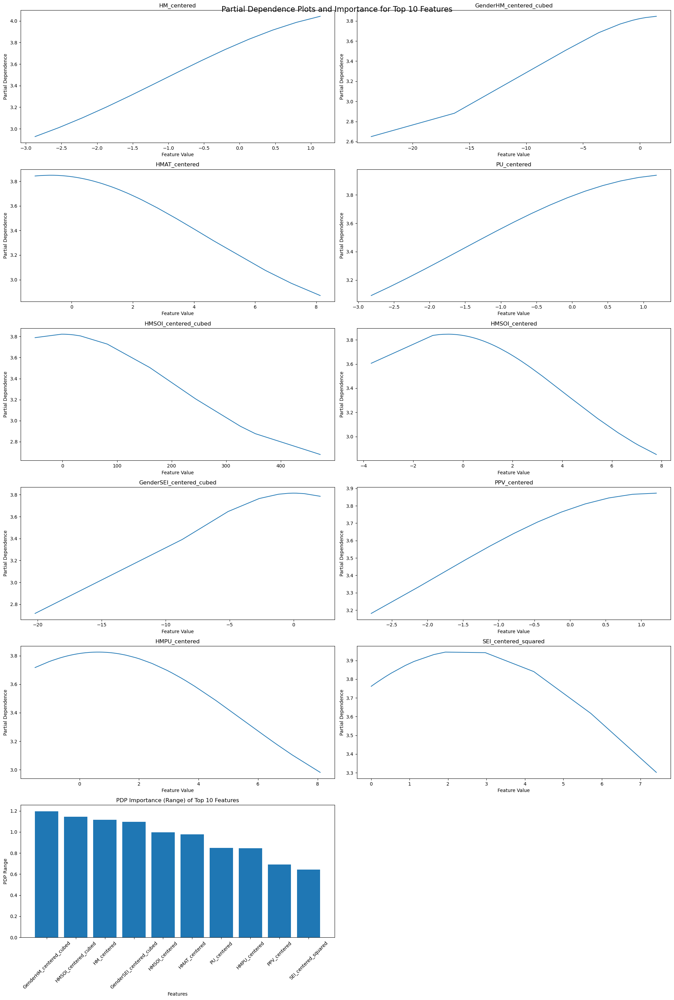


SVR Partial Dependence Values for Top 10 Features:

Feature: HM_centered
PDP values:
  -2.87: 2.9274
  -2.54: 3.0103
  -2.20: 3.1020
  -1.87: 3.2011
  -1.54: 3.3060
  -1.20: 3.4144
  -0.87: 3.5239
  -0.54: 3.6317
  -0.20: 3.7347
  0.13: 3.8301
  0.46: 3.9150
  0.80: 3.9866
  1.13: 4.0429

Feature: GenderHM_centered_cubed
PDP values:
  -23.63: 2.6498
  -16.31: 2.8819
  -6.53: 3.5074
  -3.63: 3.6828
  -1.74: 3.7690
  -0.66: 3.8056
  -0.15: 3.8191
  -0.01: 3.8225
  0.00: 3.8227
  0.00: 3.8228
  0.10: 3.8250
  0.51: 3.8331
  1.44: 3.8457

Feature: HMAT_centered
PDP values:
  -1.20: 3.8429
  -1.01: 3.8466
  -0.72: 3.8491
  -0.63: 3.8490
  -0.57: 3.8487
  -0.45: 3.8476
  -0.43: 3.8474
  -0.40: 3.8470
  -0.31: 3.8455
  -0.27: 3.8446
  -0.23: 3.8439
  -0.20: 3.8431
  -0.19: 3.8428
  -0.17: 3.8424
  -0.14: 3.8417
  -0.13: 3.8414
  -0.11: 3.8407
  -0.10: 3.8405
  -0.08: 3.8398
  -0.07: 3.8394
  -0.03: 3.8385
  -0.02: 3.8381
  0.02: 3.8366
  0.03: 3.8362
  0.07: 3.8350
  0.08: 3.8346
  0.09: 3.8

In [212]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import cross_validate
from sklearn.svm import SVR
from sklearn.inspection import PartialDependenceDisplay, partial_dependence
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

feature_vars = [
    # Core constructs
    'PEOU_centered', 'PU_centered', 'AT_centered', 'PE_centered',
    'HM_centered', 'SOI_centered', 'SEI_centered', 'PPV_centered',
    
    # Demographic variables
    'AGE_num', 'Gender_num',
    
    # Top performing interaction terms
    'HMAT_centered', 'GenderHM_centered', 'HMPE_centered', 'AGEPEOU_centered_squared',
    
    # Top performing polynomial terms
    'SEI_centered_squared', 'SOI_centered_squared', 'GenderSEI_centered_cubed',
    'HMSOI_centered_cubed', 'GenderHM_centered_cubed',
    
    # Additional terms to consider
    'HMPU_centered', 'HMPEOU_centered', 'HMSOI_centered', 'AGESOI_centered', 'AGEPPV_centered'
]
     
X = df_survey_cleaned[feature_vars]
y = df_survey_cleaned['BI']

# Create dummy variables for categorical variables
df_encoded = pd.get_dummies(X, columns=['AGE_num', 'Gender_num'], drop_first=True)

# Create a pipeline that includes scaling and the model
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('model', SVR(kernel='rbf', C=1.0, epsilon=0.1))
])

# Perform cross-validation
cv_results = cross_validate(pipeline, df_encoded, y, cv=5, 
                            scoring=('neg_mean_squared_error', 'r2'),
                            return_train_score=True)

# Calculate mean and std of the scores
train_mse = -cv_results['train_neg_mean_squared_error']
test_mse = -cv_results['test_neg_mean_squared_error']
train_r2 = cv_results['train_r2']
test_r2 = cv_results['test_r2']

print("SVR Results (5-fold Cross-Validation):")
print("--------------------------------")
print(f"Training MSE: {train_mse.mean():.4f} (+/- {train_mse.std() * 2:.4f})")
print(f"Training R^2: {train_r2.mean():.4f} (+/- {train_r2.std() * 2:.4f})")
print(f"Testing MSE: {test_mse.mean():.4f} (+/- {test_mse.std() * 2:.4f})")
print(f"Testing R^2: {test_r2.mean():.4f} (+/- {test_r2.std() * 2:.4f})")

# Fit the model on the entire dataset for feature importance and PDP
pipeline.fit(df_encoded, y)
model = pipeline.named_steps['model']

# For SVR, we'll use permutation importance instead of built-in feature importance
from sklearn.inspection import permutation_importance

perm_importance = permutation_importance(pipeline, df_encoded, y, n_repeats=10, random_state=42)
feature_importance = pd.DataFrame({'feature': df_encoded.columns, 
                                   'importance': perm_importance.importances_mean})
feature_importance = feature_importance.sort_values('importance', ascending=False)

print("\nTop 10 Feature Importances (Permutation Importance):")
print(feature_importance.head(10))

# Calculate PDP values for top 10 features
top_10_features = feature_importance['feature'].head(10).tolist()
pdp_values = {}
pdp_ranges = {}

for feature in top_10_features:
    pdp = partial_dependence(pipeline, df_encoded, [feature], kind="average")
    pdp_values[feature] = (pdp["values"][0], pdp["average"][0])
    pdp_ranges[feature] = np.ptp(pdp["average"][0])  # Range of PDP values

# Sort features by PDP range
sorted_features = sorted(pdp_ranges.items(), key=lambda x: x[1], reverse=True)

# Plot PDP for top 10 features
fig, axes = plt.subplots(6, 2, figsize=(20, 30))
fig.suptitle("Partial Dependence Plots and Importance for Top 10 Features", fontsize=16)

for i, (feature, (x, y)) in enumerate(pdp_values.items()):
    row = i // 2
    col = i % 2
    axes[row, col].plot(x, y)
    axes[row, col].set_title(feature)
    axes[row, col].set_xlabel("Feature Value")
    axes[row, col].set_ylabel("Partial Dependence")

# Create bar plot of PDP importance
feature_names = [f[0] for f in sorted_features]
importance_values = [f[1] for f in sorted_features]

axes[5, 0].bar(feature_names, importance_values)
axes[5, 0].set_title("PDP Importance (Range) of Top 10 Features")
axes[5, 0].set_xlabel("Features")
axes[5, 0].set_ylabel("PDP Range")
axes[5, 0].tick_params(axis='x', rotation=45)

# Remove the unused subplot
fig.delaxes(axes[5, 1])

plt.tight_layout()
plt.show()

# Print PDP values
print("\nSVR Partial Dependence Values for Top 10 Features:")
for feature, (x, y) in pdp_values.items():
    print(f"\nFeature: {feature}")
    print("PDP values:")
    for val, pdp_val in zip(x, y):
        print(f"  {val:.2f}: {pdp_val:.4f}")

# Print PDP importance (range)
print("\nPDP Importance (Range) for Top 10 Features:")
for feature, importance in sorted_features:
    print(f"{feature}: {importance:.4f}")

### Get Feature Importance and PDP for MLP  - tentative list of features obtained from above

MLP Regression Results (5-fold Cross-Validation):
--------------------------------
Training MSE: 0.0427 (+/- 0.0196)
Training R^2: 0.9432 (+/- 0.0290)
Testing MSE: 0.3886 (+/- 0.2040)
Testing R^2: 0.4390 (+/- 0.2042)

Top 10 Feature Importances (Permutation Importance):
                     feature  importance
4                HM_centered    0.454086
11         GenderHM_centered    0.331726
15      SOI_centered_squared    0.301266
10             HMAT_centered    0.215863
5               SOI_centered    0.199885
18   GenderHM_centered_cubed    0.173021
0              PEOU_centered    0.160486
22           AGESOI_centered    0.134775
1                PU_centered    0.126104
16  GenderSEI_centered_cubed    0.113181


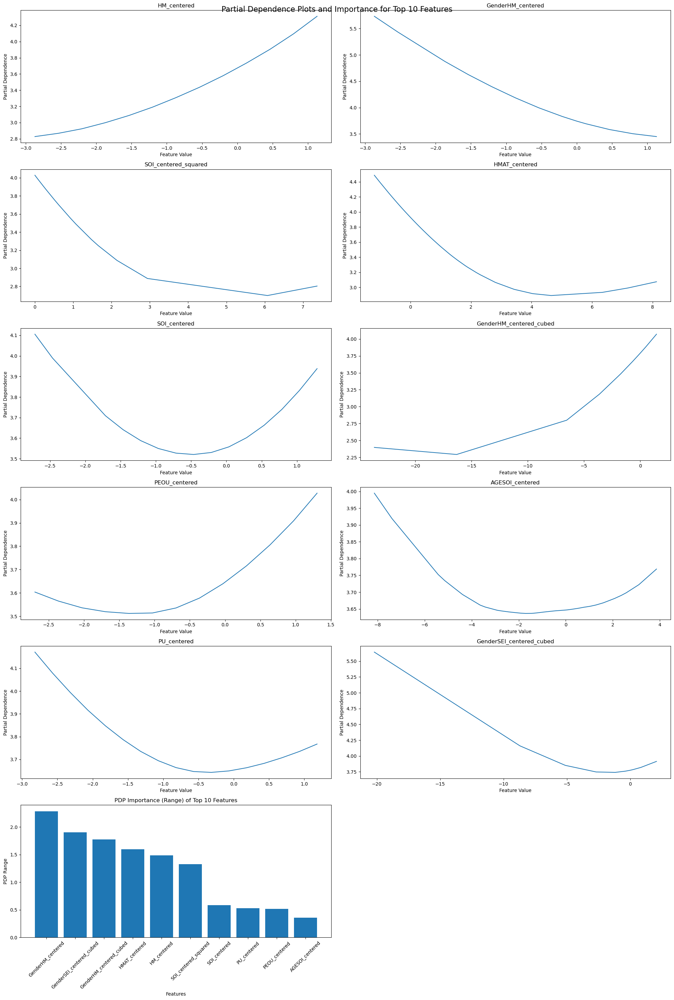


MLP Partial Dependence Values for Top 10 Features:

Feature: HM_centered
PDP values:
  -2.87: 2.8278
  -2.54: 2.8683
  -2.20: 2.9241
  -1.87: 2.9997
  -1.54: 3.0881
  -1.20: 3.1907
  -0.87: 3.3084
  -0.54: 3.4362
  -0.20: 3.5781
  0.13: 3.7353
  0.46: 3.9050
  0.80: 4.0956
  1.13: 4.3117

Feature: GenderHM_centered
PDP values:
  -2.87: 5.7341
  -2.54: 5.4350
  -1.87: 4.8770
  -1.54: 4.6257
  -1.20: 4.3960
  -0.87: 4.1852
  -0.54: 3.9949
  -0.20: 3.8303
  0.00: 3.7429
  0.13: 3.6927
  0.46: 3.5831
  0.80: 3.5033
  1.13: 3.4493

Feature: SOI_centered_squared
PDP values:
  0.00: 4.0284
  0.05: 4.0036
  0.08: 3.9837
  0.22: 3.9113
  0.29: 3.8729
  0.51: 3.7574
  0.62: 3.7033
  0.93: 3.5534
  1.07: 3.4879
  1.47: 3.3193
  1.65: 3.2510
  2.14: 3.0873
  2.94: 2.8877
  6.07: 2.6992
  7.37: 2.8038

Feature: HMAT_centered
PDP values:
  -1.20: 4.4879
  -1.01: 4.3967
  -0.72: 4.2552
  -0.63: 4.2083
  -0.57: 4.1800
  -0.45: 4.1250
  -0.43: 4.1195
  -0.40: 4.1030
  -0.31: 4.0637
  -0.27: 4.0443
  -

In [213]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import cross_validate
from sklearn.neural_network import MLPRegressor
from sklearn.inspection import PartialDependenceDisplay, partial_dependence
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

feature_vars =  feature_vars = feature_vars = [
    # Core constructs
    'PEOU_centered',
    'PU_centered',
    'AT_centered',
    'PE_centered',
    'HM_centered',
    'SOI_centered',
    'SEI_centered',
    'PPV_centered',
    
    # Demographic variables
    'AGE_num',
    'Gender_num',
    
    # Top performing interaction terms
    'HMAT_centered',
    'GenderHM_centered',
    'HMPE_centered',
    'AGEPEOU_centered_squared',
    
    # Top performing polynomial terms
    'SEI_centered_squared',
    'SOI_centered_squared',
    'GenderSEI_centered_cubed',
    'HMSOI_centered_cubed',
    'GenderHM_centered_cubed',
    
    # Additional terms to consider
    'HMPU_centered',
    'HMPEOU_centered',
    'HMSOI_centered',
    'AGESOI_centered',
    'AGEPPV_centered'
]
X = df_survey_cleaned[feature_vars]
y = df_survey_cleaned['BI']

# Create dummy variables for categorical variables
df_encoded = pd.get_dummies(X, columns=['AGE_num', 'Gender_num'], drop_first=True)

# Create a pipeline that includes scaling and the MLP model
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('model', MLPRegressor(hidden_layer_sizes=(100, 50), max_iter=1000, random_state=42))
])

# Perform cross-validation
cv_results = cross_validate(pipeline, df_encoded, y, cv=5, 
                            scoring=('neg_mean_squared_error', 'r2'),
                            return_train_score=True)

# Calculate mean and std of the scores
train_mse = -cv_results['train_neg_mean_squared_error']
test_mse = -cv_results['test_neg_mean_squared_error']
train_r2 = cv_results['train_r2']
test_r2 = cv_results['test_r2']

print("MLP Regression Results (5-fold Cross-Validation):")
print("--------------------------------")
print(f"Training MSE: {train_mse.mean():.4f} (+/- {train_mse.std() * 2:.4f})")
print(f"Training R^2: {train_r2.mean():.4f} (+/- {train_r2.std() * 2:.4f})")
print(f"Testing MSE: {test_mse.mean():.4f} (+/- {test_mse.std() * 2:.4f})")
print(f"Testing R^2: {test_r2.mean():.4f} (+/- {test_r2.std() * 2:.4f})")

# Fit the model on the entire dataset for feature importance and PDP
pipeline.fit(X, y)
model = pipeline.named_steps['model']

# Calculate feature importance using permutation importance
from sklearn.inspection import permutation_importance

perm_importance = permutation_importance(pipeline, X, y, n_repeats=10, random_state=42)
feature_importance = pd.DataFrame({'feature': feature_vars, 'importance': perm_importance.importances_mean})
feature_importance = feature_importance.sort_values('importance', ascending=False)

print("\nTop 10 Feature Importances (Permutation Importance):")
print(feature_importance.head(10))

# Calculate PDP values for top 10 features
top_10_features = feature_importance['feature'].head(10).tolist()
pdp_values = {}
pdp_ranges = {}

for feature in top_10_features:
    pdp = partial_dependence(pipeline, X, [feature], kind="average")
    pdp_values[feature] = (pdp["values"][0], pdp["average"][0])
    pdp_ranges[feature] = np.ptp(pdp["average"][0])  # Range of PDP values

# Sort features by PDP range
sorted_features = sorted(pdp_ranges.items(), key=lambda x: x[1], reverse=True)

# Plot PDP for top 10 features
fig, axes = plt.subplots(6, 2, figsize=(20, 30))
fig.suptitle("Partial Dependence Plots and Importance for Top 10 Features", fontsize=16)

for i, (feature, (x, y)) in enumerate(pdp_values.items()):
    row = i // 2
    col = i % 2
    axes[row, col].plot(x, y)
    axes[row, col].set_title(feature)
    axes[row, col].set_xlabel("Feature Value")
    axes[row, col].set_ylabel("Partial Dependence")

# Create bar plot of PDP importance
feature_names = [f[0] for f in sorted_features]
importance_values = [f[1] for f in sorted_features]

axes[5, 0].bar(feature_names, importance_values)
axes[5, 0].set_title("PDP Importance (Range) of Top 10 Features")
axes[5, 0].set_xlabel("Features")
axes[5, 0].set_ylabel("PDP Range")
axes[5, 0].tick_params(axis='x', rotation=45)

# Remove the unused subplot
fig.delaxes(axes[5, 1])

plt.tight_layout()
plt.show()

# Print PDP values
print("\nMLP Partial Dependence Values for Top 10 Features:")
for feature, (x, y) in pdp_values.items():
    print(f"\nFeature: {feature}")
    print("PDP values:")
    for val, pdp_val in zip(x, y):
        print(f"  {val:.2f}: {pdp_val:.4f}")

# Print PDP importance (range)
print("\nPDP Importance (Range) for Top 10 Features:")
for feature, importance in sorted_features:
    print(f"{feature}: {importance:.4f}")

## Hyperparamter Tuning

### MLR Grid Seach for best parameters

MSE: 0.12583426496671887
R-squared: 0.8346750528820351

Cross-validation results:
Mean MSE: 0.15869126455963262
Mean R-squared: 0.7915065111371442

Feature Importances (Absolute Coefficients):
                     feature  importance
4                HM_centered    0.412766
8              HMAT_centered    0.263785
17             HMPU_centered    0.145921
9          GenderHM_centered    0.120374
7               PPV_centered    0.106204
20           AGESOI_centered    0.103773
10             HMPE_centered    0.101528
2                AT_centered    0.095479
12      SEI_centered_squared    0.093124
16   GenderHM_centered_cubed    0.092203
15      HMSOI_centered_cubed    0.088161
0              PEOU_centered    0.078563
11  AGEPEOU_centered_squared    0.077968
19            HMSOI_centered    0.064310
13      SOI_centered_squared    0.058905
5               SOI_centered    0.048940
18           HMPEOU_centered    0.041866
3                PE_centered    0.037684
6               SEI_centered

<Figure size 1200x800 with 0 Axes>

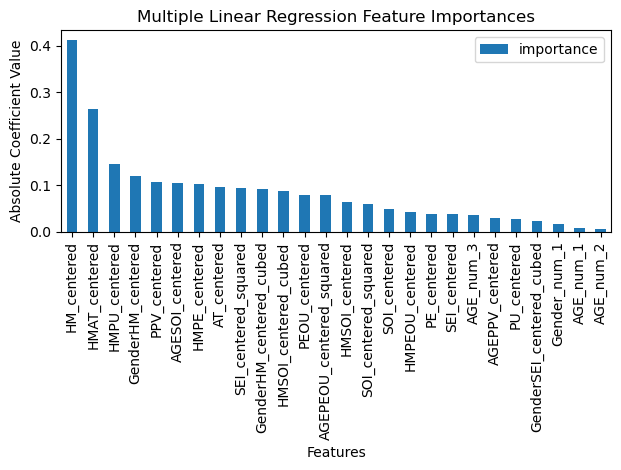


Actual Coefficients:
PEOU_centered: 0.07856270261188741
PU_centered: 0.027078545721493423
AT_centered: 0.09547906066630078
PE_centered: 0.03768365662902302
HM_centered: 0.41276558842554756
SOI_centered: 0.048940445276665995
SEI_centered: 0.0371904698220918
PPV_centered: 0.10620437973535493
HMAT_centered: -0.26378472955605825
GenderHM_centered: -0.12037444547235582
HMPE_centered: 0.10152791702866122
AGEPEOU_centered_squared: 0.07796829677037999
SEI_centered_squared: 0.09312374202786312
SOI_centered_squared: -0.05890528520916355
GenderSEI_centered_cubed: 0.022365594143833913
HMSOI_centered_cubed: 0.08816132446349802
GenderHM_centered_cubed: 0.09220338877076191
HMPU_centered: 0.14592145784817392
HMPEOU_centered: -0.041865562306303596
HMSOI_centered: -0.06430963017321786
AGESOI_centered: 0.10377252178836839
AGEPPV_centered: -0.02852185804124417
AGE_num_1: 0.00754625506236567
AGE_num_2: 0.004958866719962655
AGE_num_3: -0.03586142292172332
Gender_num_1: 0.015619268582288322


In [214]:
import pandas as pd
import numpy as np
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import cross_val_score

 
top_features = [
    # Core constructs
    'PEOU_centered', 'PU_centered', 'AT_centered', 'PE_centered',
    'HM_centered', 'SOI_centered', 'SEI_centered', 'PPV_centered',
    
    # Demographic variables
    'AGE_num', 'Gender_num',
    
    # Top performing interaction terms
    'HMAT_centered', 'GenderHM_centered', 'HMPE_centered', 'AGEPEOU_centered_squared',
    
    # Top performing polynomial terms
    'SEI_centered_squared', 'SOI_centered_squared', 'GenderSEI_centered_cubed',
    'HMSOI_centered_cubed', 'GenderHM_centered_cubed',
    
    # Additional terms to consider
    'HMPU_centered', 'HMPEOU_centered', 'HMSOI_centered', 'AGESOI_centered', 'AGEPPV_centered'
]
     
X = df_survey_cleaned[top_features]
y = df_survey_cleaned['BI']  # Replace 'BI' with my actual target variable name

# Create dummy variables for categorical variables
df_encoded = pd.get_dummies(X, columns=['AGE_num', 'Gender_num'], drop_first=True)

# Create a pipeline
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('mlr', LinearRegression())
])

# Fit the model
pipeline.fit(df_encoded, y)

# Get the model
model = pipeline.named_steps['mlr']

# Calculate MSE and R-squared
y_pred = pipeline.predict(df_encoded)
mse = mean_squared_error(y, y_pred)
r2 = r2_score(y, y_pred)

print("MSE:", mse)
print("R-squared:", r2)

# Perform cross-validation
cv_scores = cross_val_score(pipeline, df_encoded, y, cv=5, scoring='neg_mean_squared_error')
cv_mse = -cv_scores.mean()
cv_r2 = 1 - cv_mse / np.var(y)

print("\nCross-validation results:")
print("Mean MSE:", cv_mse)
print("Mean R-squared:", cv_r2)

# Get feature importances (coefficients for MLR)
feature_importances = pd.DataFrame({
    'feature': df_encoded.columns,
    'importance': np.abs(model.coef_)  # Use absolute values of coefficients
})
feature_importances = feature_importances.sort_values('importance', ascending=False)

print("\nFeature Importances (Absolute Coefficients):")
print(feature_importances)

# Optionally, you can plot the feature importances
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))
feature_importances.plot(x='feature', y='importance', kind='bar')
plt.title('Multiple Linear Regression Feature Importances')
plt.xlabel('Features')
plt.ylabel('Absolute Coefficient Value')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

# Print actual coefficients with their signs
print("\nActual Coefficients:")
for feature, coef in zip(df_encoded.columns, model.coef_):
    print(f"{feature}: {coef}")

Fitting 5 folds for each of 324 candidates, totalling 1620 fits


C:\Users\cemcd\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


Best parameters: {'rf__max_depth': 10, 'rf__max_features': 'auto', 'rf__min_samples_leaf': 1, 'rf__min_samples_split': 5, 'rf__n_estimators': 100}
Best negative MSE: -0.16190400022953524
Best R-squared: 0.7872855197015354

Feature Importances:
                     feature  importance
4                HM_centered    0.518132
1                PU_centered    0.069178
8              HMAT_centered    0.060524
10             HMPE_centered    0.056523
2                AT_centered    0.051900
17             HMPU_centered    0.033369
6               SEI_centered    0.032457
18           HMPEOU_centered    0.019680
7               PPV_centered    0.019594
0              PEOU_centered    0.017154
3                PE_centered    0.016402
19            HMSOI_centered    0.016274
15      HMSOI_centered_cubed    0.014917
12      SEI_centered_squared    0.013293
21           AGEPPV_centered    0.011292
20           AGESOI_centered    0.011025
11  AGEPEOU_centered_squared    0.009274
5               SO

<Figure size 1200x800 with 0 Axes>

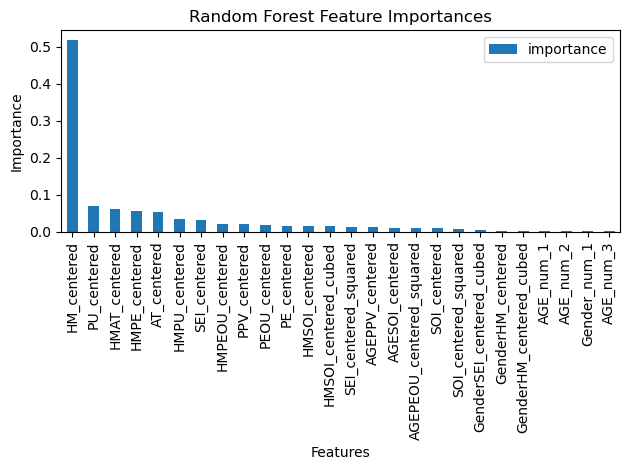

In [215]:
import pandas as pd
import numpy as np
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline


# Select the top features based on RF importance
top_features = [
    # Core constructs
    'PEOU_centered', 'PU_centered', 'AT_centered', 'PE_centered',
    'HM_centered', 'SOI_centered', 'SEI_centered', 'PPV_centered',
    
    # Demographic variables
    'AGE_num', 'Gender_num',
    
    # Top performing interaction terms
    'HMAT_centered', 'GenderHM_centered', 'HMPE_centered', 'AGEPEOU_centered_squared',
    
    # Top performing polynomial terms
    'SEI_centered_squared', 'SOI_centered_squared', 'GenderSEI_centered_cubed',
    'HMSOI_centered_cubed', 'GenderHM_centered_cubed',
    
    # Additional terms to consider
    'HMPU_centered', 'HMPEOU_centered', 'HMSOI_centered', 'AGESOI_centered', 'AGEPPV_centered'
]
     
X = df_survey_cleaned[top_features]
y = df_survey_cleaned['BI']  # Replace 'BI' with my actual target variable name

# Create dummy variables for categorical variables
df_encoded = pd.get_dummies(X, columns=['AGE_num', 'Gender_num'], drop_first=True)

# Create a pipeline
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('rf', RandomForestRegressor(random_state=42))
])

# Define the parameter grid
param_grid = {
    'rf__n_estimators': [100, 200, 300],
    'rf__max_depth': [None, 10, 20, 30],
    'rf__min_samples_split': [2, 5, 10],
    'rf__min_samples_leaf': [1, 2, 4],
    'rf__max_features': ['auto', 'sqrt', 'log2']
}

# Create the grid search object
grid_search = GridSearchCV(
    pipeline,
    param_grid,
    cv=5,
    scoring='neg_mean_squared_error',
    n_jobs=-1,
    verbose=2
)

# Fit the grid search
grid_search.fit(df_encoded, y)

# Print the best parameters and score
print("Best parameters:", grid_search.best_params_)
print("Best negative MSE:", grid_search.best_score_)
print("Best R-squared:", 1 - abs(grid_search.best_score_) / np.var(y))

# Get the best model
best_model = grid_search.best_estimator_

# Get feature importances
feature_importances = pd.DataFrame({
    'feature': df_encoded.columns,  # Use df_encoded.columns instead of top_features
    'importance': best_model.named_steps['rf'].feature_importances_
})
feature_importances = feature_importances.sort_values('importance', ascending=False)

print("\nFeature Importances:")
print(feature_importances)

# Optionally, you can plot the feature importances
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))
feature_importances.plot(x='feature', y='importance', kind='bar')
plt.title('Random Forest Feature Importances')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

### KNN Grid Search

Fitting 5 folds for each of 20 candidates, totalling 100 fits
Best parameters: {'knn__metric': 'manhattan', 'knn__n_neighbors': 11, 'knn__weights': 'distance'}
Best negative MSE: -0.19138003465861192
Best R-squared: 0.7485589945017158

Performance on entire dataset:
MSE: 0.0019654088050314465
R-squared: 0.9974177851569845

Cross-validation results:
Mean MSE: 0.19132603939090614
Mean R-squared: 0.7486299351535362

Feature Importances (Permutation Importance):
                     feature  importance
2                AT_centered    0.072042
3                PE_centered    0.070939
5               SOI_centered    0.070763
1                PU_centered    0.070278
4                HM_centered    0.069910
6               SEI_centered    0.069713
0              PEOU_centered    0.069453
20           AGESOI_centered    0.067964
7               PPV_centered    0.065697
21           AGEPPV_centered    0.061319
9          GenderHM_centered    0.056979
25              Gender_num_1    0.053266
24  

<Figure size 1200x800 with 0 Axes>

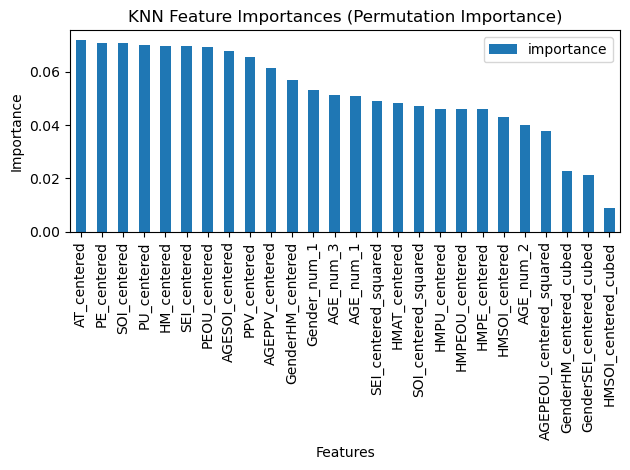

In [216]:
import pandas as pd
import numpy as np
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import cross_val_score

  
top_features = [
    # Core constructs
    'PEOU_centered', 'PU_centered', 'AT_centered', 'PE_centered',
    'HM_centered', 'SOI_centered', 'SEI_centered', 'PPV_centered',
    
    # Demographic variables
    'AGE_num', 'Gender_num',
    
    # Top performing interaction terms
    'HMAT_centered', 'GenderHM_centered', 'HMPE_centered', 'AGEPEOU_centered_squared',
    
    # Top performing polynomial terms
    'SEI_centered_squared', 'SOI_centered_squared', 'GenderSEI_centered_cubed',
    'HMSOI_centered_cubed', 'GenderHM_centered_cubed',
    
    # Additional terms to consider
    'HMPU_centered', 'HMPEOU_centered', 'HMSOI_centered', 'AGESOI_centered', 'AGEPPV_centered'
]
     
X = df_survey_cleaned[top_features]
y = df_survey_cleaned['BI']  # Replace 'BI' with my actual target variable name

# Create dummy variables for categorical variables
df_encoded = pd.get_dummies(X, columns=['AGE_num', 'Gender_num'], drop_first=True)

# Create a pipeline
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('knn', KNeighborsRegressor())
])

# Define the parameter grid
param_grid = {
    'knn__n_neighbors': [3, 5, 7, 9, 11],
    'knn__weights': ['uniform', 'distance'],
    'knn__metric': ['euclidean', 'manhattan']
}

# Create the grid search object
grid_search = GridSearchCV(
    pipeline,
    param_grid,
    cv=5,
    scoring='neg_mean_squared_error',
    n_jobs=-1,
    verbose=2
)

# Fit the grid search
grid_search.fit(df_encoded, y)

# Print the best parameters and score
print("Best parameters:", grid_search.best_params_)
print("Best negative MSE:", grid_search.best_score_)
print("Best R-squared:", 1 - abs(grid_search.best_score_) / np.var(y))

# Get the best model
best_model = grid_search.best_estimator_

# Calculate MSE and R-squared on the entire dataset
y_pred = best_model.predict(df_encoded)
mse = mean_squared_error(y, y_pred)
r2 = r2_score(y, y_pred)

print("\nPerformance on entire dataset:")
print("MSE:", mse)
print("R-squared:", r2)

# Perform cross-validation
cv_scores = cross_val_score(best_model, df_encoded, y, cv=5, scoring='neg_mean_squared_error')
cv_mse = -cv_scores.mean()
cv_r2 = 1 - cv_mse / np.var(y)

print("\nCross-validation results:")
print("Mean MSE:", cv_mse)
print("Mean R-squared:", cv_r2)

# For KNN, we don't have direct feature importances, but we can use permutation importance
from sklearn.inspection import permutation_importance

perm_importance = permutation_importance(best_model, df_encoded, y, n_repeats=10, random_state=42)
feature_importances = pd.DataFrame({
    'feature': df_encoded.columns,
    'importance': perm_importance.importances_mean
})
feature_importances = feature_importances.sort_values('importance', ascending=False)

print("\nFeature Importances (Permutation Importance):")
print(feature_importances)

# Optionally, you can plot the feature importances
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))
feature_importances.plot(x='feature', y='importance', kind='bar')
plt.title('KNN Feature Importances (Permutation Importance)')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

### SVR Random Grid Search 

Fitting 5 folds for each of 100 candidates, totalling 500 fits
Best parameters: {'svr__C': 107.49405395173389, 'svr__epsilon': 0.014393488629755868, 'svr__gamma': 0.000291266516688138, 'svr__kernel': 'rbf'}
Best negative MSE: -0.156463711507713
Best R-squared: 0.7944331391951575

Performance on entire dataset:
MSE: 0.13061189039446758
R-squared: 0.8283980609084983

Cross-validation results:
Mean MSE: 0.156463711507713
Mean R-squared: 0.7944331391951575

Feature Importances (Permutation Importance):
                     feature  importance
4                HM_centered    0.191396
8              HMAT_centered    0.059743
10             HMPE_centered    0.038486
5               SOI_centered    0.033047
7               PPV_centered    0.027779
2                AT_centered    0.022156
1                PU_centered    0.021857
16   GenderHM_centered_cubed    0.015972
17             HMPU_centered    0.012073
0              PEOU_centered    0.011824
11  AGEPEOU_centered_squared    0.010906
19  

<Figure size 1200x800 with 0 Axes>

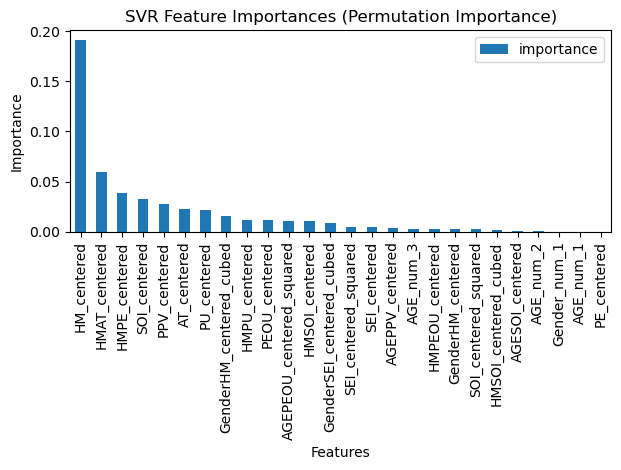

In [217]:
import pandas as pd
import numpy as np
from sklearn.model_selection import RandomizedSearchCV
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import cross_val_score
from scipy.stats import uniform, loguniform

 
top_features = [
    # Core constructs
    'PEOU_centered', 'PU_centered', 'AT_centered', 'PE_centered',
    'HM_centered', 'SOI_centered', 'SEI_centered', 'PPV_centered',
    
    # Demographic variables
    'AGE_num', 'Gender_num',
    
    # Top performing interaction terms
    'HMAT_centered', 'GenderHM_centered', 'HMPE_centered', 'AGEPEOU_centered_squared',
    
    # Top performing polynomial terms
    'SEI_centered_squared', 'SOI_centered_squared', 'GenderSEI_centered_cubed',
    'HMSOI_centered_cubed', 'GenderHM_centered_cubed',
    
    # Additional terms to consider
    'HMPU_centered', 'HMPEOU_centered', 'HMSOI_centered', 'AGESOI_centered', 'AGEPPV_centered'
]
     
X = df_survey_cleaned[top_features]
y = df_survey_cleaned['BI']  # Replace 'BI' with my actual target variable name

# Create dummy variables for categorical variables
df_encoded = pd.get_dummies(X, columns=['AGE_num', 'Gender_num'], drop_first=True)

# Create a pipeline
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('svr', SVR())
])

# Define the parameter distribution for random search
param_dist = {
    'svr__C': loguniform(1e-1, 1e3),
    'svr__epsilon': uniform(0, 1),
    'svr__gamma': loguniform(1e-4, 1e0),
    'svr__kernel': ['rbf', 'poly', 'sigmoid']
}

# Create the random search object
random_search = RandomizedSearchCV(
    pipeline,
    param_distributions=param_dist,
    n_iter=100,  # Number of parameter settings that are sampled
    cv=5,
    scoring='neg_mean_squared_error',
    n_jobs=-1,
    verbose=2,
    random_state=42
)

# Fit the random search
random_search.fit(df_encoded, y)

# Print the best parameters and score
print("Best parameters:", random_search.best_params_)
print("Best negative MSE:", random_search.best_score_)
print("Best R-squared:", 1 - abs(random_search.best_score_) / np.var(y))

# Get the best model
best_model = random_search.best_estimator_

# Calculate MSE and R-squared on the entire dataset
y_pred = best_model.predict(df_encoded)
mse = mean_squared_error(y, y_pred)
r2 = r2_score(y, y_pred)

print("\nPerformance on entire dataset:")
print("MSE:", mse)
print("R-squared:", r2)

# Perform cross-validation
cv_scores = cross_val_score(best_model, df_encoded, y, cv=5, scoring='neg_mean_squared_error')
cv_mse = -cv_scores.mean()
cv_r2 = 1 - cv_mse / np.var(y)

print("\nCross-validation results:")
print("Mean MSE:", cv_mse)
print("Mean R-squared:", cv_r2)

# For SVR, we don't have direct feature importances, but we can use permutation importance
from sklearn.inspection import permutation_importance

perm_importance = permutation_importance(best_model, df_encoded, y, n_repeats=10, random_state=42)
feature_importances = pd.DataFrame({
    'feature': df_encoded.columns,
    'importance': perm_importance.importances_mean
})
feature_importances = feature_importances.sort_values('importance', ascending=False)

print("\nFeature Importances (Permutation Importance):")
print(feature_importances)

# Optionally, you can plot the feature importances
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))
feature_importances.plot(x='feature', y='importance', kind='bar')
plt.title('SVR Feature Importances (Permutation Importance)')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

In [218]:
### SVR Grid Search

Fitting 5 folds for each of 180 candidates, totalling 900 fits
Best parameters: {'svr__C': 10, 'svr__epsilon': 0.01, 'svr__gamma': 0.001, 'svr__kernel': 'sigmoid'}
Best negative MSE: -0.15167827318577876
Best R-squared: 0.8007203959905884

Performance on entire dataset:
MSE: 0.13751912740805747
R-squared: 0.8193231194026611

Cross-validation results:
Mean MSE: 0.15167827318577876
Mean R-squared: 0.8007203959905884

Feature Importances (Permutation Importance):
                     feature  importance
4                HM_centered    0.154874
2                AT_centered    0.028794
7               PPV_centered    0.027190
8              HMAT_centered    0.024503
5               SOI_centered    0.023310
1                PU_centered    0.019849
16   GenderHM_centered_cubed    0.011073
0              PEOU_centered    0.010589
10             HMPE_centered    0.009016
6               SEI_centered    0.008952
14  GenderSEI_centered_cubed    0.004340
11  AGEPEOU_centered_squared    0.002590
12

<Figure size 1200x800 with 0 Axes>

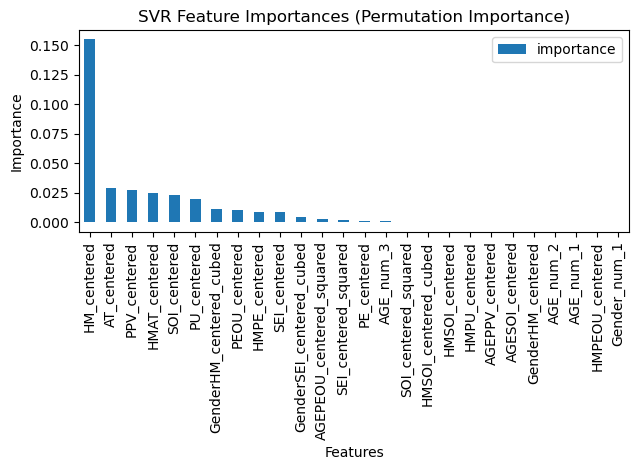

In [219]:
import pandas as pd
import numpy as np
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import cross_val_score


top_features = [
    # Core constructs
    'PEOU_centered', 'PU_centered', 'AT_centered', 'PE_centered',
    'HM_centered', 'SOI_centered', 'SEI_centered', 'PPV_centered',
    
    # Demographic variables
    'AGE_num', 'Gender_num',
    
    # Top performing interaction terms
    'HMAT_centered', 'GenderHM_centered', 'HMPE_centered', 'AGEPEOU_centered_squared',
    
    # Top performing polynomial terms
    'SEI_centered_squared', 'SOI_centered_squared', 'GenderSEI_centered_cubed',
    'HMSOI_centered_cubed', 'GenderHM_centered_cubed',
    
    # Additional terms to consider
    'HMPU_centered', 'HMPEOU_centered', 'HMSOI_centered', 'AGESOI_centered', 'AGEPPV_centered'
]
     
X = df_survey_cleaned[top_features]
y = df_survey_cleaned['BI']  # Replace 'BI' with my actual target variable name

# Create dummy variables for categorical variables
df_encoded = pd.get_dummies(X, columns=['AGE_num', 'Gender_num'], drop_first=True)

# Create a pipeline
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('svr', SVR())
])

# Define the parameter grid for grid search
param_grid = {
    'svr__C': [0.1, 1, 10, 100],
    'svr__epsilon': [0.01, 0.1, 0.5],
    'svr__gamma': ['scale', 'auto', 0.1, 0.01, 0.001],
    'svr__kernel': ['rbf', 'poly', 'sigmoid']
}

# Create the grid search object
grid_search = GridSearchCV(
    pipeline,
    param_grid=param_grid,
    cv=5,
    scoring='neg_mean_squared_error',
    n_jobs=-1,
    verbose=2
)

# Fit the grid search
grid_search.fit(df_encoded, y)

# Print the best parameters and score
print("Best parameters:", grid_search.best_params_)
print("Best negative MSE:", grid_search.best_score_)
print("Best R-squared:", 1 - abs(grid_search.best_score_) / np.var(y))

# Get the best model
best_model = grid_search.best_estimator_

# Calculate MSE and R-squared on the entire dataset
y_pred = best_model.predict(df_encoded)
mse = mean_squared_error(y, y_pred)
r2 = r2_score(y, y_pred)

print("\nPerformance on entire dataset:")
print("MSE:", mse)
print("R-squared:", r2)

# Perform cross-validation
cv_scores = cross_val_score(best_model, df_encoded, y, cv=5, scoring='neg_mean_squared_error')
cv_mse = -cv_scores.mean()
cv_r2 = 1 - cv_mse / np.var(y)

print("\nCross-validation results:")
print("Mean MSE:", cv_mse)
print("Mean R-squared:", cv_r2)

# For SVR, we don't have direct feature importances, but we can use permutation importance
from sklearn.inspection import permutation_importance

perm_importance = permutation_importance(best_model, df_encoded, y, n_repeats=10, random_state=42)
feature_importances = pd.DataFrame({
    'feature': df_encoded.columns,
    'importance': perm_importance.importances_mean
})
feature_importances = feature_importances.sort_values('importance', ascending=False)

print("\nFeature Importances (Permutation Importance):")
print(feature_importances)

# Optionally, you can plot the feature importances
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))
feature_importances.plot(x='feature', y='importance', kind='bar')
plt.title('SVR Feature Importances (Permutation Importance)')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

### MLP Grid Search

Fitting 5 folds for each of 48 candidates, totalling 240 fits
Best parameters: {'mlp__activation': 'tanh', 'mlp__alpha': 0.01, 'mlp__hidden_layer_sizes': (100,), 'mlp__learning_rate': 'constant'}
Best negative MSE: -0.18640374607437565
Best R-squared: 0.7550969962713465

Performance on entire dataset:
MSE: 0.10813866879516361
R-squared: 0.8579240741407279

Cross-validation results:
Mean MSE: 0.18640374607437563
Mean R-squared: 0.7550969962713465

Feature Importances (Permutation Importance):
                     feature  importance
15      HMSOI_centered_cubed    1.922306
16   GenderHM_centered_cubed    0.904900
4                HM_centered    0.254742
8              HMAT_centered    0.243253
9          GenderHM_centered    0.159875
10             HMPE_centered    0.085213
19            HMSOI_centered    0.082617
17             HMPU_centered    0.075119
7               PPV_centered    0.050970
1                PU_centered    0.047553
12      SEI_centered_squared    0.047516
5          

<Figure size 1200x800 with 0 Axes>

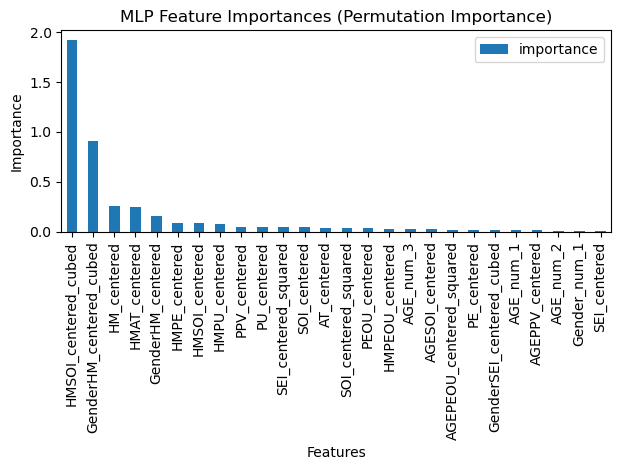

In [220]:
import pandas as pd
import numpy as np
from sklearn.model_selection import GridSearchCV
from sklearn.neural_network import MLPRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import cross_val_score


top_features = [
    # Core constructs
    'PEOU_centered', 'PU_centered', 'AT_centered', 'PE_centered',
    'HM_centered', 'SOI_centered', 'SEI_centered', 'PPV_centered',
    
    # Demographic variables
    'AGE_num', 'Gender_num',
    
    # Top performing interaction terms
    'HMAT_centered', 'GenderHM_centered', 'HMPE_centered', 'AGEPEOU_centered_squared',
    
    # Top performing polynomial terms
    'SEI_centered_squared', 'SOI_centered_squared', 'GenderSEI_centered_cubed',
    'HMSOI_centered_cubed', 'GenderHM_centered_cubed',
    
    # Additional terms to consider
    'HMPU_centered', 'HMPEOU_centered', 'HMSOI_centered', 'AGESOI_centered', 'AGEPPV_centered'
]
     
X = df_survey_cleaned[top_features]
y = df_survey_cleaned['BI']  # Replace 'BI' with my actual target variable name

# Create dummy variables for categorical variables
df_encoded = pd.get_dummies(X, columns=['AGE_num', 'Gender_num'], drop_first=True)

# Create a pipeline
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('mlp', MLPRegressor(max_iter=1000, random_state=42))
])

# Define the parameter grid for grid search
param_grid = {
    'mlp__hidden_layer_sizes': [(50,), (100,), (50, 50), (100, 50)],
    'mlp__activation': ['relu', 'tanh'],
    'mlp__alpha': [0.0001, 0.001, 0.01],
    'mlp__learning_rate': ['constant', 'adaptive'],
}

# Create the grid search object
grid_search = GridSearchCV(
    pipeline,
    param_grid=param_grid,
    cv=5,
    scoring='neg_mean_squared_error',
    n_jobs=-1,
    verbose=2
)

# Fit the grid search
grid_search.fit(df_encoded, y)

# Print the best parameters and score
print("Best parameters:", grid_search.best_params_)
print("Best negative MSE:", grid_search.best_score_)
print("Best R-squared:", 1 - abs(grid_search.best_score_) / np.var(y))

# Get the best model
best_model = grid_search.best_estimator_

# Calculate MSE and R-squared on the entire dataset
y_pred = best_model.predict(df_encoded)
mse = mean_squared_error(y, y_pred)
r2 = r2_score(y, y_pred)

print("\nPerformance on entire dataset:")
print("MSE:", mse)
print("R-squared:", r2)

# Perform cross-validation
cv_scores = cross_val_score(best_model, df_encoded, y, cv=5, scoring='neg_mean_squared_error')
cv_mse = -cv_scores.mean()
cv_r2 = 1 - cv_mse / np.var(y)

print("\nCross-validation results:")
print("Mean MSE:", cv_mse)
print("Mean R-squared:", cv_r2)

# For MLP, we don't have direct feature importances, but we can use permutation importance
from sklearn.inspection import permutation_importance

perm_importance = permutation_importance(best_model, df_encoded, y, n_repeats=10, random_state=42)
feature_importances = pd.DataFrame({
    'feature': df_encoded.columns,
    'importance': perm_importance.importances_mean
})
feature_importances = feature_importances.sort_values('importance', ascending=False)

print("\nFeature Importances (Permutation Importance):")
print(feature_importances)

# Optionally, you can plot the feature importances
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))
feature_importances.plot(x='feature', y='importance', kind='bar')
plt.title('MLP Feature Importances (Permutation Importance)')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

### MLP  grid search with revised parameter settings

Fitting 5 folds for each of 288 candidates, totalling 1440 fits
Best parameters: {'mlp__activation': 'tanh', 'mlp__alpha': 0.1, 'mlp__hidden_layer_sizes': (50, 50), 'mlp__learning_rate': 'adaptive', 'mlp__solver': 'sgd'}
Best negative MSE: -0.182785501693981
Best R-squared: 0.7598507575859362

Performance on entire dataset:
MSE: 0.12721738137451938
R-squared: 0.8328578717903978

Cross-validation results:
Mean MSE: 0.18278550169398103
Mean R-squared: 0.7598507575859362

Feature Importances (Permutation Importance):
                     feature  importance
16   GenderHM_centered_cubed    0.156858
4                HM_centered    0.154351
7               PPV_centered    0.141410
19            HMSOI_centered    0.106609
20           AGESOI_centered    0.066523
8              HMAT_centered    0.065777
18           HMPEOU_centered    0.063710
2                AT_centered    0.054656
10             HMPE_centered    0.046388
14  GenderSEI_centered_cubed    0.039374
0              PEOU_centered 

<Figure size 1200x800 with 0 Axes>

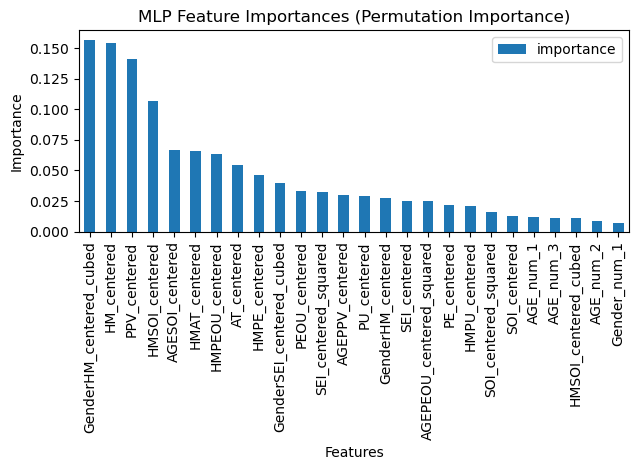

In [221]:
import pandas as pd
import numpy as np
from sklearn.model_selection import GridSearchCV
from sklearn.neural_network import MLPRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import cross_val_score

 
top_features = [
    # Core constructs
    'PEOU_centered', 'PU_centered', 'AT_centered', 'PE_centered',
    'HM_centered', 'SOI_centered', 'SEI_centered', 'PPV_centered',
    
    # Demographic variables
    'AGE_num', 'Gender_num',
    
    # Top performing interaction terms
    'HMAT_centered', 'GenderHM_centered', 'HMPE_centered', 'AGEPEOU_centered_squared',
    
    # Top performing polynomial terms
    'SEI_centered_squared', 'SOI_centered_squared', 'GenderSEI_centered_cubed',
    'HMSOI_centered_cubed', 'GenderHM_centered_cubed',
    
    # Additional terms to consider
    'HMPU_centered', 'HMPEOU_centered', 'HMSOI_centered', 'AGESOI_centered', 'AGEPPV_centered'
]
     
X = df_survey_cleaned[top_features]
y = df_survey_cleaned['BI']  # Replace 'BI' with my actual target variable name

# Create dummy variables for categorical variables
df_encoded = pd.get_dummies(X, columns=['AGE_num', 'Gender_num'], drop_first=True)

# Create a pipeline
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('mlp', MLPRegressor(max_iter=1000, random_state=42))
])

# Define the expanded parameter grid for grid search
param_grid = {
    'mlp__hidden_layer_sizes': [(50,), (100,), (50, 50), (100, 50), (100, 100), (50, 50, 50)],
    'mlp__activation': ['relu', 'tanh'],
    'mlp__alpha': [0.0001, 0.001, 0.01, 0.1],
    'mlp__learning_rate': ['constant', 'adaptive'],
    'mlp__solver': ['adam', 'sgd', 'lbfgs'],
}

# Create the grid search object
grid_search = GridSearchCV(
    pipeline,
    param_grid=param_grid,
    cv=5,
    scoring='neg_mean_squared_error',
    n_jobs=-1,
    verbose=2
)

# Fit the grid search
grid_search.fit(df_encoded, y)

# Print the best parameters and score
print("Best parameters:", grid_search.best_params_)
print("Best negative MSE:", grid_search.best_score_)
print("Best R-squared:", 1 - abs(grid_search.best_score_) / np.var(y))

# Get the best model
best_model = grid_search.best_estimator_

# Calculate MSE and R-squared on the entire dataset
y_pred = best_model.predict(df_encoded)
mse = mean_squared_error(y, y_pred)
r2 = r2_score(y, y_pred)

print("\nPerformance on entire dataset:")
print("MSE:", mse)
print("R-squared:", r2)

# Perform cross-validation
cv_scores = cross_val_score(best_model, df_encoded, y, cv=5, scoring='neg_mean_squared_error')
cv_mse = -cv_scores.mean()
cv_r2 = 1 - cv_mse / np.var(y)

print("\nCross-validation results:")
print("Mean MSE:", cv_mse)
print("Mean R-squared:", cv_r2)

# For MLP, we don't have direct feature importances, but we can use permutation importance
from sklearn.inspection import permutation_importance

perm_importance = permutation_importance(best_model, df_encoded, y, n_repeats=10, random_state=42)
feature_importances = pd.DataFrame({
    'feature': df_encoded.columns,
    'importance': perm_importance.importances_mean
})
feature_importances = feature_importances.sort_values('importance', ascending=False)

print("\nFeature Importances (Permutation Importance):")
print(feature_importances)

# Optionally, you can plot the feature importances
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))
feature_importances.plot(x='feature', y='importance', kind='bar')
plt.title('MLP Feature Importances (Permutation Importance)')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

### MLP revision #3

Fitting 5 folds for each of 72 candidates, totalling 360 fits
Best parameters: {'mlp__activation': 'tanh', 'mlp__alpha': 0.2, 'mlp__hidden_layer_sizes': (50, 50), 'mlp__learning_rate': 'adaptive', 'mlp__learning_rate_init': 0.001, 'mlp__solver': 'sgd'}
Best negative MSE: -0.18263482266442072
Best R-squared: 0.7600487243527818

Performance on entire dataset:
MSE: 0.12718120645411804
R-squared: 0.8329053995190647

Cross-validation results:
Mean MSE: 0.1826348226644207
Mean R-squared: 0.7600487243527818

Feature Importances (Permutation Importance):
                     feature  importance
16   GenderHM_centered_cubed    0.153169
4                HM_centered    0.153114
7               PPV_centered    0.138000
19            HMSOI_centered    0.103524
20           AGESOI_centered    0.064826
8              HMAT_centered    0.064093
18           HMPEOU_centered    0.061803
2                AT_centered    0.053718
10             HMPE_centered    0.045147
14  GenderSEI_centered_cubed    0.039

<Figure size 1200x800 with 0 Axes>

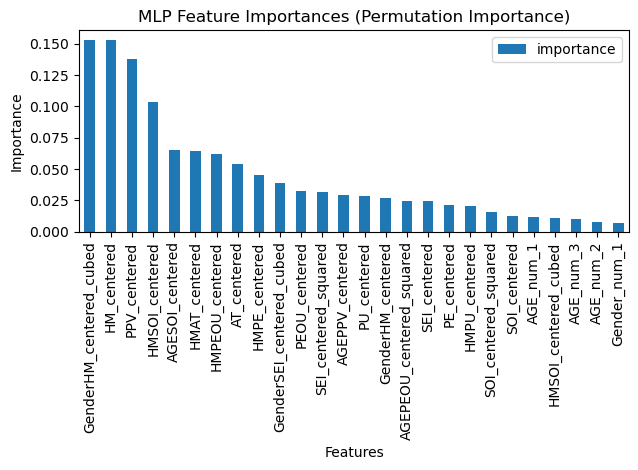

In [222]:
import pandas as pd
import numpy as np
from sklearn.model_selection import GridSearchCV
from sklearn.neural_network import MLPRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import cross_val_score


top_features = [
    # Core constructs
    'PEOU_centered', 'PU_centered', 'AT_centered', 'PE_centered',
    'HM_centered', 'SOI_centered', 'SEI_centered', 'PPV_centered',
    
    # Demographic variables
    'AGE_num', 'Gender_num',
    
    # Top performing interaction terms
    'HMAT_centered', 'GenderHM_centered', 'HMPE_centered', 'AGEPEOU_centered_squared',
    
    # Top performing polynomial terms
    'SEI_centered_squared', 'SOI_centered_squared', 'GenderSEI_centered_cubed',
    'HMSOI_centered_cubed', 'GenderHM_centered_cubed',
    
    # Additional terms to consider
    'HMPU_centered', 'HMPEOU_centered', 'HMSOI_centered', 'AGESOI_centered', 'AGEPPV_centered'
]
     
X = df_survey_cleaned[top_features]
y = df_survey_cleaned['BI']  # Replace 'BI' with my actual target variable name

# Create dummy variables for categorical variables
df_encoded = pd.get_dummies(X, columns=['AGE_num', 'Gender_num'], drop_first=True)

# Create a pipeline
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('mlp', MLPRegressor(max_iter=2000, random_state=42))
])

# Define the focused parameter grid for grid search
param_grid = {
    'mlp__hidden_layer_sizes': [(40, 40), (50, 50), (60, 60), (40, 40, 40), (50, 50, 50), (60, 60, 60)],
    'mlp__alpha': [0.05, 0.1, 0.15, 0.2],
    'mlp__activation': ['tanh'],
    'mlp__learning_rate': ['adaptive'],
    'mlp__solver': ['sgd'],
    'mlp__learning_rate_init': [0.001, 0.01, 0.1],
}

# Create the grid search object
grid_search = GridSearchCV(
    pipeline,
    param_grid=param_grid,
    cv=5,
    scoring='neg_mean_squared_error',
    n_jobs=-1,
    verbose=2
)

# Fit the grid search
grid_search.fit(df_encoded, y)

# Print the best parameters and score
print("Best parameters:", grid_search.best_params_)
print("Best negative MSE:", grid_search.best_score_)
print("Best R-squared:", 1 - abs(grid_search.best_score_) / np.var(y))

# Get the best model
best_model = grid_search.best_estimator_

# Calculate MSE and R-squared on the entire dataset
y_pred = best_model.predict(df_encoded)
mse = mean_squared_error(y, y_pred)
r2 = r2_score(y, y_pred)

print("\nPerformance on entire dataset:")
print("MSE:", mse)
print("R-squared:", r2)

# Perform cross-validation
cv_scores = cross_val_score(best_model, df_encoded, y, cv=5, scoring='neg_mean_squared_error')
cv_mse = -cv_scores.mean()
cv_r2 = 1 - cv_mse / np.var(y)

print("\nCross-validation results:")
print("Mean MSE:", cv_mse)
print("Mean R-squared:", cv_r2)

# For MLP, we don't have direct feature importances, but we can use permutation importance
from sklearn.inspection import permutation_importance

perm_importance = permutation_importance(best_model, df_encoded, y, n_repeats=10, random_state=42)
feature_importances = pd.DataFrame({
    'feature': df_encoded.columns,
    'importance': perm_importance.importances_mean
})
feature_importances = feature_importances.sort_values('importance', ascending=False)

print("\nFeature Importances (Permutation Importance):")
print(feature_importances)

# Optionally, you can plot the feature importances
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))
feature_importances.plot(x='feature', y='importance', kind='bar')
plt.title('MLP Feature Importances (Permutation Importance)')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

# Recreate models with best features and add residual plots etc

### MLR with best prameters and top 10 most important features

Training MSE: 0.16338727527826974
Training R-squared: 0.7893904736227693
Testing MSE: 0.10273425759363881
Testing R-squared: 0.853609444841054
Testing RMSE: 0.3205218519752418
Testing MAE: 0.23271942459088513
Testing Median AE: 0.16017166708833752
Testing Max Error: 1.0445183619146148
Testing Explained Variance Score: 0.8563908775282201


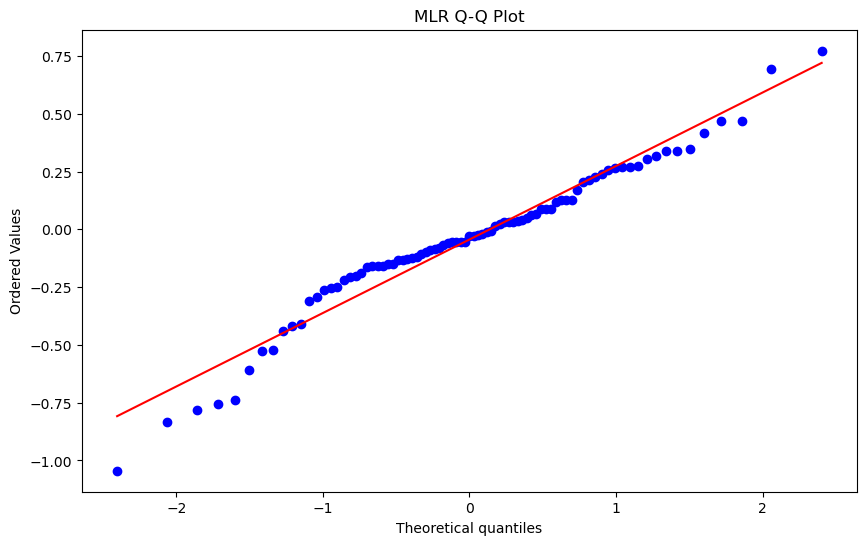

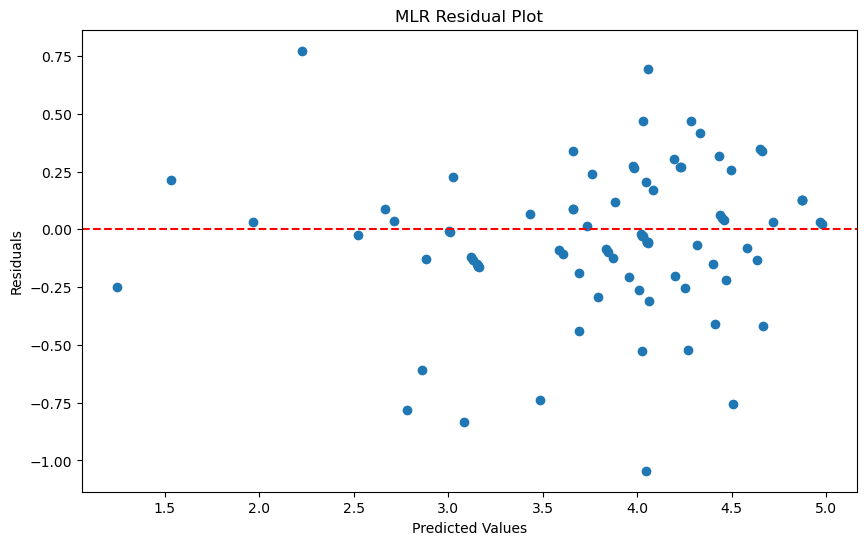

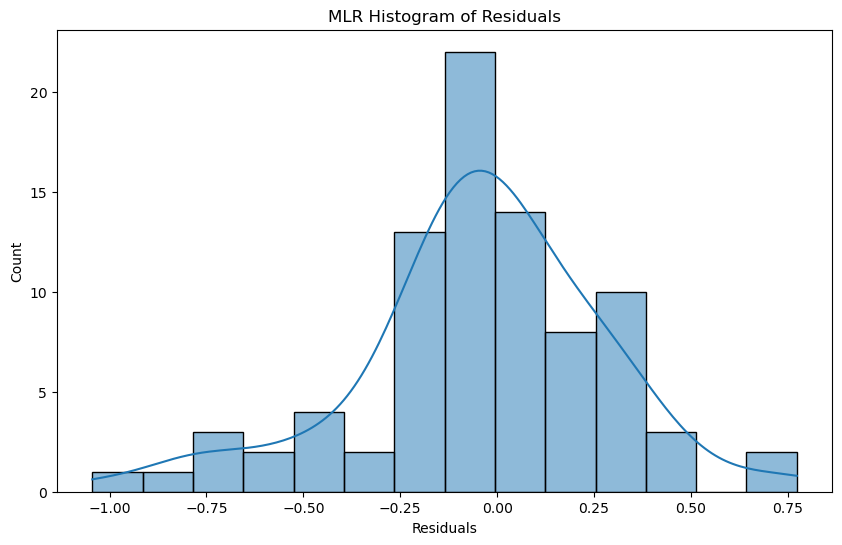

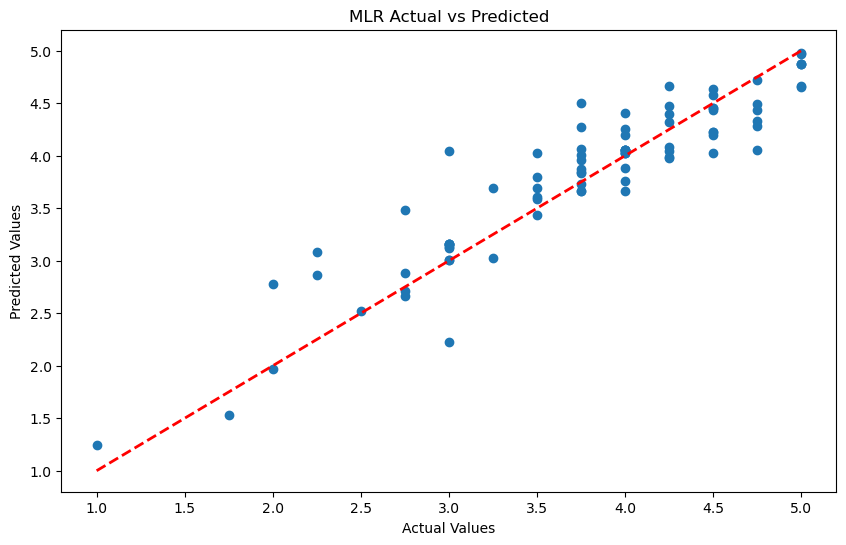

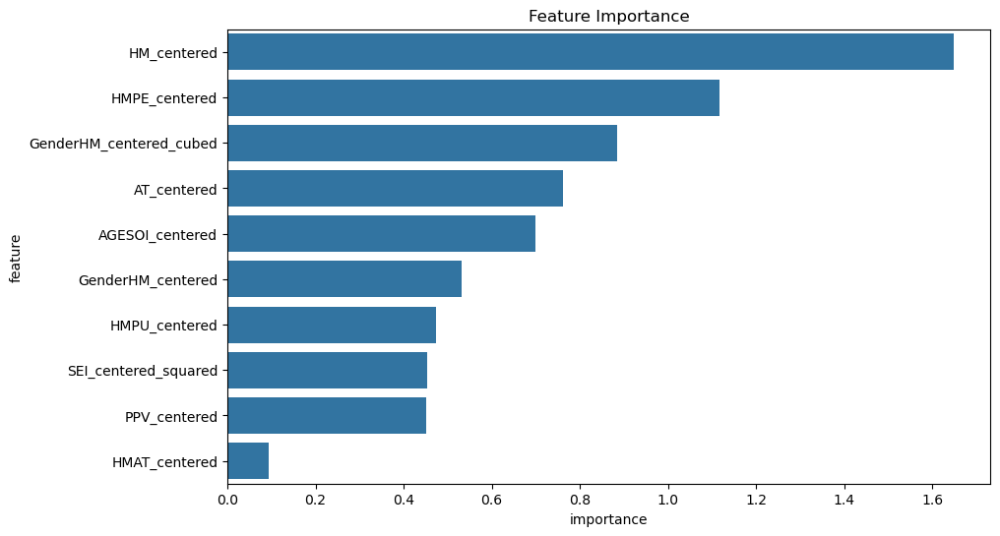

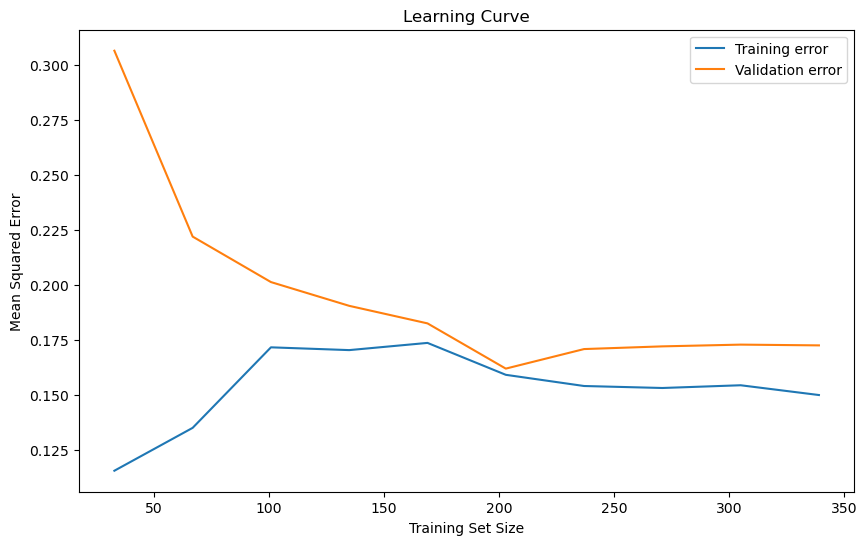


Largest residuals:
Index: 24, Residual: -1.0445, Actual: 3.0000, Predicted: 4.0445
Index: 90, Residual: -0.8336, Actual: 2.2500, Predicted: 3.0836
Index: 402, Residual: -0.7814, Actual: 2.0000, Predicted: 2.7814
Index: 15, Residual: 0.7728, Actual: 3.0000, Predicted: 2.2272
Index: 184, Residual: -0.7558, Actual: 3.7500, Predicted: 4.5058
Index: 46, Residual: -0.7377, Actual: 2.7500, Predicted: 3.4877
Index: 271, Residual: 0.6944, Actual: 4.7500, Predicted: 4.0556
Index: 371, Residual: -0.6096, Actual: 2.2500, Predicted: 2.8596
Index: 239, Residual: -0.5273, Actual: 3.5000, Predicted: 4.0273
Index: 247, Residual: -0.5218, Actual: 3.7500, Predicted: 4.2718

Feature values for largest residuals:
     HM_centered  HMAT_centered  HMPU_centered  GenderHM_centered  \
24      0.130503       0.021751      -0.008926           0.000000   
90     -0.869497       1.304245       0.059470          -0.869497   
402    -0.869497       0.724581       0.711593          -0.869497   
15     -1.536164     

In [223]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, median_absolute_error, max_error, explained_variance_score
from sklearn.model_selection import cross_val_score, learning_curve
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

 
top_features = [
    'HM_centered', 'HMAT_centered', 'HMPU_centered', 'GenderHM_centered',
    'PPV_centered', 'AGESOI_centered', 'HMPE_centered', 'AT_centered',
    'SEI_centered_squared', 'GenderHM_centered_cubed'
]

X = df_survey_cleaned[top_features]
y = df_survey_cleaned['BI']  # Replace 'BI' with my actual target variable name



# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a pipeline
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('mlp', MLPRegressor(hidden_layer_sizes=(50, 50), activation='tanh', 
                         alpha=0.2, learning_rate='adaptive', 
                         learning_rate_init=0.001, solver='sgd', 
                         max_iter=2000, random_state=42))
])

# Fit the model
pipeline.fit(X_train, y_train)

# Make predictions
y_pred_train = pipeline.predict(X_train)
y_pred_test = pipeline.predict(X_test)

# Calculate metrics
mse_train = mean_squared_error(y_train, y_pred_train)
r2_train = r2_score(y_train, y_pred_train)
mse_test = mean_squared_error(y_test, y_pred_test)
r2_test = r2_score(y_test, y_pred_test)
rmse_test = np.sqrt(mse_test)
mae_test = mean_absolute_error(y_test, y_pred_test)
median_ae_test = median_absolute_error(y_test, y_pred_test)
max_err_test = max_error(y_test, y_pred_test)
ev_score_test = explained_variance_score(y_test, y_pred_test)

print("Training MSE:", mse_train)
print("Training R-squared:", r2_train)
print("Testing MSE:", mse_test)
print("Testing R-squared:", r2_test)
print("Testing RMSE:", rmse_test)
print("Testing MAE:", mae_test)
print("Testing Median AE:", median_ae_test)
print("Testing Max Error:", max_err_test)
print("Testing Explained Variance Score:", ev_score_test)

# Residuals
residuals_train = y_train - y_pred_train
residuals_test = y_test - y_pred_test

# QQ Plot
plt.figure(figsize=(10, 6))
stats.probplot(residuals_test, dist="norm", plot=plt)
plt.title("MLR Q-Q Plot")
plt.show()

# Residual Plot
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_test, residuals_test)
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("MLR Residual Plot")
plt.axhline(y=0, color='r', linestyle='--')
plt.show()

# Histogram of Residuals
plt.figure(figsize=(10, 6))
sns.histplot(residuals_test, kde=True)
plt.xlabel("Residuals")
plt.title("MLR Histogram of Residuals")
plt.show()

# Actual vs Predicted Plot
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_test)
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("MLR Actual vs Predicted")
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.show()

# Feature Importance Plot
feature_importance = pd.DataFrame({
    'feature': top_features,
    'importance': np.abs(pipeline.named_steps['mlp'].coefs_[0].sum(axis=1))
})
feature_importance = feature_importance.sort_values('importance', ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(x='importance', y='feature', data=feature_importance)
plt.title('Feature Importance')
plt.show()

# Learning Curve
train_sizes, train_scores, test_scores = learning_curve(
    pipeline, X, y, cv=5, n_jobs=-1, 
    train_sizes=np.linspace(0.1, 1.0, 10), scoring='neg_mean_squared_error')

train_scores_mean = -train_scores.mean(axis=1)
test_scores_mean = -test_scores.mean(axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_scores_mean, label='Training error')
plt.plot(train_sizes, test_scores_mean, label='Validation error')
plt.xlabel('Training Set Size')
plt.ylabel('Mean Squared Error')
plt.title('Learning Curve')
plt.legend()
plt.show()

# Additional residual analysis
residuals = y_test - y_pred_test
abs_residuals = np.abs(residuals)
sorted_indices = abs_residuals.argsort()[::-1]

# Get the 10 largest residuals
n_largest = 10
largest_residuals = residuals.iloc[sorted_indices[:n_largest]]
largest_residuals_indices = largest_residuals.index

# Print the largest residuals
print("\nLargest residuals:")
for index in largest_residuals_indices:
    actual = y_test.loc[index]
    predicted = y_pred_test[y_test.index == index][0]
    residual = residuals.loc[index]
    print(f"Index: {index}, Residual: {residual:.4f}, Actual: {actual:.4f}, Predicted: {predicted:.4f}")

# Examine the corresponding feature values
large_residuals_features = X_test.loc[largest_residuals_indices]
print("\nFeature values for largest residuals:")
print(large_residuals_features)

# Calculate some statistics about the residuals
print("\nResiduals Statistics:")
print(f"Mean: {np.mean(residuals):.4f}")
print(f"Standard Deviation: {np.std(residuals):.4f}")
print(f"Skewness: {pd.Series(residuals).skew():.4f}")
print(f"Kurtosis: {pd.Series(residuals).kurtosis():.4f}")

### KNN with most important features and best parameters

Training MSE: 0.002458210422812192
Training R-squared: 0.996831316686062
Testing MSE: 0.14786896353533682
Testing R-squared: 0.7892950202809834
Testing RMSE: 0.3845373369847677
Testing MAE: 0.2659842022824439
Testing Median AE: 0.18618843435329557
Testing Max Error: 1.1763001588168622
Testing Explained Variance Score: 0.7964227937432513


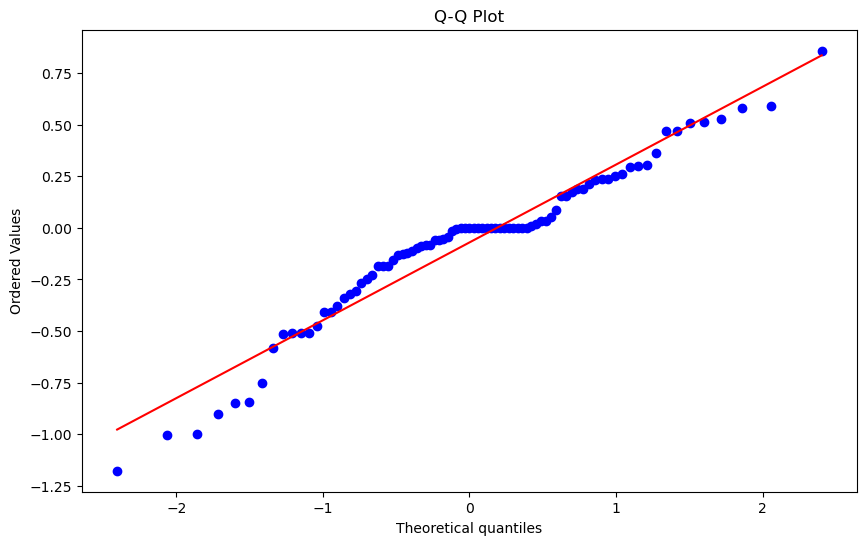

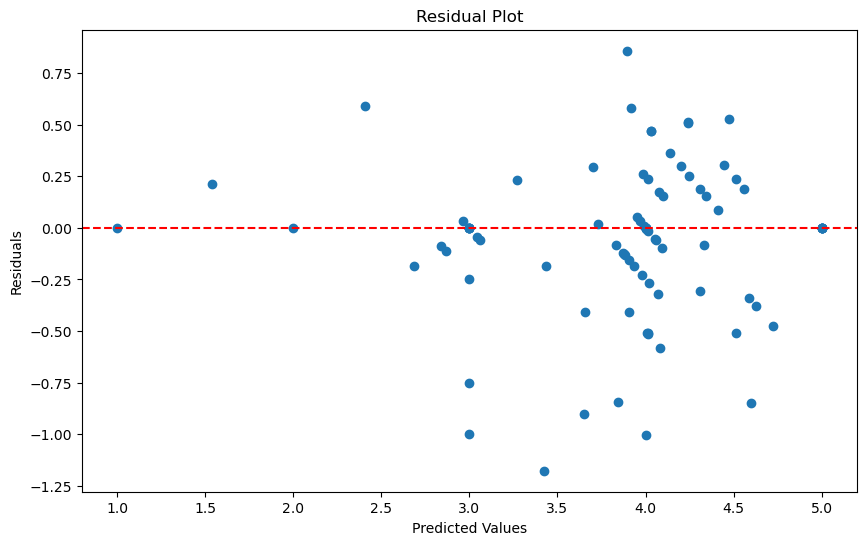

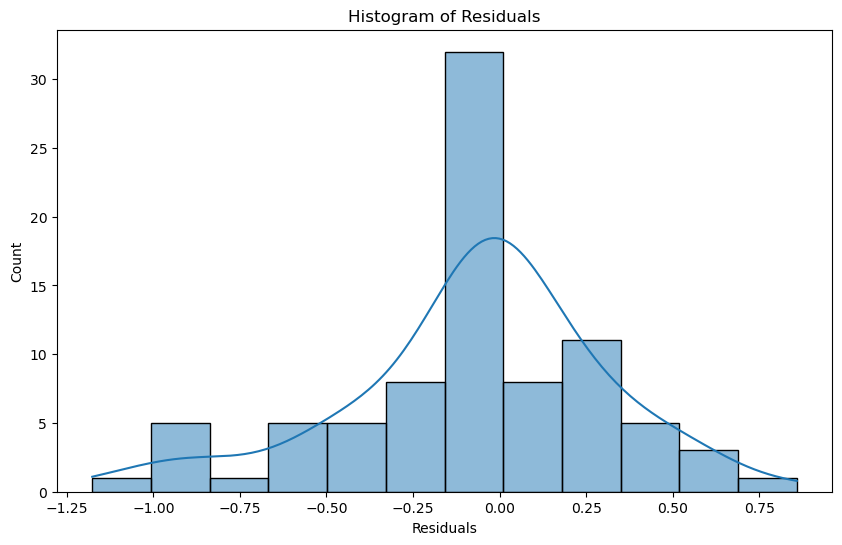

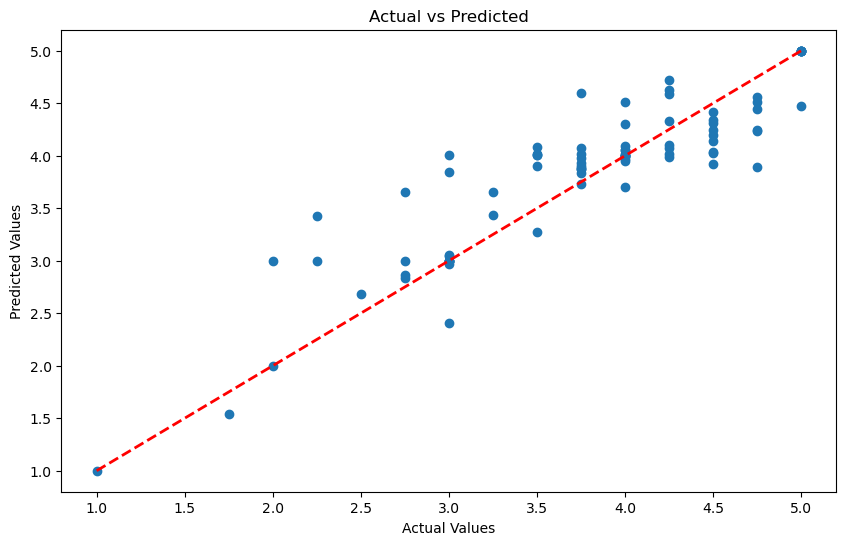

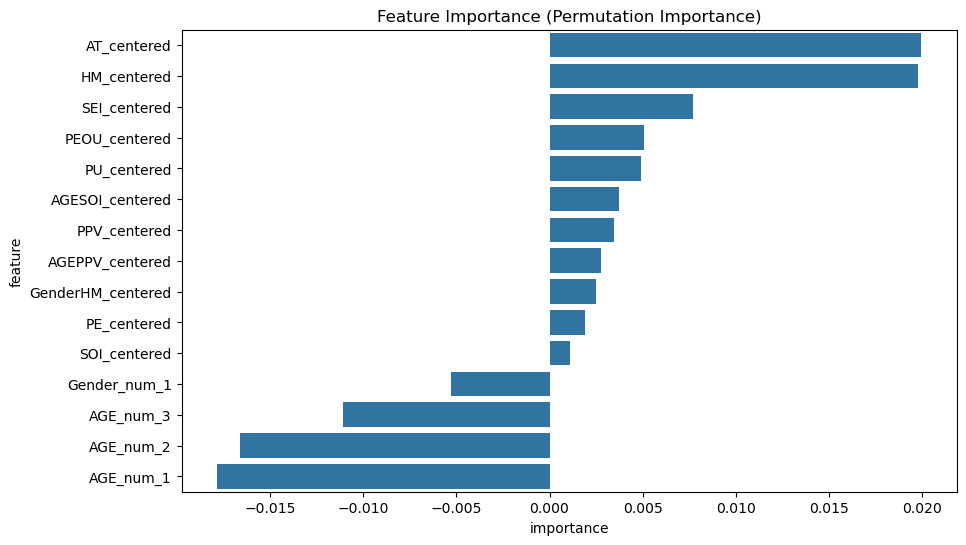

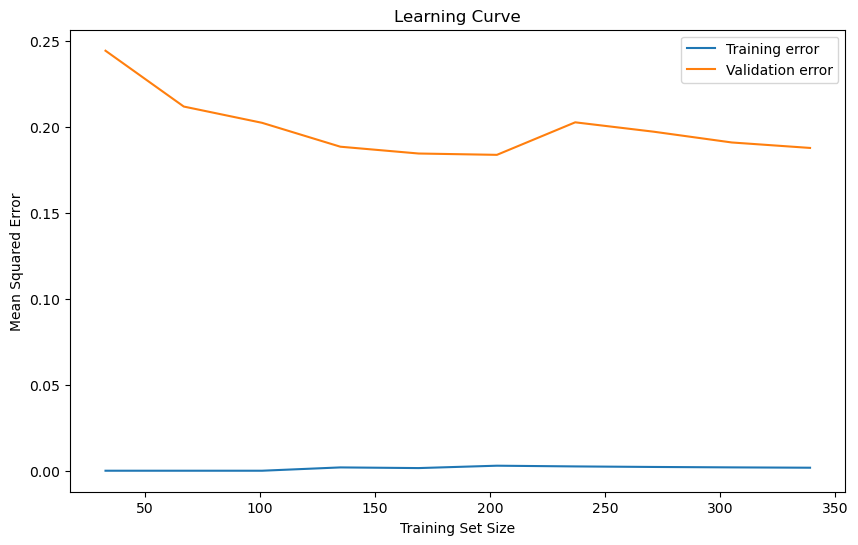


Largest residuals:
Index: 90, Residual: -1.1763, Actual: 2.2500, Predicted: 3.4263
Index: 24, Residual: -1.0028, Actual: 3.0000, Predicted: 4.0028
Index: 402, Residual: -1.0000, Actual: 2.0000, Predicted: 3.0000
Index: 46, Residual: -0.9011, Actual: 2.7500, Predicted: 3.6511
Index: 261, Residual: 0.8580, Actual: 4.7500, Predicted: 3.8920
Index: 184, Residual: -0.8468, Actual: 3.7500, Predicted: 4.5968
Index: 168, Residual: -0.8428, Actual: 3.0000, Predicted: 3.8428
Index: 371, Residual: -0.7500, Actual: 2.2500, Predicted: 3.0000
Index: 15, Residual: 0.5907, Actual: 3.0000, Predicted: 2.4093
Index: 104, Residual: -0.5826, Actual: 3.5000, Predicted: 4.0826

Feature values for largest residuals:
     AT_centered  PE_centered  SOI_centered  PU_centered  HM_centered  \
90     -1.500000    -0.794811     -0.964033    -0.068396    -0.869497   
24      0.166667     0.205189      0.035967    -0.068396     0.130503   
402    -0.833333     1.205189     -1.464033    -0.818396    -0.869497   
46   

In [224]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, median_absolute_error, max_error, explained_variance_score
from sklearn.model_selection import cross_val_score, learning_curve
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

 
features = [
    'AT_centered', 'PE_centered', 'SOI_centered', 'PU_centered', 'HM_centered',
    'SEI_centered', 'PEOU_centered', 'AGESOI_centered', 'PPV_centered', 'AGEPPV_centered',
    'GenderHM_centered', 'AGE_num', 'Gender_num'
]

X = df_survey_cleaned[features]
y = df_survey_cleaned['BI']  # Replace 'BI' with my actual target variable name

# Create dummy variables for categorical variables
X = pd.get_dummies(X, columns=['AGE_num', 'Gender_num'], drop_first=True)

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a pipeline
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('knn', KNeighborsRegressor(n_neighbors=11, weights='distance', metric='manhattan'))
])

# Fit the model
pipeline.fit(X_train, y_train)

# Make predictions
y_pred_train = pipeline.predict(X_train)
y_pred_test = pipeline.predict(X_test)

# Calculate metrics
mse_train = mean_squared_error(y_train, y_pred_train)
r2_train = r2_score(y_train, y_pred_train)
mse_test = mean_squared_error(y_test, y_pred_test)
r2_test = r2_score(y_test, y_pred_test)
rmse_test = np.sqrt(mse_test)
mae_test = mean_absolute_error(y_test, y_pred_test)
median_ae_test = median_absolute_error(y_test, y_pred_test)
max_err_test = max_error(y_test, y_pred_test)
ev_score_test = explained_variance_score(y_test, y_pred_test)

print("Training MSE:", mse_train)
print("Training R-squared:", r2_train)
print("Testing MSE:", mse_test)
print("Testing R-squared:", r2_test)
print("Testing RMSE:", rmse_test)
print("Testing MAE:", mae_test)
print("Testing Median AE:", median_ae_test)
print("Testing Max Error:", max_err_test)
print("Testing Explained Variance Score:", ev_score_test)

# Residuals
residuals_train = y_train - y_pred_train
residuals_test = y_test - y_pred_test

# QQ Plot
plt.figure(figsize=(10, 6))
stats.probplot(residuals_test, dist="norm", plot=plt)
plt.title("Q-Q Plot")
plt.show()

# Residual Plot
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_test, residuals_test)
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("Residual Plot")
plt.axhline(y=0, color='r', linestyle='--')
plt.show()

# Histogram of Residuals
plt.figure(figsize=(10, 6))
sns.histplot(residuals_test, kde=True)
plt.xlabel("Residuals")
plt.title("Histogram of Residuals")
plt.show()

# Actual vs Predicted Plot
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_test)
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Actual vs Predicted")
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.show()

# Feature Importance (using permutation importance for KNN)
from sklearn.inspection import permutation_importance

perm_importance = permutation_importance(pipeline, X_test, y_test, n_repeats=10, random_state=42)
feature_importance = pd.DataFrame({
    'feature': X.columns,
    'importance': perm_importance.importances_mean
})
feature_importance = feature_importance.sort_values('importance', ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(x='importance', y='feature', data=feature_importance)
plt.title('Feature Importance (Permutation Importance)')
plt.show()

# Learning Curve
train_sizes, train_scores, test_scores = learning_curve(
    pipeline, X, y, cv=5, n_jobs=-1, 
    train_sizes=np.linspace(0.1, 1.0, 10), scoring='neg_mean_squared_error')

train_scores_mean = -train_scores.mean(axis=1)
test_scores_mean = -test_scores.mean(axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_scores_mean, label='Training error')
plt.plot(train_sizes, test_scores_mean, label='Validation error')
plt.xlabel('Training Set Size')
plt.ylabel('Mean Squared Error')
plt.title('Learning Curve')
plt.legend()
plt.show()

# Additional residual analysis
residuals = y_test - y_pred_test
abs_residuals = np.abs(residuals)
sorted_indices = abs_residuals.argsort()[::-1]

# Get the 10 largest residuals
n_largest = 10
largest_residuals = residuals.iloc[sorted_indices[:n_largest]]
largest_residuals_indices = largest_residuals.index

# Print the largest residuals
print("\nLargest residuals:")
for index in largest_residuals_indices:
    actual = y_test.loc[index]
    predicted = y_pred_test[y_test.index == index][0]
    residual = residuals.loc[index]
    print(f"Index: {index}, Residual: {residual:.4f}, Actual: {actual:.4f}, Predicted: {predicted:.4f}")

# Examine the corresponding feature values
large_residuals_features = X_test.loc[largest_residuals_indices]
print("\nFeature values for largest residuals:")
print(large_residuals_features)

# Calculate some statistics about the residuals
print("\nResiduals Statistics:")
print(f"Mean: {np.mean(residuals):.4f}")
print(f"Standard Deviation: {np.std(residuals):.4f}")
print(f"Skewness: {pd.Series(residuals).skew():.4f}")
print(f"Kurtosis: {pd.Series(residuals).kurtosis():.4f}")

### RF with Most important features and best parameters

C:\Users\cemcd\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


Training MSE: 0.043124943437404445
Training R-squared: 0.9444110693630952
Testing MSE: 0.13490357944210188
Testing R-squared: 0.8077699654425587
Testing RMSE: 0.3672922262206238
Testing MAE: 0.24609116126194233
Testing Median AE: 0.14445792748917707
Testing Max Error: 1.0965833333333332
Testing Explained Variance Score: 0.8082241401631195


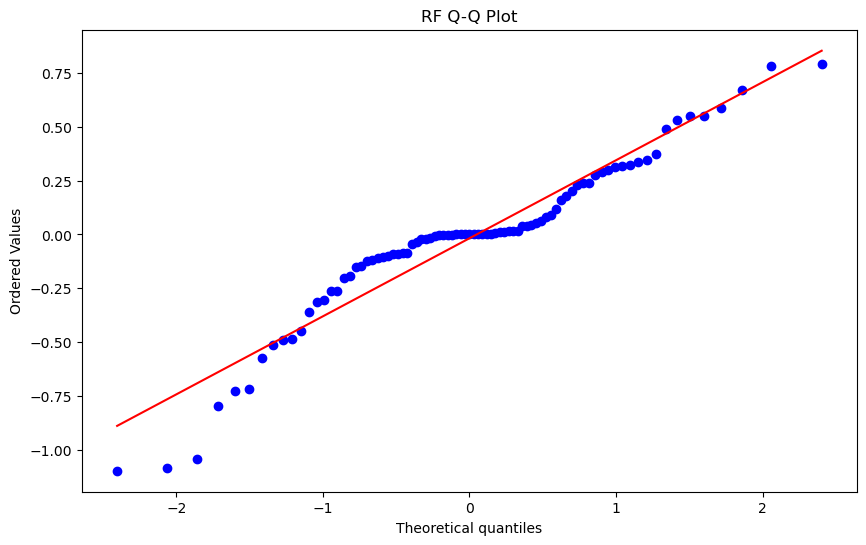

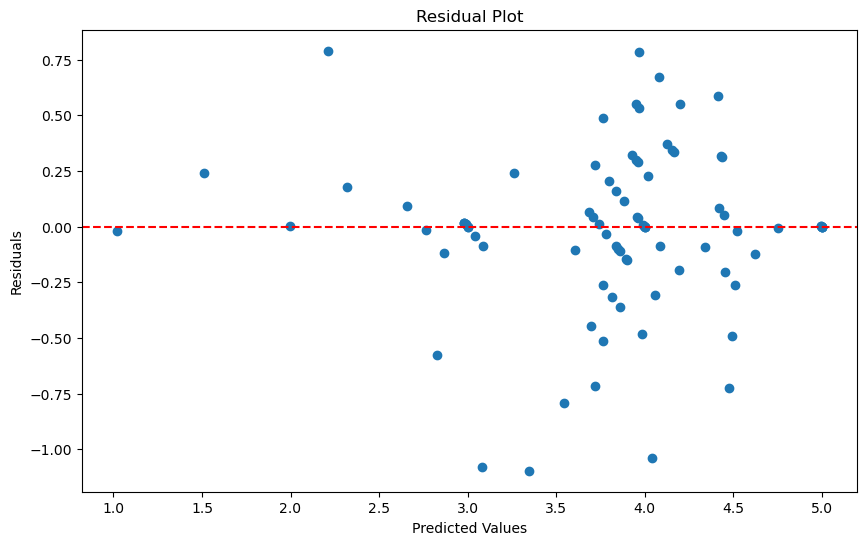

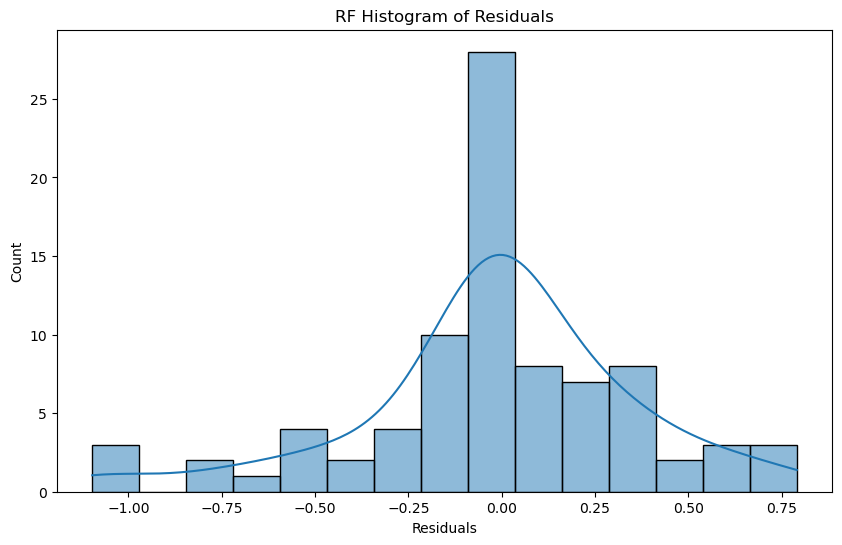

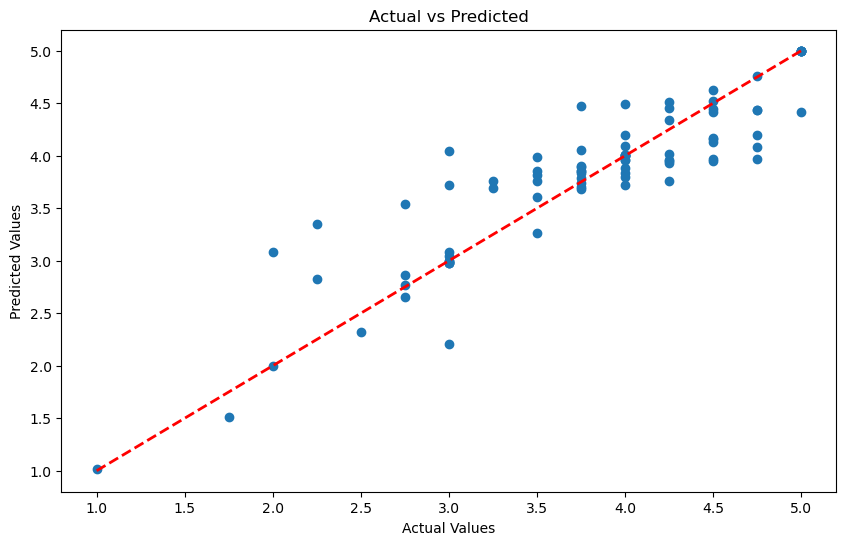

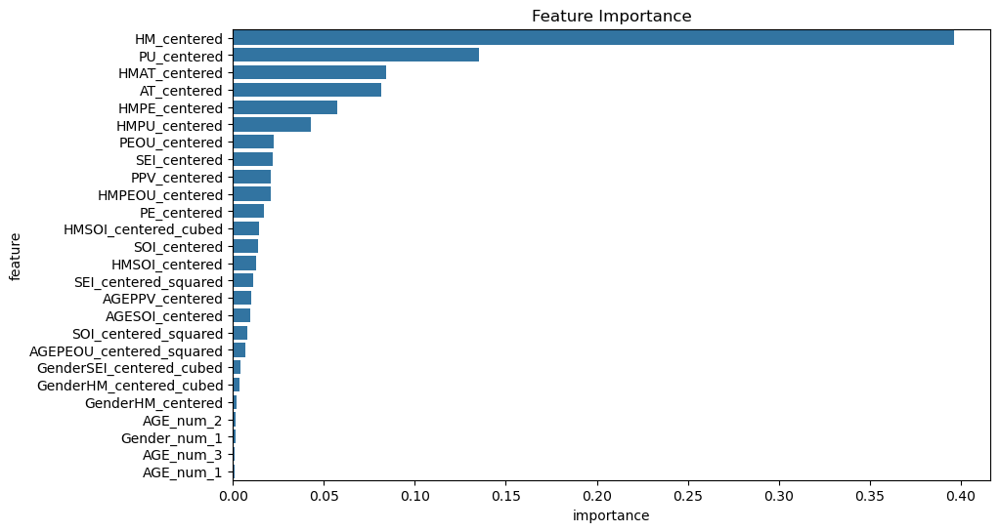

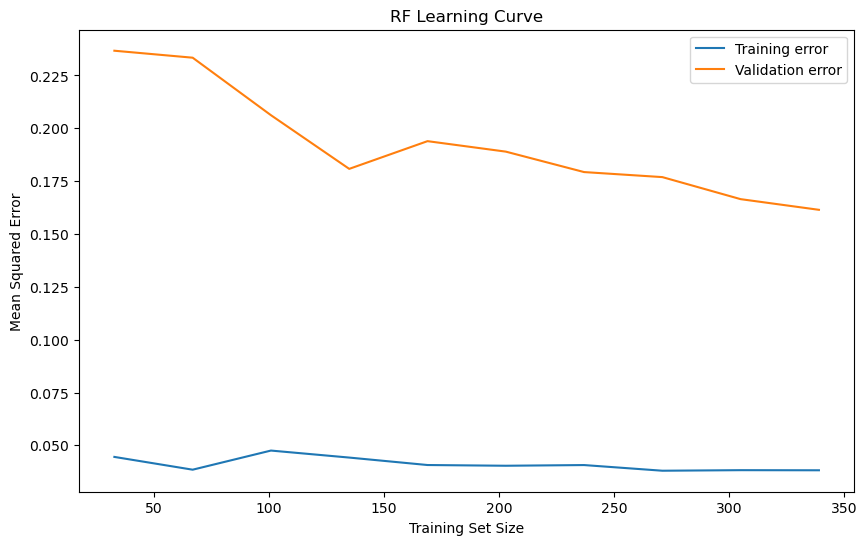


Largest residuals:
Index: 90, Residual: -1.0966, Actual: 2.2500, Predicted: 3.3466
Index: 402, Residual: -1.0819, Actual: 2.0000, Predicted: 3.0819
Index: 24, Residual: -1.0405, Actual: 3.0000, Predicted: 4.0405
Index: 46, Residual: -0.7940, Actual: 2.7500, Predicted: 3.5440
Index: 15, Residual: 0.7902, Actual: 3.0000, Predicted: 2.2098
Index: 271, Residual: 0.7834, Actual: 4.7500, Predicted: 3.9666
Index: 184, Residual: -0.7253, Actual: 3.7500, Predicted: 4.4753
Index: 168, Residual: -0.7171, Actual: 3.0000, Predicted: 3.7171
Index: 274, Residual: 0.6707, Actual: 4.7500, Predicted: 4.0793
Index: 73, Residual: 0.5879, Actual: 5.0000, Predicted: 4.4121

Feature values for largest residuals:
     HM_centered  PU_centered  HMAT_centered  HMPE_centered  AT_centered  \
90     -0.869497    -0.068396       1.304245       0.691086    -1.500000   
402    -0.869497    -0.818396       0.724581      -1.047908    -0.833333   
24      0.130503    -0.068396       0.021751       0.026778     0.166667

In [225]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, median_absolute_error, max_error, explained_variance_score
from sklearn.model_selection import cross_val_score, learning_curve
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

 
features = [
    'HM_centered', 'PU_centered', 'HMAT_centered', 'HMPE_centered', 'AT_centered',
    'HMPU_centered', 'SEI_centered', 'HMPEOU_centered', 'PPV_centered', 'PEOU_centered',
    'PE_centered', 'HMSOI_centered', 'HMSOI_centered_cubed', 'SEI_centered_squared',
    'AGEPPV_centered', 'AGESOI_centered', 'AGEPEOU_centered_squared', 'SOI_centered',
    'SOI_centered_squared', 'GenderSEI_centered_cubed', 'GenderHM_centered',
    'GenderHM_centered_cubed', 'AGE_num', 'Gender_num'
]

X = df_survey_cleaned[features]
y = df_survey_cleaned['BI']  # Replace 'BI' with my actual target variable name

# Create dummy variables for categorical variables
df_encoded = pd.get_dummies(X, columns=['AGE_num', 'Gender_num'], drop_first=True)

# Split the data
X_train, X_test, y_train, y_test = train_test_split(df_encoded, y, test_size=0.2, random_state=42)

# Create a pipeline
#Best parameters: {'rf__max_depth': 10, 'rf__max_features': 'auto', 'rf__min_samples_leaf': 1, 'rf__min_samples_split': 5, 'rf__n_estimators': 100}
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('rf', RandomForestRegressor(max_depth=10, max_features='auto', min_samples_leaf=1,
                                 min_samples_split=5, n_estimators=100, random_state=42))
])

# Fit the model
pipeline.fit(X_train, y_train)

# Make predictions
y_pred_train = pipeline.predict(X_train)
y_pred_test = pipeline.predict(X_test)

# Calculate metrics
mse_train = mean_squared_error(y_train, y_pred_train)
r2_train = r2_score(y_train, y_pred_train)
mse_test = mean_squared_error(y_test, y_pred_test)
r2_test = r2_score(y_test, y_pred_test)
rmse_test = np.sqrt(mse_test)
mae_test = mean_absolute_error(y_test, y_pred_test)
median_ae_test = median_absolute_error(y_test, y_pred_test)
max_err_test = max_error(y_test, y_pred_test)
ev_score_test = explained_variance_score(y_test, y_pred_test)

print("Training MSE:", mse_train)
print("Training R-squared:", r2_train)
print("Testing MSE:", mse_test)
print("Testing R-squared:", r2_test)
print("Testing RMSE:", rmse_test)
print("Testing MAE:", mae_test)
print("Testing Median AE:", median_ae_test)
print("Testing Max Error:", max_err_test)
print("Testing Explained Variance Score:", ev_score_test)

# Residuals
residuals_train = y_train - y_pred_train
residuals_test = y_test - y_pred_test

# QQ Plot
plt.figure(figsize=(10, 6))
stats.probplot(residuals_test, dist="norm", plot=plt)
plt.title("RF Q-Q Plot")
plt.show()

# Residual Plot
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_test, residuals_test)
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("Residual Plot")
plt.axhline(y=0, color='r', linestyle='--')
plt.show()

# Histogram of Residuals
plt.figure(figsize=(10, 6))
sns.histplot(residuals_test, kde=True)
plt.xlabel("Residuals")
plt.title("RF Histogram of Residuals")
plt.show()

# Actual vs Predicted Plot
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_test)
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Actual vs Predicted")
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.show()

# Feature Importance Plot
feature_importance = pd.DataFrame({
    'feature': df_encoded.columns,
    'importance': pipeline.named_steps['rf'].feature_importances_
})
feature_importance = feature_importance.sort_values('importance', ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(x='importance', y='feature', data=feature_importance)
plt.title('Feature Importance')
plt.show()

# Learning Curve
train_sizes, train_scores, test_scores = learning_curve(
    pipeline, df_encoded, y, cv=5, n_jobs=-1, 
    train_sizes=np.linspace(0.1, 1.0, 10), scoring='neg_mean_squared_error')

train_scores_mean = -train_scores.mean(axis=1)
test_scores_mean = -test_scores.mean(axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_scores_mean, label='Training error')
plt.plot(train_sizes, test_scores_mean, label='Validation error')
plt.xlabel('Training Set Size')
plt.ylabel('Mean Squared Error')
plt.title('RF Learning Curve')
plt.legend()
plt.show()

# Additional residual analysis
residuals = y_test - y_pred_test
abs_residuals = np.abs(residuals)
sorted_indices = abs_residuals.argsort()[::-1]

# Get the 10 largest residuals
n_largest = 10
largest_residuals = residuals.iloc[sorted_indices[:n_largest]]
largest_residuals_indices = largest_residuals.index

# Print the largest residuals
print("\nLargest residuals:")
for index in largest_residuals_indices:
    actual = y_test.loc[index]
    predicted = y_pred_test[y_test.index == index][0]
    residual = residuals.loc[index]
    print(f"Index: {index}, Residual: {residual:.4f}, Actual: {actual:.4f}, Predicted: {predicted:.4f}")

# Examine the corresponding feature values
large_residuals_features = X_test.loc[largest_residuals_indices]
print("\nFeature values for largest residuals:")
print(large_residuals_features)

# Calculate some statistics about the residuals
print("\nResiduals Statistics:")
print(f"Mean: {np.mean(residuals):.4f}")
print(f"Standard Deviation: {np.std(residuals):.4f}")
print(f"Skewness: {pd.Series(residuals).skew():.4f}")
print(f"Kurtosis: {pd.Series(residuals).kurtosis():.4f}")

### SVR with top Features and best parameters

Training MSE: 0.1552429488751218
Training R-squared: 0.7998886762735402
Testing MSE: 0.09640996287121545
Testing R-squared: 0.8626212101186733
Testing RMSE: 0.31049953763446325
Testing MAE: 0.20642362058227615
Testing Median AE: 0.13668878050026656
Testing Max Error: 0.9899331819707582
Testing Explained Variance Score: 0.8634739770011253


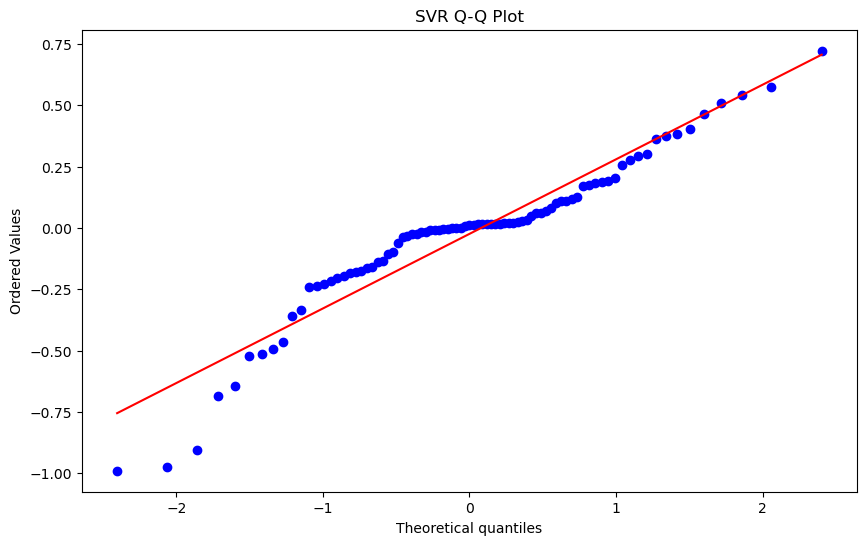

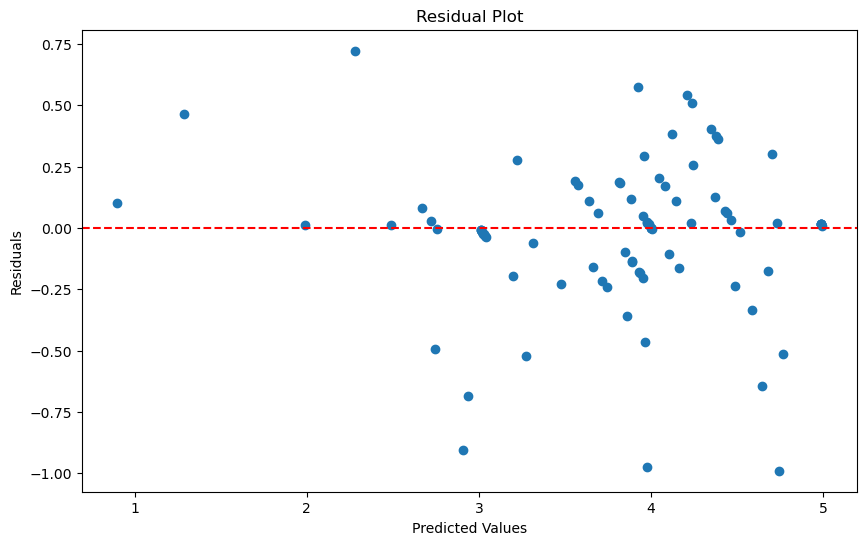

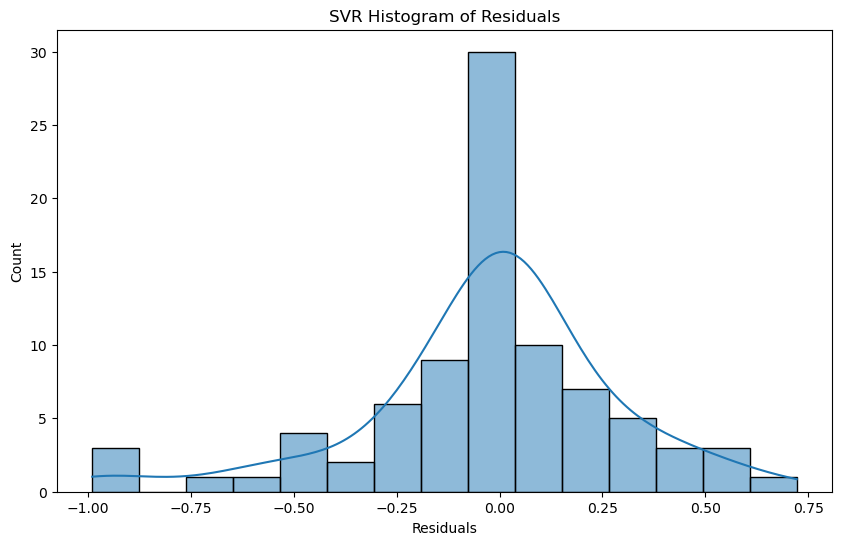

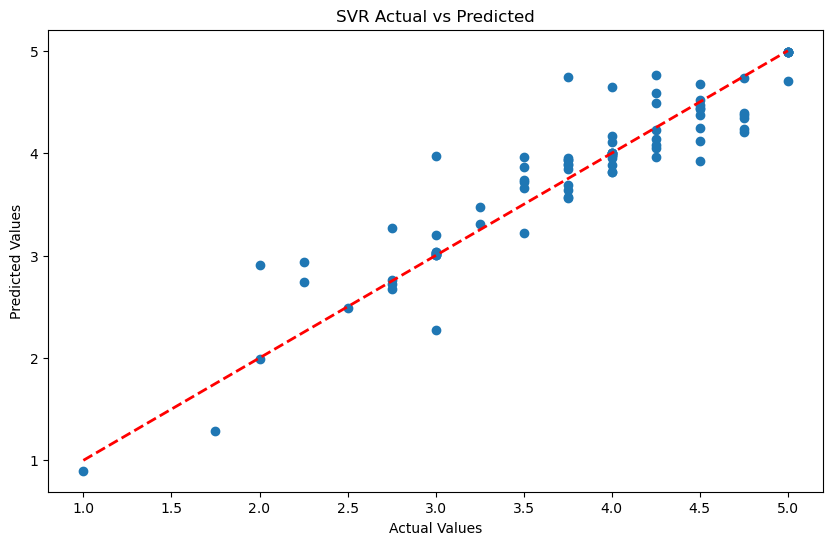

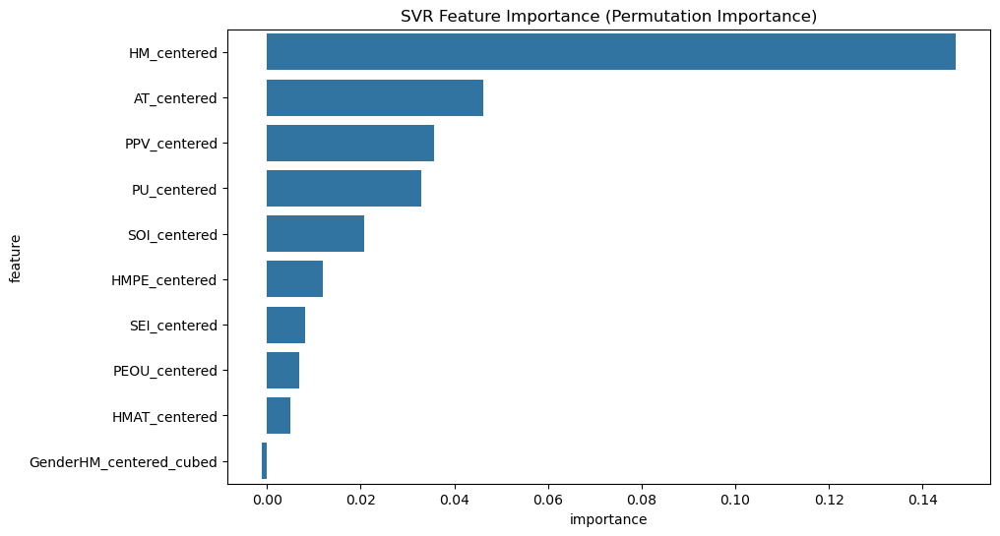

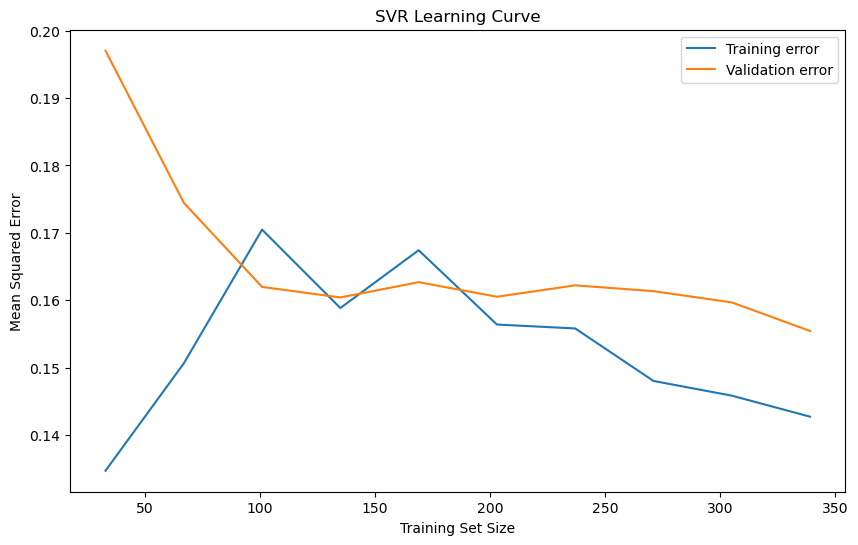


Largest residuals:
Index: 184, Residual: -0.9899, Actual: 3.7500, Predicted: 4.7399
Index: 24, Residual: -0.9746, Actual: 3.0000, Predicted: 3.9746
Index: 402, Residual: -0.9046, Actual: 2.0000, Predicted: 2.9046
Index: 15, Residual: 0.7224, Actual: 3.0000, Predicted: 2.2776
Index: 90, Residual: -0.6843, Actual: 2.2500, Predicted: 2.9343
Index: 336, Residual: -0.6442, Actual: 4.0000, Predicted: 4.6442
Index: 278, Residual: 0.5746, Actual: 4.5000, Predicted: 3.9254
Index: 271, Residual: 0.5428, Actual: 4.7500, Predicted: 4.2072
Index: 46, Residual: -0.5235, Actual: 2.7500, Predicted: 3.2735
Index: 415, Residual: -0.5140, Actual: 4.2500, Predicted: 4.7640

Feature values for largest residuals:
     HM_centered  AT_centered  PPV_centered  HMAT_centered  SOI_centered  \
184     1.130503     1.166667      0.544811       1.318920      0.285967   
24      0.130503     0.166667      0.544811       0.021751      0.035967   
402    -0.869497    -0.833333     -0.788522       0.724581     -1.4640

In [226]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, median_absolute_error, max_error, explained_variance_score
from sklearn.model_selection import cross_val_score, learning_curve
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

features = [
    'HM_centered', 'AT_centered', 'PPV_centered', 'HMAT_centered', 'SOI_centered',
    'PU_centered', 'GenderHM_centered_cubed', 'PEOU_centered', 'HMPE_centered', 'SEI_centered'
]

X = df_survey_cleaned[features]
y = df_survey_cleaned['BI']  # Replace 'BI' with my actual target variable name

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a pipeline
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('svr', SVR(C=10, epsilon=0.01, gamma=0.001, kernel='sigmoid'))
])

# Fit the model
pipeline.fit(X_train, y_train)

# Make predictions
y_pred_train = pipeline.predict(X_train)
y_pred_test = pipeline.predict(X_test)

# Calculate metrics
mse_train = mean_squared_error(y_train, y_pred_train)
r2_train = r2_score(y_train, y_pred_train)
mse_test = mean_squared_error(y_test, y_pred_test)
r2_test = r2_score(y_test, y_pred_test)
rmse_test = np.sqrt(mse_test)
mae_test = mean_absolute_error(y_test, y_pred_test)
median_ae_test = median_absolute_error(y_test, y_pred_test)
max_err_test = max_error(y_test, y_pred_test)
ev_score_test = explained_variance_score(y_test, y_pred_test)

print("Training MSE:", mse_train)
print("Training R-squared:", r2_train)
print("Testing MSE:", mse_test)
print("Testing R-squared:", r2_test)
print("Testing RMSE:", rmse_test)
print("Testing MAE:", mae_test)
print("Testing Median AE:", median_ae_test)
print("Testing Max Error:", max_err_test)
print("Testing Explained Variance Score:", ev_score_test)

# Residuals
residuals_train = y_train - y_pred_train
residuals_test = y_test - y_pred_test

# QQ Plot
plt.figure(figsize=(10, 6))
stats.probplot(residuals_test, dist="norm", plot=plt)
plt.title("SVR Q-Q Plot")
plt.show()

# Residual Plot
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_test, residuals_test)
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("Residual Plot")
plt.axhline(y=0, color='r', linestyle='--')
plt.show()

# Histogram of Residuals
plt.figure(figsize=(10, 6))
sns.histplot(residuals_test, kde=True)
plt.xlabel("Residuals")
plt.title("SVR Histogram of Residuals")
plt.show()

# Actual vs Predicted Plot
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_test)
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("SVR Actual vs Predicted")
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.show()

# Feature Importance (using permutation importance for SVR)
from sklearn.inspection import permutation_importance

perm_importance = permutation_importance(pipeline, X_test, y_test, n_repeats=10, random_state=42)
feature_importance = pd.DataFrame({
    'feature': features,
    'importance': perm_importance.importances_mean
})
feature_importance = feature_importance.sort_values('importance', ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(x='importance', y='feature', data=feature_importance)
plt.title('SVR Feature Importance (Permutation Importance)')
plt.show()

# Learning Curve
train_sizes, train_scores, test_scores = learning_curve(
    pipeline, X, y, cv=5, n_jobs=-1, 
    train_sizes=np.linspace(0.1, 1.0, 10), scoring='neg_mean_squared_error')

train_scores_mean = -train_scores.mean(axis=1)
test_scores_mean = -test_scores.mean(axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_scores_mean, label='Training error')
plt.plot(train_sizes, test_scores_mean, label='Validation error')
plt.xlabel('Training Set Size')
plt.ylabel('Mean Squared Error')
plt.title('SVR Learning Curve')
plt.legend()
plt.show()

# Additional residual analysis
residuals = y_test - y_pred_test
abs_residuals = np.abs(residuals)
sorted_indices = abs_residuals.argsort()[::-1]

# Get the 10 largest residuals
n_largest = 10
largest_residuals = residuals.iloc[sorted_indices[:n_largest]]
largest_residuals_indices = largest_residuals.index

# Print the largest residuals
print("\nLargest residuals:")
for index in largest_residuals_indices:
    actual = y_test.loc[index]
    predicted = y_pred_test[y_test.index == index][0]
    residual = residuals.loc[index]
    print(f"Index: {index}, Residual: {residual:.4f}, Actual: {actual:.4f}, Predicted: {predicted:.4f}")

# Examine the corresponding feature values
large_residuals_features = X_test.loc[largest_residuals_indices]
print("\nFeature values for largest residuals:")
print(large_residuals_features)

# Calculate some statistics about the residuals
print("\nResiduals Statistics:")
print(f"Mean: {np.mean(residuals):.4f}")
print(f"Standard Deviation: {np.std(residuals):.4f}")
print(f"Skewness: {pd.Series(residuals).skew():.4f}")
print(f"Kurtosis: {pd.Series(residuals).kurtosis():.4f}")

### MLP with top 15 features and best parameters 

Training MSE: 0.14521361199737892
Training R-squared: 0.8128166958277045
Testing MSE: 0.13086674102345383
Testing R-squared: 0.8135222337806466
Testing RMSE: 0.36175508430905823
Testing MAE: 0.2738335162737279
Testing Median AE: 0.1990362808742976
Testing Max Error: 0.9731705828930672
Testing Explained Variance Score: 0.8155378423343883


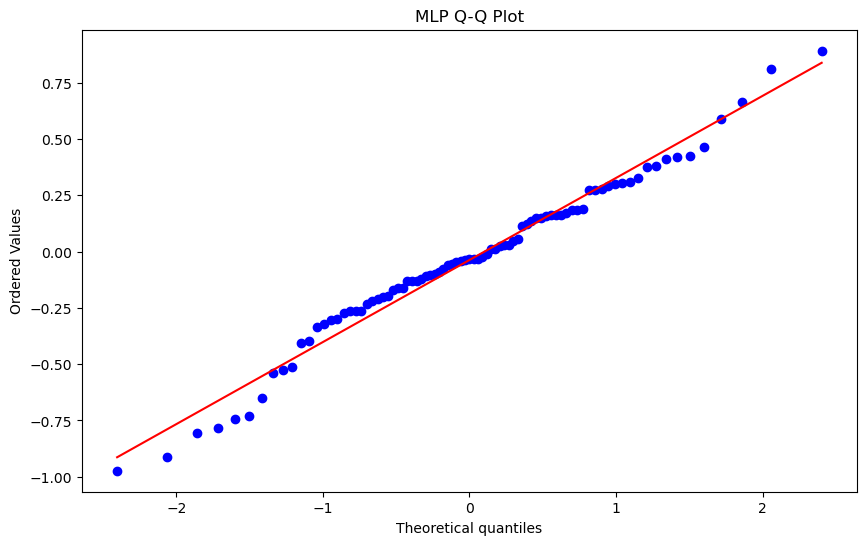

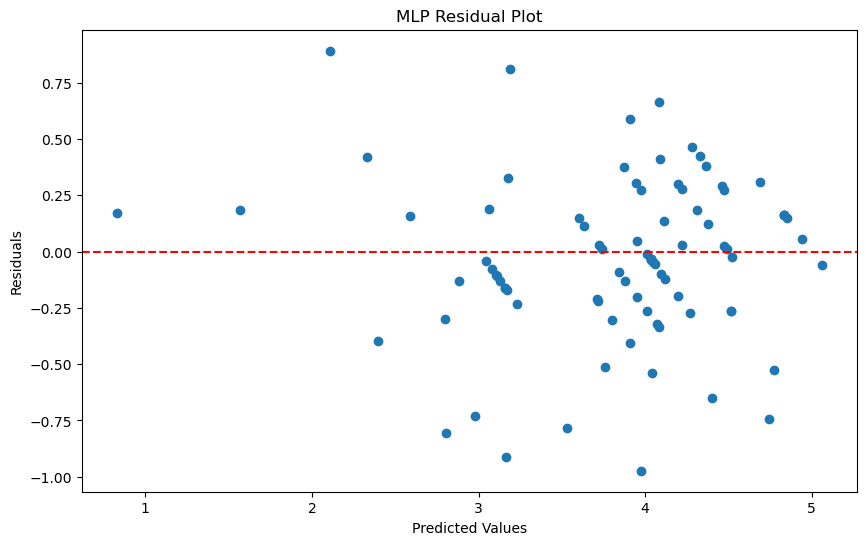

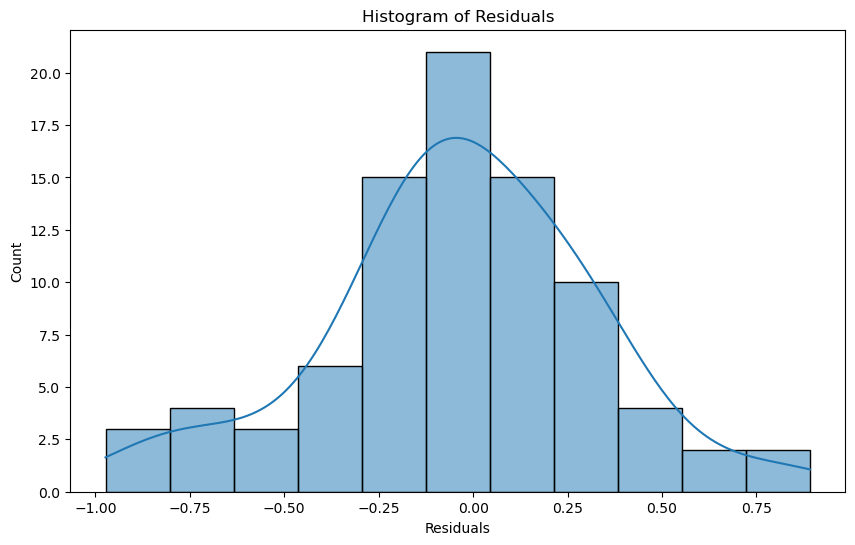

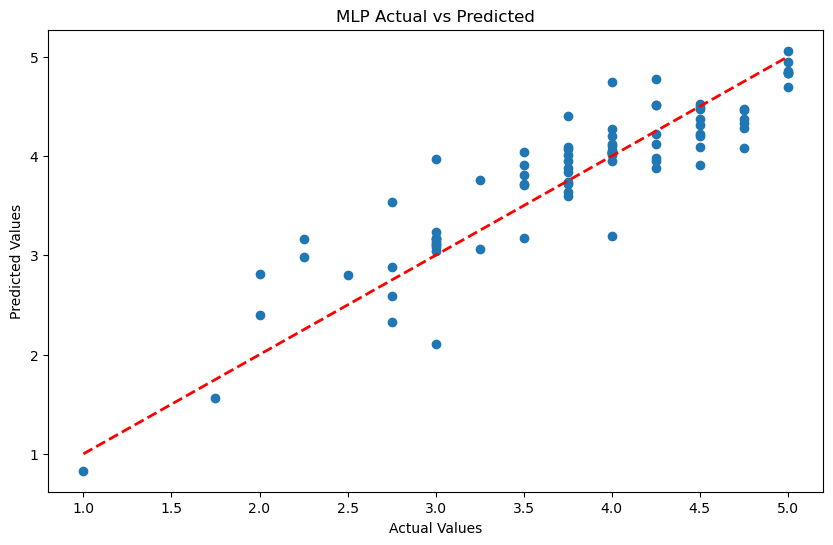

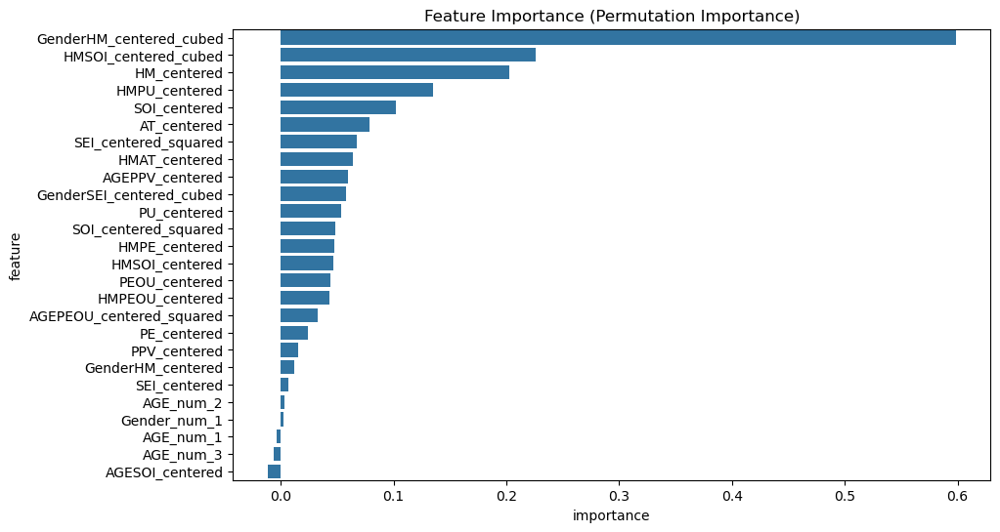

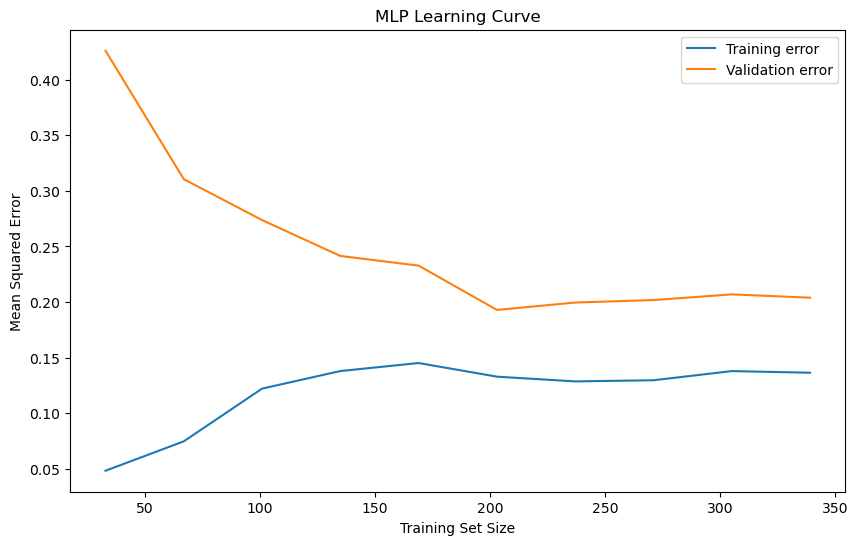


Largest residuals:
Index: 24, Residual: -0.9732, Actual: 3.0000, Predicted: 3.9732
Index: 90, Residual: -0.9137, Actual: 2.2500, Predicted: 3.1637
Index: 15, Residual: 0.8917, Actual: 3.0000, Predicted: 2.1083
Index: 297, Residual: 0.8090, Actual: 4.0000, Predicted: 3.1910
Index: 402, Residual: -0.8074, Actual: 2.0000, Predicted: 2.8074
Index: 46, Residual: -0.7840, Actual: 2.7500, Predicted: 3.5340
Index: 336, Residual: -0.7443, Actual: 4.0000, Predicted: 4.7443
Index: 371, Residual: -0.7305, Actual: 2.2500, Predicted: 2.9805
Index: 274, Residual: 0.6647, Actual: 4.7500, Predicted: 4.0853
Index: 184, Residual: -0.6487, Actual: 3.7500, Predicted: 4.3987

Feature values for largest residuals:
     GenderHM_centered_cubed  HM_centered  PPV_centered  HMSOI_centered  \
24                  0.000000     0.130503      0.544811        0.004694   
90                 -0.657361    -0.869497     -1.121855        0.838224   
15                 -0.000000    -1.536164     -1.788522        2.633035  

In [227]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, median_absolute_error, max_error, explained_variance_score
from sklearn.model_selection import cross_val_score, learning_curve
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
 
features = [
    'GenderHM_centered_cubed', 'HM_centered', 'PPV_centered', 'HMSOI_centered',
    'AGESOI_centered', 'HMAT_centered', 'HMPEOU_centered', 'AT_centered',
    'HMPE_centered', 'GenderSEI_centered_cubed', 'PEOU_centered', 'SEI_centered_squared',
    'AGEPPV_centered', 'PU_centered', 'GenderHM_centered', 'AGEPEOU_centered_squared',
    'SEI_centered', 'PE_centered', 'HMPU_centered', 'SOI_centered_squared',
    'SOI_centered', 'AGE_num', 'HMSOI_centered_cubed', 'Gender_num'
]

X = df_survey_cleaned[features]
y = df_survey_cleaned['BI']  # Replace 'BI' with my actual target variable name

# Create dummy variables for categorical variables
df_encoded = pd.get_dummies(X, columns=['AGE_num', 'Gender_num'], drop_first=True)

# Split the data
X_train, X_test, y_train, y_test = train_test_split(df_encoded, y, test_size=0.2, random_state=42)

# Create a pipeline
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('mlp', MLPRegressor(hidden_layer_sizes=(50, 50), activation='tanh', alpha=0.2,
                         learning_rate='adaptive', learning_rate_init=0.001,
                         solver='sgd', max_iter=2000, random_state=42))
])

# Fit the model
pipeline.fit(X_train, y_train)

# Make predictions
y_pred_train = pipeline.predict(X_train)
y_pred_test = pipeline.predict(X_test)

# Calculate metrics
mse_train = mean_squared_error(y_train, y_pred_train)
r2_train = r2_score(y_train, y_pred_train)
mse_test = mean_squared_error(y_test, y_pred_test)
r2_test = r2_score(y_test, y_pred_test)
rmse_test = np.sqrt(mse_test)
mae_test = mean_absolute_error(y_test, y_pred_test)
median_ae_test = median_absolute_error(y_test, y_pred_test)
max_err_test = max_error(y_test, y_pred_test)
ev_score_test = explained_variance_score(y_test, y_pred_test)

print("Training MSE:", mse_train)
print("Training R-squared:", r2_train)
print("Testing MSE:", mse_test)
print("Testing R-squared:", r2_test)
print("Testing RMSE:", rmse_test)
print("Testing MAE:", mae_test)
print("Testing Median AE:", median_ae_test)
print("Testing Max Error:", max_err_test)
print("Testing Explained Variance Score:", ev_score_test)

# Residuals
residuals_train = y_train - y_pred_train
residuals_test = y_test - y_pred_test

# QQ Plot
plt.figure(figsize=(10, 6))
stats.probplot(residuals_test, dist="norm", plot=plt)
plt.title("MLP Q-Q Plot")
plt.show()

# Residual Plot
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_test, residuals_test)
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("MLP Residual Plot")
plt.axhline(y=0, color='r', linestyle='--')
plt.show()

# Histogram of Residuals
plt.figure(figsize=(10, 6))
sns.histplot(residuals_test, kde=True)
plt.xlabel("Residuals")
plt.title("Histogram of Residuals")
plt.show()

# Actual vs Predicted Plot
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_test)
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("MLP Actual vs Predicted")
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.show()

# Feature Importance (using permutation importance for MLP)
from sklearn.inspection import permutation_importance

perm_importance = permutation_importance(pipeline, X_test, y_test, n_repeats=10, random_state=42)
feature_importance = pd.DataFrame({
    'feature': df_encoded.columns,
    'importance': perm_importance.importances_mean
})
feature_importance = feature_importance.sort_values('importance', ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(x='importance', y='feature', data=feature_importance)
plt.title('Feature Importance (Permutation Importance)')
plt.show()

# Learning Curve
train_sizes, train_scores, test_scores = learning_curve(
    pipeline, df_encoded, y, cv=5, n_jobs=-1, 
    train_sizes=np.linspace(0.1, 1.0, 10), scoring='neg_mean_squared_error')

train_scores_mean = -train_scores.mean(axis=1)
test_scores_mean = -test_scores.mean(axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_scores_mean, label='Training error')
plt.plot(train_sizes, test_scores_mean, label='Validation error')
plt.xlabel('Training Set Size')
plt.ylabel('Mean Squared Error')
plt.title('MLP Learning Curve')
plt.legend()
plt.show()

# Additional residual analysis
residuals = y_test - y_pred_test
abs_residuals = np.abs(residuals)
sorted_indices = abs_residuals.argsort()[::-1]

# Get the 10 largest residuals
n_largest = 10
largest_residuals = residuals.iloc[sorted_indices[:n_largest]]
largest_residuals_indices = largest_residuals.index

# Print the largest residuals
print("\nLargest residuals:")
for index in largest_residuals_indices:
    actual = y_test.loc[index]
    predicted = y_pred_test[y_test.index == index][0]
    residual = residuals.loc[index]
    print(f"Index: {index}, Residual: {residual:.4f}, Actual: {actual:.4f}, Predicted: {predicted:.4f}")

# Examine the corresponding feature values
large_residuals_features = X_test.loc[largest_residuals_indices]
print("\nFeature values for largest residuals:")
print(large_residuals_features)

# Calculate some statistics about the residuals
print("\nResiduals Statistics:")
print(f"Mean: {np.mean(residuals):.4f}")
print(f"Standard Deviation: {np.std(residuals):.4f}")
print(f"Skewness: {pd.Series(residuals).skew():.4f}")
print(f"Kurtosis: {pd.Series(residuals).kurtosis():.4f}")

### MLP 2nd run to improve results kept only top 15 features

Training MSE: 0.15623108038337188
Training R-squared: 0.7986149546290819
Testing MSE: 0.11564454336193675
Testing R-squared: 0.8352130117022917
Testing RMSE: 0.3400654986350964
Testing MAE: 0.25719488393431694
Testing Median AE: 0.20533020103749156
Testing Max Error: 0.96204754293553
Testing Explained Variance Score: 0.8352130446205605


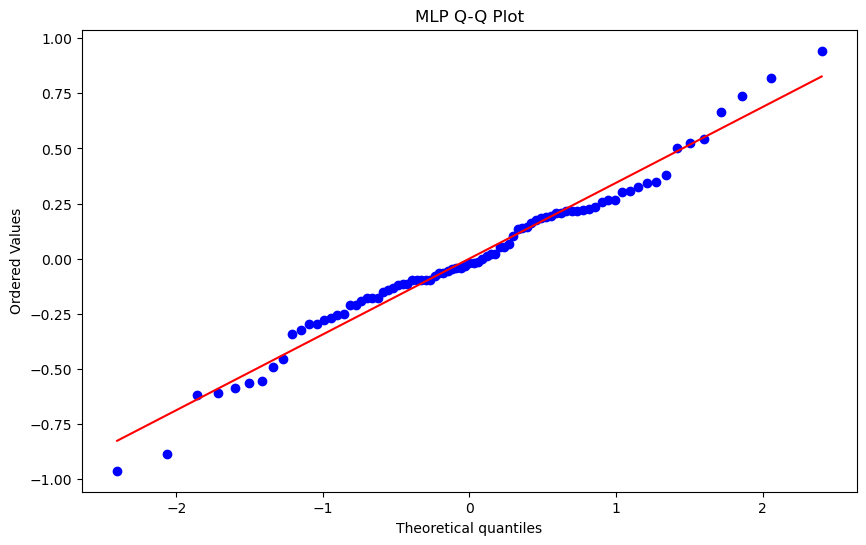

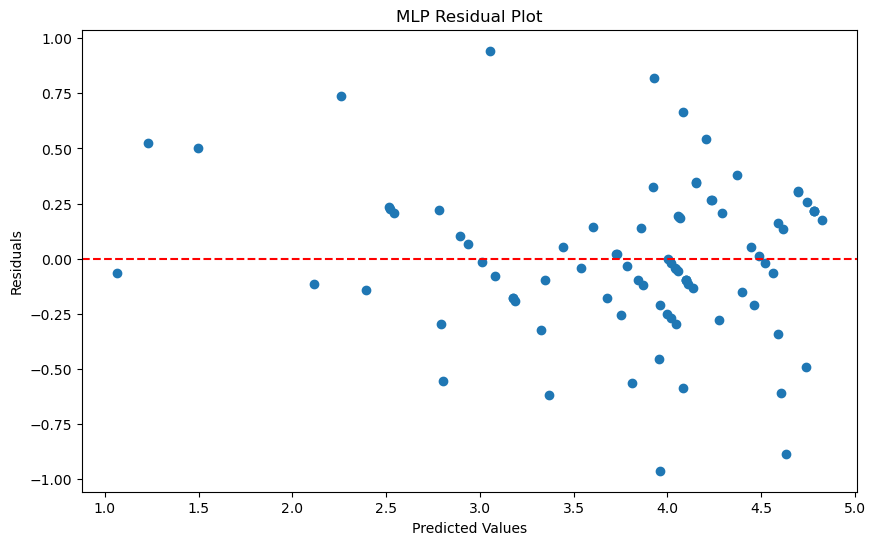

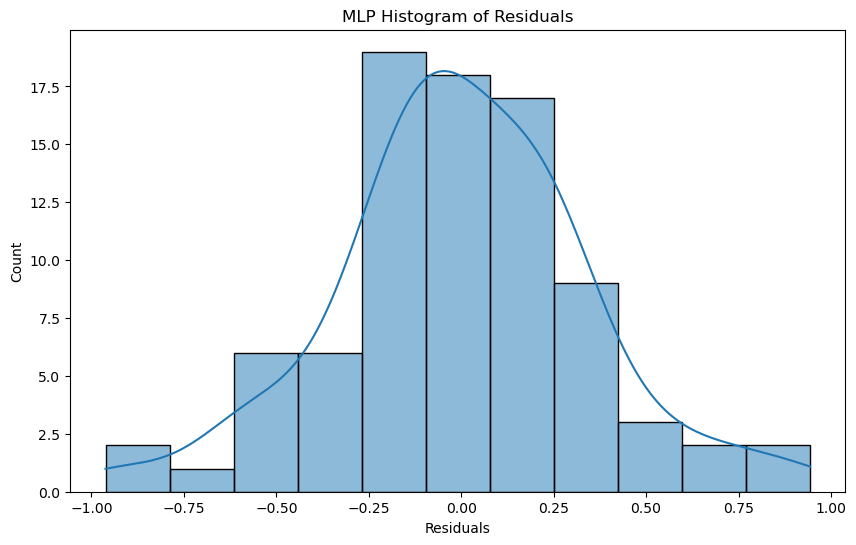

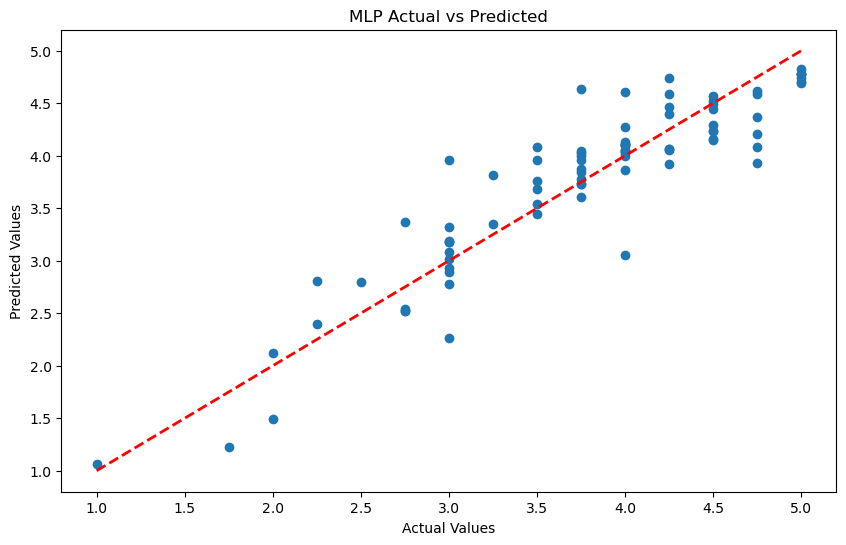

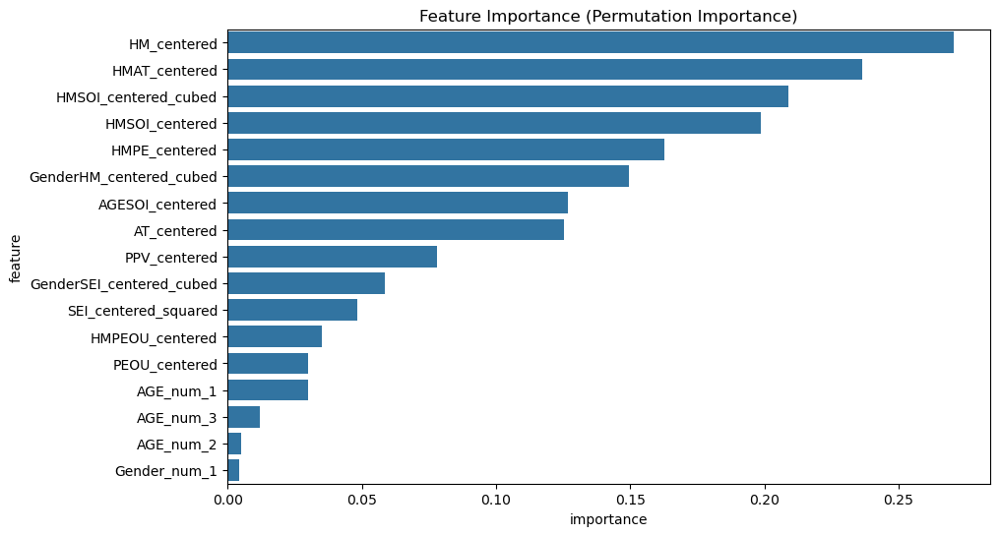

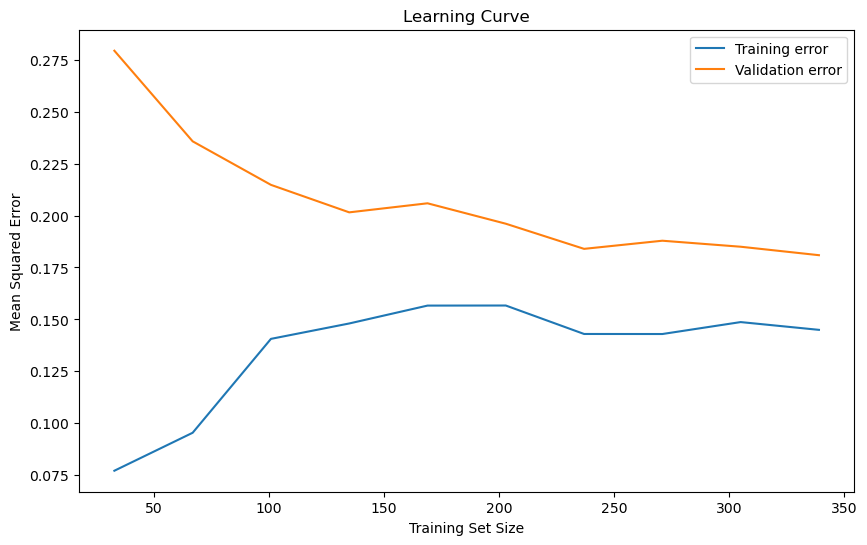


Largest residuals:
Index: 24, Residual: -0.9620, Actual: 3.0000, Predicted: 3.9620
Index: 297, Residual: 0.9433, Actual: 4.0000, Predicted: 3.0567
Index: 184, Residual: -0.8842, Actual: 3.7500, Predicted: 4.6342
Index: 271, Residual: 0.8216, Actual: 4.7500, Predicted: 3.9284
Index: 15, Residual: 0.7385, Actual: 3.0000, Predicted: 2.2615
Index: 274, Residual: 0.6664, Actual: 4.7500, Predicted: 4.0836
Index: 46, Residual: -0.6179, Actual: 2.7500, Predicted: 3.3679
Index: 336, Residual: -0.6088, Actual: 4.0000, Predicted: 4.6088
Index: 239, Residual: -0.5856, Actual: 3.5000, Predicted: 4.0856
Index: 19, Residual: -0.5620, Actual: 3.2500, Predicted: 3.8120

Feature values for largest residuals:
     GenderHM_centered_cubed  HM_centered  PPV_centered  HMSOI_centered  \
24                  0.000000     0.130503      0.544811        0.004694   
297                 0.506585     0.797170     -0.121855       -0.967790   
184                 1.444825     1.130503      0.544811        0.323287   

In [228]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, median_absolute_error, max_error, explained_variance_score
from sklearn.model_selection import cross_val_score, learning_curve
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats


features = [
    'GenderHM_centered_cubed', 'HM_centered', 'PPV_centered', 'HMSOI_centered',
    'AGESOI_centered', 'HMAT_centered', 'HMPEOU_centered', 'AT_centered',
    'HMPE_centered', 'GenderSEI_centered_cubed', 'PEOU_centered', 'SEI_centered_squared',
    'AGE_num', 'HMSOI_centered_cubed', 'Gender_num'
]

X = df_survey_cleaned[features]
y = df_survey_cleaned['BI']  # Replace 'BI' with my actual target variable name

# Create dummy variables for categorical variables
df_encoded = pd.get_dummies(X, columns=['AGE_num', 'Gender_num'], drop_first=True)

# Split the data
X_train, X_test, y_train, y_test = train_test_split(df_encoded, y, test_size=0.2, random_state=42)

# Create a pipeline
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('mlp', MLPRegressor(hidden_layer_sizes=(50, 50), activation='tanh', alpha=0.2,
                         learning_rate='adaptive', learning_rate_init=0.001,
                         solver='sgd', max_iter=2000, random_state=42))
])

# Fit the model
pipeline.fit(X_train, y_train)

# Make predictions
y_pred_train = pipeline.predict(X_train)
y_pred_test = pipeline.predict(X_test)

# Calculate metrics
mse_train = mean_squared_error(y_train, y_pred_train)
r2_train = r2_score(y_train, y_pred_train)
mse_test = mean_squared_error(y_test, y_pred_test)
r2_test = r2_score(y_test, y_pred_test)
rmse_test = np.sqrt(mse_test)
mae_test = mean_absolute_error(y_test, y_pred_test)
median_ae_test = median_absolute_error(y_test, y_pred_test)
max_err_test = max_error(y_test, y_pred_test)
ev_score_test = explained_variance_score(y_test, y_pred_test)

print("Training MSE:", mse_train)
print("Training R-squared:", r2_train)
print("Testing MSE:", mse_test)
print("Testing R-squared:", r2_test)
print("Testing RMSE:", rmse_test)
print("Testing MAE:", mae_test)
print("Testing Median AE:", median_ae_test)
print("Testing Max Error:", max_err_test)
print("Testing Explained Variance Score:", ev_score_test)

# Residuals
residuals_train = y_train - y_pred_train
residuals_test = y_test - y_pred_test

# QQ Plot
plt.figure(figsize=(10, 6))
stats.probplot(residuals_test, dist="norm", plot=plt)
plt.title("MLP Q-Q Plot")
plt.show()

# Residual Plot
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_test, residuals_test)
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("MLP Residual Plot")
plt.axhline(y=0, color='r', linestyle='--')
plt.show()

# Histogram of Residuals
plt.figure(figsize=(10, 6))
sns.histplot(residuals_test, kde=True)
plt.xlabel("Residuals")
plt.title("MLP Histogram of Residuals")
plt.show()

# Actual vs Predicted Plot
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_test)
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("MLP Actual vs Predicted")
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.show()

# Feature Importance (using permutation importance for MLP)
from sklearn.inspection import permutation_importance

perm_importance = permutation_importance(pipeline, X_test, y_test, n_repeats=10, random_state=42)
feature_importance = pd.DataFrame({
    'feature': df_encoded.columns,
    'importance': perm_importance.importances_mean
})
feature_importance = feature_importance.sort_values('importance', ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(x='importance', y='feature', data=feature_importance)
plt.title('Feature Importance (Permutation Importance)')
plt.show()

# Learning Curve
train_sizes, train_scores, test_scores = learning_curve(
    pipeline, df_encoded, y, cv=5, n_jobs=-1, 
    train_sizes=np.linspace(0.1, 1.0, 10), scoring='neg_mean_squared_error')

train_scores_mean = -train_scores.mean(axis=1)
test_scores_mean = -test_scores.mean(axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_scores_mean, label='Training error')
plt.plot(train_sizes, test_scores_mean, label='Validation error')
plt.xlabel('Training Set Size')
plt.ylabel('Mean Squared Error')
plt.title('Learning Curve')
plt.legend()
plt.show()

# Additional residual analysis
residuals = y_test - y_pred_test
abs_residuals = np.abs(residuals)
sorted_indices = abs_residuals.argsort()[::-1]

# Get the 10 largest residuals
n_largest = 10
largest_residuals = residuals.iloc[sorted_indices[:n_largest]]
largest_residuals_indices = largest_residuals.index

# Print the largest residuals
print("\nLargest residuals:")
for index in largest_residuals_indices:
    actual = y_test.loc[index]
    predicted = y_pred_test[y_test.index == index][0]
    residual = residuals.loc[index]
    print(f"Index: {index}, Residual: {residual:.4f}, Actual: {actual:.4f}, Predicted: {predicted:.4f}")

# Examine the corresponding feature values
large_residuals_features = X_test.loc[largest_residuals_indices]
print("\nFeature values for largest residuals:")
print(large_residuals_features)

# Calculate some statistics about the residuals
print("\nResiduals Statistics:")
print(f"Mean: {np.mean(residuals):.4f}")
print(f"Standard Deviation: {np.std(residuals):.4f}")
print(f"Skewness: {pd.Series(residuals).skew():.4f}")
print(f"Kurtosis: {pd.Series(residuals).kurtosis():.4f}")

## Use Boosting method to combine models

In [229]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.base import BaseEstimator, RegressorMixin


features = [
    'HM_centered', 'PU_centered', 'HMAT_centered', 'HMPE_centered', 'AT_centered',
    'HMPU_centered', 'SEI_centered', 'HMPEOU_centered', 'PPV_centered', 'PEOU_centered',
    'PE_centered', 'HMSOI_centered', 'HMSOI_centered_cubed', 'SEI_centered_squared',
    'AGEPPV_centered', 'AGESOI_centered', 'AGEPEOU_centered_squared', 'SOI_centered',
    'SOI_centered_squared', 'GenderSEI_centered_cubed', 'GenderHM_centered',
    'GenderHM_centered_cubed', 'AGE_num', 'Gender_num'
]

X = df_survey_cleaned[features]
y = df_survey_cleaned['BI']  # Replace 'BI' with my actual target variable name

# Create dummy variables for categorical variables
X = pd.get_dummies(X, columns=['AGE_num', 'Gender_num'], drop_first=True)

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a custom wrapper for our models to ensure they have fit and predict methods
class ModelWrapper(BaseEstimator, RegressorMixin):
    def __init__(self, model):
        self.model = model

    def fit(self, X, y):
        self.model.fit(X, y)
        return self

    def predict(self, X):
        return self.model.predict(X)

# Create individual models
mlr = Pipeline([
    ('scaler', StandardScaler()),
    ('model', LinearRegression())
])

knn = Pipeline([
    ('scaler', StandardScaler()),
    ('model', KNeighborsRegressor(n_neighbors=11, weights='distance', metric='manhattan'))
])

rf = Pipeline([
    ('scaler', StandardScaler()),
    ('model', RandomForestRegressor(max_depth=10, max_features='auto', min_samples_leaf=1,
                                    min_samples_split=5, n_estimators=100, random_state=42))
])

svr = Pipeline([
    ('scaler', StandardScaler()),
    ('model', SVR(C=10, epsilon=0.01, gamma=0.001, kernel='sigmoid'))
])

mlp = Pipeline([
    ('scaler', StandardScaler()),
    ('model', MLPRegressor(hidden_layer_sizes=(50, 50), activation='tanh', alpha=0.2,
                           learning_rate='adaptive', learning_rate_init=0.001,
                           solver='sgd', max_iter=2000, random_state=42))
])

# Create the boosting ensemble
boosting_ensemble = AdaBoostRegressor(
    estimator=ModelWrapper(mlr),
    n_estimators=50,
    random_state=42
)

# Fit the boosting ensemble
boosting_ensemble.fit(X_train, y_train)

# Make predictions
y_pred_train = boosting_ensemble.predict(X_train)
y_pred_test = boosting_ensemble.predict(X_test)

# Calculate metrics
mse_train = mean_squared_error(y_train, y_pred_train)
r2_train = r2_score(y_train, y_pred_train)
mse_test = mean_squared_error(y_test, y_pred_test)
r2_test = r2_score(y_test, y_pred_test)

print("Boosting Ensemble Results:")
print("Training MSE:", mse_train)
print("Training R-squared:", r2_train)
print("Testing MSE:", mse_test)
print("Testing R-squared:", r2_test)

# You can also evaluate individual models for comparison
models = [mlr, knn, rf, svr, mlp]
model_names = ['MLR', 'KNN', 'RF', 'SVR', 'MLP']

for name, model in zip(model_names, models):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    print(f"\n{name} Results:")
    print("Testing MSE:", mse)
    print("Testing R-squared:", r2)

Boosting Ensemble Results:
Training MSE: 0.15149384644381017
Training R-squared: 0.8047213456846278
Testing MSE: 0.15151410059838122
Testing R-squared: 0.7841009044058271

MLR Results:
Testing MSE: 0.11166622834999727
Testing R-squared: 0.8408818874681399

KNN Results:
Testing MSE: 0.14879439802071429
Testing R-squared: 0.7879763280428645


C:\Users\cemcd\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(



RF Results:
Testing MSE: 0.13490357944210188
Testing R-squared: 0.8077699654425587

SVR Results:
Testing MSE: 0.0967124510075082
Testing R-squared: 0.8621901814896833

MLP Results:
Testing MSE: 0.11852590738792668
Testing R-squared: 0.8311072295682725


## 2nd try leaving out KNN

Boosting Ensemble Results:
Training MSE: 0.15149384644381017
Training R-squared: 0.8047213456846278
Testing MSE: 0.15151410059838122
Testing R-squared: 0.7841009044058271
Testing RMSE: 0.38924812215138715
Testing MAE: 0.299743052640981
Testing Median AE: 0.2514415888049437
Testing Max Error: 1.2349394988238207
Testing Explained Variance Score: 0.7862750306787974


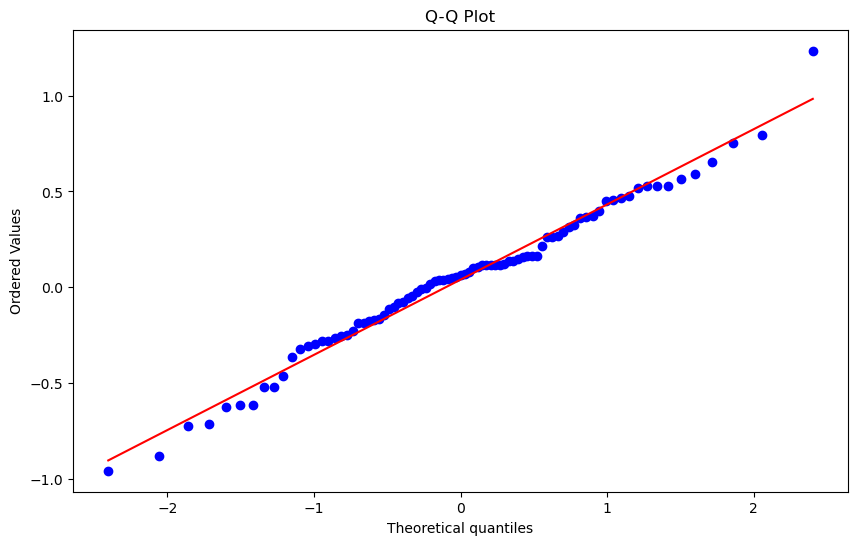

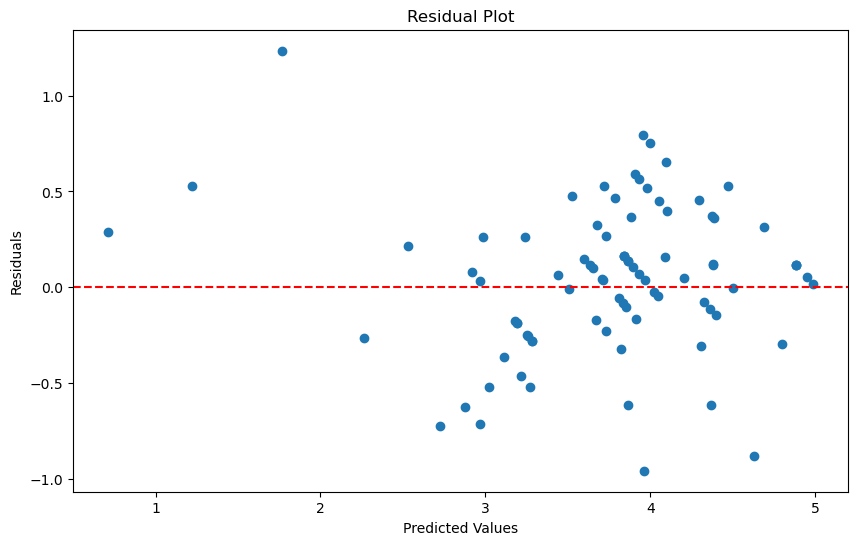

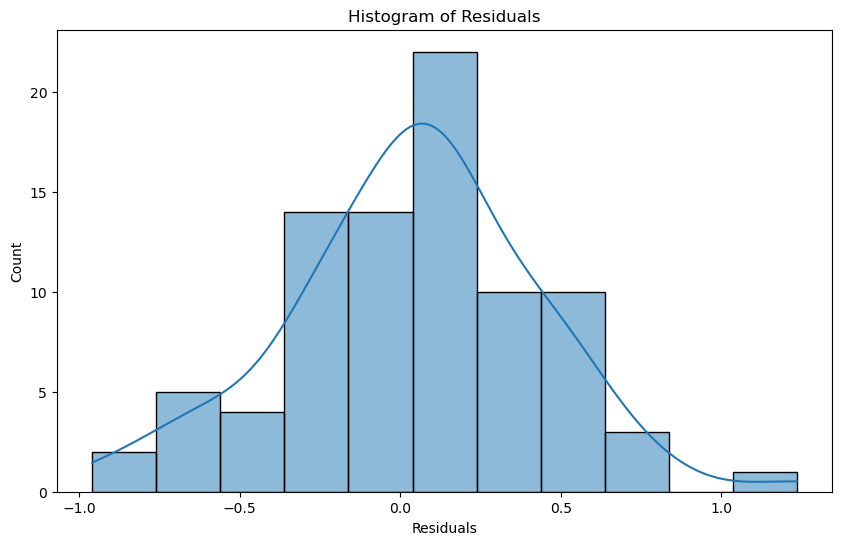

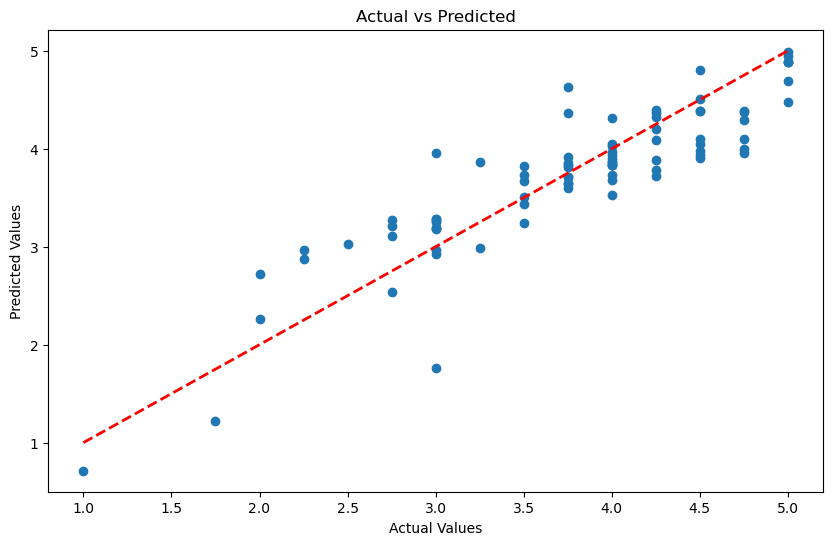


Largest residuals:
Index: 15, Residual: 1.2349, Actual: 3.0000, Predicted: 1.7651
Index: 24, Residual: -0.9592, Actual: 3.0000, Predicted: 3.9592
Index: 247, Residual: -0.8810, Actual: 3.7500, Predicted: 4.6310
Index: 271, Residual: 0.7935, Actual: 4.7500, Predicted: 3.9565
Index: 274, Residual: 0.7519, Actual: 4.7500, Predicted: 3.9981
Index: 402, Residual: -0.7262, Actual: 2.0000, Predicted: 2.7262
Index: 371, Residual: -0.7164, Actual: 2.2500, Predicted: 2.9664
Index: 17, Residual: 0.6549, Actual: 4.7500, Predicted: 4.0951
Index: 90, Residual: -0.6280, Actual: 2.2500, Predicted: 2.8780
Index: 184, Residual: -0.6184, Actual: 3.7500, Predicted: 4.3684

Feature values for largest residuals:
     HM_centered  PU_centered  HMAT_centered  HMPE_centered  AT_centered  \
15     -1.536164    -1.568396       2.304245       2.373083    -1.500000   
24      0.130503    -0.068396       0.021751       0.026778     0.166667   
247     1.130503    -0.818396       0.188417       0.231966     0.16666

C:\Users\cemcd\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(



RF Results:
Testing MSE: 0.13490357944210188
Testing R-squared: 0.8077699654425587

SVR Results:
Testing MSE: 0.0967124510075082
Testing R-squared: 0.8621901814896833

MLP Results:
Testing MSE: 0.11852590738792668
Testing R-squared: 0.8311072295682725


In [230]:
 
features = [
    'HM_centered', 'PU_centered', 'HMAT_centered', 'HMPE_centered', 'AT_centered',
    'HMPU_centered', 'SEI_centered', 'HMPEOU_centered', 'PPV_centered', 'PEOU_centered',
    'PE_centered', 'HMSOI_centered', 'HMSOI_centered_cubed', 'SEI_centered_squared',
    'AGEPPV_centered', 'AGESOI_centered', 'AGEPEOU_centered_squared', 'SOI_centered',
    'SOI_centered_squared', 'GenderSEI_centered_cubed', 'GenderHM_centered',
    'GenderHM_centered_cubed', 'AGE_num', 'Gender_num'
]

X = df_survey_cleaned[features]
y = df_survey_cleaned['BI']  # Replace 'BI' with my actual target variable name

# Create dummy variables for categorical variables
X = pd.get_dummies(X, columns=['AGE_num', 'Gender_num'], drop_first=True)

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a custom wrapper for our models to ensure they have fit and predict methods
class ModelWrapper(BaseEstimator, RegressorMixin):
    def __init__(self, model):
        self.model = model

    def fit(self, X, y):
        self.model.fit(X, y)
        return self

    def predict(self, X):
        return self.model.predict(X)

# Create individual models
mlr = Pipeline([
    ('scaler', StandardScaler()),
    ('model', LinearRegression())
])

rf = Pipeline([
    ('scaler', StandardScaler()),
    ('model', RandomForestRegressor(max_depth=10, max_features='auto', min_samples_leaf=1,
                                    min_samples_split=5, n_estimators=100, random_state=42))
])

svr = Pipeline([
    ('scaler', StandardScaler()),
    ('model', SVR(C=10, epsilon=0.01, gamma=0.001, kernel='sigmoid'))
])

mlp = Pipeline([
    ('scaler', StandardScaler()),
    ('model', MLPRegressor(hidden_layer_sizes=(50, 50), activation='tanh', alpha=0.2,
                           learning_rate='adaptive', learning_rate_init=0.001,
                           solver='sgd', max_iter=2000, random_state=42))
])

# Create the boosting ensemble
boosting_ensemble = AdaBoostRegressor(
    estimator=ModelWrapper(mlr),
    n_estimators=50,
    random_state=42
)

# Fit the boosting ensemble
boosting_ensemble.fit(X_train, y_train)

# Make predictions
y_pred_train = boosting_ensemble.predict(X_train)
y_pred_test = boosting_ensemble.predict(X_test)

# Calculate metrics
mse_train = mean_squared_error(y_train, y_pred_train)
r2_train = r2_score(y_train, y_pred_train)
mse_test = mean_squared_error(y_test, y_pred_test)
r2_test = r2_score(y_test, y_pred_test)
rmse_test = np.sqrt(mse_test)
mae_test = mean_absolute_error(y_test, y_pred_test)
median_ae_test = median_absolute_error(y_test, y_pred_test)
max_err_test = max_error(y_test, y_pred_test)
ev_score_test = explained_variance_score(y_test, y_pred_test)

print("Boosting Ensemble Results:")
print("Training MSE:", mse_train)
print("Training R-squared:", r2_train)
print("Testing MSE:", mse_test)
print("Testing R-squared:", r2_test)
print("Testing RMSE:", rmse_test)
print("Testing MAE:", mae_test)
print("Testing Median AE:", median_ae_test)
print("Testing Max Error:", max_err_test)
print("Testing Explained Variance Score:", ev_score_test)

# Residuals
residuals_train = y_train - y_pred_train
residuals_test = y_test - y_pred_test

# QQ Plot
plt.figure(figsize=(10, 6))
stats.probplot(residuals_test, dist="norm", plot=plt)
plt.title("Q-Q Plot")
plt.show()

# Residual Plot
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_test, residuals_test)
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("Residual Plot")
plt.axhline(y=0, color='r', linestyle='--')
plt.show()

# Histogram of Residuals
plt.figure(figsize=(10, 6))
sns.histplot(residuals_test, kde=True)
plt.xlabel("Residuals")
plt.title("Histogram of Residuals")
plt.show()

# Actual vs Predicted Plot
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_test)
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Actual vs Predicted")
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.show()

# Additional residual analysis
abs_residuals = np.abs(residuals_test)
sorted_indices = abs_residuals.argsort()[::-1]

# Get the 10 largest residuals
n_largest = 10
largest_residuals = residuals_test.iloc[sorted_indices[:n_largest]]
largest_residuals_indices = largest_residuals.index

# Print the largest residuals
print("\nLargest residuals:")
for index in largest_residuals_indices:
    actual = y_test.loc[index]
    predicted = y_pred_test[y_test.index == index]
    residual = residuals_test.loc[index]
    print(f"Index: {index}, Residual: {residual:.4f}, Actual: {actual:.4f}, Predicted: {predicted[0]:.4f}")

# Examine the corresponding feature values
large_residuals_features = X_test.loc[largest_residuals_indices]
print("\nFeature values for largest residuals:")
print(large_residuals_features)

# Calculate some statistics about the residuals
print("\nResiduals Statistics:")
print(f"Mean: {np.mean(residuals_test):.4f}")
print(f"Standard Deviation: {np.std(residuals_test):.4f}")
print(f"Skewness: {pd.Series(residuals_test).skew():.4f}")
print(f"Kurtosis: {pd.Series(residuals_test).kurtosis():.4f}")

# You can also evaluate individual models for comparison
models = [mlr, rf, svr, mlp]
model_names = ['MLR', 'RF', 'SVR', 'MLP']

for name, model in zip(model_names, models):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    print(f"\n{name} Results:")
    print("Testing MSE:", mse)
    print("Testing R-squared:", r2)

## Simple Averaging

C:\Users\cemcd\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


Simple Averaging Ensemble Results:
Testing MSE: 0.10432747295899224
Testing R-squared: 0.8513392023018576
Testing RMSE: 0.32299763615078086
Testing MAE: 0.22579526743549122
Testing Median AE: 0.12795474406900187
Testing Max Error: 1.0312550633642772
Testing Explained Variance Score: 0.8520087149716795


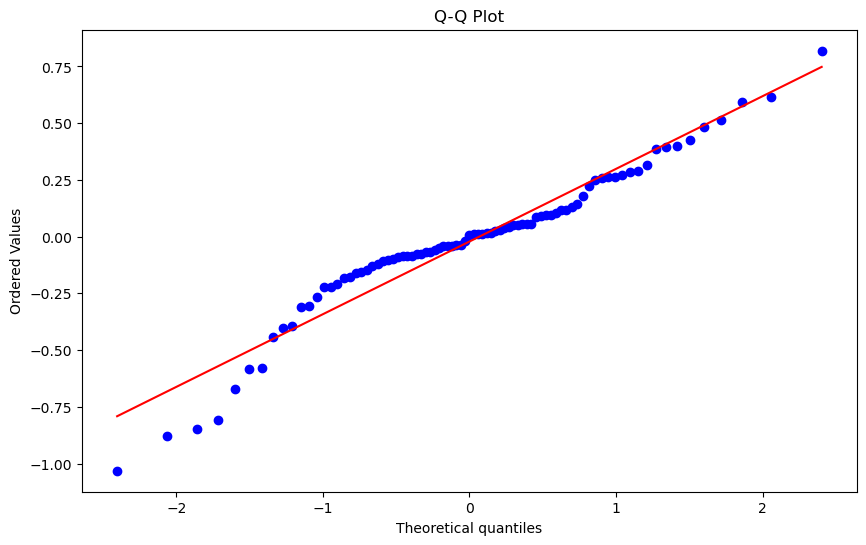

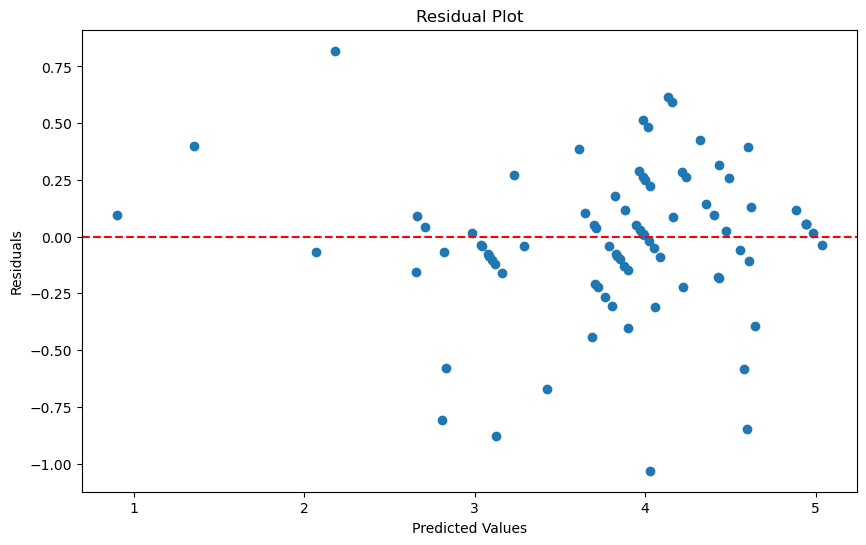

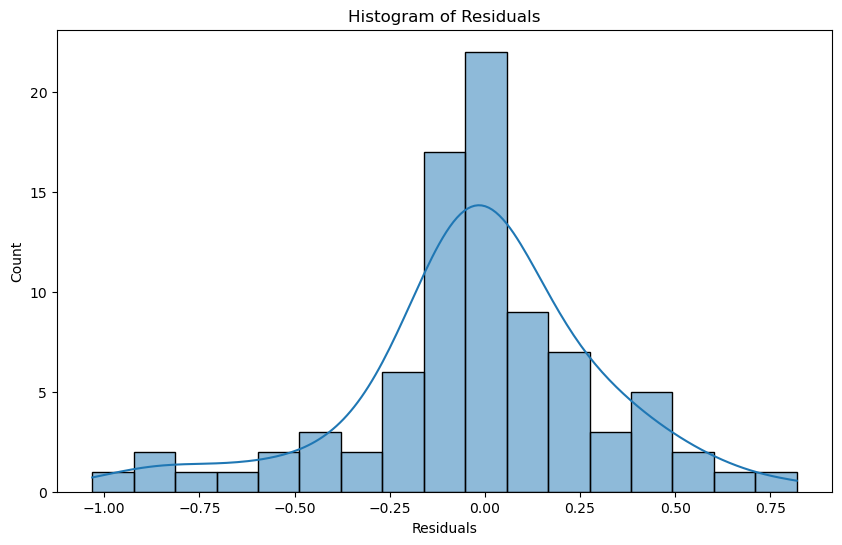

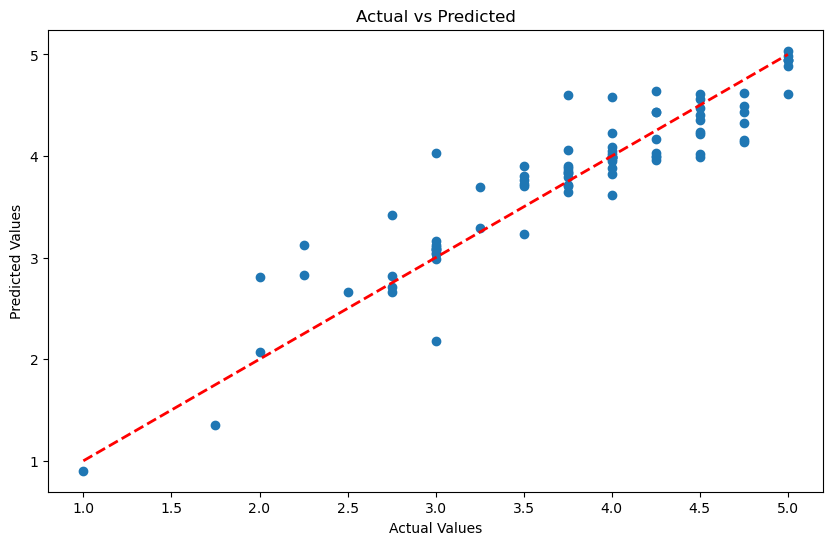


Largest residuals:
Index: 24, Residual: -1.0313, Actual: 3.0000, Predicted: 4.0313
Index: 90, Residual: -0.8781, Actual: 2.2500, Predicted: 3.1281
Index: 184, Residual: -0.8478, Actual: 3.7500, Predicted: 4.5978
Index: 15, Residual: 0.8191, Actual: 3.0000, Predicted: 2.1809
Index: 402, Residual: -0.8093, Actual: 2.0000, Predicted: 2.8093
Index: 46, Residual: -0.6719, Actual: 2.7500, Predicted: 3.4219
Index: 271, Residual: 0.6144, Actual: 4.7500, Predicted: 4.1356
Index: 274, Residual: 0.5929, Actual: 4.7500, Predicted: 4.1571
Index: 336, Residual: -0.5816, Actual: 4.0000, Predicted: 4.5816
Index: 371, Residual: -0.5795, Actual: 2.2500, Predicted: 2.8295

Feature values for largest residuals:
     HM_centered  PU_centered  HMAT_centered  HMPE_centered  AT_centered  \
24      0.130503    -0.068396       0.021751       0.026778     0.166667   
90     -0.869497    -0.068396       1.304245       0.691086    -1.500000   
184     1.130503     1.181604       1.318920       1.362470     1.1666

In [231]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, median_absolute_error, max_error, explained_variance_score
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

 
features = [
    'HM_centered', 'PU_centered', 'HMAT_centered', 'HMPE_centered', 'AT_centered',
    'HMPU_centered', 'SEI_centered', 'HMPEOU_centered', 'PPV_centered', 'PEOU_centered',
    'PE_centered', 'HMSOI_centered', 'HMSOI_centered_cubed', 'SEI_centered_squared',
    'AGEPPV_centered', 'AGESOI_centered', 'AGEPEOU_centered_squared', 'SOI_centered',
    'SOI_centered_squared', 'GenderSEI_centered_cubed', 'GenderHM_centered',
    'GenderHM_centered_cubed', 'AGE_num', 'Gender_num'
]

X = df_survey_cleaned[features]
y = df_survey_cleaned['BI']  # Replace 'BI' with my actual target variable name

# Create dummy variables for categorical variables
X = pd.get_dummies(X, columns=['AGE_num', 'Gender_num'], drop_first=True)

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create individual models
mlr = Pipeline([
    ('scaler', StandardScaler()),
    ('model', LinearRegression())
])

rf = Pipeline([
    ('scaler', StandardScaler()),
    ('model', RandomForestRegressor(max_depth=10, max_features='auto', min_samples_leaf=1,
                                    min_samples_split=5, n_estimators=100, random_state=42))
])

svr = Pipeline([
    ('scaler', StandardScaler()),
    ('model', SVR(C=10, epsilon=0.01, gamma=0.001, kernel='sigmoid'))
])

mlp = Pipeline([
    ('scaler', StandardScaler()),
    ('model', MLPRegressor(hidden_layer_sizes=(50, 50), activation='tanh', alpha=0.2,
                           learning_rate='adaptive', learning_rate_init=0.001,
                           solver='sgd', max_iter=2000, random_state=42))
])

# List of models
models = [mlr, rf, svr, mlp]
model_names = ['MLR', 'RF', 'SVR', 'MLP']

# Train individual models and make predictions
predictions = []
for model in models:
    model.fit(X_train, y_train)
    pred = model.predict(X_test)
    predictions.append(pred)

# Simple averaging ensemble
ensemble_pred = np.mean(predictions, axis=0)

# Calculate metrics for the ensemble
mse_test = mean_squared_error(y_test, ensemble_pred)
r2_test = r2_score(y_test, ensemble_pred)
rmse_test = np.sqrt(mse_test)
mae_test = mean_absolute_error(y_test, ensemble_pred)
median_ae_test = median_absolute_error(y_test, ensemble_pred)
max_err_test = max_error(y_test, ensemble_pred)
ev_score_test = explained_variance_score(y_test, ensemble_pred)

print("Simple Averaging Ensemble Results:")
print("Testing MSE:", mse_test)
print("Testing R-squared:", r2_test)
print("Testing RMSE:", rmse_test)
print("Testing MAE:", mae_test)
print("Testing Median AE:", median_ae_test)
print("Testing Max Error:", max_err_test)
print("Testing Explained Variance Score:", ev_score_test)

# Residuals
residuals_test = y_test - ensemble_pred

# QQ Plot
plt.figure(figsize=(10, 6))
stats.probplot(residuals_test, dist="norm", plot=plt)
plt.title("Q-Q Plot")
plt.show()

# Residual Plot
plt.figure(figsize=(10, 6))
plt.scatter(ensemble_pred, residuals_test)
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("Residual Plot")
plt.axhline(y=0, color='r', linestyle='--')
plt.show()

# Histogram of Residuals
plt.figure(figsize=(10, 6))
sns.histplot(residuals_test, kde=True)
plt.xlabel("Residuals")
plt.title("Histogram of Residuals")
plt.show()

# Actual vs Predicted Plot
plt.figure(figsize=(10, 6))
plt.scatter(y_test, ensemble_pred)
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Actual vs Predicted")
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.show()

# Additional residual analysis
residuals_test = y_test - ensemble_pred
abs_residuals = np.abs(residuals_test)
sorted_indices = abs_residuals.argsort()[::-1]

# Get the 10 largest residuals
n_largest = 10
largest_residuals = residuals_test.iloc[sorted_indices[:n_largest]]
largest_residuals_indices = largest_residuals.index

# Print the largest residuals
print("\nLargest residuals:")
for index in largest_residuals_indices:
    if index in y_test.index:
        actual = y_test.loc[index]
        predicted = ensemble_pred[y_test.index == index][0]
        residual = residuals_test.loc[index]
        print(f"Index: {index}, Residual: {residual:.4f}, Actual: {actual:.4f}, Predicted: {predicted:.4f}")
    else:
        print(f"Index {index} not found in y_test")

# Examine the corresponding feature values
large_residuals_features = X_test.loc[largest_residuals_indices]
print("\nFeature values for largest residuals:")
print(large_residuals_features)

# Calculate some statistics about the residuals
print("\nResiduals Statistics:")
print(f"Mean: {np.mean(residuals_test):.4f}")
print(f"Standard Deviation: {np.std(residuals_test):.4f}")
print(f"Skewness: {pd.Series(residuals_test).skew():.4f}")
print(f"Kurtosis: {pd.Series(residuals_test).kurtosis():.4f}")

# Evaluate individual models for comparison
for name, model in zip(model_names, models):
    y_pred = model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    print(f"\n{name} Results:")
    print("Testing MSE:", mse)
    print("Testing R-squared:", r2)

### Simple Voting using Weights - SVR (1)

C:\Users\cemcd\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:413: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(


Weighted Averaging Ensemble Results:
Testing MSE: 0.09789699018896678
Testing R-squared: 0.86050227959169
Testing RMSE: 0.3128849472073829
Testing MAE: 0.21734567566333
Testing Median AE: 0.1388391022950728
Testing Max Error: 0.9800063879422471
Testing Explained Variance Score: 0.8611972734347634
MLR weight: 0.0757
RF weight: 0.0728
SVR weight: 0.7766
MLP weight: 0.0749


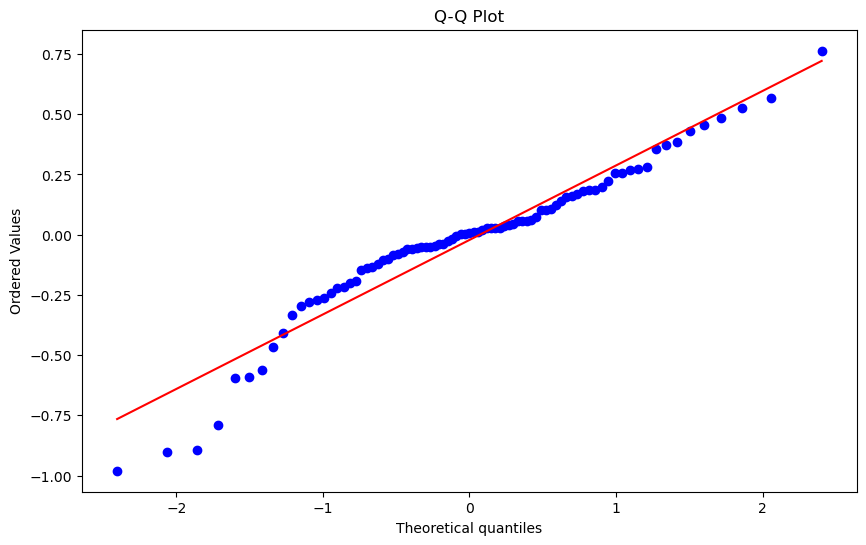

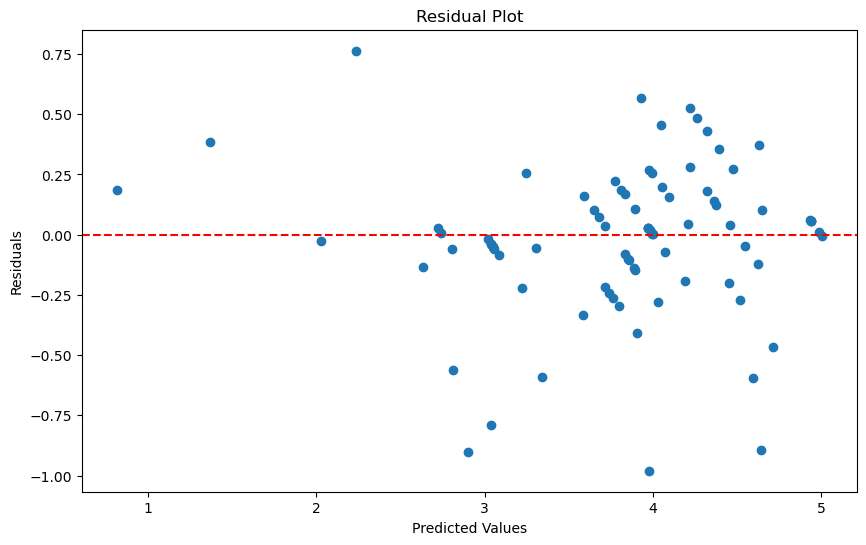

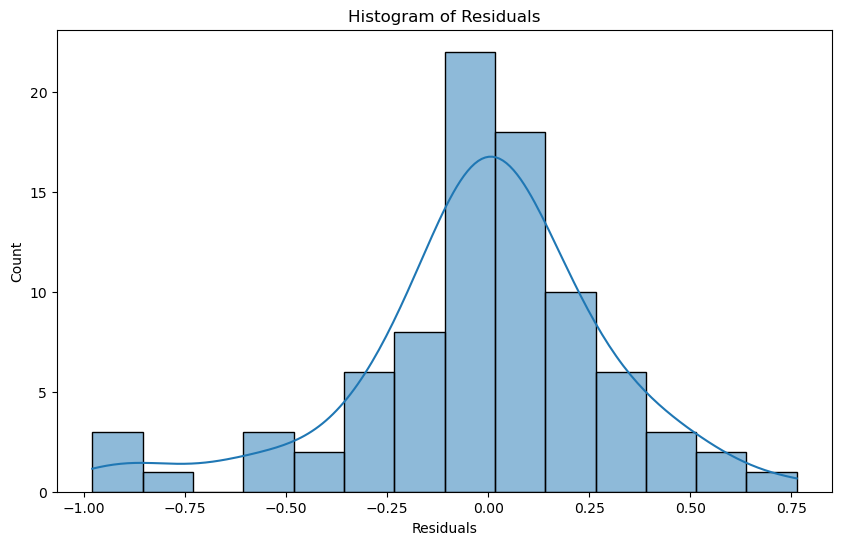


Largest residuals:
Index: 24, Residual: -0.9800, Actual: 3.0000, Predicted: 3.9800
Index: 402, Residual: -0.9007, Actual: 2.0000, Predicted: 2.9007
Index: 184, Residual: -0.8921, Actual: 3.7500, Predicted: 4.6421
Index: 90, Residual: -0.7904, Actual: 2.2500, Predicted: 3.0404
Index: 15, Residual: 0.7636, Actual: 3.0000, Predicted: 2.2364
Index: 336, Residual: -0.5949, Actual: 4.0000, Predicted: 4.5949
Index: 46, Residual: -0.5906, Actual: 2.7500, Predicted: 3.3406
Index: 278, Residual: 0.5689, Actual: 4.5000, Predicted: 3.9311
Index: 371, Residual: -0.5607, Actual: 2.2500, Predicted: 2.8107
Index: 271, Residual: 0.5262, Actual: 4.7500, Predicted: 4.2238

Feature values for largest residuals:
     HM_centered  PU_centered  HMAT_centered  HMPE_centered  AT_centered  \
24      0.130503    -0.068396       0.021751       0.026778     0.166667   
402    -0.869497    -0.818396       0.724581      -1.047908    -0.833333   
184     1.130503     1.181604       1.318920       1.362470     1.1666

In [232]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, median_absolute_error, max_error, explained_variance_score
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats


features = [
    'HM_centered', 'PU_centered', 'HMAT_centered', 'HMPE_centered', 'AT_centered',
    'HMPU_centered', 'SEI_centered', 'HMPEOU_centered', 'PPV_centered', 'PEOU_centered',
    'PE_centered', 'HMSOI_centered', 'HMSOI_centered_cubed', 'SEI_centered_squared',
    'AGEPPV_centered', 'AGESOI_centered', 'AGEPEOU_centered_squared', 'SOI_centered',
    'SOI_centered_squared', 'GenderSEI_centered_cubed', 'GenderHM_centered',
    'GenderHM_centered_cubed', 'AGE_num', 'Gender_num'
]

X = df_survey_cleaned[features]
y = df_survey_cleaned['BI']  # Replace 'BI' with my actual target variable name

# Create dummy variables for categorical variables
X = pd.get_dummies(X, columns=['AGE_num', 'Gender_num'], drop_first=True)

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create individual models
mlr = Pipeline([
    ('scaler', StandardScaler()),
    ('model', LinearRegression())
])

rf = Pipeline([
    ('scaler', StandardScaler()),
    ('model', RandomForestRegressor(max_depth=10, max_features='auto', min_samples_leaf=1,
                                    min_samples_split=5, n_estimators=100, random_state=42))
])

svr = Pipeline([
    ('scaler', StandardScaler()),
    ('model', SVR(C=10, epsilon=0.01, gamma=0.001, kernel='sigmoid'))
])

mlp = Pipeline([
    ('scaler', StandardScaler()),
    ('model', MLPRegressor(hidden_layer_sizes=(50, 50), activation='tanh', alpha=0.2,
                           learning_rate='adaptive', learning_rate_init=0.001,
                           solver='sgd', max_iter=2000, random_state=42))
])

# List of models
models = [mlr, rf, svr, mlp]
model_names = ['MLR', 'RF', 'SVR', 'MLP']

# Train individual models and make predictions
predictions = []
r2_scores = []
for model in models:
    model.fit(X_train, y_train)
    pred = model.predict(X_test)
    predictions.append(pred)
    r2 = r2_score(y_test, pred)
    r2_scores.append(r2)

# Calculate weights based on R-squared scores
weights = np.array(r2_scores)

# Boost the weight for SVR
svr_index = model_names.index('SVR')
boost_factor = 10 # Adjust this factor to increase SVR's influence
weights[svr_index] *= boost_factor

# Normalize weights
weights = weights / np.sum(weights)

# Weighted averaging ensemble
ensemble_pred = np.average(predictions, axis=0, weights=weights)

# Calculate metrics for the ensemble
mse_test = mean_squared_error(y_test, ensemble_pred)
r2_test = r2_score(y_test, ensemble_pred)
rmse_test = np.sqrt(mse_test)
mae_test = mean_absolute_error(y_test, ensemble_pred)
median_ae_test = median_absolute_error(y_test, ensemble_pred)
max_err_test = max_error(y_test, ensemble_pred)
ev_score_test = explained_variance_score(y_test, ensemble_pred)

print("Weighted Averaging Ensemble Results:")
print("Testing MSE:", mse_test)
print("Testing R-squared:", r2_test)
print("Testing RMSE:", rmse_test)
print("Testing MAE:", mae_test)
print("Testing Median AE:", median_ae_test)
print("Testing Max Error:", max_err_test)
print("Testing Explained Variance Score:", ev_score_test)

# Print model weights
for name, weight in zip(model_names, weights):
    print(f"{name} weight: {weight:.4f}")

# Residuals
residuals_test = y_test - ensemble_pred

# QQ Plot
plt.figure(figsize=(10, 6))
stats.probplot(residuals_test, dist="norm", plot=plt)
plt.title("Q-Q Plot")
plt.show()

# Residual Plot
plt.figure(figsize=(10, 6))
plt.scatter(ensemble_pred, residuals_test)
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("Residual Plot")
plt.axhline(y=0, color='r', linestyle='--')
plt.show()

# Histogram of Residuals
plt.figure(figsize=(10, 6))
sns.histplot(residuals_test, kde=True)
plt.xlabel("Residuals")
plt.title("Histogram of Residuals")
plt.show()


# Additional residual analysis
residuals_test = y_test - ensemble_pred
abs_residuals = np.abs(residuals_test)
sorted_indices = abs_residuals.argsort()[::-1]

# Get the 10 largest residuals
n_largest = 10
largest_residuals = residuals_test.iloc[sorted_indices[:n_largest]]
largest_residuals_indices = largest_residuals.index

# Print the largest residuals
print("\nLargest residuals:")
for index in largest_residuals_indices:
    actual = y_test.loc[index]
    predicted = ensemble_pred[y_test.index == index][0]
    residual = residuals_test.loc[index]
    print(f"Index: {index}, Residual: {residual:.4f}, Actual: {actual:.4f}, Predicted: {predicted:.4f}")

# Examine the corresponding feature values
large_residuals_features = X_test.loc[largest_residuals_indices]
print("\nFeature values for largest residuals:")
print(large_residuals_features)

# Calculate some statistics about the residuals
print("\nResiduals Statistics:")
print(f"Mean: {np.mean(residuals_test):.4f}")
print(f"Standard Deviation: {np.std(residuals_test):.4f}")
print(f"Skewness: {pd.Series(residuals_test).skew():.4f}")
print(f"Kurtosis: {pd.Series(residuals_test).kurtosis():.4f}")

# Evaluate individual models for comparison
for name, model in zip(model_names, models):
    y_pred = model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    print(f"\n{name} Results:")
    print("Testing MSE:", mse)
    print("Testing R-squared:", r2)

Top 10 Most Important Features:
HM_centered                 0.207757
HMAT_centered               0.042557
PPV_centered                0.041256
AT_centered                 0.039004
GenderHM_centered_cubed     0.035215
HMPE_centered               0.029870
PU_centered                 0.029048
SOI_centered                0.023136
PEOU_centered               0.019242
AGEPEOU_centered_squared    0.018845
Name: total, dtype: float64


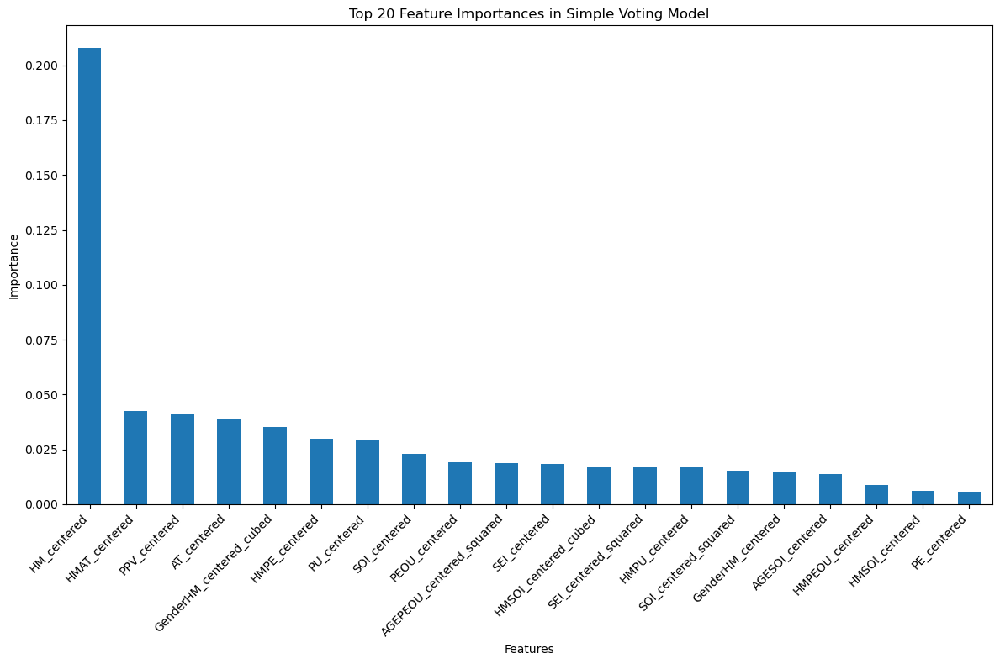

In [233]:
from sklearn.inspection import permutation_importance

# Function to get feature importances
def get_feature_importances(model, X, y, features):
    if isinstance(model.named_steps['model'], LinearRegression):
        importances = np.abs(model.named_steps['model'].coef_)
    elif isinstance(model.named_steps['model'], RandomForestRegressor):
        importances = model.named_steps['model'].feature_importances_
    else:
        perm_importance = permutation_importance(model, X, y, n_repeats=10, random_state=42)
        importances = perm_importance.importances_mean
    return pd.Series(importances, index=features)

# Get feature importances for each model
importances = []
for model, name in zip(models, model_names):
    imp = get_feature_importances(model, X_test, y_test, X.columns)
    importances.append(imp)

# Combine importances using ensemble weights
combined_importance = pd.DataFrame(importances).T * weights
combined_importance['total'] = combined_importance.sum(axis=1)
combined_importance = combined_importance.sort_values('total', ascending=False)

print("Top 10 Most Important Features:")
print(combined_importance['total'].head(10))

# Visualize feature importances
plt.figure(figsize=(12, 8))
combined_importance['total'].head(20).plot(kind='bar')
plt.title('Top 20 Feature Importances in Simple Voting Model')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()